In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils as utils
import torchvision.transforms as transforms

from torch.autograd import Variable

import os
import time

from PIL.Image import BICUBIC
from torchvision.datasets import MNIST
from ram import RecurrentAttentionModel
from trainer import *

### MNIST dataset
Testing out this model and training algorithm implementation on the basic MNIST dataset, which is pretty simple so hopefully everything goes well.

In [2]:
num_train_data_copies = 1  # Number of times to load the training dataset (with augmentation)
num_eval_data_copies = 1   # Number of times to load the evaluation dataset (with augmentation)
test_val_split = 0.5       # Percentage of the test set to use as validation data
batch_size = 20            # Batch size for training
eval_batch_size = 20       # Batch size for validation and testing

# Image parameters
num_classes = 10       # Digits 0-9
image_size = 28        # MNIST images are 28x28 b/w images
in_channels = 1        # Number of color channels in the inputs (MNIST dataset is grayscale)

glimpse_sizes = [8]  #[5, 10, 18]
padding = int(np.ceil(glimpse_sizes[-1] / 2))
padded_img_size = image_size + 2*padding

In [3]:
# Down/load MNIST data
mnist_data_loc = os.path.join('data', 'mnist')
data_transforms = transforms.Compose([ # Keep things pretty basic for now
    # Pad images with 0s so the GlimpseSensor won't have to
    transforms.Pad(padding = padding),
    # Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255]
    # to a torch.FloatTensor of shape (C x H x W) in the range [0.0, 1.0]
    transforms.ToTensor(),
])

'''
Can increase the number of images in each dataset by loading up the data again,
applying the (random) transformations, then concatenating it all together
'''
### Training Dataset and DataLoader
all_train_datasets = [
    MNIST(
        root = mnist_data_loc, train = True,
        download = True, transform = data_transforms
    ) for _ in range(num_train_data_copies)
]
train_datasets = utils.data.ConcatDataset(all_train_datasets)
train_data = utils.data.DataLoader(train_datasets, batch_size = batch_size, shuffle = True)
num_train_data = len(train_datasets)
num_train_batches = len(train_data)

### Validation and Test Dataset and DataLoader
all_eval_datasets = [
    MNIST(
        root = mnist_data_loc, train = False,
        download = True, transform = data_transforms
    ) for _ in range(num_eval_data_copies)
]
eval_datasets = utils.data.ConcatDataset(all_eval_datasets)
num_eval_data = len(eval_datasets)

eval_split_pt = int(test_val_split * num_eval_data)
eval_idx = list(range(num_eval_data))
np.random.shuffle(eval_idx)

val_idx, test_idx = eval_idx[:eval_split_pt], eval_idx[eval_split_pt:]

val_sampler = utils.data.sampler.SubsetRandomSampler(val_idx)
val_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = val_sampler
)
num_val_data = len(val_sampler)
num_val_batches = len(val_data)

test_sampler = utils.data.sampler.SubsetRandomSampler(test_idx)
test_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = test_sampler
)
num_test_data = len(test_sampler)
num_test_batches = len(test_data)

print('Num:\n- train data: %d (%d batches)\n- val data: %d (%d batches)\n- test data: %d (%d batches)' % (
    num_train_data, num_train_batches, num_val_data, num_val_batches, num_test_data, num_test_batches
))

Num:
- train data: 60000 (3000 batches)
- val data: 5000 (250 batches)
- test data: 5000 (250 batches)


In [4]:
# Basic training hyperparameters
lr = 0.5
min_lr = 1e-5/lr
grad_clip = 4
lr_step_size = 1
steps_per_epoch = int(num_train_data_copies * 15)  # Number of times to step the lr scheduler in an epoch
warmup_steps = 8*steps_per_epoch
decay_rate = 1

# RL training hyperparameters
end_train_ep_early = False     # End each training episode early after a correct classification
assert (end_train_ep_early and batch_size == 1) or not end_train_ep_early
max_ep_len = 6                 # Maximum number of glimpses per episode
num_epochs = 400               # Number of times to go through all of the training examples
early_stopping = int(num_epochs * 0.02)

random_start_loc = True
error_penalty = 0.  # Amount of penalty to apply each time the agent makes an incorrect classification (<= 0.)
gamma = 1.0         # Reward discount factor

# Etc
log_freq = num_train_batches // 6    # How often to print a training log in an epoch
viz_freq = num_train_batches // 3     # How often to visualize the glimpses in an epoch
eval_viz_freq = num_val_batches // 2  # How often to visualize the glimpses in an epoch

### Model
Need to modify class implementation so that any recurrent `nn.Module` instance can be passed in when initializing a new `RecurrentAttentionModel` to make it easier to try this visual attention mechanism out with different core recurrent networks.

In [5]:
# Model hyperparameters
glimpse_g_size = 128    # Size of the transformed Glimpse representation in the GlimpseNetwork
loc_g_size = 128        # Size of the transformed location representation in the GlimpseNetwork
glimpse_net_size = 256  # Size of the GlimpseNetwork output
rnn_state_size = 256
sensor_size = 8         # Size of the glimpses after resizing
g_rep_op = 'add'

dropout = 0.1
# Standard deviation to use when sampling the glimpse location coordinates from a normal distribution
loc_std = 0.22

In [6]:
# Initialize the network
model = RecurrentAttentionModel(
    image_size = image_size, in_channels = in_channels,
    glimpse_g_size = glimpse_g_size, loc_g_size = loc_g_size,
    glimpse_net_size = glimpse_net_size, g_rep_op = g_rep_op,
    rnn_state_size = rnn_state_size, num_actions = num_classes,
    sensor_size = sensor_size, glimpse_sizes = glimpse_sizes,
    pad_imgs = False, padding = padding, dropout = dropout
)
num_parameters = sum([p.numel() for p in model.parameters()])
print('Model has %d parameters' % num_parameters)

# Criterion, optimizer, learning rate scheduler
class_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = lr)
lr_scheduler = get_lr_scheduler(glimpse_net_size, warmup_steps, decay_rate, optimizer, min_lr)

Model has 604173 parameters


Comparing the learning rate scheduling I'm using to an exponential decay:

((0.1378785038576095, 0.12212329552427727),
 (0.09999999999999967, 0.029938039131232993))

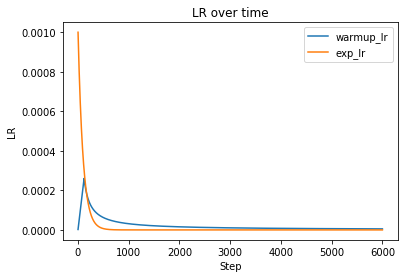

In [7]:
# Define the schedulers
get_warmup_lr = lambda e: glimpse_net_size**(-0.5) * min(
    (e+1)**(-decay_rate), (e+1)*warmup_steps**(-(decay_rate+1))
)
get_exp_lr = lambda e: 0.99**e

# Get the actual LR schedulers
total_steps = steps_per_epoch * num_epochs
warmup_lr = [lr*get_warmup_lr(e) for e in range(total_steps)]
exp_lr = [1e-3*get_exp_lr(e) for e in range(total_steps)]

# Plot them
plt.plot(range(1, total_steps+1), warmup_lr)
plt.plot(range(1, total_steps+1), exp_lr)
plt.legend(['warmup_lr', 'exp_lr'])
plt.xlabel('Step'); plt.ylabel('LR')
plt.title('LR over time')
(sum(warmup_lr), sum(warmup_lr[warmup_steps:])), (sum(exp_lr), sum(exp_lr[warmup_steps:]))

Epoch   1/400) lr = 1e-05
 b    500/  3000 >> 137.1 ms/b | lr: 1.00e-05 | grad 2norm:  2.31 | grad inf norm:  1.738
       Weights || abs max:  0.29 (31051.05) | mean:  5.45e-05 ( 0.11) | var: 1.61e-03 (91904.76)
        Biases || abs max:  0.00 (75509.07) | mean:  2.43e-05 (104.26) | var: 1.76e-07 (59854096.00)
                  class loss: 2.298 | steps: 4.928 | reward:  0.120 | acc.: 11.98%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 140.7 ms/b | lr: 1.09e-05 | grad 2norm:  3.04 | grad inf norm:  2.372
       Weights || abs max:  0.29 (17785.77) | mean:  1.55e-04 ( 0.09) | var: 1.61e-03 ( 7697.52)
        Biases || abs max:  0.01 (26814.87) | mean:  2.92e-04 (32.30) | var: 1.21e-06 (12068874.00)
                  class loss: 2.278 | steps: 4.681 | reward:  0.169 | acc.: 16.94%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted reward

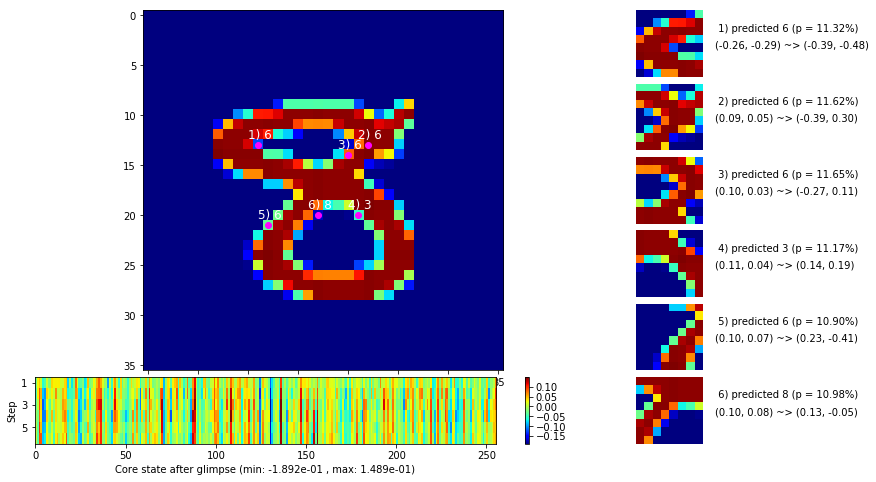

 b   1500/  3000 >> 147.0 ms/b | lr: 1.74e-05 | grad 2norm:  3.91 | grad inf norm:  3.066
       Weights || abs max:  0.30 (66953.01) | mean:  4.58e-04 ( 0.18) | var: 1.62e-03 (1473605.00)
        Biases || abs max:  0.01 ( 9234.12) | mean:  1.09e-03 (13.10) | var: 4.78e-06 (654704.19)
                  class loss: 2.248 | steps: 4.512 | reward:  0.237 | acc.: 23.74%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 139.0 ms/b | lr: 2.17e-05 | grad 2norm:  5.07 | grad inf norm:  2.508
       Weights || abs max:  0.31 (51896.59) | mean:  1.43e-03 ( 0.22) | var: 1.64e-03 (91480.94)
        Biases || abs max:  0.03 (13402.19) | mean:  3.51e-03 (13.33) | var: 2.02e-05 (3719457.25)
                  class loss: 2.105 | steps: 4.472 | reward:  0.287 | acc.: 28.68%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

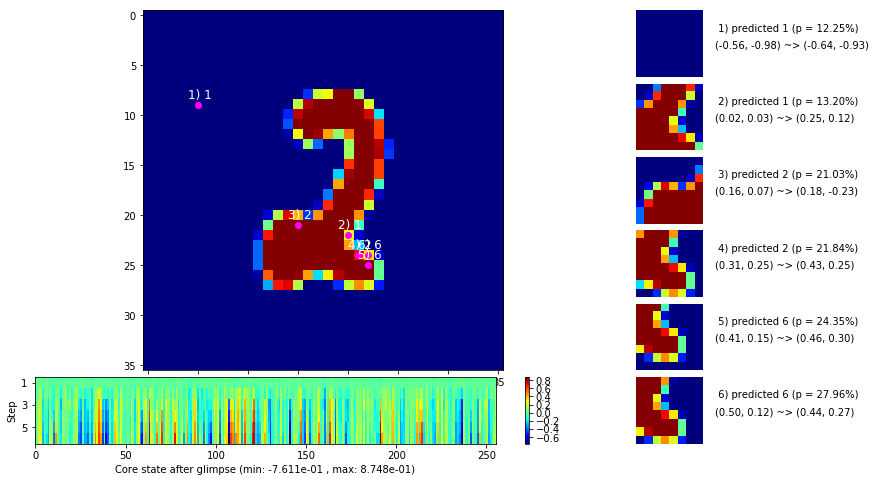

 b   2500/  3000 >> 140.3 ms/b | lr: 2.82e-05 | grad 2norm:  7.79 | grad inf norm:  2.510
       Weights || abs max:  0.32 (113199.84) | mean:  2.33e-03 ( 0.37) | var: 1.67e-03 (2260267.50)
        Biases || abs max:  0.03 ( 6016.15) | mean:  5.89e-03 ( 8.55) | var: 3.90e-05 (213324.75)
                  class loss: 2.001 | steps: 4.443 | reward:  0.274 | acc.: 27.36%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.5 ms/b | lr: 3.26e-05 | grad 2norm:  7.54 | grad inf norm:  2.319
       Weights || abs max:  0.33 (55127.02) | mean:  2.67e-03 ( 0.27) | var: 1.69e-03 (75925.55)
        Biases || abs max:  0.04 (24047.18) | mean:  7.07e-03 (18.41) | var: 5.20e-05 (18597152.00)
                  class loss: 2.019 | steps: 4.497 | reward:  0.262 | acc.: 26.24%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.

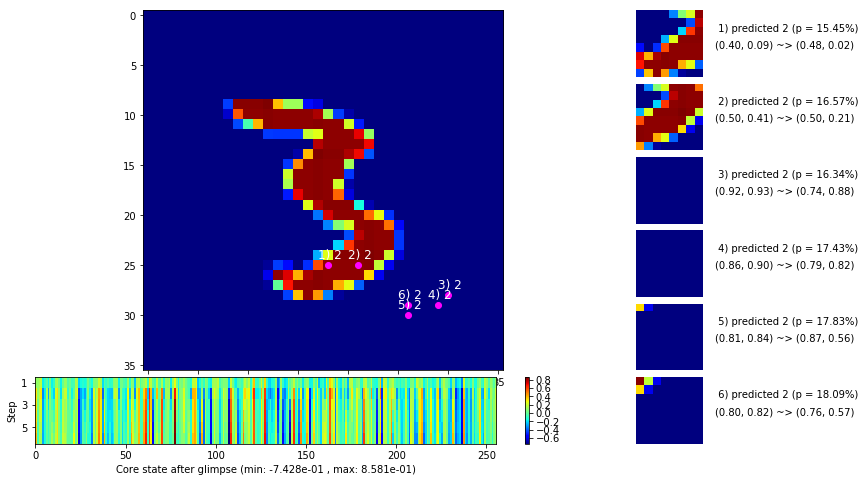

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


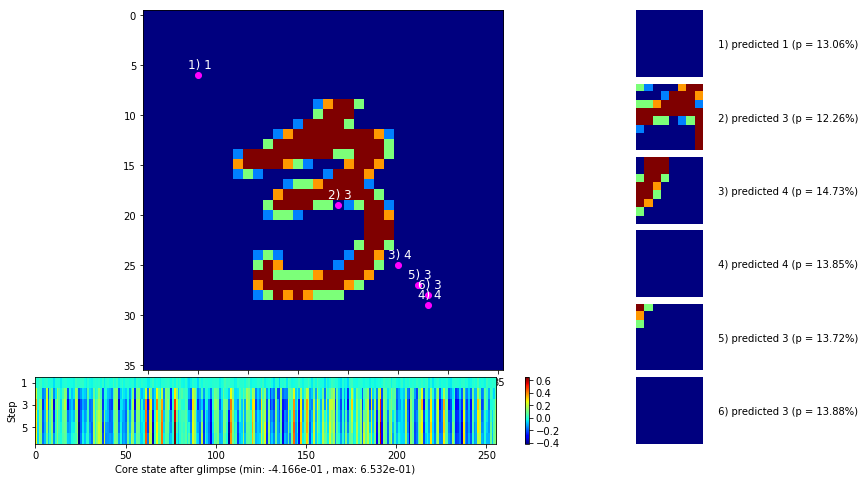


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


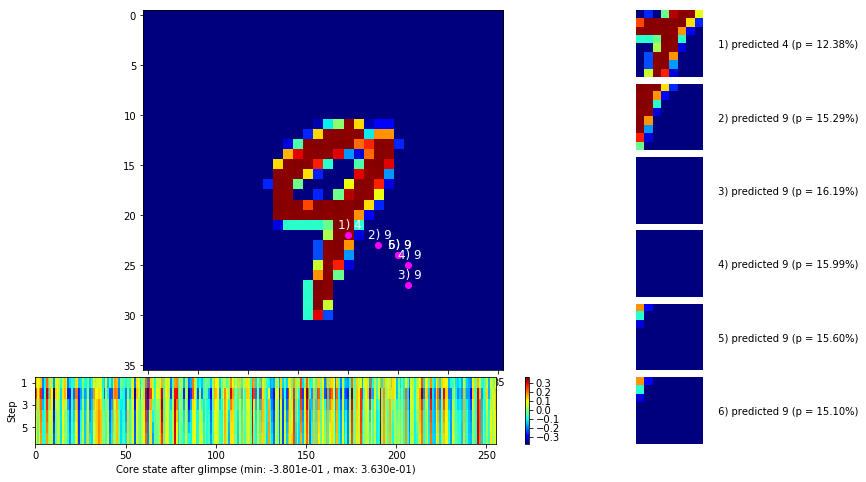

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


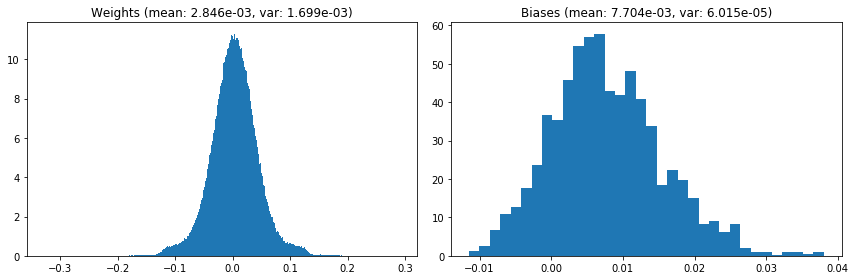

                                      Location network weights and biases


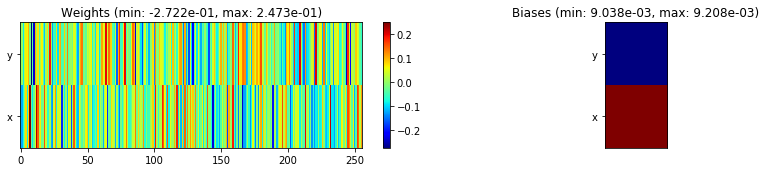

---------------------------------------------------------------------------------------------------------------
Elapsed time:  420.34 sec | TRAIN >> class loss: 2.1579 | steps:  4.589    | reward:  0.2249    | acc.: 22.490% 
                          | VAL   >> class loss: 1.9551 | steps:  4.000    | reward:  0.3362    | acc.: 33.620% 


Epoch   2/400) lr = 3.472e-05
 b    500/  3000 >> 134.2 ms/b | lr: 3.91e-05 | grad 2norm:  7.28 | grad inf norm:  2.141
       Weights || abs max:  0.33 (52131.65) | mean:  2.92e-03 ( 0.28) | var: 1.71e-03 (57836.33)
        Biases || abs max:  0.04 (18313.43) | mean:  8.12e-03 (15.40) | var: 6.74e-05 (3791027.50)
                  class loss: 2.037 | steps: 4.561 | reward:  0.253 | acc.: 25.30%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.3 ms/b | lr: 4.34e-05 | grad 2norm:  7.80 | grad inf norm:  2.234
       Weights || abs max:  0.33 (113020.71) | mean:  3.04e-03 ( 0.39) | 

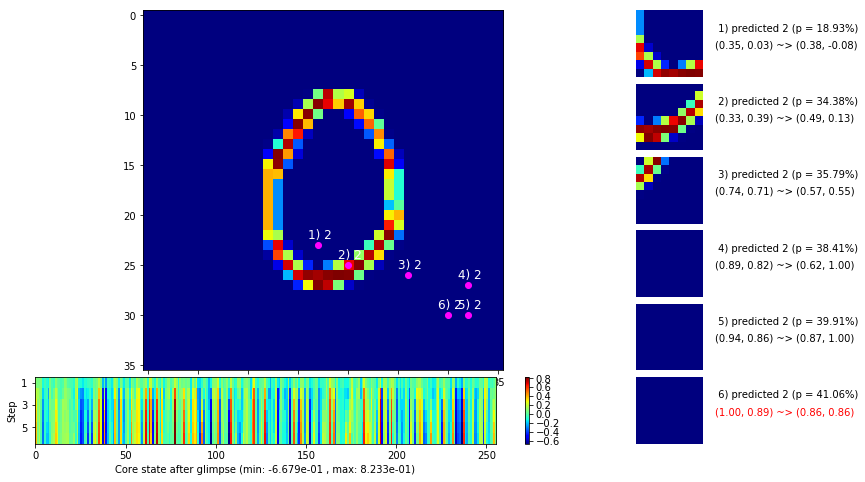

 b   1500/  3000 >> 138.3 ms/b | lr: 4.99e-05 | grad 2norm:  8.02 | grad inf norm:  2.259
       Weights || abs max:  0.33 (56172.03) | mean:  3.10e-03 ( 0.31) | var: 1.74e-03 (48367.54)
        Biases || abs max:  0.04 (32480.24) | mean:  9.36e-03 (23.06) | var: 9.41e-05 (10658405.00)
                  class loss: 2.005 | steps: 4.601 | reward:  0.274 | acc.: 27.43%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 137.4 ms/b | lr: 5.43e-05 | grad 2norm:  8.43 | grad inf norm:  2.251
       Weights || abs max:  0.33 (187214.53) | mean:  3.15e-03 ( 0.53) | var: 1.75e-03 (11639312.00)
        Biases || abs max:  0.04 (23324.13) | mean:  9.86e-03 (18.72) | var: 1.08e-04 (3348201.75)
                  class loss: 1.990 | steps: 4.633 | reward:  0.277 | acc.: 27.67%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 

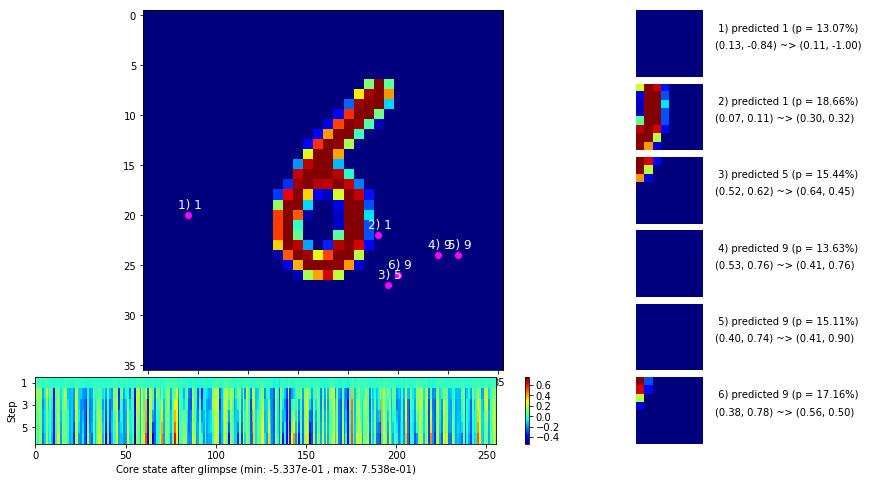

 b   2500/  3000 >> 134.8 ms/b | lr: 6.08e-05 | grad 2norm:  8.77 | grad inf norm:  2.358
       Weights || abs max:  0.34 (53156.46) | mean:  3.18e-03 ( 0.31) | var: 1.77e-03 (66980.60)
        Biases || abs max:  0.05 (26613.22) | mean:  1.03e-02 (19.43) | var: 1.21e-04 (21687774.00)
                  class loss: 1.944 | steps: 4.568 | reward:  0.299 | acc.: 29.92%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 138.1 ms/b | lr: 6.51e-05 | grad 2norm:  9.18 | grad inf norm:  2.391
       Weights || abs max:  0.34 (91468.46) | mean:  3.24e-03 ( 0.37) | var: 1.79e-03 (592212.50)
        Biases || abs max:  0.06 (28291.54) | mean:  1.09e-02 (18.47) | var: 1.39e-04 (13268847.00)
                  class loss: 1.915 | steps: 4.549 | reward:  0.314 | acc.: 31.37%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.

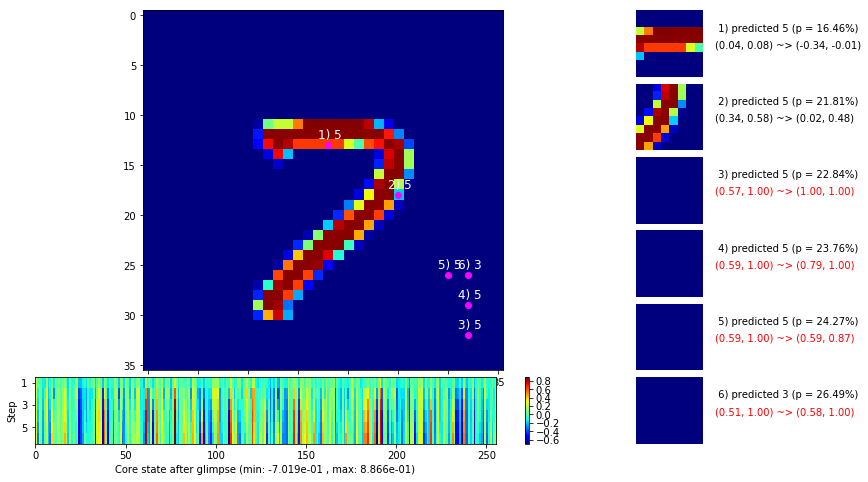

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


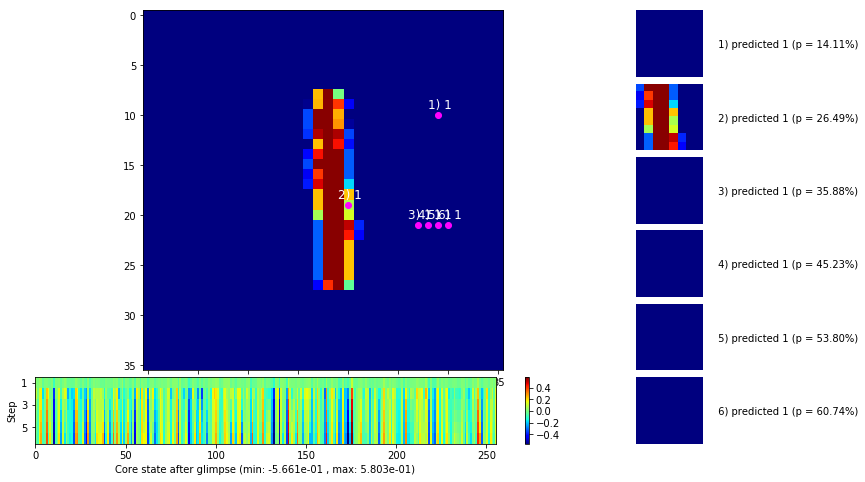


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


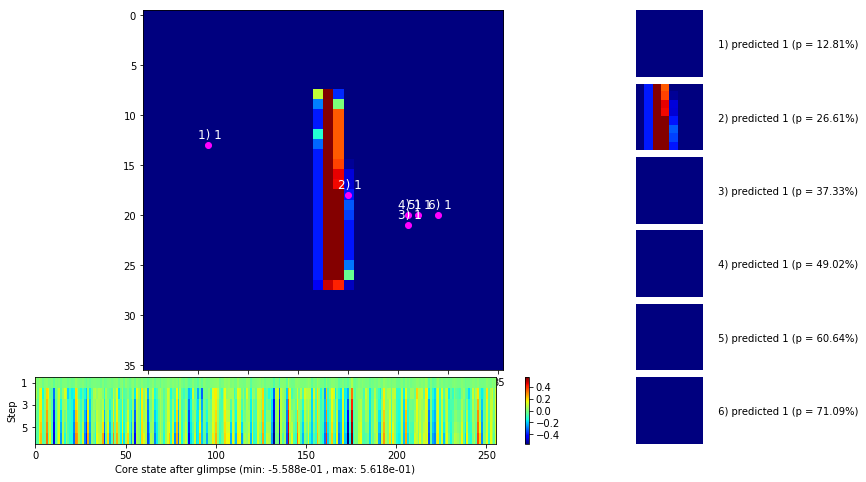

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


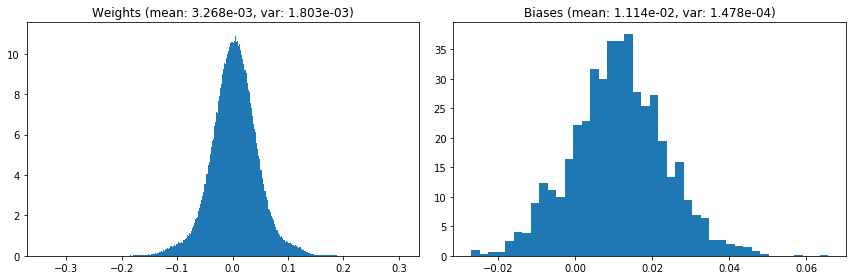

                                      Location network weights and biases


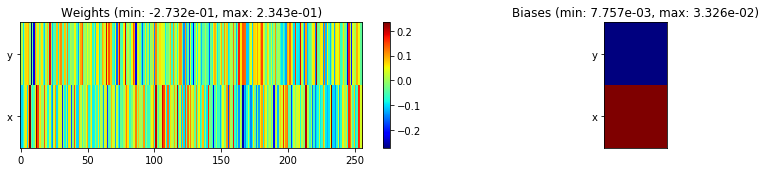

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.66 sec | TRAIN >> class loss: 1.9862 | steps:  4.583    | reward:  0.2797    | acc.: 27.967% 
                          | VAL   >> class loss: 1.8066 | steps:  4.314 :( | reward:  0.3908    | acc.: 39.080% 


Epoch   3/400) lr = 6.727e-05
 b    500/  3000 >> 137.1 ms/b | lr: 7.16e-05 | grad 2norm:  9.24 | grad inf norm:  2.368
       Weights || abs max:  0.34 (74109.91) | mean:  3.30e-03 ( 0.33) | var: 1.81e-03 (268285.34)
        Biases || abs max:  0.07 (140126.28) | mean:  1.14e-02 (62.36) | var: 1.57e-04 (2449056000.00)
                  class loss: 1.887 | steps: 4.495 | reward:  0.326 | acc.: 32.61%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 137.1 ms/b | lr: 7.60e-05 | grad 2norm:  8.91 | grad inf norm:  2.357
       Weights || abs max:  0.34 (69827.80) | mean:  3.28e-03 ( 0.32

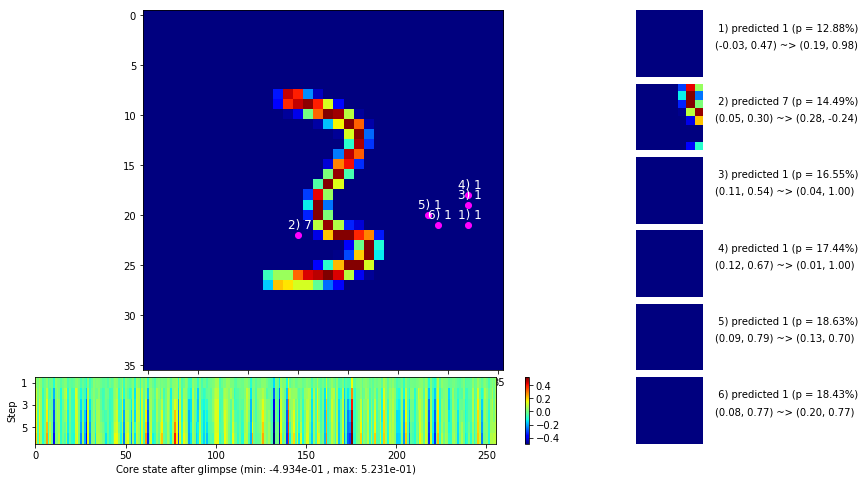

 b   1500/  3000 >> 138.3 ms/b | lr: 8.25e-05 | grad 2norm:  8.97 | grad inf norm:  2.373
       Weights || abs max:  0.34 (58435.37) | mean:  3.32e-03 ( 0.30) | var: 1.86e-03 (111199.35)
        Biases || abs max:  0.09 (41821.22) | mean:  1.22e-02 (24.76) | var: 1.94e-04 (75048056.00)
                  class loss: 1.870 | steps: 4.468 | reward:  0.335 | acc.: 33.48%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.4 ms/b | lr: 8.68e-05 | grad 2norm:  8.91 | grad inf norm:  2.303
       Weights || abs max:  0.34 (104075.85) | mean:  3.36e-03 ( 0.38) | var: 1.88e-03 (1056512.12)
        Biases || abs max:  0.10 (10054.97) | mean:  1.28e-02 ( 9.63) | var: 2.18e-04 (319389.75)
                  class loss: 1.833 | steps: 4.419 | reward:  0.347 | acc.: 34.71%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

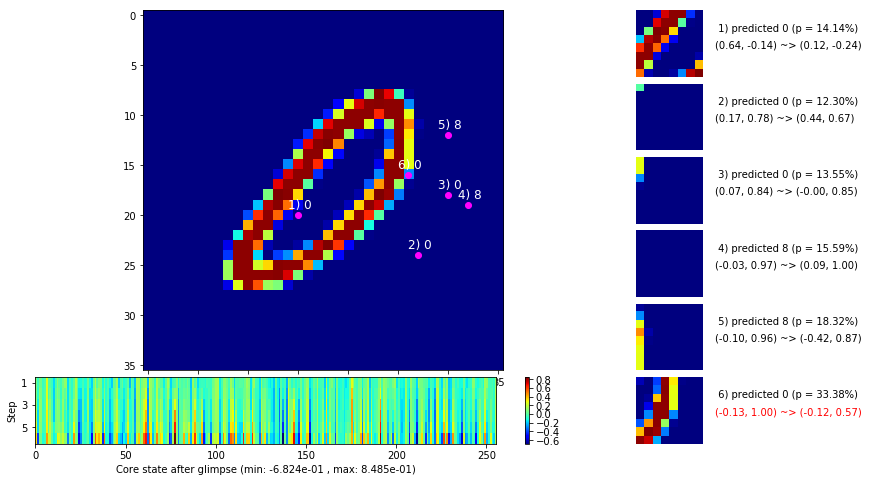

 b   2500/  3000 >> 136.9 ms/b | lr: 9.33e-05 | grad 2norm:  9.07 | grad inf norm:  2.356
       Weights || abs max:  0.34 (157524.84) | mean:  3.37e-03 ( 0.47) | var: 1.91e-03 (5807647.00)
        Biases || abs max:  0.11 (19845.81) | mean:  1.33e-02 (13.64) | var: 2.43e-04 (10329139.00)
                  class loss: 1.821 | steps: 4.407 | reward:  0.350 | acc.: 35.04%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 142.0 ms/b | lr: 9.77e-05 | grad 2norm:  9.30 | grad inf norm:  2.394
       Weights || abs max:  0.35 (57358.43) | mean:  3.39e-03 ( 0.30) | var: 1.95e-03 (205294.33)
        Biases || abs max:  0.12 (10698.35) | mean:  1.41e-02 ( 9.64) | var: 2.70e-04 (1184093.25)
                  class loss: 1.790 | steps: 4.369 | reward:  0.366 | acc.: 36.58%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 

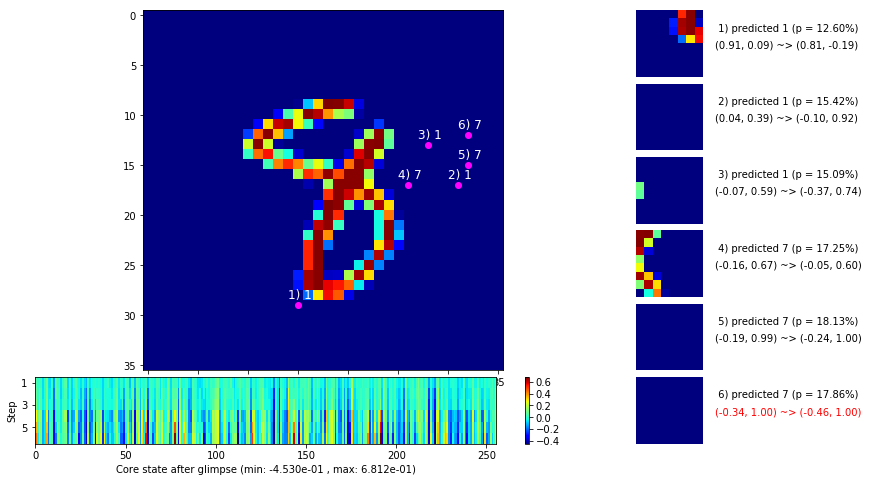

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


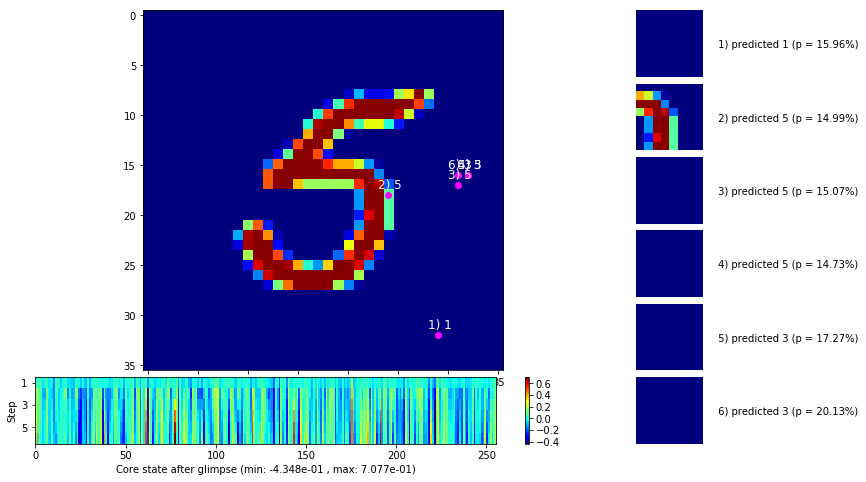


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


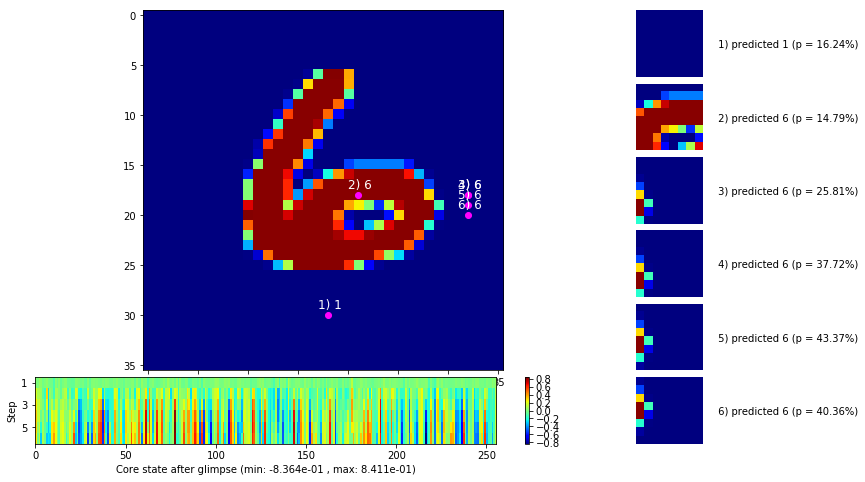

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


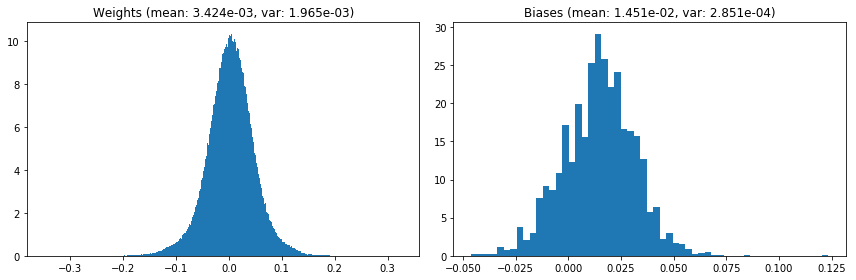

                                      Location network weights and biases


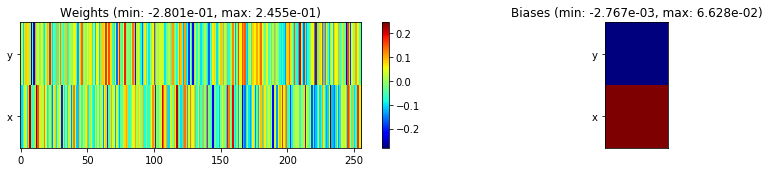

---------------------------------------------------------------------------------------------------------------
Elapsed time:  413.38 sec | TRAIN >> class loss: 1.8491 | steps:  4.441    | reward:  0.3424    | acc.: 34.243% 
                          | VAL   >> class loss: 1.6229 | steps:  4.184 :( | reward:  0.4326    | acc.: 43.260% 


Epoch   4/400) lr = 9.983e-05
 b    500/  3000 >> 141.3 ms/b | lr: 1.04e-04 | grad 2norm:  9.10 | grad inf norm:  2.324
       Weights || abs max:  0.35 (54482.95) | mean:  3.38e-03 ( 0.30) | var: 1.98e-03 (76595.12)
        Biases || abs max:  0.13 ( 9506.50) | mean:  1.47e-02 ( 8.87) | var: 2.97e-04 (540299.75)
                  class loss: 1.783 | steps: 4.371 | reward:  0.368 | acc.: 36.77%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 143.4 ms/b | lr: 1.09e-04 | grad 2norm:  9.65 | grad inf norm:  2.335
       Weights || abs max:  0.35 (49848.77) | mean:  3.43e-03 ( 0.28) | va

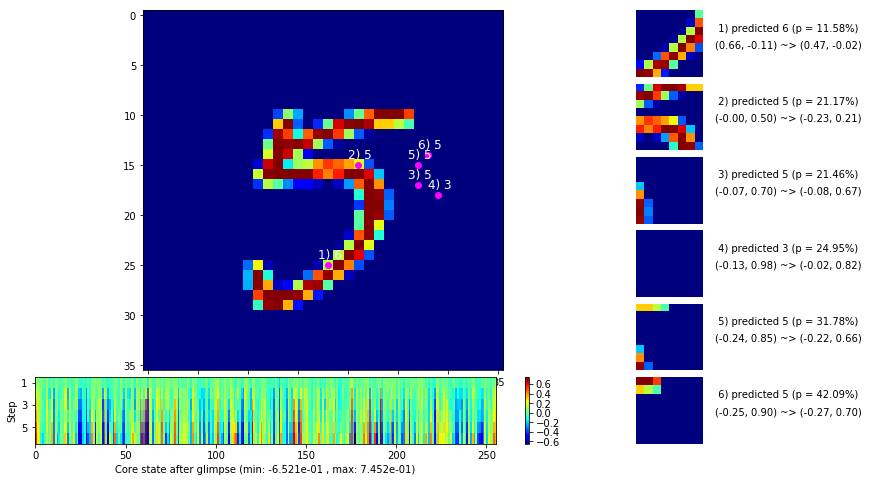

 b   1500/  3000 >> 142.8 ms/b | lr: 1.15e-04 | grad 2norm:  9.78 | grad inf norm:  2.486
       Weights || abs max:  0.35 (86708.13) | mean:  3.36e-03 ( 0.34) | var: 2.07e-03 (1284103.50)
        Biases || abs max:  0.15 (17367.35) | mean:  1.60e-02 (12.40) | var: 3.56e-04 (9394785.00)
                  class loss: 1.679 | steps: 4.323 | reward:  0.408 | acc.: 40.83%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 142.8 ms/b | lr: 1.19e-04 | grad 2norm:  9.79 | grad inf norm:  2.350
       Weights || abs max:  0.35 (58620.56) | mean:  3.31e-03 ( 0.29) | var: 2.13e-03 (142549.66)
        Biases || abs max:  0.17 ( 9052.72) | mean:  1.68e-02 ( 7.99) | var: 3.89e-04 (503790.91)
                  class loss: 1.591 | steps: 4.184 | reward:  0.439 | acc.: 43.90%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0

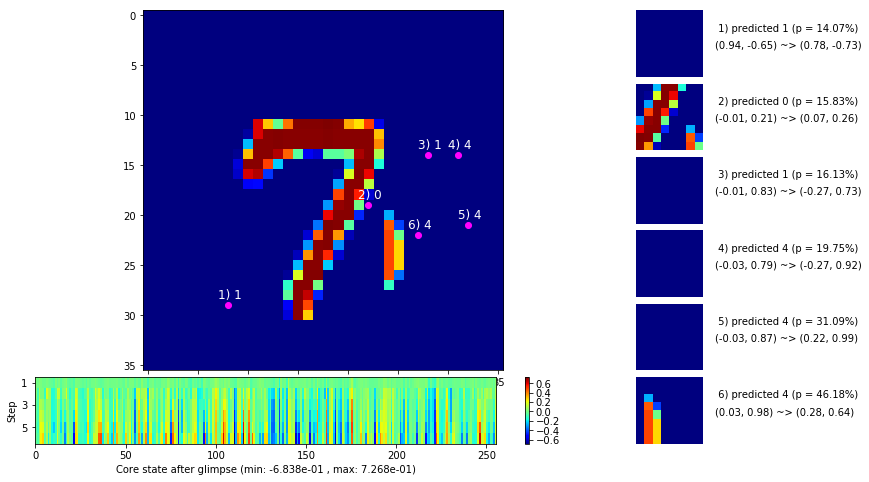

 b   2500/  3000 >> 139.7 ms/b | lr: 1.26e-04 | grad 2norm: 10.29 | grad inf norm:  2.595
       Weights || abs max:  0.36 (58758.96) | mean:  3.31e-03 ( 0.29) | var: 2.19e-03 (72894.47)
        Biases || abs max:  0.18 (13713.58) | mean:  1.77e-02 (10.77) | var: 4.21e-04 (1687820.62)
                  class loss: 1.549 | steps: 4.165 | reward:  0.456 | acc.: 45.61%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 138.4 ms/b | lr: 1.30e-04 | grad 2norm:  9.96 | grad inf norm:  2.434
       Weights || abs max:  0.36 (96235.22) | mean:  3.32e-03 ( 0.36) | var: 2.26e-03 (662205.56)
        Biases || abs max:  0.19 ( 9928.29) | mean:  1.85e-02 ( 8.79) | var: 4.59e-04 (886818.88)
                  class loss: 1.544 | steps: 4.157 | reward:  0.456 | acc.: 45.59%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

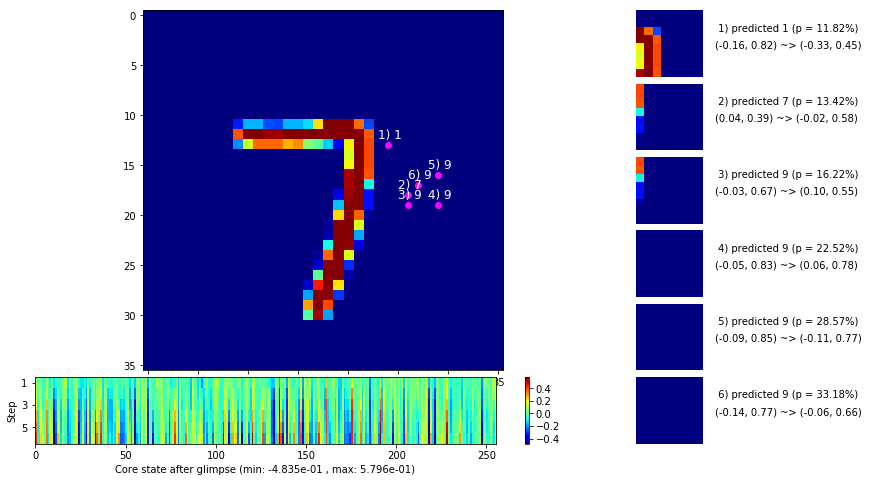

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


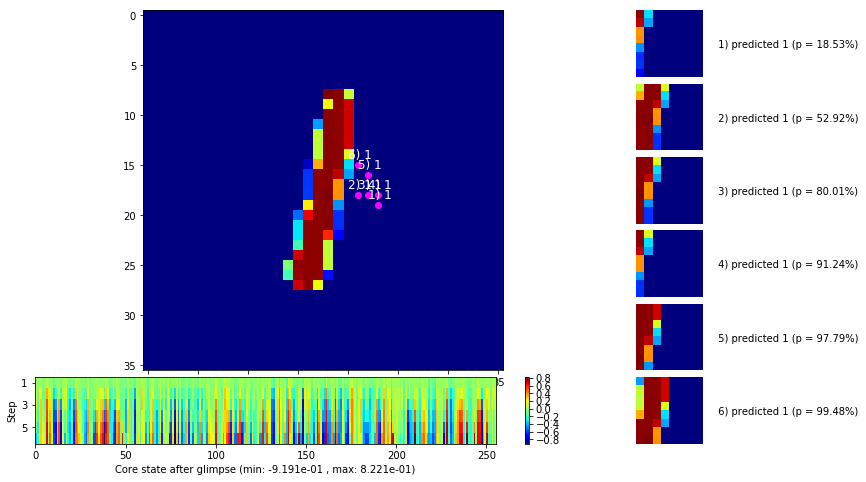


	Target class: 3  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


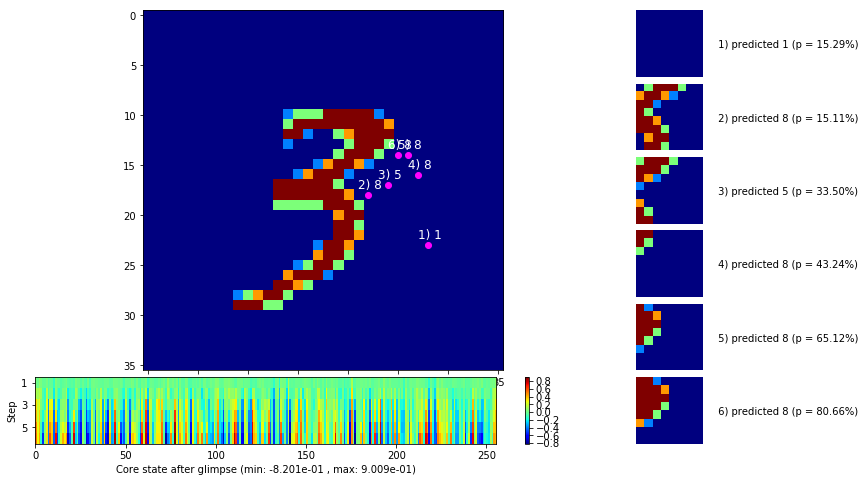

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


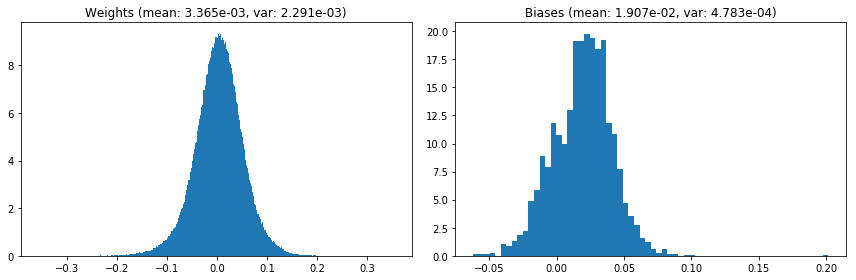

                                      Location network weights and biases


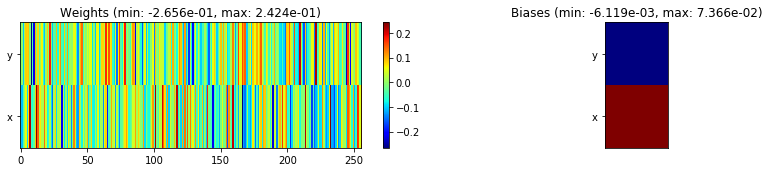

---------------------------------------------------------------------------------------------------------------
Elapsed time:  424.74 sec | TRAIN >> class loss: 1.6402 | steps:  4.252    | reward:  0.4207    | acc.: 42.070% 
                          | VAL   >> class loss: 1.3351 | steps:  3.718    | reward:  0.5422    | acc.: 54.220% 


Epoch   5/400) lr = 0.0001324
 b    500/  3000 >> 137.2 ms/b | lr: 1.37e-04 | grad 2norm: 10.29 | grad inf norm:  2.419
       Weights || abs max:  0.36 (95052.16) | mean:  3.34e-03 ( 0.36) | var: 2.33e-03 (649284.25)
        Biases || abs max:  0.21 ( 7322.50) | mean:  1.94e-02 ( 6.60) | var: 4.94e-04 (443654.41)
                  class loss: 1.446 | steps: 4.049 | reward:  0.492 | acc.: 49.21%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 137.0 ms/b | lr: 1.41e-04 | grad 2norm: 10.11 | grad inf norm:  2.470
       Weights || abs max:  0.36 (778393.31) | mean:  3.26e-03 ( 1.49) | 

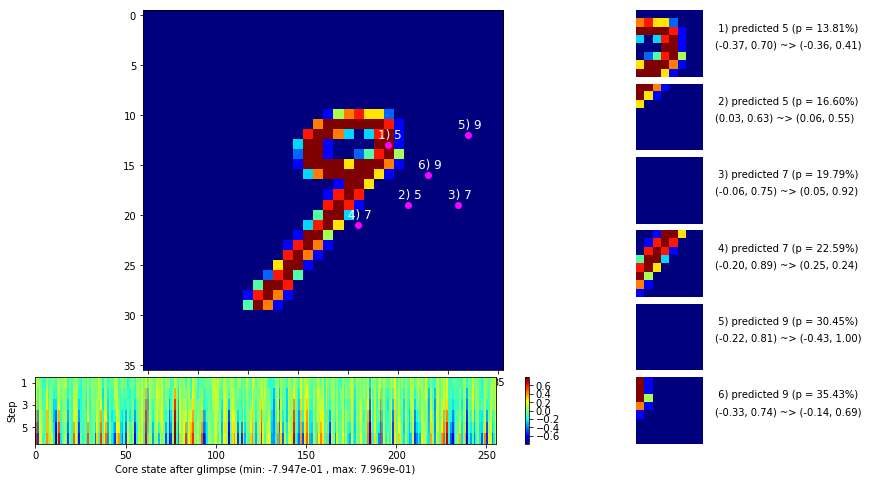

 b   1500/  3000 >> 138.0 ms/b | lr: 1.48e-04 | grad 2norm: 10.42 | grad inf norm:  2.389
       Weights || abs max:  0.37 (49311.38) | mean:  3.21e-03 ( 0.27) | var: 2.47e-03 (48272.72)
        Biases || abs max:  0.25 ( 6988.26) | mean:  2.07e-02 ( 7.03) | var: 5.59e-04 (138281.27)
                  class loss: 1.355 | steps: 3.954 | reward:  0.526 | acc.: 52.60%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 137.1 ms/b | lr: 1.52e-04 | grad 2norm: 10.63 | grad inf norm:  2.495
       Weights || abs max:  0.37 (188737.45) | mean:  3.15e-03 ( 0.50) | var: 2.55e-03 (12322531.00)
        Biases || abs max:  0.26 (12564.13) | mean:  2.13e-02 (10.83) | var: 5.85e-04 (2701881.25)
                  class loss: 1.276 | steps: 3.865 | reward:  0.556 | acc.: 55.62%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.

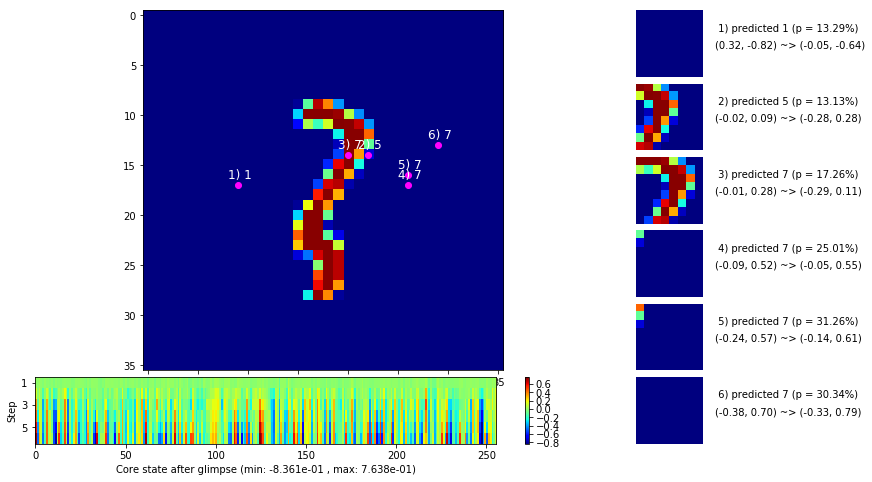

 b   2500/  3000 >> 139.7 ms/b | lr: 1.58e-04 | grad 2norm: 10.43 | grad inf norm:  2.442
       Weights || abs max:  0.38 (153006.83) | mean:  3.10e-03 ( 0.44) | var: 2.64e-03 (7755644.00)
        Biases || abs max:  0.28 (10830.95) | mean:  2.20e-02 (10.28) | var: 6.17e-04 (5500495.00)
                  class loss: 1.215 | steps: 3.829 | reward:  0.579 | acc.: 57.87%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 137.6 ms/b | lr: 1.63e-04 | grad 2norm: 10.65 | grad inf norm:  2.501
       Weights || abs max:  0.40 (45861.67) | mean:  3.04e-03 ( 0.26) | var: 2.72e-03 (48378.45)
        Biases || abs max:  0.30 ( 7706.07) | mean:  2.25e-02 ( 7.03) | var: 6.47e-04 (262283.81)
                  class loss: 1.154 | steps: 3.708 | reward:  0.598 | acc.: 59.80%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

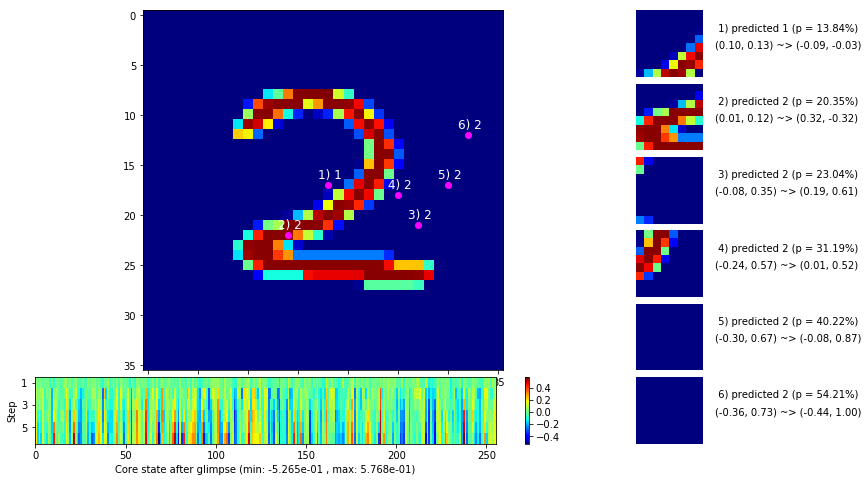

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


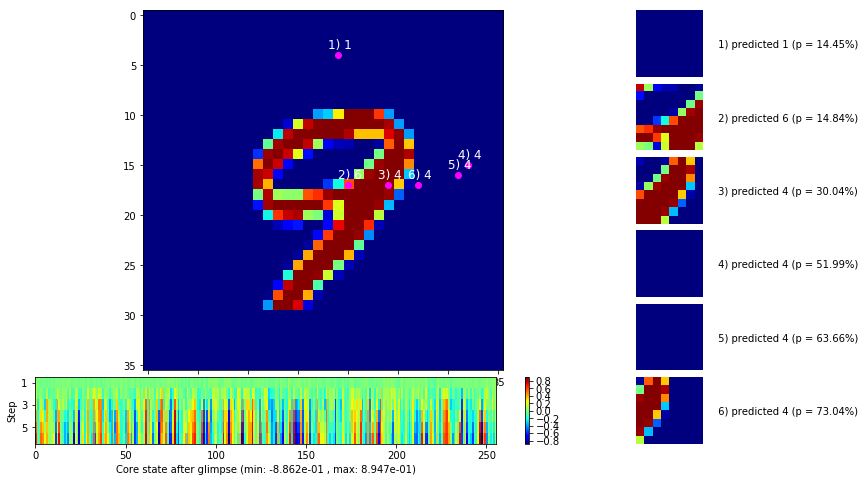


	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


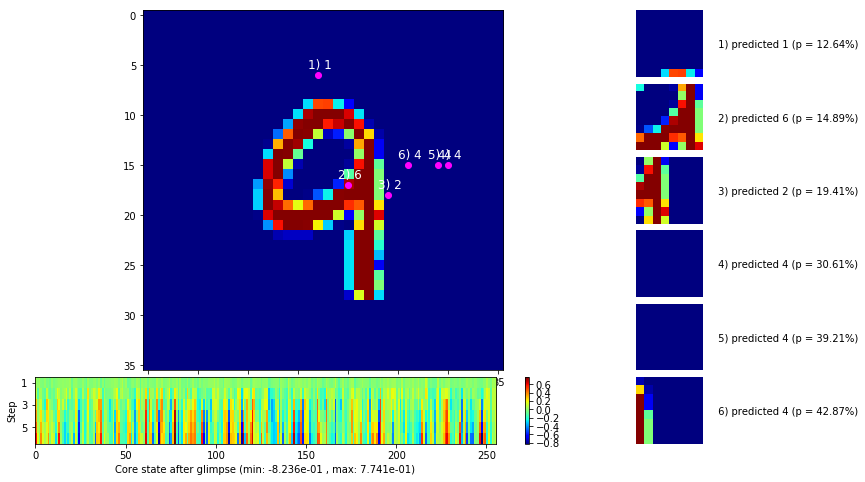

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


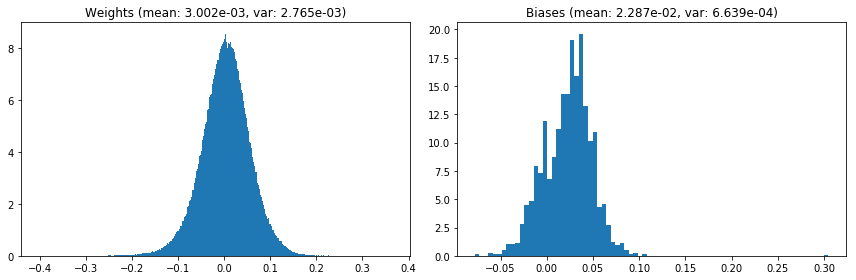

                                      Location network weights and biases


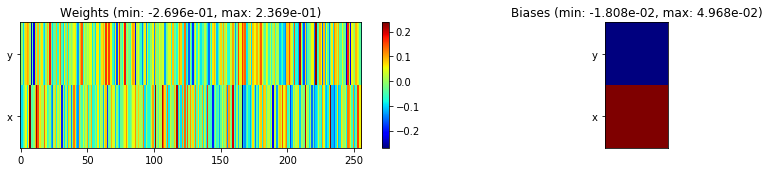

---------------------------------------------------------------------------------------------------------------
Elapsed time:  413.80 sec | TRAIN >> class loss: 1.3099 | steps:  3.907    | reward:  0.5428    | acc.: 54.280% 
                          | VAL   >> class loss: 0.9360 | steps:  3.246    | reward:  0.6876    | acc.: 68.760% 


Epoch   6/400) lr = 0.0001649
 b    500/  3000 >> 137.5 ms/b | lr: 1.69e-04 | grad 2norm: 10.54 | grad inf norm:  2.451
       Weights || abs max:  0.41 (62190.15) | mean:  2.94e-03 ( 0.28) | var: 2.81e-03 (135261.42)
        Biases || abs max:  0.32 ( 5447.00) | mean:  2.31e-02 ( 6.06) | var: 6.83e-04 (174958.12)
                  class loss: 1.084 | steps: 3.632 | reward:  0.630 | acc.: 63.00%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.8 ms/b | lr: 1.74e-04 | grad 2norm: 10.23 | grad inf norm:  2.386
       Weights || abs max:  0.42 (64545.47) | mean:  2.85e-03 ( 0.28) | v

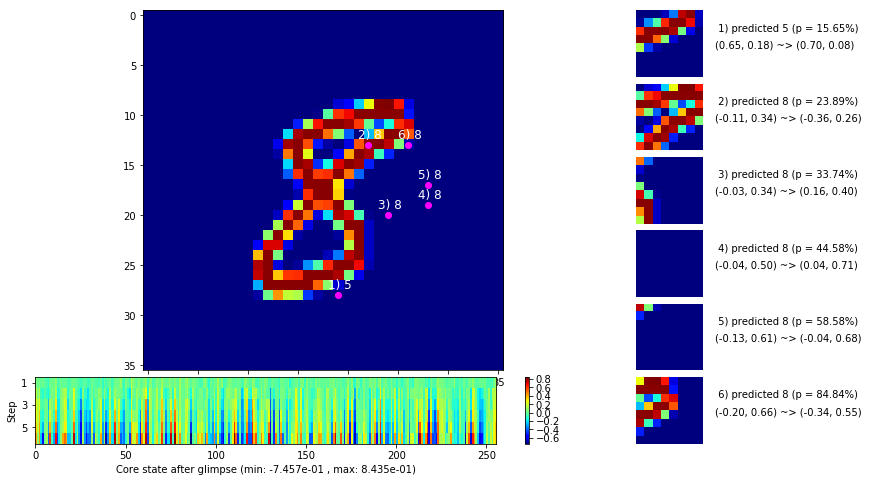

 b   1500/  3000 >> 138.7 ms/b | lr: 1.80e-04 | grad 2norm: 10.03 | grad inf norm:  2.290
       Weights || abs max:  0.44 (37156.19) | mean:  2.73e-03 ( 0.23) | var: 2.98e-03 (22626.00)
        Biases || abs max:  0.37 (31413.69) | mean:  2.41e-02 (16.67) | var: 7.49e-04 (49749088.00)
                  class loss: 0.982 | steps: 3.500 | reward:  0.666 | acc.: 66.62%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.5 ms/b | lr: 1.84e-04 | grad 2norm: 10.23 | grad inf norm:  2.382
       Weights || abs max:  0.45 (34119.25) | mean:  2.61e-03 ( 0.22) | var: 3.08e-03 (18394.25)
        Biases || abs max:  0.39 (11073.40) | mean:  2.46e-02 ( 9.25) | var: 7.90e-04 (2821839.50)
                  class loss: 0.905 | steps: 3.438 | reward:  0.696 | acc.: 69.60%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

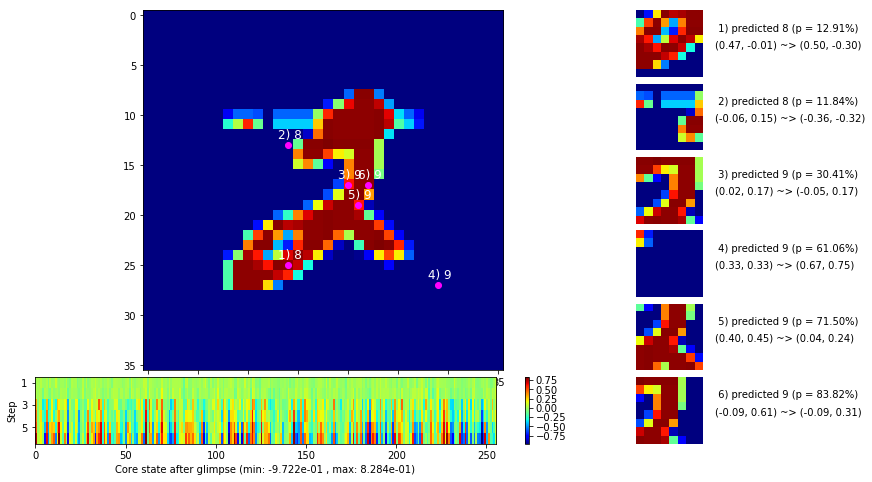

 b   2500/  3000 >> 135.9 ms/b | lr: 1.91e-04 | grad 2norm:  9.98 | grad inf norm:  2.330
       Weights || abs max:  0.47 (68358.48) | mean:  2.40e-03 ( 0.28) | var: 3.16e-03 (567516.75)
        Biases || abs max:  0.41 ( 5263.86) | mean:  2.47e-02 ( 5.47) | var: 8.17e-04 (130207.45)
                  class loss: 0.868 | steps: 3.380 | reward:  0.707 | acc.: 70.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.8 ms/b | lr: 1.95e-04 | grad 2norm:  9.56 | grad inf norm:  2.206
       Weights || abs max:  0.49 (143486.95) | mean:  2.23e-03 ( 0.40) | var: 3.25e-03 (6853872.00)
        Biases || abs max:  0.44 ( 4631.04) | mean:  2.50e-02 ( 5.15) | var: 8.56e-04 (260403.89)
                  class loss: 0.819 | steps: 3.272 | reward:  0.724 | acc.: 72.40%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

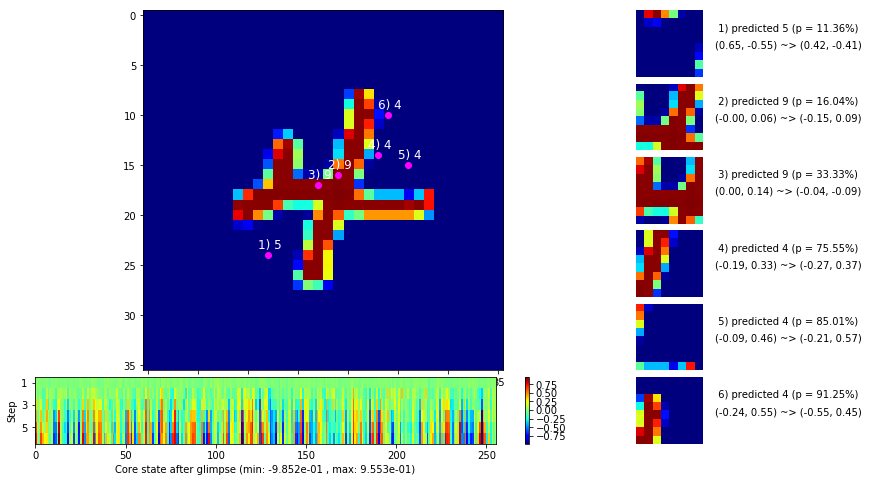

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


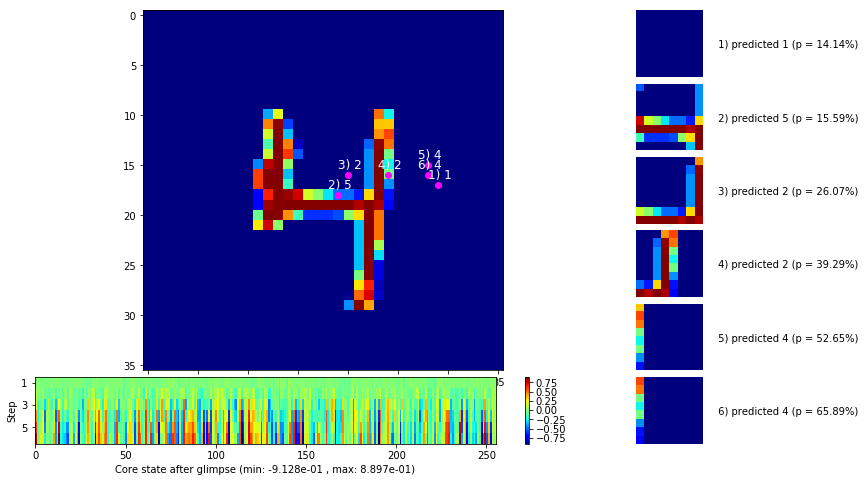


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


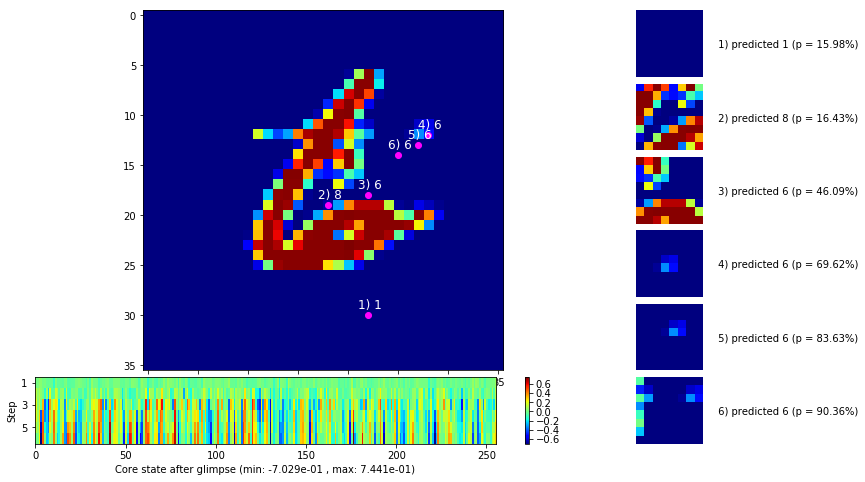

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


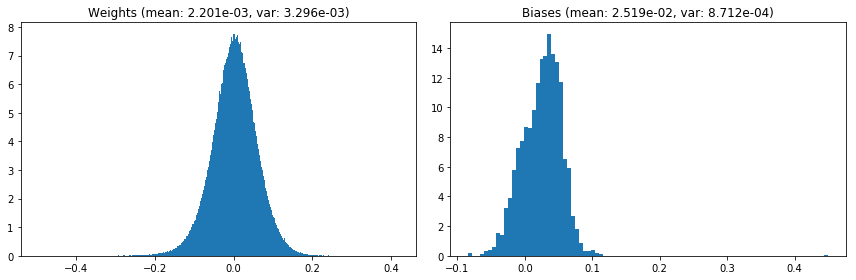

                                      Location network weights and biases


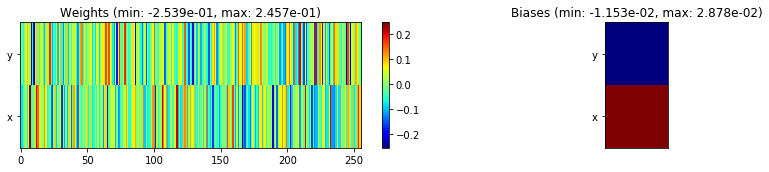

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.15 sec | TRAIN >> class loss: 0.9461 | steps:  3.461    | reward:  0.6800    | acc.: 68.003% 
                          | VAL   >> class loss: 0.6487 | steps:  2.875    | reward:  0.7814    | acc.: 78.140% 


Epoch   7/400) lr = 0.0001975
 b    500/  3000 >> 134.0 ms/b | lr: 2.02e-04 | grad 2norm:  9.59 | grad inf norm:  2.280
       Weights || abs max:  0.50 (87464.66) | mean:  2.12e-03 ( 0.30) | var: 3.34e-03 (867177.06)
        Biases || abs max:  0.46 ( 5695.01) | mean:  2.53e-02 ( 5.86) | var: 8.89e-04 (248600.52)
                  class loss: 0.795 | steps: 3.242 | reward:  0.731 | acc.: 73.12%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.0 ms/b | lr: 2.06e-04 | grad 2norm:  9.26 | grad inf norm:  2.200
       Weights || abs max:  0.51 (57201.14) | mean:  1.94e-03 ( 0.26) | v

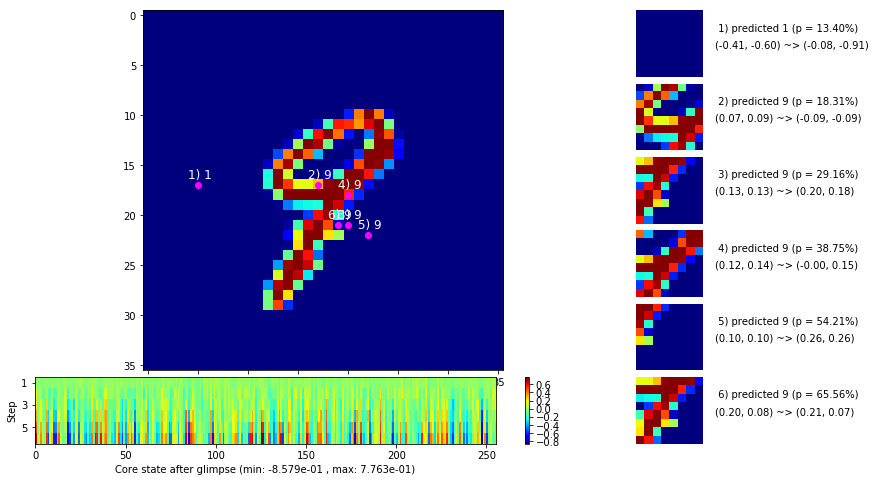

 b   1500/  3000 >> 136.0 ms/b | lr: 2.13e-04 | grad 2norm:  9.45 | grad inf norm:  2.291
       Weights || abs max:  0.53 (56520.91) | mean:  1.82e-03 ( 0.25) | var: 3.52e-03 (141946.66)
        Biases || abs max:  0.50 ( 3868.01) | mean:  2.58e-02 ( 4.38) | var: 9.62e-04 (134859.91)
                  class loss: 0.754 | steps: 3.131 | reward:  0.741 | acc.: 74.08%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.8 ms/b | lr: 2.17e-04 | grad 2norm:  9.39 | grad inf norm:  2.256
       Weights || abs max:  0.54 (143522.39) | mean:  1.65e-03 ( 0.40) | var: 3.61e-03 (6824256.50)
        Biases || abs max:  0.52 ( 4027.02) | mean:  2.59e-02 ( 4.79) | var: 1.01e-03 (256388.48)
                  class loss: 0.787 | steps: 3.122 | reward:  0.739 | acc.: 73.93%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

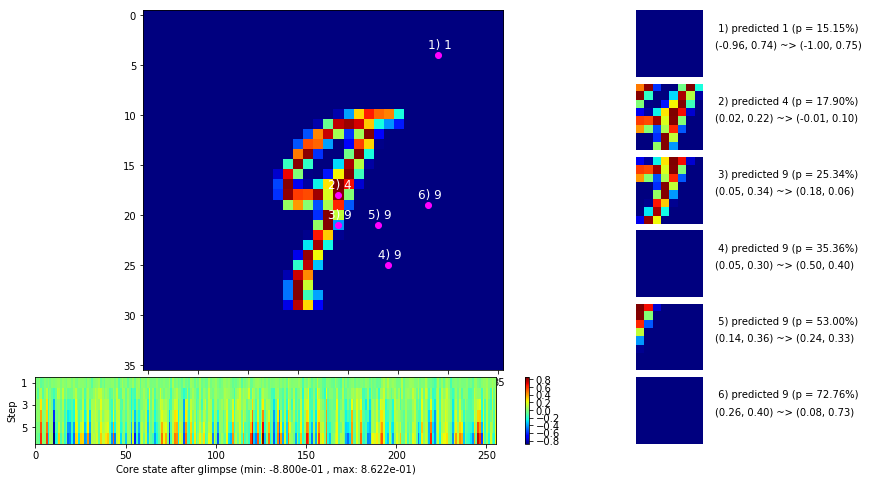

 b   2500/  3000 >> 136.3 ms/b | lr: 2.24e-04 | grad 2norm:  9.16 | grad inf norm:  2.198
       Weights || abs max:  0.55 (46781.37) | mean:  1.49e-03 ( 0.23) | var: 3.69e-03 (134864.61)
        Biases || abs max:  0.54 ( 3338.84) | mean:  2.60e-02 ( 4.50) | var: 1.05e-03 (54604.43)
                  class loss: 0.775 | steps: 3.111 | reward:  0.741 | acc.: 74.10%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.6 ms/b | lr: 2.28e-04 | grad 2norm:  9.21 | grad inf norm:  2.240
       Weights || abs max:  0.56 (95317.69) | mean:  1.35e-03 ( 0.31) | var: 3.78e-03 (3549974.75)
        Biases || abs max:  0.54 ( 9577.23) | mean:  2.61e-02 ( 7.78) | var: 1.10e-03 (2439654.75)
                  class loss: 0.771 | steps: 3.078 | reward:  0.736 | acc.: 73.57%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

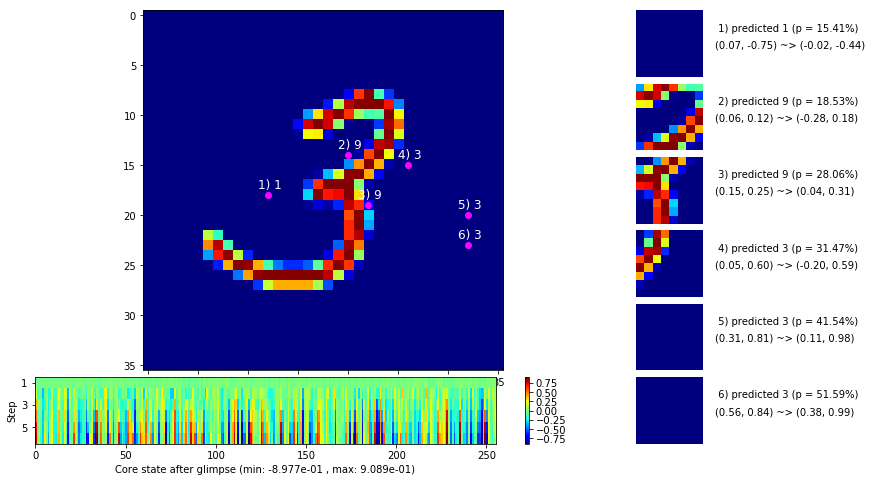

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


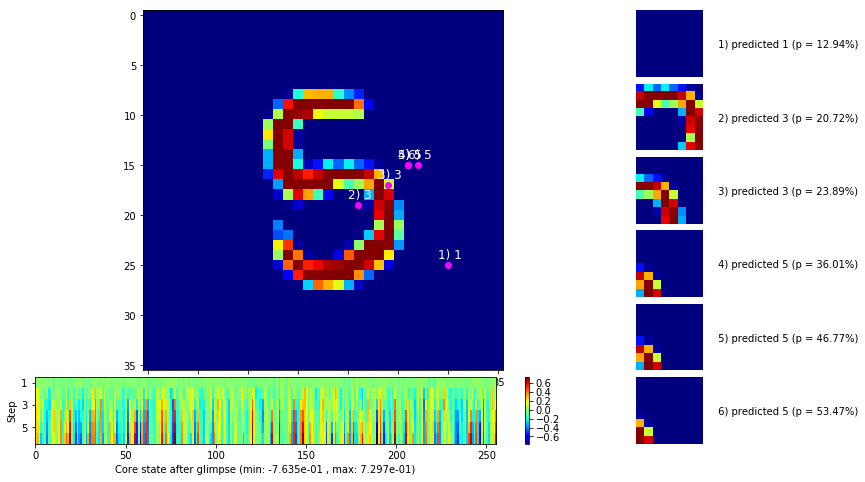


	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


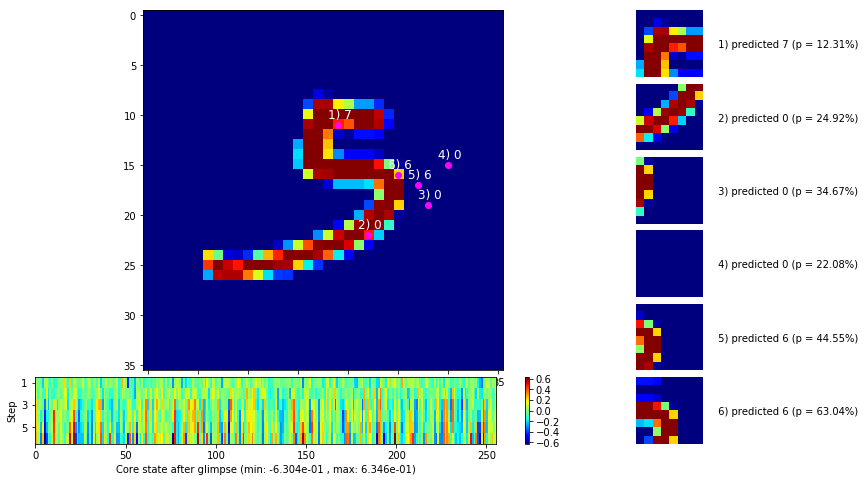

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


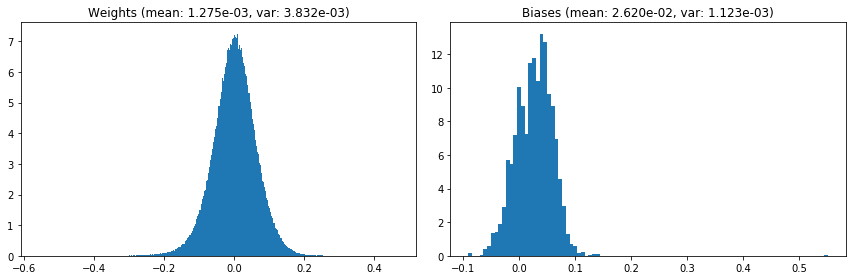

                                      Location network weights and biases


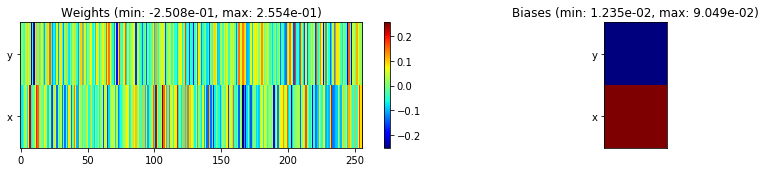

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.93 sec | TRAIN >> class loss: 0.7770 | steps:  3.146    | reward:  0.7387    | acc.: 73.872% 
                          | VAL   >> class loss: 0.6324 | steps:  2.606    | reward:  0.7792 :( | acc.: 77.920% :(


Epoch   8/400) lr = 0.00023
 b    500/  3000 >> 133.2 ms/b | lr: 2.34e-04 | grad 2norm:  9.08 | grad inf norm:  2.201
       Weights || abs max:  0.57 (48259.17) | mean:  1.15e-03 ( 0.23) | var: 3.87e-03 (127024.46)
        Biases || abs max:  0.56 ( 7014.64) | mean:  2.62e-02 ( 5.94) | var: 1.14e-03 (1325926.25)
                  class loss: 0.752 | steps: 3.041 | reward:  0.747 | acc.: 74.73%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 144.3 ms/b | lr: 2.39e-04 | grad 2norm:  9.05 | grad inf norm:  2.229
       Weights || abs max:  0.57 (43213.92) | mean:  9.72e-04 ( 0.22) | 

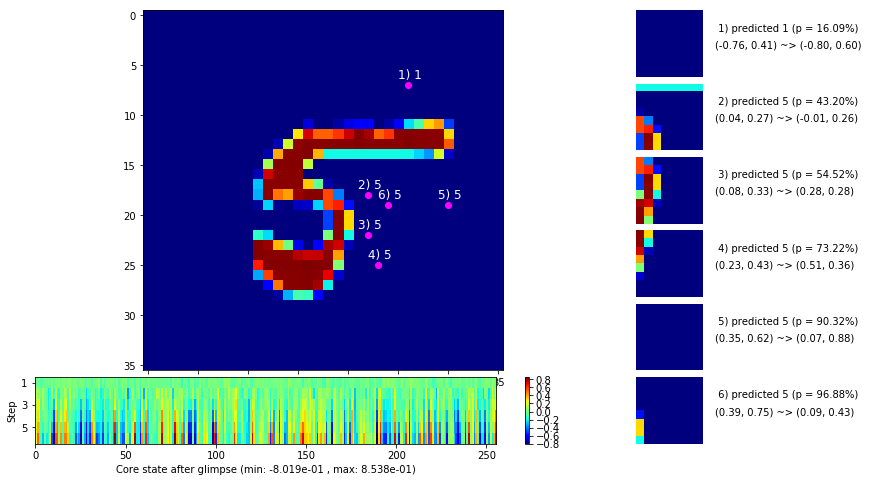

 b   1500/  3000 >> 140.3 ms/b | lr: 2.45e-04 | grad 2norm:  8.77 | grad inf norm:  2.108
       Weights || abs max:  0.59 (57725.64) | mean:  8.13e-04 ( 0.24) | var: 4.06e-03 (153923.73)
        Biases || abs max:  0.59 ( 4590.75) | mean:  2.64e-02 ( 5.01) | var: 1.22e-03 (169893.86)
                  class loss: 0.700 | steps: 3.017 | reward:  0.760 | acc.: 76.04%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 139.4 ms/b | lr: 2.50e-04 | grad 2norm:  8.63 | grad inf norm:  2.053
       Weights || abs max:  0.60 (33531.30) | mean:  6.34e-04 ( 0.20) | var: 4.15e-03 (20765.44)
        Biases || abs max:  0.61 ( 3779.88) | mean:  2.63e-02 ( 4.27) | var: 1.26e-03 (88608.22)
                  class loss: 0.686 | steps: 2.952 | reward:  0.770 | acc.: 76.98%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

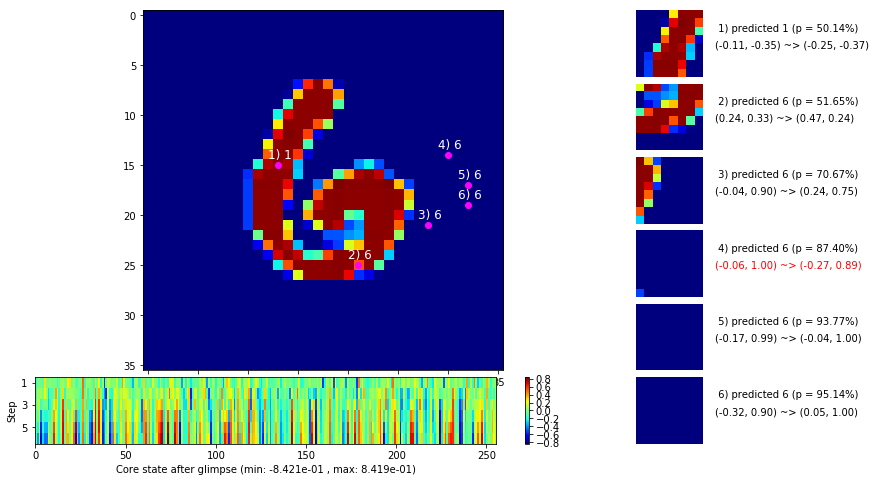

 b   2500/  3000 >> 138.3 ms/b | lr: 2.56e-04 | grad 2norm:  8.55 | grad inf norm:  2.001
       Weights || abs max:  0.60 (217794.52) | mean:  3.77e-04 ( 0.51) | var: 4.25e-03 (17850378.00)
        Biases || abs max:  0.62 (11227.42) | mean:  2.60e-02 ( 9.92) | var: 1.30e-03 (15810533.00)
                  class loss: 0.691 | steps: 2.953 | reward:  0.765 | acc.: 76.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 139.6 ms/b | lr: 2.60e-04 | grad 2norm:  8.66 | grad inf norm:  2.134
       Weights || abs max:  0.61 (42470.03) | mean:  2.31e-04 ( 0.21) | var: 4.34e-03 (84275.22)
        Biases || abs max:  0.63 ( 7586.84) | mean:  2.58e-02 ( 6.08) | var: 1.34e-03 (498000.09)
                  class loss: 0.681 | steps: 2.947 | reward:  0.764 | acc.: 76.38%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

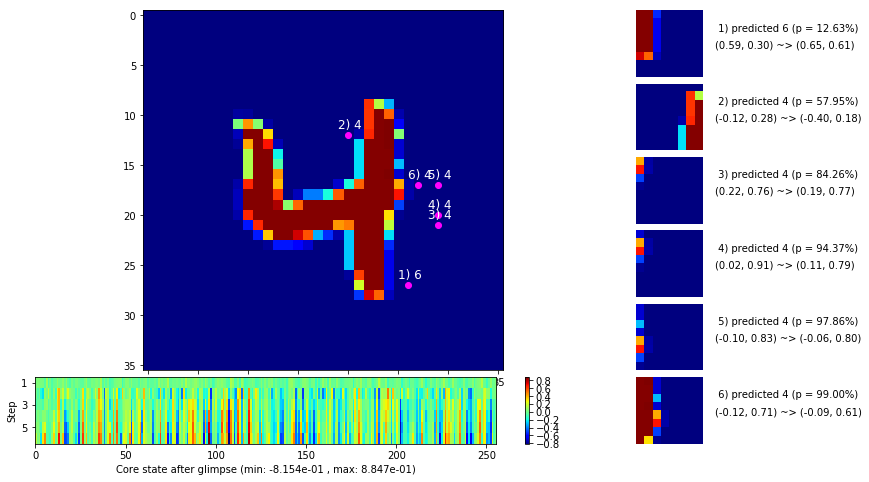

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


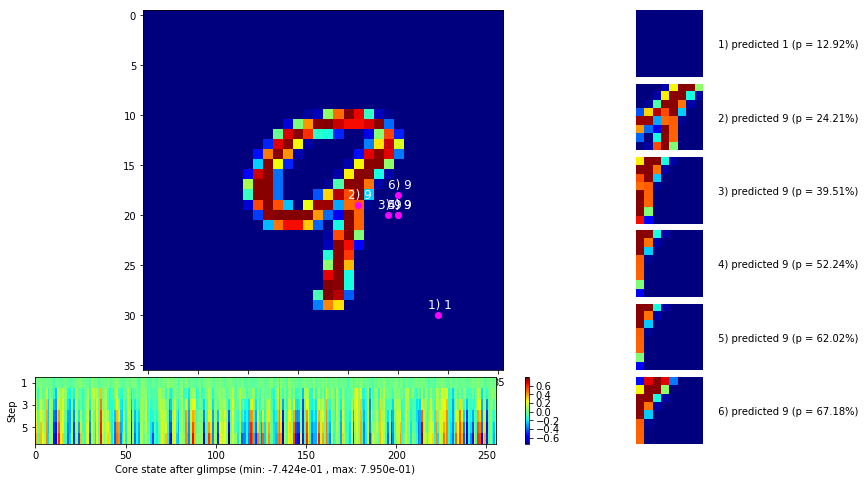


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


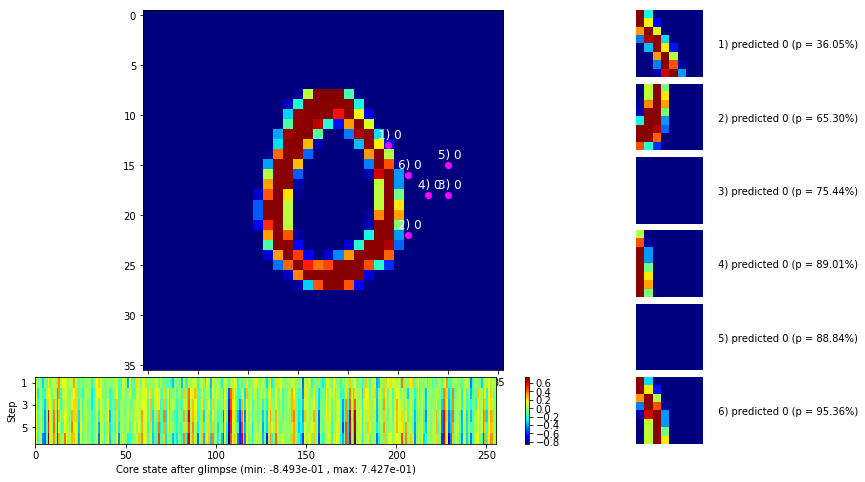

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


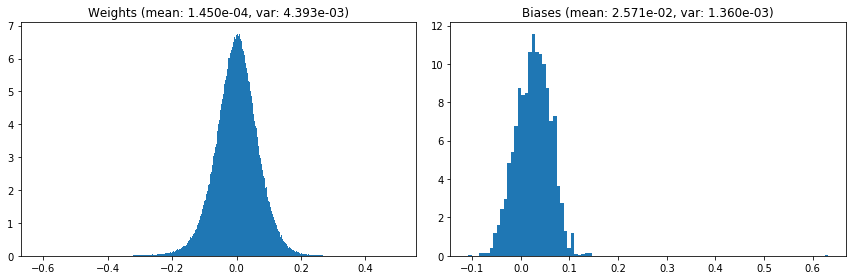

                                      Location network weights and biases


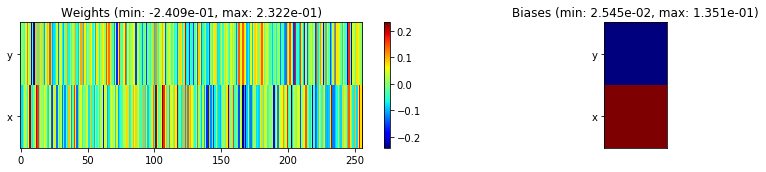

---------------------------------------------------------------------------------------------------------------
Elapsed time:  418.09 sec | TRAIN >> class loss: 0.7130 | steps:  2.993    | reward:  0.7568    | acc.: 75.678% 
                          | VAL   >> class loss: 0.5697 | steps:  2.559    | reward:  0.7978    | acc.: 79.780% 


Epoch   9/400) lr = 0.0002583
 b    500/  3000 >> 139.3 ms/b | lr: 2.54e-04 | grad 2norm:  8.46 | grad inf norm:  2.068
       Weights || abs max:  0.62 (69972.32) | mean:  7.40e-05 ( 0.25) | var: 4.44e-03 (419200.38)
        Biases || abs max:  0.64 ( 4475.40) | mean:  2.56e-02 ( 4.33) | var: 1.38e-03 (203890.72)
                  class loss: 0.673 | steps: 2.911 | reward:  0.774 | acc.: 77.43%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 137.7 ms/b | lr: 2.50e-04 | grad 2norm:  8.37 | grad inf norm:  2.042
       Weights || abs max:  0.62 (105515.70) | mean: -4.89e-05 ( 0.31) | 

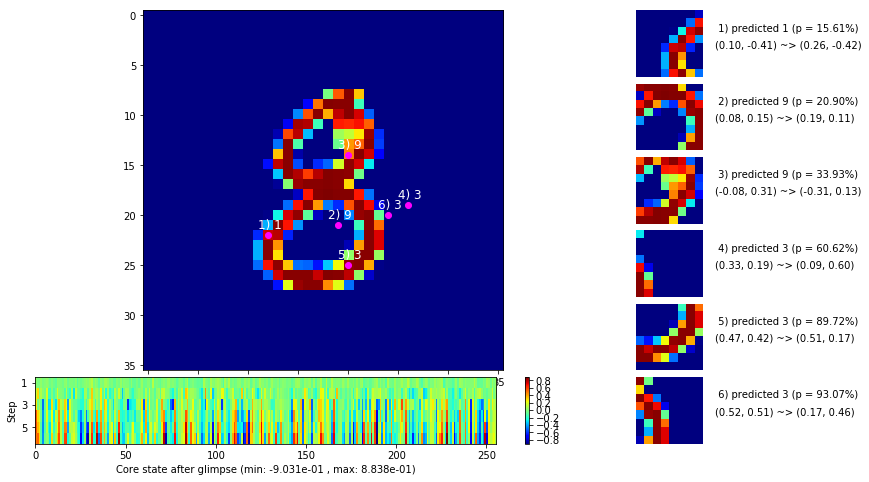

 b   1500/  3000 >> 141.1 ms/b | lr: 2.44e-04 | grad 2norm:  8.36 | grad inf norm:  2.071
       Weights || abs max:  0.63 (84627.64) | mean: -2.03e-04 ( 0.27) | var: 4.61e-03 (674733.00)
        Biases || abs max:  0.66 ( 1627.77) | mean:  2.50e-02 ( 2.41) | var: 1.46e-03 ( 8928.38)
                  class loss: 0.625 | steps: 2.885 | reward:  0.787 | acc.: 78.73%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 139.6 ms/b | lr: 2.40e-04 | grad 2norm:  8.42 | grad inf norm:  2.067
       Weights || abs max:  0.64 (25444.60) | mean: -2.71e-04 ( 0.17) | var: 4.69e-03 ( 8106.01)
        Biases || abs max:  0.67 ( 4117.02) | mean:  2.50e-02 ( 4.20) | var: 1.51e-03 (281473.41)
                  class loss: 0.633 | steps: 2.844 | reward:  0.784 | acc.: 78.41%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.

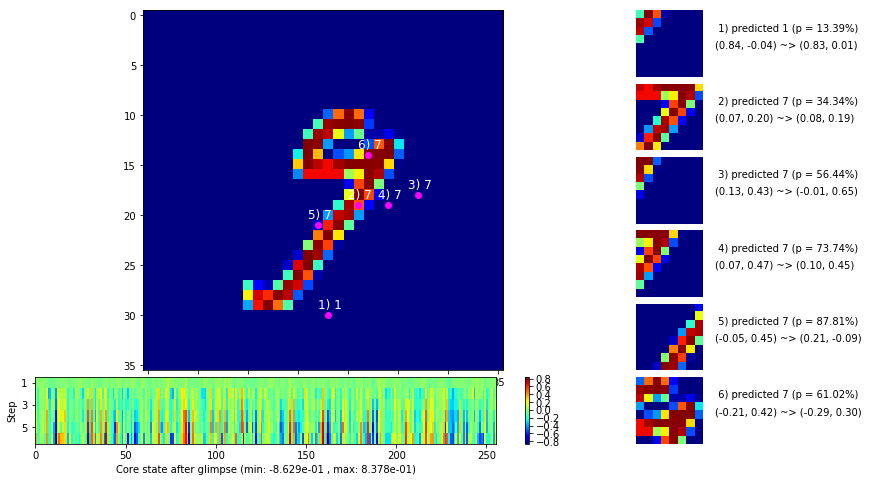

 b   2500/  3000 >> 137.7 ms/b | lr: 2.35e-04 | grad 2norm:  8.33 | grad inf norm:  2.131
       Weights || abs max:  0.64 (37121.28) | mean: -3.65e-04 ( 0.19) | var: 4.77e-03 (53747.33)
        Biases || abs max:  0.68 ( 6501.74) | mean:  2.51e-02 ( 4.73) | var: 1.55e-03 (2004168.25)
                  class loss: 0.625 | steps: 2.848 | reward:  0.795 | acc.: 79.50%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.8 ms/b | lr: 2.31e-04 | grad 2norm:  8.25 | grad inf norm:  1.978
       Weights || abs max:  0.64 (30426.80) | mean: -4.61e-04 ( 0.18) | var: 4.85e-03 (19099.57)
        Biases || abs max:  0.69 ( 3375.40) | mean:  2.50e-02 ( 3.47) | var: 1.59e-03 (64247.32)
                  class loss: 0.618 | steps: 2.804 | reward:  0.792 | acc.: 79.17%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

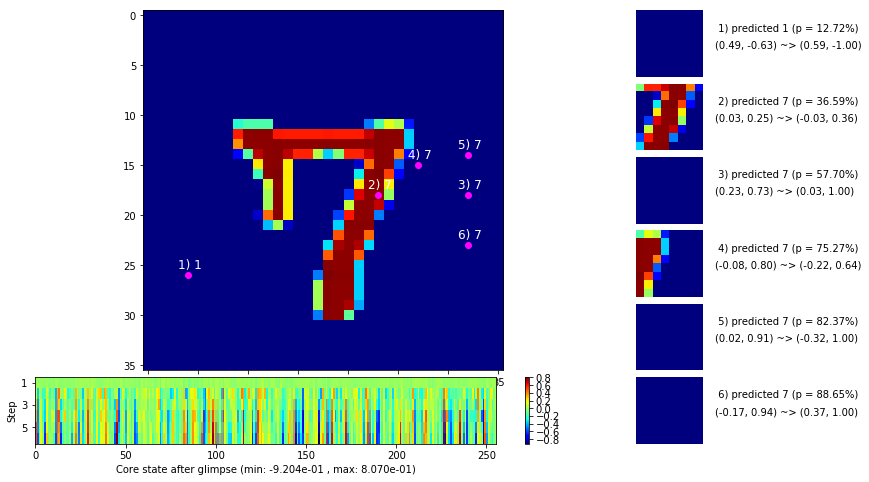

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


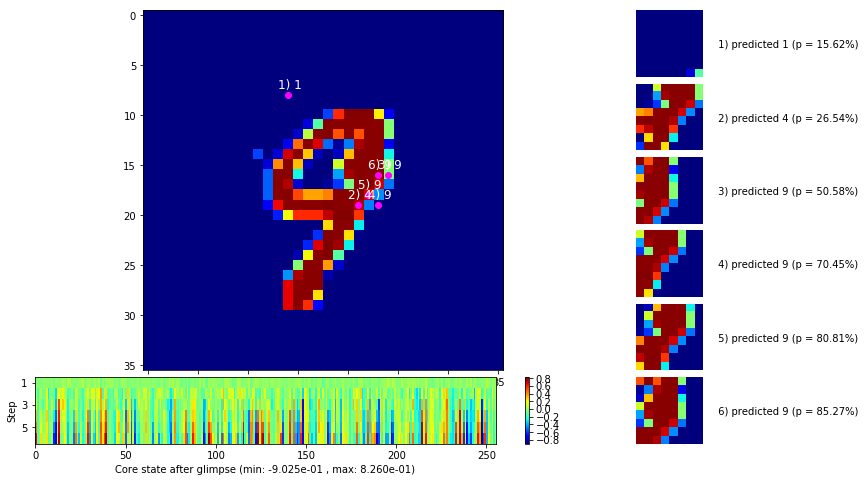


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


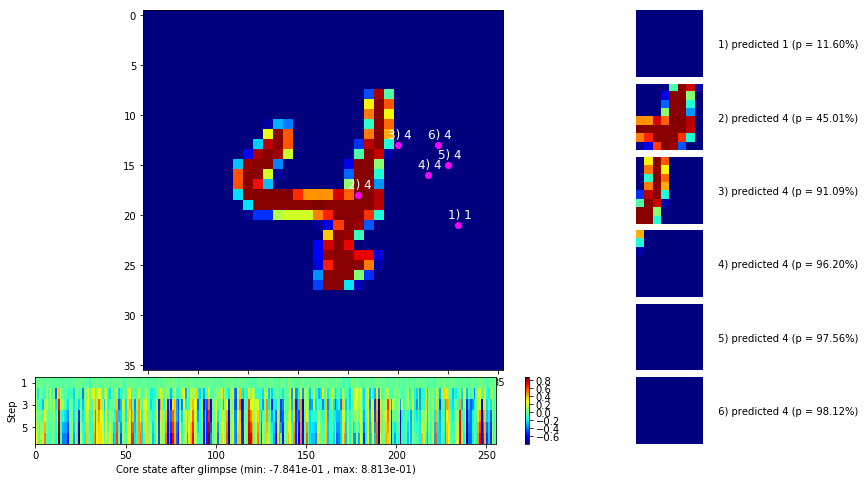

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


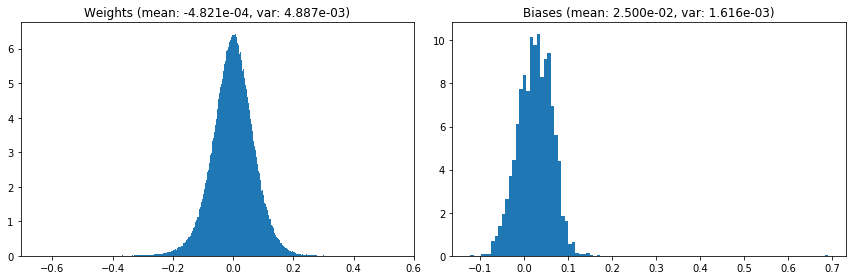

                                      Location network weights and biases


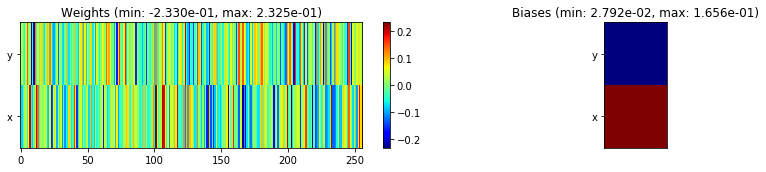

---------------------------------------------------------------------------------------------------------------
Elapsed time:  416.23 sec | TRAIN >> class loss: 0.6371 | steps:  2.866    | reward:  0.7859    | acc.: 78.585% 
                          | VAL   >> class loss: 0.5491 | steps:  2.485    | reward:  0.8074    | acc.: 80.740% 


Epoch  10/400) lr = 0.0002298
 b    500/  3000 >> 136.1 ms/b | lr: 2.26e-04 | grad 2norm:  8.25 | grad inf norm:  1.995
       Weights || abs max:  0.65 (57068.69) | mean: -5.47e-04 ( 0.22) | var: 4.92e-03 (467691.47)
        Biases || abs max:  0.69 ( 2348.09) | mean:  2.49e-02 ( 2.91) | var: 1.64e-03 (24556.30)
                  class loss: 0.615 | steps: 2.804 | reward:  0.787 | acc.: 78.75%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.7 ms/b | lr: 2.23e-04 | grad 2norm:  8.11 | grad inf norm:  1.903
       Weights || abs max:  0.65 (68997.83) | mean: -6.62e-04 ( 0.25) | va

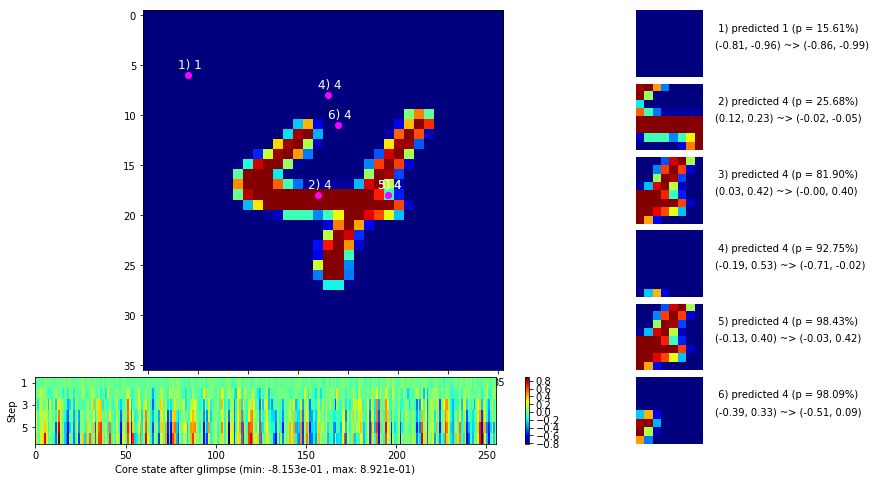

 b   1500/  3000 >> 133.7 ms/b | lr: 2.19e-04 | grad 2norm:  8.05 | grad inf norm:  1.891
       Weights || abs max:  0.66 (661288.75) | mean: -7.37e-04 ( 1.23) | var: 5.05e-03 (290150688.00)
        Biases || abs max:  0.71 ( 2344.97) | mean:  2.46e-02 ( 2.61) | var: 1.71e-03 (16741.06)
                  class loss: 0.593 | steps: 2.770 | reward:  0.801 | acc.: 80.08%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 137.2 ms/b | lr: 2.16e-04 | grad 2norm:  8.01 | grad inf norm:  1.975
       Weights || abs max:  0.66 (34998.13) | mean: -7.73e-04 ( 0.19) | var: 5.12e-03 (37647.66)
        Biases || abs max:  0.71 (14942.54) | mean:  2.44e-02 (11.99) | var: 1.74e-03 (49599320.00)
                  class loss: 0.546 | steps: 2.748 | reward:  0.811 | acc.: 81.13%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

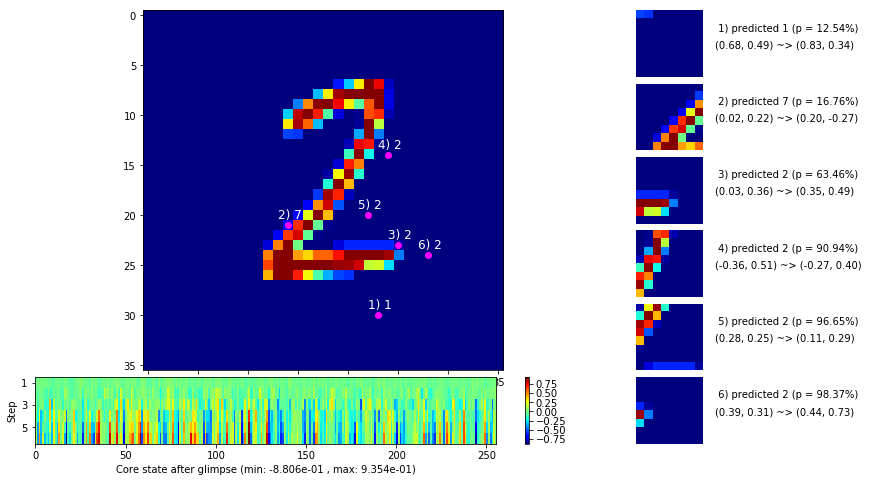

 b   2500/  3000 >> 138.6 ms/b | lr: 2.11e-04 | grad 2norm:  7.98 | grad inf norm:  1.879
       Weights || abs max:  0.67 (34983.90) | mean: -7.93e-04 ( 0.18) | var: 5.18e-03 (19979.46)
        Biases || abs max:  0.72 ( 2451.81) | mean:  2.44e-02 ( 2.82) | var: 1.78e-03 (21022.33)
                  class loss: 0.520 | steps: 2.708 | reward:  0.825 | acc.: 82.54%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 137.3 ms/b | lr: 2.08e-04 | grad 2norm:  7.94 | grad inf norm:  1.906
       Weights || abs max:  0.68 (63652.27) | mean: -8.60e-04 ( 0.23) | var: 5.24e-03 (171444.41)
        Biases || abs max:  0.73 ( 5973.70) | mean:  2.42e-02 ( 4.35) | var: 1.81e-03 (899752.81)
                  class loss: 0.531 | steps: 2.685 | reward:  0.822 | acc.: 82.19%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

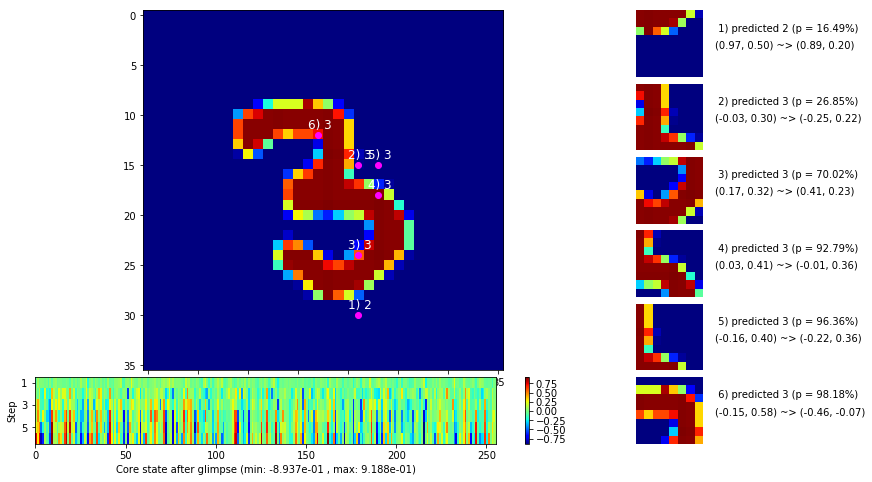

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


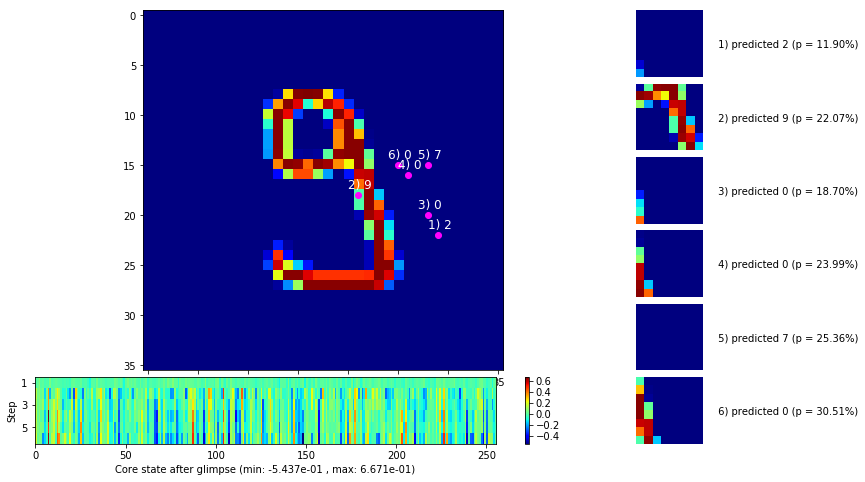


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


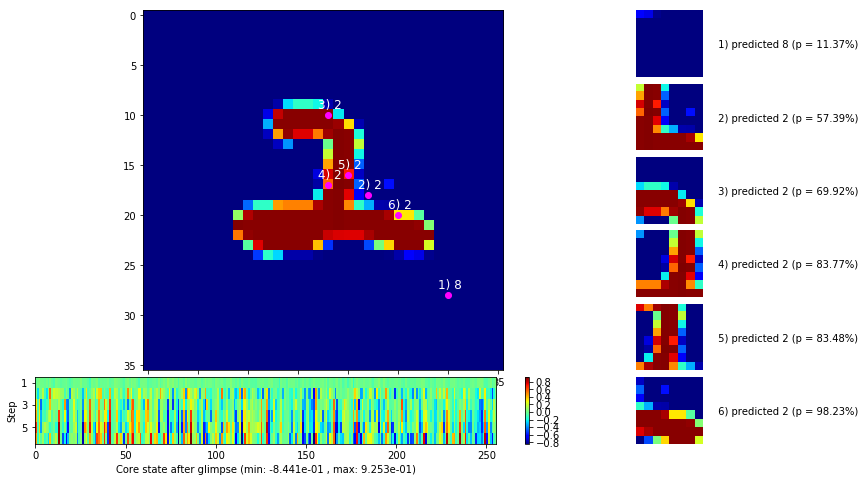

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


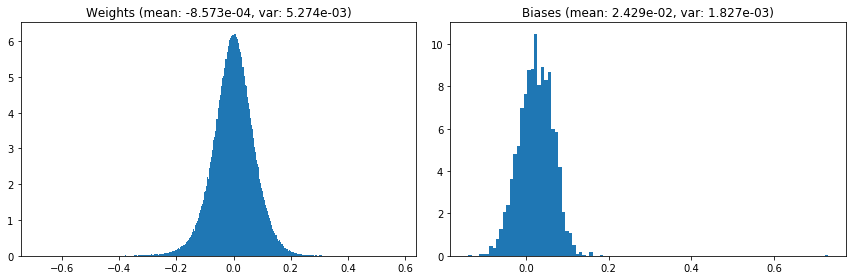

                                      Location network weights and biases


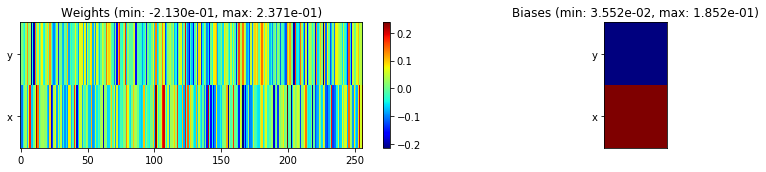

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.32 sec | TRAIN >> class loss: 0.5645 | steps:  2.748    | reward:  0.8091    | acc.: 80.910% 
                          | VAL   >> class loss: 0.4679 | steps:  2.379    | reward:  0.8416    | acc.: 84.160% 


Epoch  11/400) lr = 0.000207
 b    500/  3000 >> 136.3 ms/b | lr: 2.04e-04 | grad 2norm:  7.91 | grad inf norm:  1.976
       Weights || abs max:  0.69 (46532.86) | mean: -9.13e-04 ( 0.20) | var: 5.30e-03 (64621.94)
        Biases || abs max:  0.74 (23577.32) | mean:  2.42e-02 (10.94) | var: 1.84e-03 (57436668.00)
                  class loss: 0.528 | steps: 2.685 | reward:  0.823 | acc.: 82.34%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.2 ms/b | lr: 2.02e-04 | grad 2norm:  7.95 | grad inf norm:  1.987
       Weights || abs max:  0.68 (52337.54) | mean: -1.02e-03 ( 0.21) | v

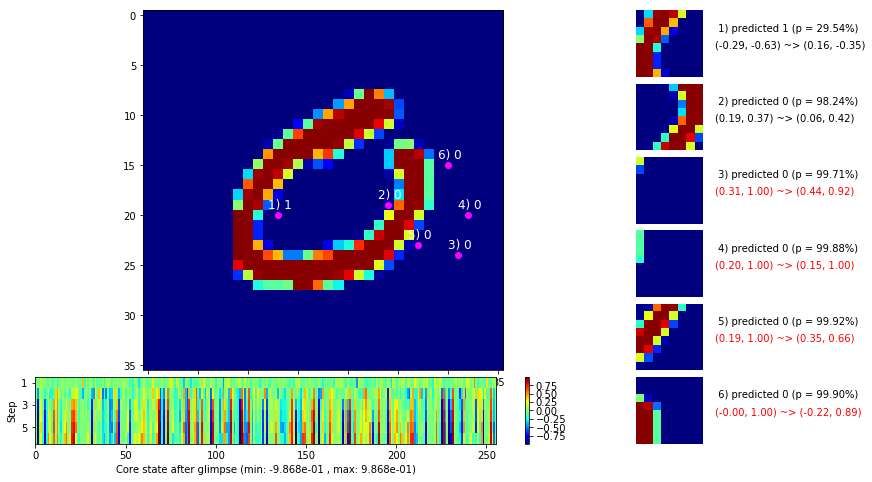

 b   1500/  3000 >> 133.1 ms/b | lr: 1.98e-04 | grad 2norm:  7.79 | grad inf norm:  1.915
       Weights || abs max:  0.68 (50982.44) | mean: -1.09e-03 ( 0.21) | var: 5.42e-03 (337617.62)
        Biases || abs max:  0.75 ( 5265.29) | mean:  2.39e-02 ( 3.98) | var: 1.90e-03 (547874.31)
                  class loss: 0.536 | steps: 2.705 | reward:  0.820 | acc.: 82.01%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.2 ms/b | lr: 1.95e-04 | grad 2norm:  7.61 | grad inf norm:  1.852
       Weights || abs max:  0.69 (33990.08) | mean: -1.15e-03 ( 0.18) | var: 5.47e-03 (14554.14)
        Biases || abs max:  0.76 ( 2409.37) | mean:  2.36e-02 ( 2.83) | var: 1.93e-03 (45972.16)
                  class loss: 0.516 | steps: 2.720 | reward:  0.829 | acc.: 82.86%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

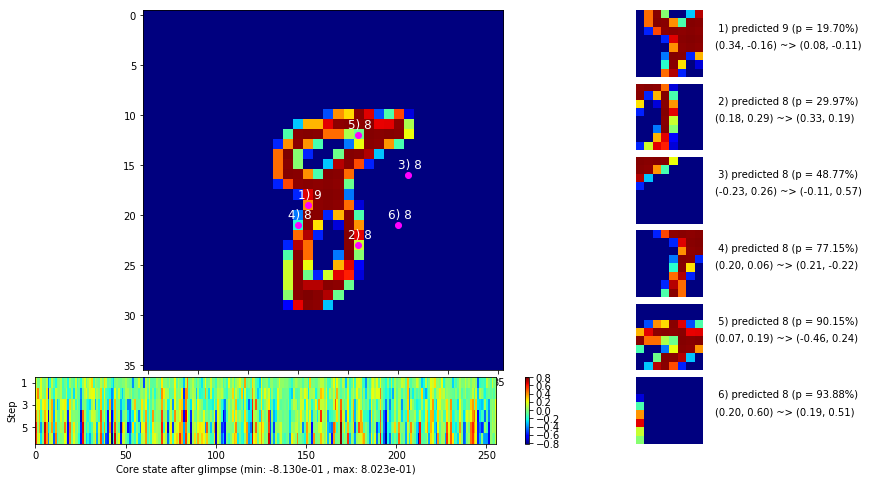

 b   2500/  3000 >> 131.4 ms/b | lr: 1.92e-04 | grad 2norm:  7.73 | grad inf norm:  1.881
       Weights || abs max:  0.70 (33372.57) | mean: -1.21e-03 ( 0.17) | var: 5.52e-03 (28233.18)
        Biases || abs max:  0.76 ( 3002.05) | mean:  2.35e-02 ( 2.78) | var: 1.96e-03 (151286.77)
                  class loss: 0.517 | steps: 2.678 | reward:  0.823 | acc.: 82.30%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.7 ms/b | lr: 1.89e-04 | grad 2norm:  7.62 | grad inf norm:  1.802
       Weights || abs max:  0.71 (40548.56) | mean: -1.24e-03 ( 0.19) | var: 5.57e-03 (101714.80)
        Biases || abs max:  0.77 ( 5262.90) | mean:  2.36e-02 ( 4.47) | var: 1.99e-03 (1255979.75)
                  class loss: 0.513 | steps: 2.648 | reward:  0.828 | acc.: 82.75%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

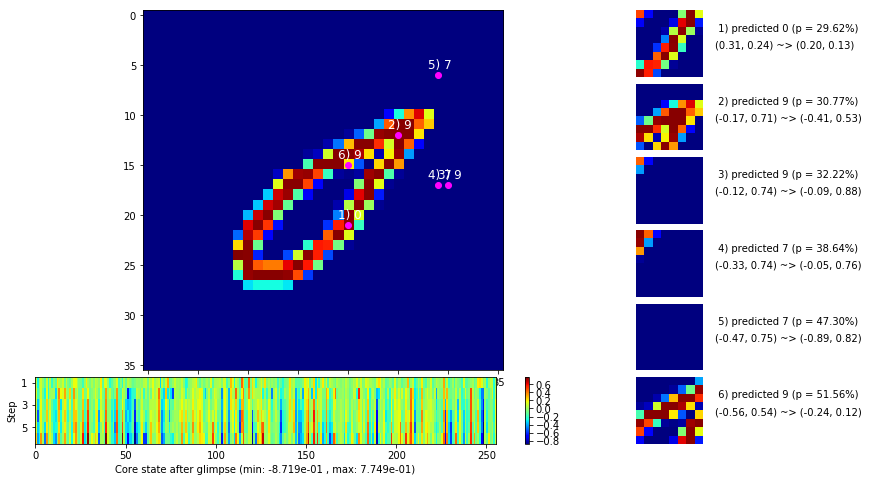

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


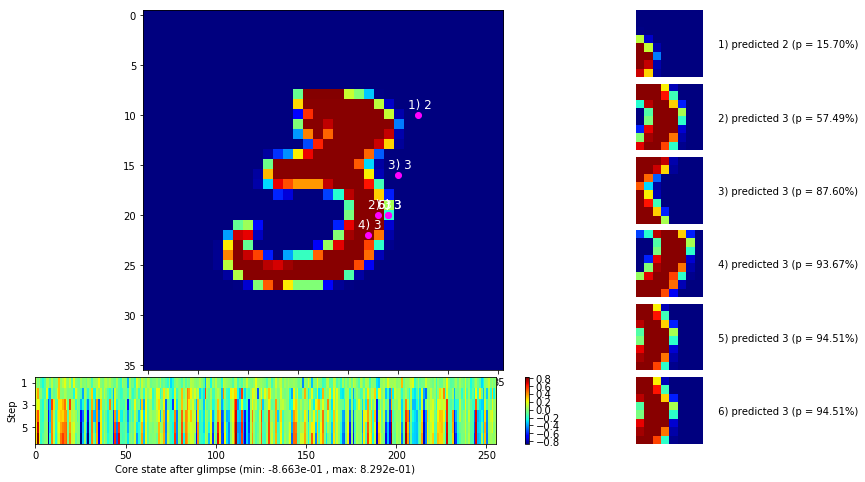


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


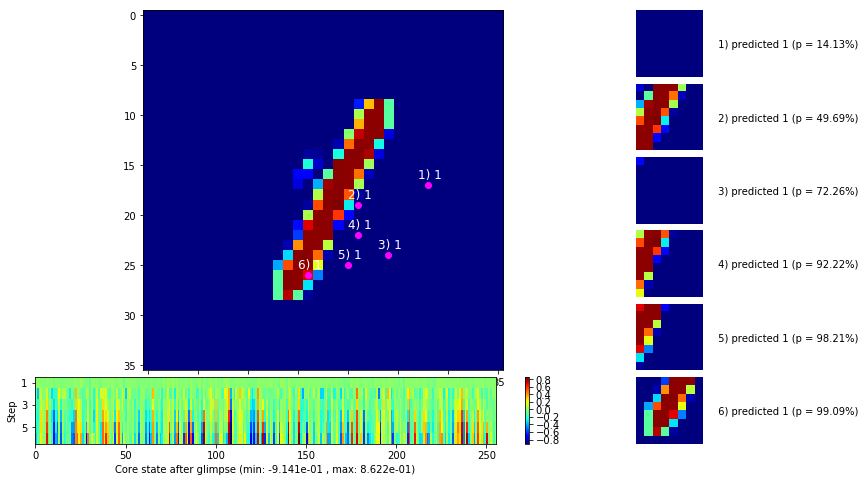

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


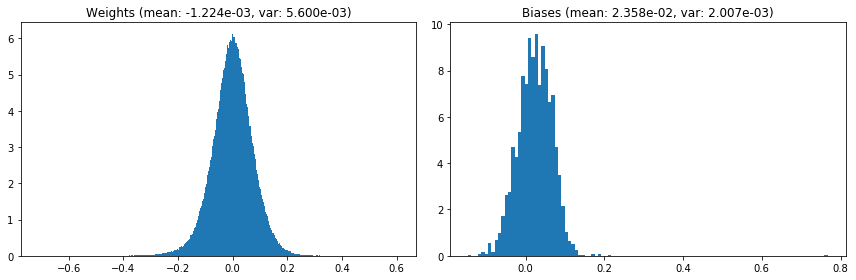

                                      Location network weights and biases


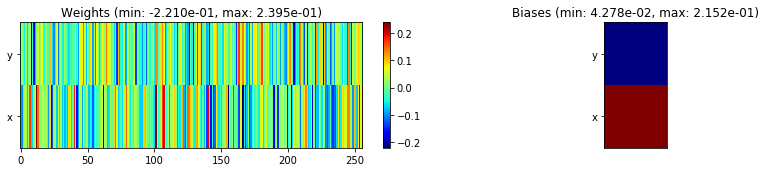

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.47 sec | TRAIN >> class loss: 0.5227 | steps:  2.691    | reward:  0.8239    | acc.: 82.388% 
                          | VAL   >> class loss: 0.4968 | steps:  2.422 :( | reward:  0.8280 :( | acc.: 82.800% :(


Epoch  12/400) lr = 0.0001883
 b    500/  3000 >> 132.5 ms/b | lr: 1.86e-04 | grad 2norm:  7.88 | grad inf norm:  1.895
       Weights || abs max:  0.71 (31389.55) | mean: -1.30e-03 ( 0.17) | var: 5.62e-03 (25958.24)
        Biases || abs max:  0.77 ( 2943.34) | mean:  2.34e-02 ( 2.44) | var: 2.02e-03 (75279.91)
                  class loss: 0.527 | steps: 2.688 | reward:  0.819 | acc.: 81.88%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.4 ms/b | lr: 1.84e-04 | grad 2norm:  7.76 | grad inf norm:  1.905
       Weights || abs max:  0.71 (543077.56) | mean: -1.32e-03 ( 1.02) | 

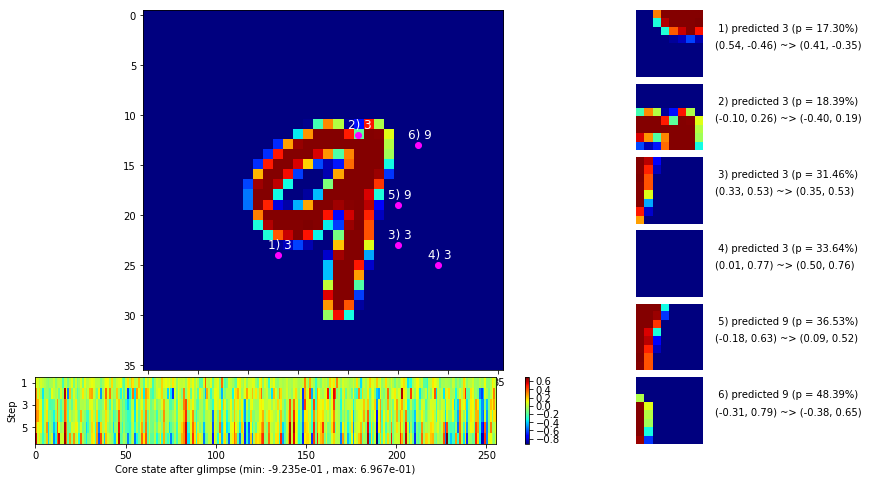

 b   1500/  3000 >> 196.8 ms/b | lr: 1.81e-04 | grad 2norm:  7.79 | grad inf norm:  1.896
       Weights || abs max:  0.72 (59313.84) | mean: -1.39e-03 ( 0.22) | var: 5.72e-03 (377937.69)
        Biases || abs max:  0.78 ( 2474.58) | mean:  2.31e-02 ( 2.36) | var: 2.09e-03 (68504.46)
                  class loss: 0.525 | steps: 2.660 | reward:  0.821 | acc.: 82.10%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 150.1 ms/b | lr: 1.79e-04 | grad 2norm:  7.74 | grad inf norm:  1.944
       Weights || abs max:  0.72 (50325.34) | mean: -1.46e-03 ( 0.21) | var: 5.77e-03 (100839.37)
        Biases || abs max:  0.78 ( 2568.84) | mean:  2.30e-02 ( 2.44) | var: 2.12e-03 (97360.19)
                  class loss: 0.529 | steps: 2.651 | reward:  0.819 | acc.: 81.87%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

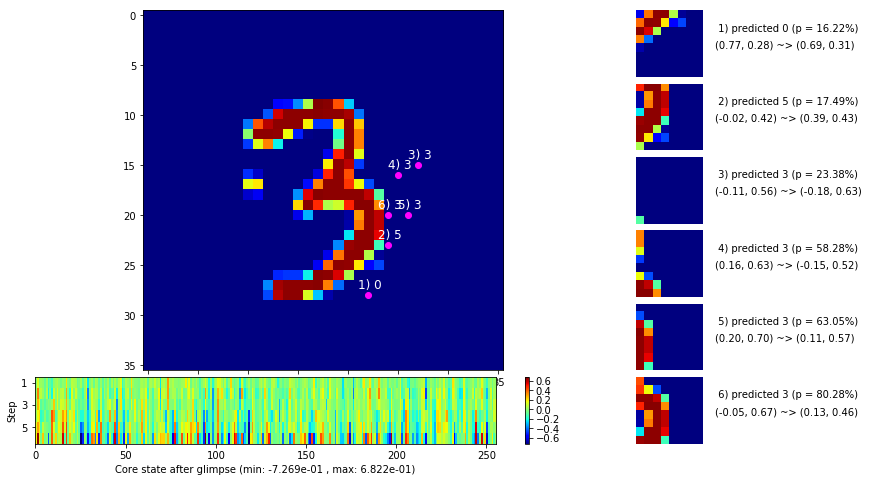

 b   2500/  3000 >> 145.1 ms/b | lr: 1.76e-04 | grad 2norm:  7.85 | grad inf norm:  1.927
       Weights || abs max:  0.73 (96173.41) | mean: -1.46e-03 ( 0.28) | var: 5.82e-03 (818911.12)
        Biases || abs max:  0.78 ( 2351.14) | mean:  2.29e-02 ( 2.70) | var: 2.14e-03 (56275.46)
                  class loss: 0.545 | steps: 2.693 | reward:  0.816 | acc.: 81.59%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.7 ms/b | lr: 1.74e-04 | grad 2norm:  7.70 | grad inf norm:  1.858
       Weights || abs max:  0.73 (27318.95) | mean: -1.45e-03 ( 0.16) | var: 5.86e-03 (15916.19)
        Biases || abs max:  0.78 (22725.46) | mean:  2.28e-02 (10.56) | var: 2.17e-03 (70588576.00)
                  class loss: 0.518 | steps: 2.665 | reward:  0.823 | acc.: 82.27%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

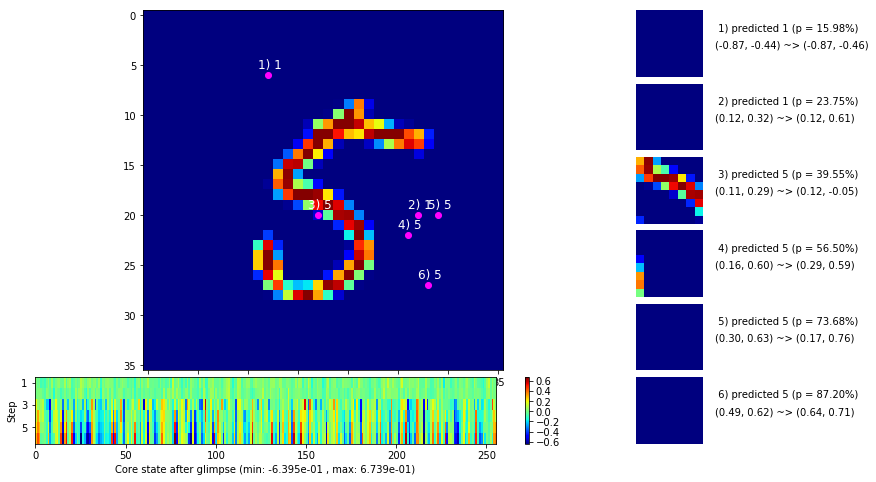

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


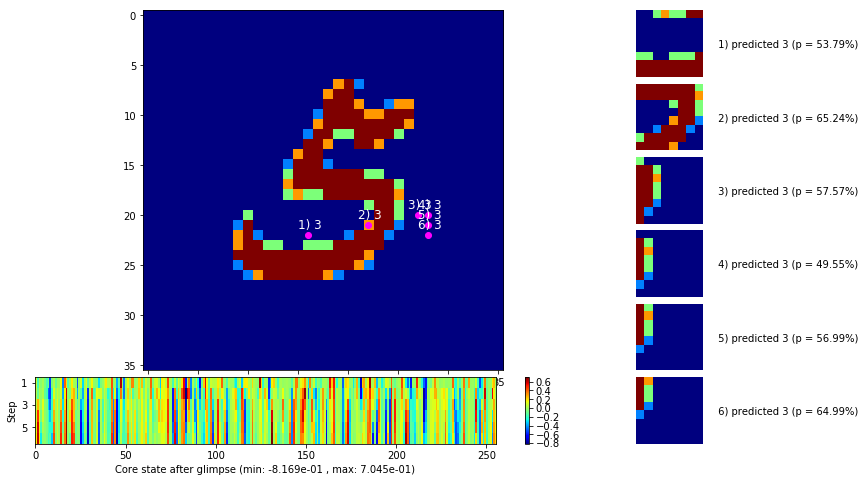


	Target class: 4  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


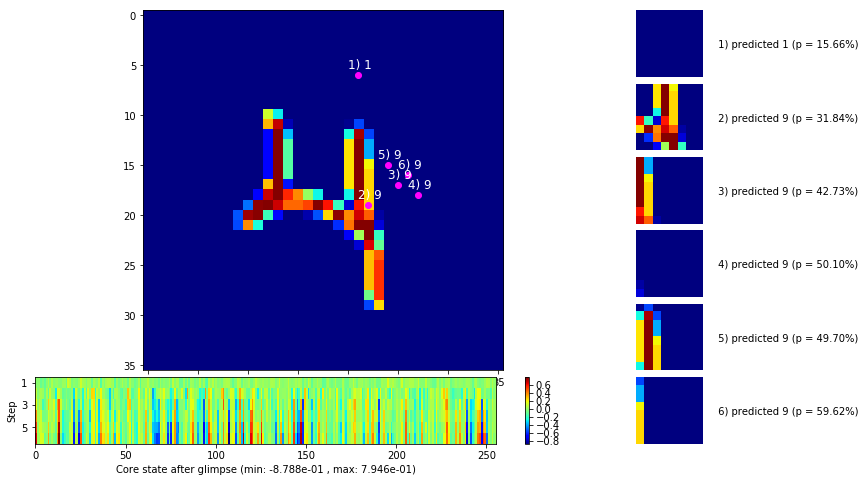

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


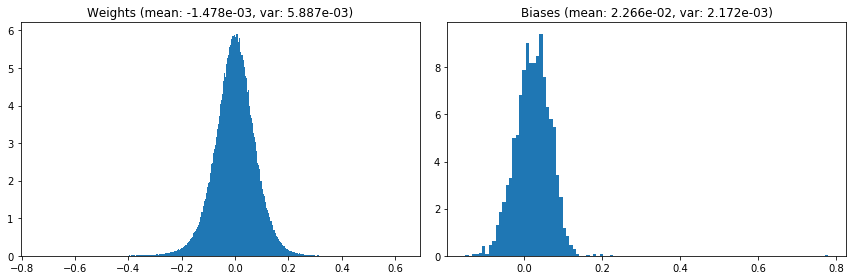

                                      Location network weights and biases


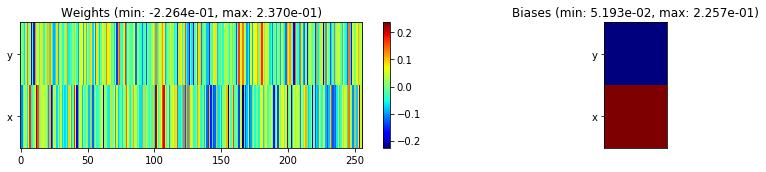

---------------------------------------------------------------------------------------------------------------
Elapsed time:  449.36 sec | TRAIN >> class loss: 0.5255 | steps:  2.671    | reward:  0.8206 :( | acc.: 82.060% :(
                          | VAL   >> class loss: 0.4803 | steps:  2.421 :( | reward:  0.8298 :( | acc.: 82.980% :(


Epoch  13/400) lr = 0.0001727
 b    500/  3000 >> 135.8 ms/b | lr: 1.71e-04 | grad 2norm:  7.54 | grad inf norm:  1.823
       Weights || abs max:  0.74 (52605.26) | mean: -1.42e-03 ( 0.20) | var: 5.91e-03 (167668.86)
        Biases || abs max:  0.78 ( 3297.55) | mean:  2.28e-02 ( 3.14) | var: 2.19e-03 (96942.26)
                  class loss: 0.507 | steps: 2.663 | reward:  0.828 | acc.: 82.84%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.8 ms/b | lr: 1.69e-04 | grad 2norm:  7.54 | grad inf norm:  1.819
       Weights || abs max:  0.74 (198514.38) | mean: -1.45e-03 ( 0.45)

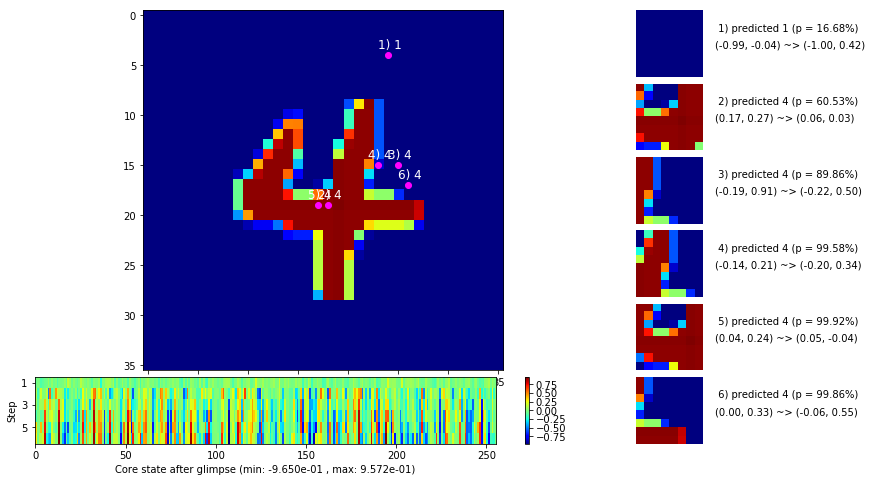

 b   1500/  3000 >> 136.7 ms/b | lr: 1.66e-04 | grad 2norm:  7.65 | grad inf norm:  1.939
       Weights || abs max:  0.75 (308928.44) | mean: -1.47e-03 ( 0.63) | var: 6.00e-03 (60847968.00)
        Biases || abs max:  0.79 ( 5906.80) | mean:  2.28e-02 ( 3.87) | var: 2.24e-03 (1061266.25)
                  class loss: 0.502 | steps: 2.663 | reward:  0.826 | acc.: 82.63%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.6 ms/b | lr: 1.64e-04 | grad 2norm:  7.63 | grad inf norm:  1.899
       Weights || abs max:  0.75 (370041.62) | mean: -1.51e-03 ( 0.73) | var: 6.04e-03 (95137352.00)
        Biases || abs max:  0.79 ( 2812.58) | mean:  2.27e-02 ( 2.44) | var: 2.26e-03 (50627.50)
                  class loss: 0.495 | steps: 2.661 | reward:  0.831 | acc.: 83.12%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0,

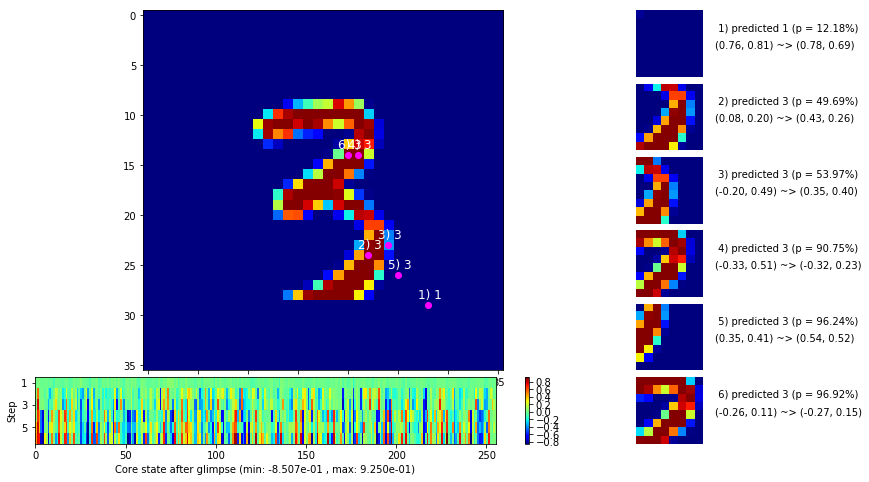

 b   2500/  3000 >> 137.2 ms/b | lr: 1.62e-04 | grad 2norm:  7.66 | grad inf norm:  1.803
       Weights || abs max:  0.75 (30827.63) | mean: -1.50e-03 ( 0.17) | var: 6.08e-03 (15209.61)
        Biases || abs max:  0.80 ( 5028.60) | mean:  2.26e-02 ( 4.21) | var: 2.27e-03 (1040714.75)
                  class loss: 0.488 | steps: 2.648 | reward:  0.833 | acc.: 83.30%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.3 ms/b | lr: 1.60e-04 | grad 2norm:  7.61 | grad inf norm:  1.874
       Weights || abs max:  0.75 (32064.04) | mean: -1.57e-03 ( 0.17) | var: 6.12e-03 (15943.24)
        Biases || abs max:  0.80 ( 5136.06) | mean:  2.25e-02 ( 3.91) | var: 2.30e-03 (152242.16)
                  class loss: 0.493 | steps: 2.647 | reward:  0.833 | acc.: 83.25%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

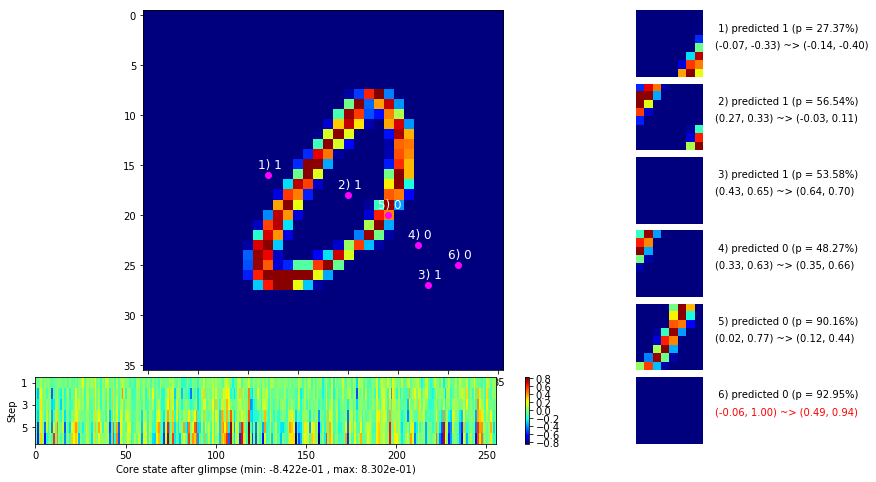

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


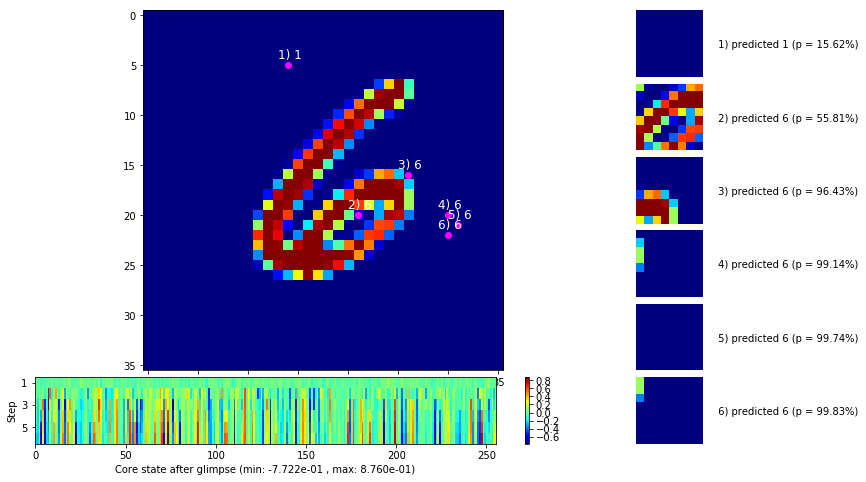


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


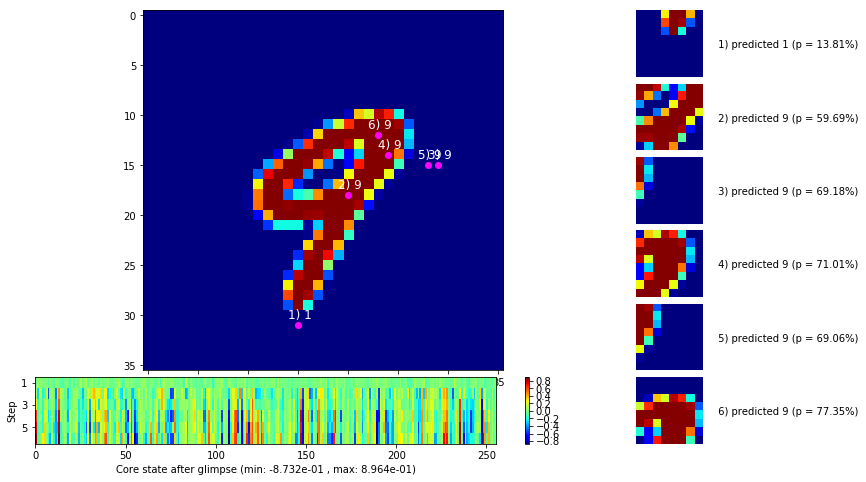

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


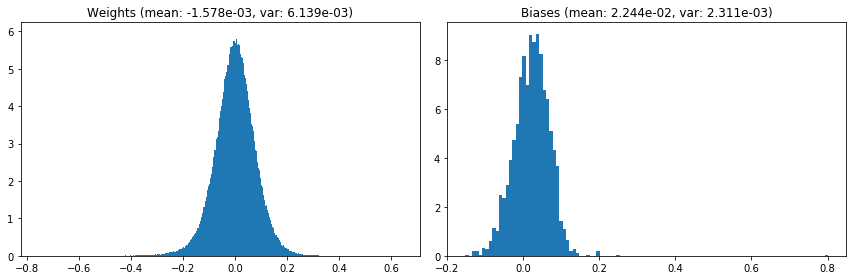

                                      Location network weights and biases


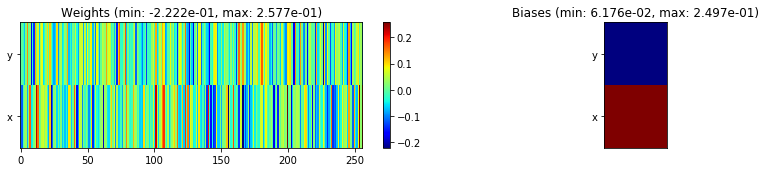

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.76 sec | TRAIN >> class loss: 0.4984 | steps:  2.661    | reward:  0.8294    | acc.: 82.940% 
                          | VAL   >> class loss: 0.4437 | steps:  2.371    | reward:  0.8468    | acc.: 84.680% 


Epoch  14/400) lr = 0.0001594
 b    500/  3000 >> 134.1 ms/b | lr: 1.58e-04 | grad 2norm:  7.49 | grad inf norm:  1.879
       Weights || abs max:  0.76 (23838.57) | mean: -1.59e-03 ( 0.15) | var: 6.16e-03 ( 7038.31)
        Biases || abs max:  0.80 ( 3613.42) | mean:  2.23e-02 ( 3.19) | var: 2.32e-03 (63229.18)
                  class loss: 0.510 | steps: 2.644 | reward:  0.826 | acc.: 82.58%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.3 ms/b | lr: 1.56e-04 | grad 2norm:  7.71 | grad inf norm:  1.890
       Weights || abs max:  0.76 (39726.50) | mean: -1.57e-03 ( 0.18) | var

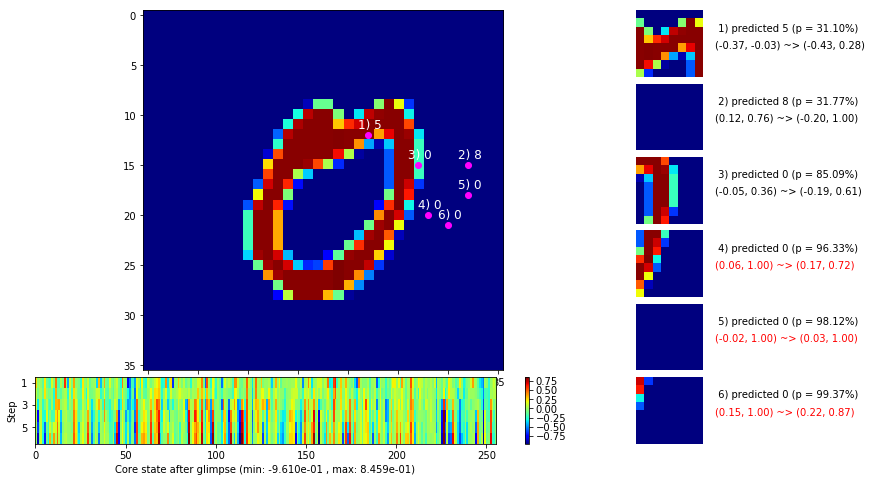

 b   1500/  3000 >> 135.7 ms/b | lr: 1.54e-04 | grad 2norm:  7.61 | grad inf norm:  1.850
       Weights || abs max:  0.76 (41215.01) | mean: -1.62e-03 ( 0.19) | var: 6.24e-03 (53326.02)
        Biases || abs max:  0.80 ( 5516.16) | mean:  2.22e-02 ( 3.77) | var: 2.38e-03 (1189051.25)
                  class loss: 0.499 | steps: 2.631 | reward:  0.828 | acc.: 82.82%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.6 ms/b | lr: 1.52e-04 | grad 2norm:  7.62 | grad inf norm:  1.874
       Weights || abs max:  0.76 (49732.87) | mean: -1.65e-03 ( 0.19) | var: 6.27e-03 (423957.66)
        Biases || abs max:  0.80 ( 2535.87) | mean:  2.21e-02 ( 2.49) | var: 2.40e-03 (52107.59)
                  class loss: 0.500 | steps: 2.647 | reward:  0.827 | acc.: 82.74%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

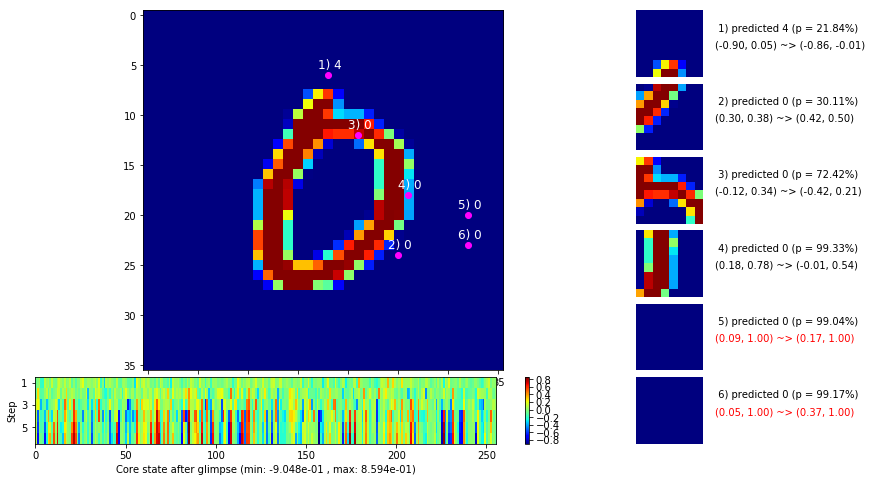

 b   2500/  3000 >> 136.9 ms/b | lr: 1.50e-04 | grad 2norm:  7.61 | grad inf norm:  1.899
       Weights || abs max:  0.77 (47491.16) | mean: -1.74e-03 ( 0.19) | var: 6.30e-03 (155911.20)
        Biases || abs max:  0.80 ( 3565.69) | mean:  2.20e-02 ( 3.31) | var: 2.42e-03 (284195.19)
                  class loss: 0.507 | steps: 2.675 | reward:  0.824 | acc.: 82.42%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.1 ms/b | lr: 1.49e-04 | grad 2norm:  7.53 | grad inf norm:  1.833
       Weights || abs max:  0.77 (38388.14) | mean: -1.76e-03 ( 0.17) | var: 6.34e-03 (66008.57)
        Biases || abs max:  0.80 (24457.69) | mean:  2.18e-02 (19.36) | var: 2.43e-03 (178781456.00)
                  class loss: 0.517 | steps: 2.668 | reward:  0.826 | acc.: 82.60%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0

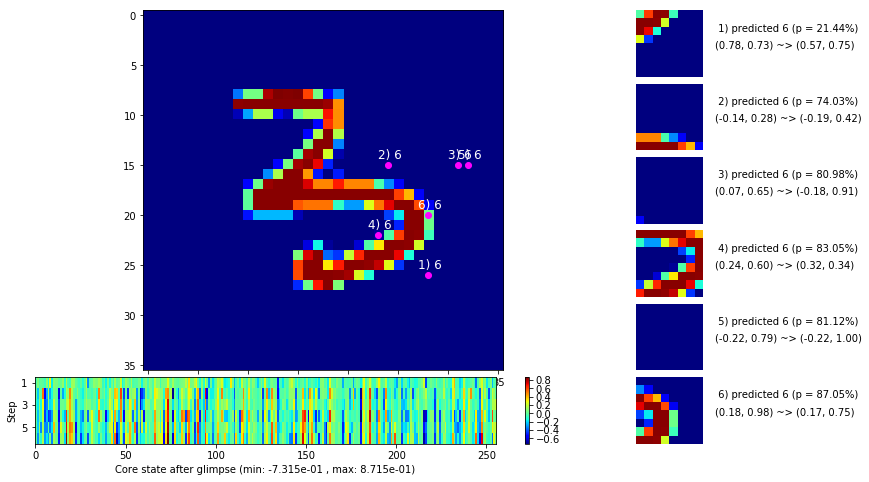

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


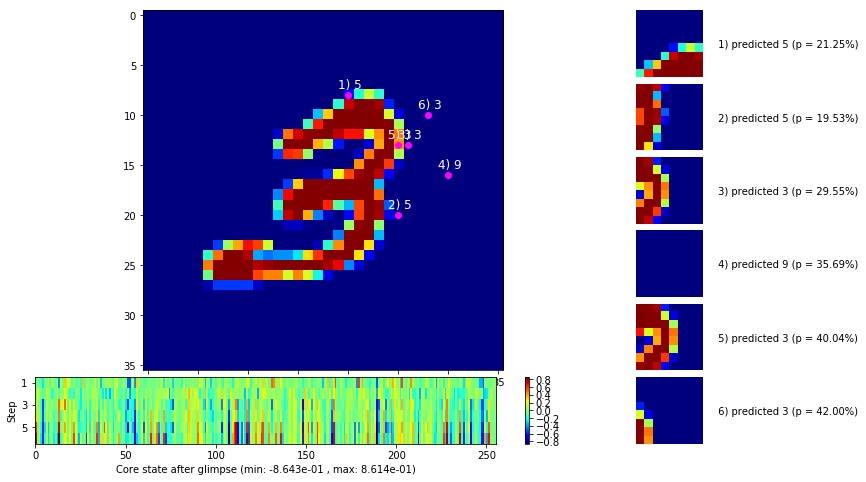


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


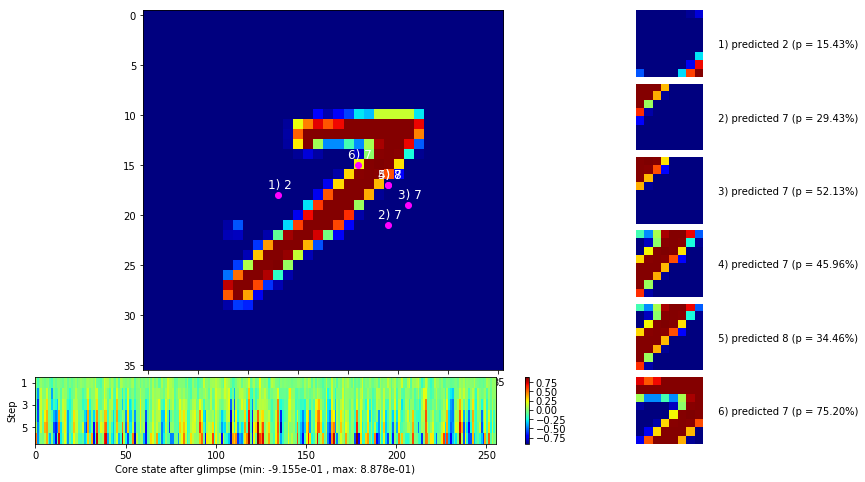

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


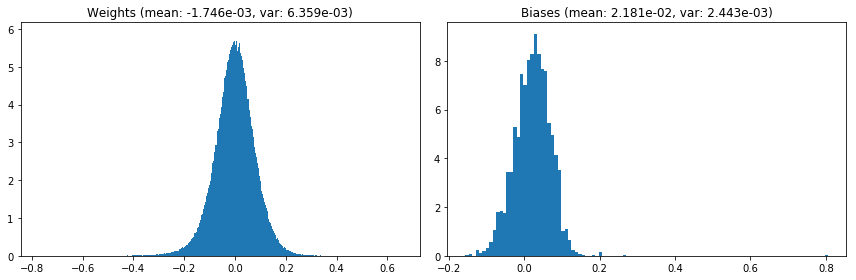

                                      Location network weights and biases


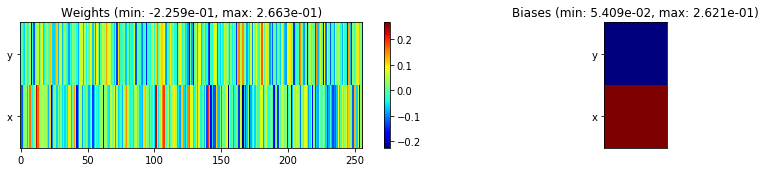

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.36 sec | TRAIN >> class loss: 0.5082 | steps:  2.651    | reward:  0.8258 :( | acc.: 82.578% :(
                          | VAL   >> class loss: 0.4532 | steps:  2.387 :( | reward:  0.8440 :( | acc.: 84.400% :(


Epoch  15/400) lr = 0.0001481
 b    500/  3000 >> 134.7 ms/b | lr: 1.47e-04 | grad 2norm:  7.63 | grad inf norm:  1.892
       Weights || abs max:  0.78 (28697.00) | mean: -1.73e-03 ( 0.16) | var: 6.38e-03 (15603.47)
        Biases || abs max:  0.81 ( 3491.46) | mean:  2.18e-02 ( 2.81) | var: 2.45e-03 (295010.44)
                  class loss: 0.491 | steps: 2.628 | reward:  0.829 | acc.: 82.90%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.7 ms/b | lr: 1.45e-04 | grad 2norm:  7.52 | grad inf norm:  1.868
       Weights || abs max:  0.78 (104388.84) | mean: -1.70e-03 ( 0.29)

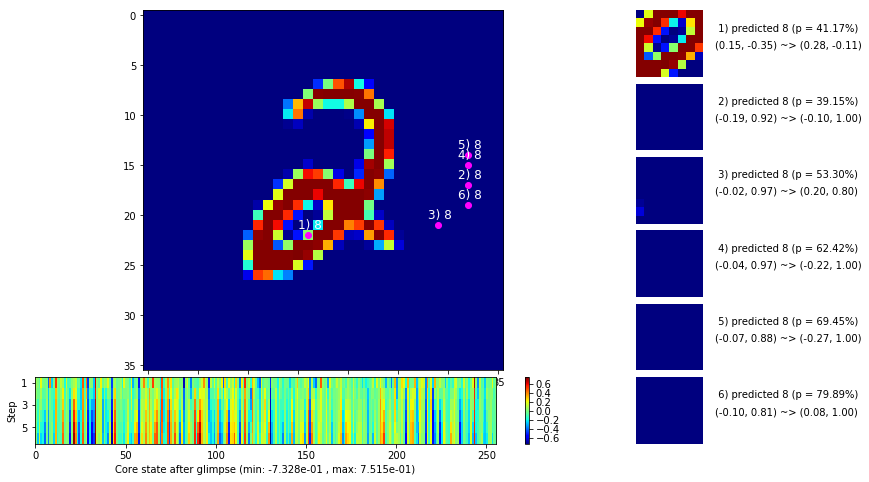

 b   1500/  3000 >> 134.0 ms/b | lr: 1.43e-04 | grad 2norm:  7.50 | grad inf norm:  1.868
       Weights || abs max:  0.78 (40945.61) | mean: -1.79e-03 ( 0.18) | var: 6.45e-03 (202638.45)
        Biases || abs max:  0.81 ( 3537.08) | mean:  2.17e-02 ( 2.82) | var: 2.49e-03 (118970.30)
                  class loss: 0.489 | steps: 2.655 | reward:  0.832 | acc.: 83.16%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.1 ms/b | lr: 1.42e-04 | grad 2norm:  7.31 | grad inf norm:  1.715
       Weights || abs max:  0.78 (27751.11) | mean: -1.82e-03 ( 0.16) | var: 6.48e-03 (25290.82)
        Biases || abs max:  0.82 ( 6064.90) | mean:  2.17e-02 ( 4.20) | var: 2.52e-03 (878436.62)
                  class loss: 0.483 | steps: 2.643 | reward:  0.839 | acc.: 83.89%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

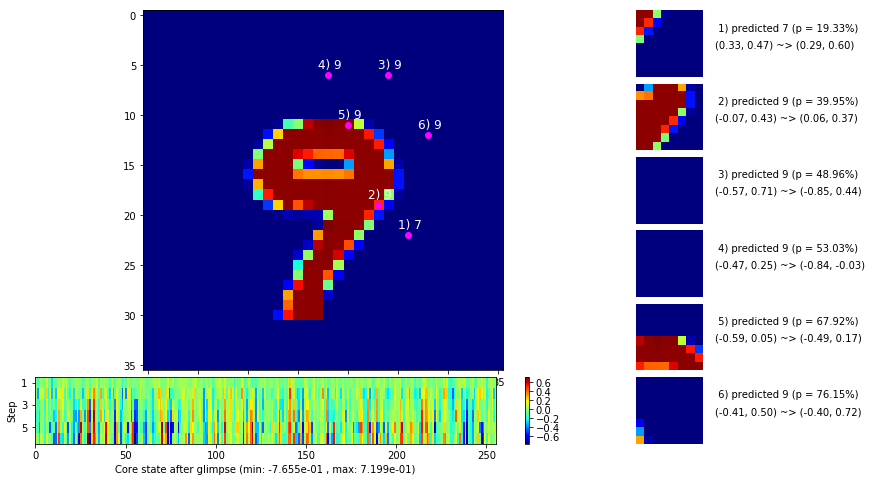

 b   2500/  3000 >> 133.9 ms/b | lr: 1.40e-04 | grad 2norm:  7.45 | grad inf norm:  1.840
       Weights || abs max:  0.79 (83873.40) | mean: -1.84e-03 ( 0.25) | var: 6.52e-03 (1896190.00)
        Biases || abs max:  0.82 ( 6922.55) | mean:  2.17e-02 ( 4.65) | var: 2.54e-03 (1380941.12)
                  class loss: 0.476 | steps: 2.618 | reward:  0.837 | acc.: 83.66%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.1 ms/b | lr: 1.39e-04 | grad 2norm:  7.32 | grad inf norm:  1.737
       Weights || abs max:  0.79 (46092.02) | mean: -1.82e-03 ( 0.19) | var: 6.55e-03 (204221.52)
        Biases || abs max:  0.82 ( 5259.48) | mean:  2.19e-02 ( 4.04) | var: 2.56e-03 (758069.75)
                  class loss: 0.467 | steps: 2.622 | reward:  0.840 | acc.: 84.04%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

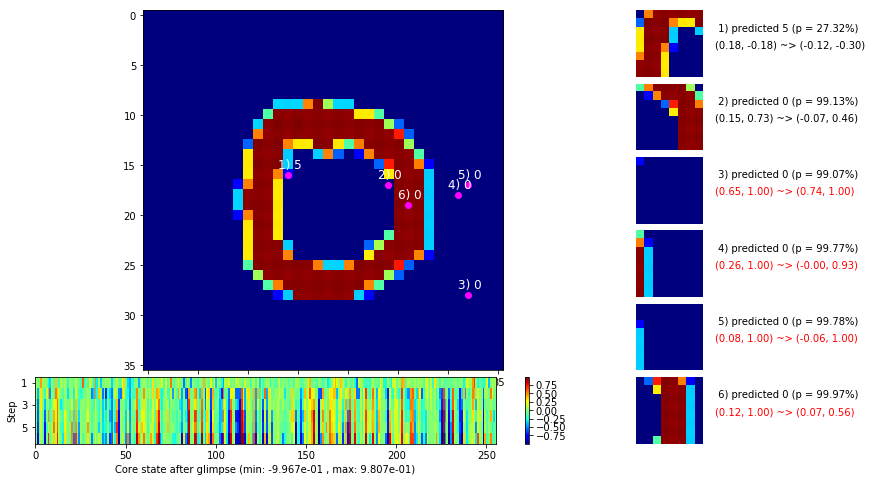

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


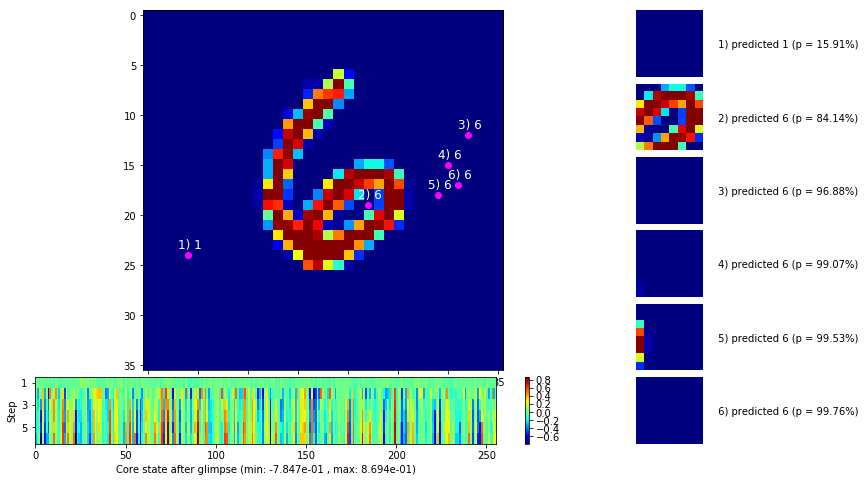


	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


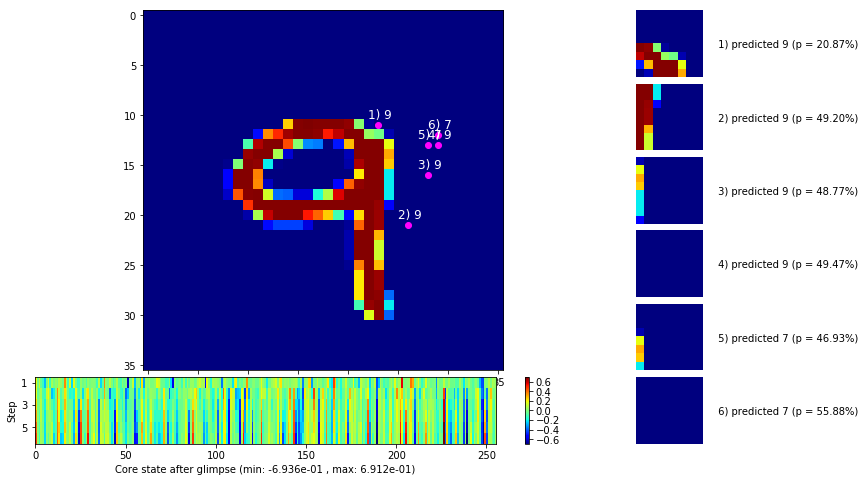

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


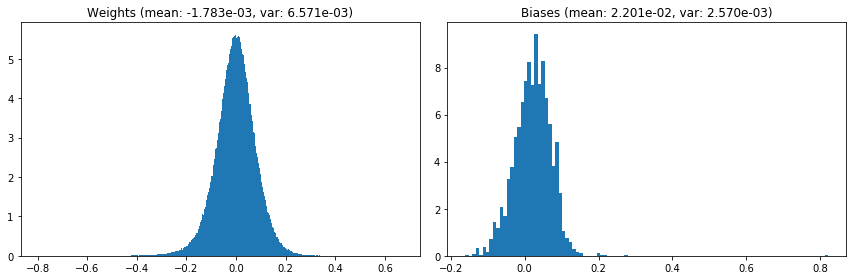

                                      Location network weights and biases


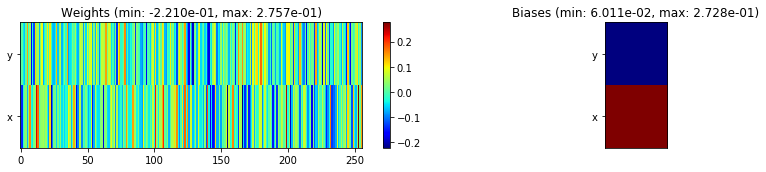

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.25 sec | TRAIN >> class loss: 0.4835 | steps:  2.637    | reward:  0.8352    | acc.: 83.517% 
                          | VAL   >> class loss: 0.4598 | steps:  2.385 :( | reward:  0.8456 :( | acc.: 84.560% :(


Epoch  16/400) lr = 0.0001383
 b    500/  3000 >> 130.2 ms/b | lr: 1.37e-04 | grad 2norm:  7.42 | grad inf norm:  1.858
       Weights || abs max:  0.80 (32880.59) | mean: -1.80e-03 ( 0.17) | var: 6.59e-03 (22170.39)
        Biases || abs max:  0.82 ( 3197.13) | mean:  2.19e-02 ( 2.75) | var: 2.58e-03 (86290.40)
                  class loss: 0.467 | steps: 2.622 | reward:  0.838 | acc.: 83.84%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 129.5 ms/b | lr: 1.36e-04 | grad 2norm:  7.46 | grad inf norm:  1.745
       Weights || abs max:  0.80 (29803.11) | mean: -1.79e-03 ( 0.16) | v

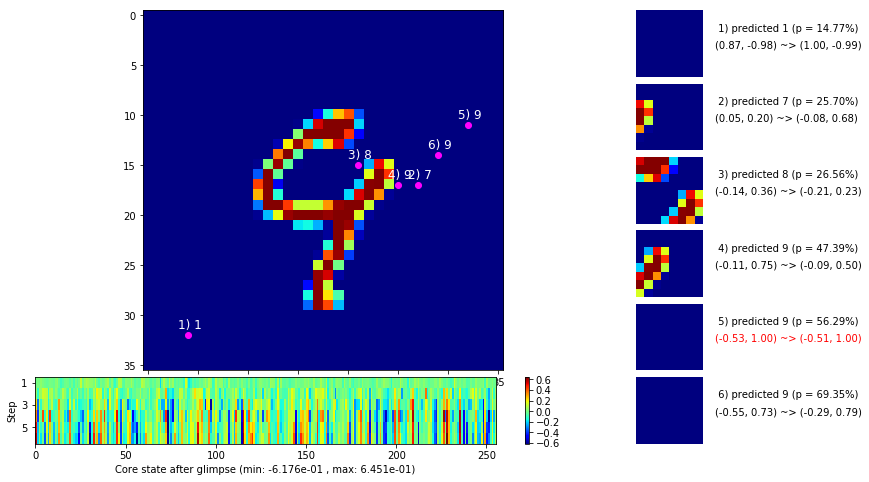

 b   1500/  3000 >> 131.3 ms/b | lr: 1.34e-04 | grad 2norm:  7.49 | grad inf norm:  1.834
       Weights || abs max:  0.80 (33301.82) | mean: -1.81e-03 ( 0.17) | var: 6.65e-03 (44695.88)
        Biases || abs max:  0.82 ( 3355.00) | mean:  2.19e-02 ( 2.91) | var: 2.62e-03 (81351.36)
                  class loss: 0.485 | steps: 2.664 | reward:  0.836 | acc.: 83.59%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 130.0 ms/b | lr: 1.33e-04 | grad 2norm:  7.42 | grad inf norm:  1.852
       Weights || abs max:  0.81 (42204.57) | mean: -1.83e-03 ( 0.18) | var: 6.68e-03 (65061.07)
        Biases || abs max:  0.82 ( 5260.72) | mean:  2.18e-02 ( 3.68) | var: 2.65e-03 (289710.88)
                  class loss: 0.472 | steps: 2.616 | reward:  0.840 | acc.: 84.02%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0

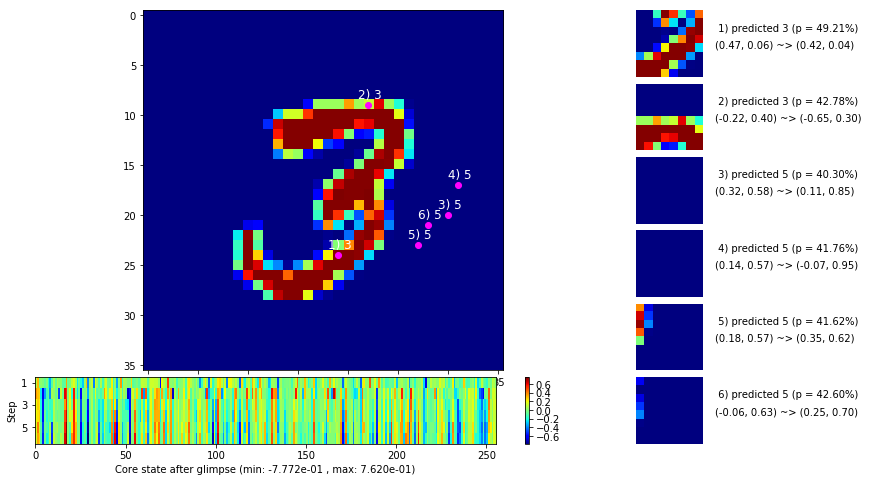

 b   2500/  3000 >> 131.7 ms/b | lr: 1.31e-04 | grad 2norm:  7.36 | grad inf norm:  1.782
       Weights || abs max:  0.81 (30823.07) | mean: -1.82e-03 ( 0.17) | var: 6.71e-03 (11591.23)
        Biases || abs max:  0.83 ( 6413.02) | mean:  2.18e-02 ( 4.29) | var: 2.66e-03 (583246.25)
                  class loss: 0.455 | steps: 2.602 | reward:  0.845 | acc.: 84.45%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.1 ms/b | lr: 1.30e-04 | grad 2norm:  7.27 | grad inf norm:  1.812
       Weights || abs max:  0.81 (69320.30) | mean: -1.85e-03 ( 0.22) | var: 6.74e-03 (679753.31)
        Biases || abs max:  0.83 (19556.56) | mean:  2.18e-02 (14.96) | var: 2.67e-03 (77640904.00)
                  class loss: 0.460 | steps: 2.609 | reward:  0.844 | acc.: 84.43%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

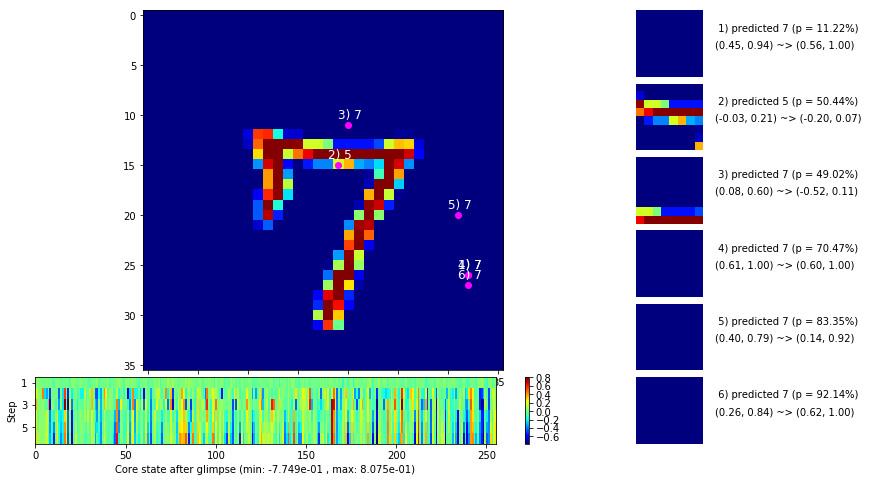

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


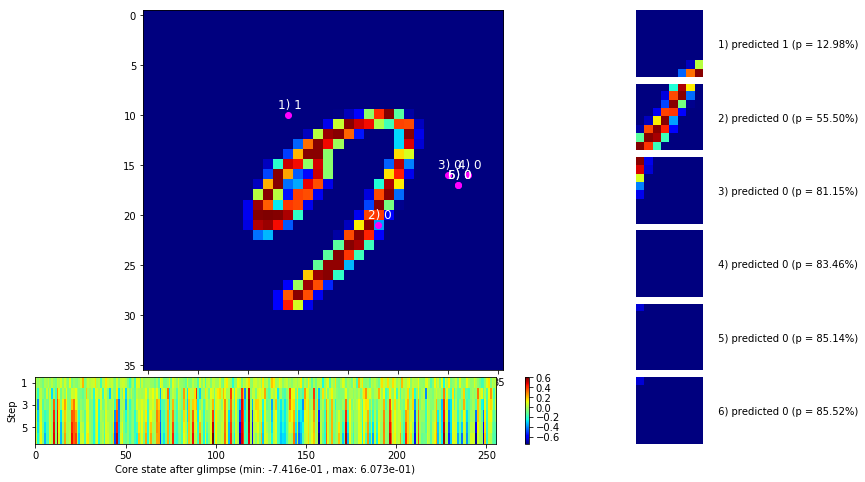


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


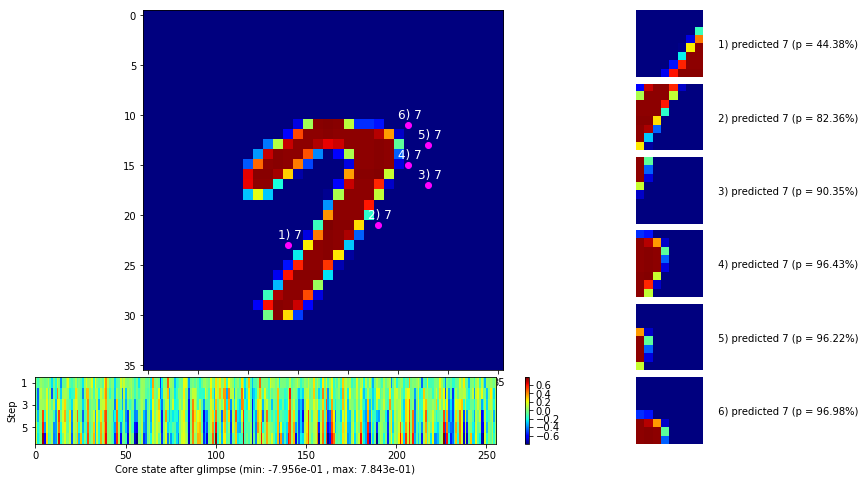

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


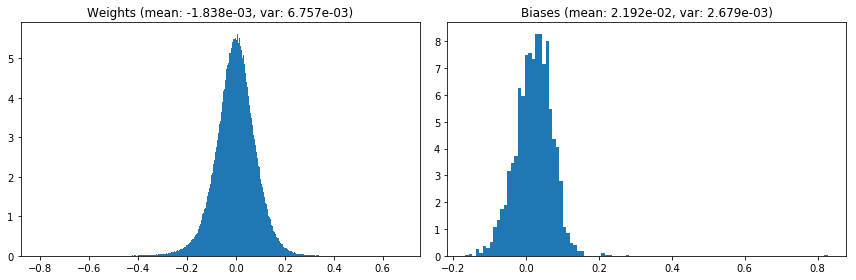

                                      Location network weights and biases


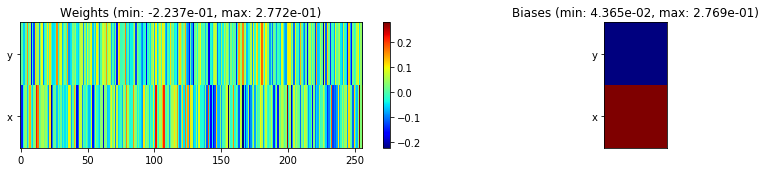

---------------------------------------------------------------------------------------------------------------
Elapsed time:  392.49 sec | TRAIN >> class loss: 0.4693 | steps:  2.626    | reward:  0.8399    | acc.: 83.988% 
                          | VAL   >> class loss: 0.4451 | steps:  2.396 :( | reward:  0.8496    | acc.: 84.960% 


Epoch  17/400) lr = 0.0001297
 b    500/  3000 >> 132.5 ms/b | lr: 1.29e-04 | grad 2norm:  7.55 | grad inf norm:  1.846
       Weights || abs max:  0.80 (40218.16) | mean: -1.85e-03 ( 0.18) | var: 6.77e-03 (79949.05)
        Biases || abs max:  0.83 ( 2675.66) | mean:  2.18e-02 ( 2.70) | var: 2.69e-03 (28950.86)
                  class loss: 0.482 | steps: 2.638 | reward:  0.834 | acc.: 83.42%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.4 ms/b | lr: 1.28e-04 | grad 2norm:  7.20 | grad inf norm:  1.748
       Weights || abs max:  0.81 (50251.46) | mean: -1.90e-03 ( 0.20) | var

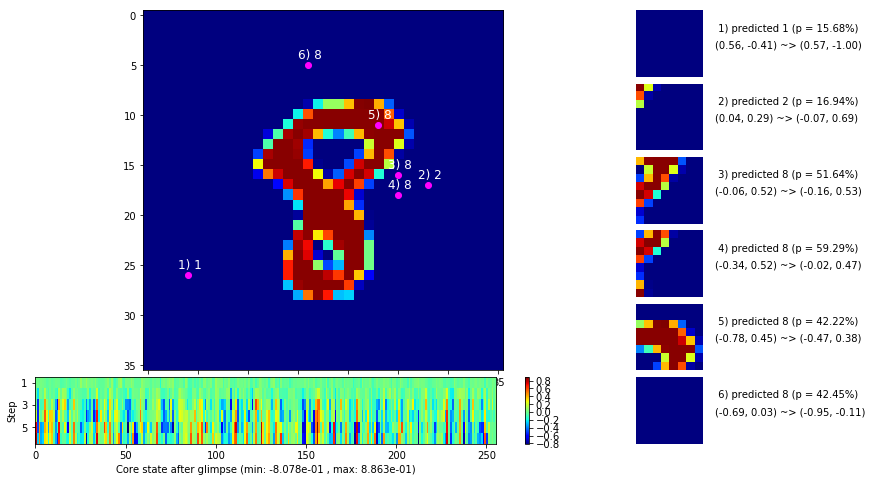

 b   1500/  3000 >> 131.7 ms/b | lr: 1.26e-04 | grad 2norm:  7.37 | grad inf norm:  1.810
       Weights || abs max:  0.80 (28470.27) | mean: -1.91e-03 ( 0.16) | var: 6.82e-03 (17865.83)
        Biases || abs max:  0.83 ( 5743.65) | mean:  2.16e-02 ( 4.09) | var: 2.72e-03 (580442.19)
                  class loss: 0.478 | steps: 2.611 | reward:  0.838 | acc.: 83.82%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.0 ms/b | lr: 1.25e-04 | grad 2norm:  7.34 | grad inf norm:  1.757
       Weights || abs max:  0.81 (36041.30) | mean: -1.91e-03 ( 0.17) | var: 6.85e-03 (46333.52)
        Biases || abs max:  0.83 ( 5954.78) | mean:  2.16e-02 ( 4.21) | var: 2.74e-03 (620922.94)
                  class loss: 0.471 | steps: 2.591 | reward:  0.843 | acc.: 84.31%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

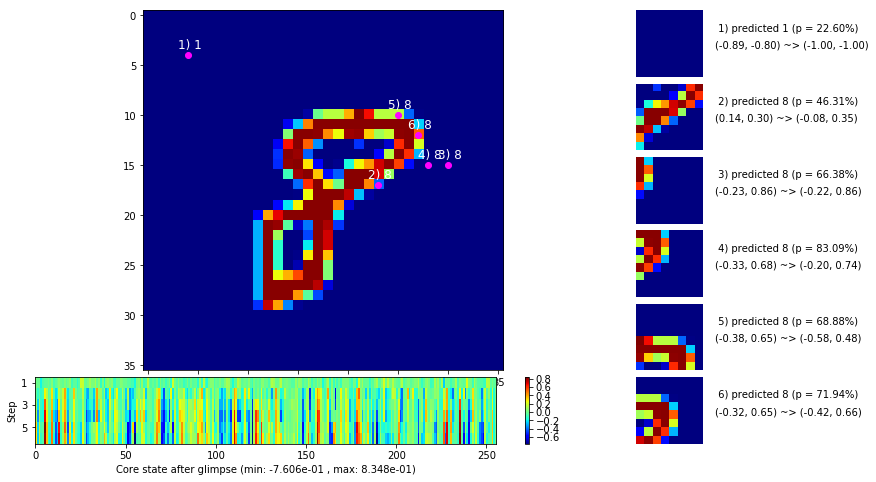

 b   2500/  3000 >> 130.9 ms/b | lr: 1.24e-04 | grad 2norm:  7.39 | grad inf norm:  1.848
       Weights || abs max:  0.81 (169975.72) | mean: -1.96e-03 ( 0.40) | var: 6.88e-03 (9991411.00)
        Biases || abs max:  0.83 (11513.71) | mean:  2.14e-02 ( 6.47) | var: 2.75e-03 (11804108.00)
                  class loss: 0.476 | steps: 2.603 | reward:  0.839 | acc.: 83.89%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 129.9 ms/b | lr: 1.23e-04 | grad 2norm:  7.31 | grad inf norm:  1.814
       Weights || abs max:  0.81 (84774.14) | mean: -2.00e-03 ( 0.25) | var: 6.90e-03 (1019568.12)
        Biases || abs max:  0.83 ( 4077.18) | mean:  2.13e-02 ( 3.08) | var: 2.76e-03 (449577.22)
                  class loss: 0.464 | steps: 2.608 | reward:  0.841 | acc.: 84.05%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 

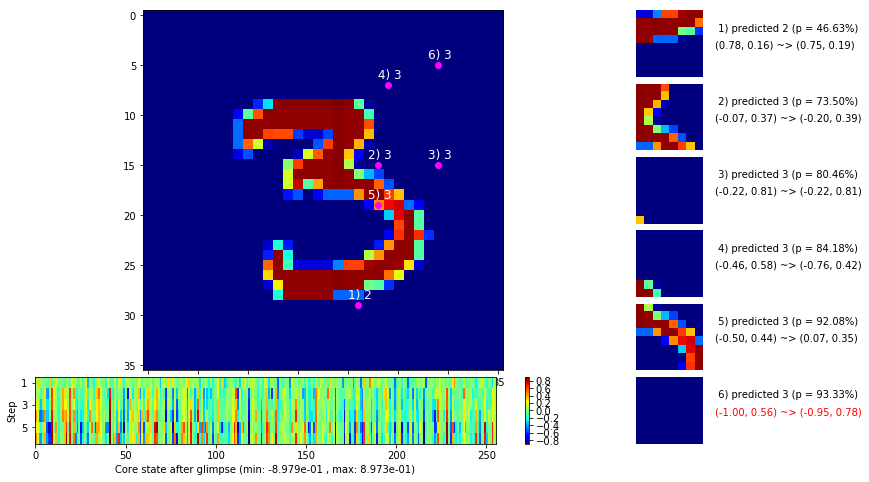

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


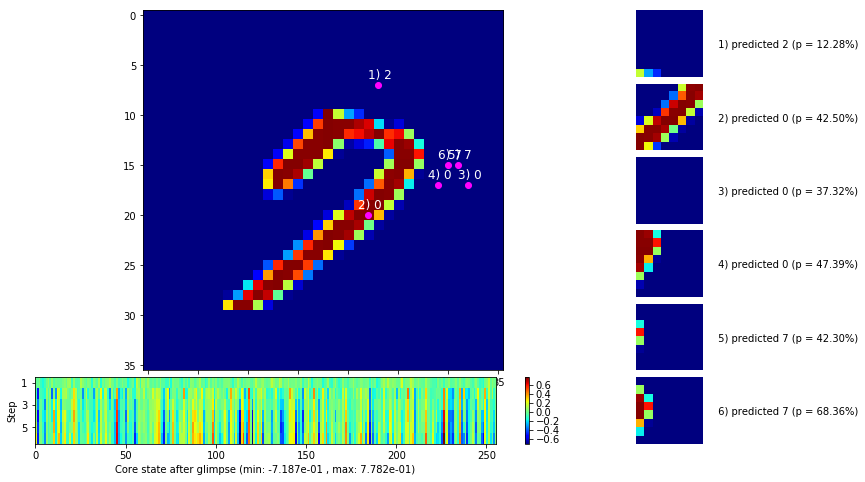


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


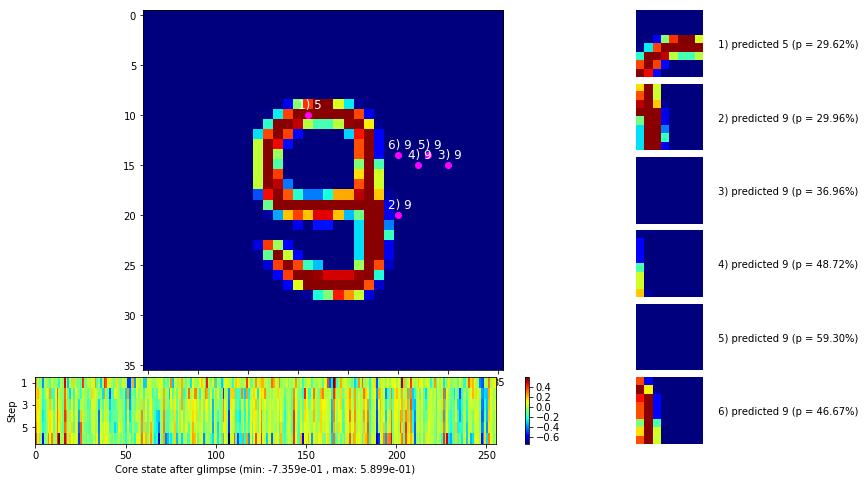

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


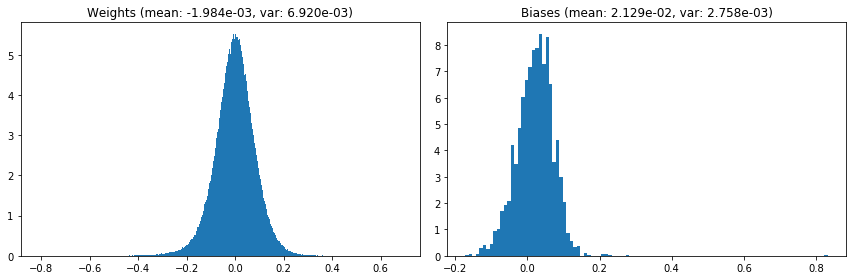

                                      Location network weights and biases


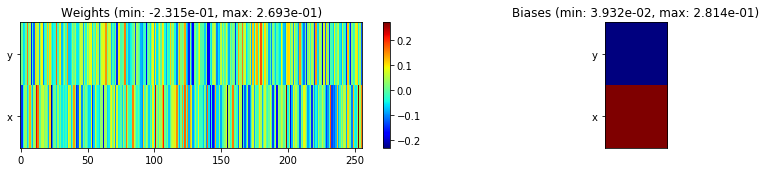

---------------------------------------------------------------------------------------------------------------
Elapsed time:  394.31 sec | TRAIN >> class loss: 0.4711 | steps:  2.606    | reward:  0.8409    | acc.: 84.093% 
                          | VAL   >> class loss: 0.4405 | steps:  2.399 :( | reward:  0.8484 :( | acc.: 84.840% :(


Epoch  18/400) lr = 0.0001221
 b    500/  3000 >> 130.3 ms/b | lr: 1.21e-04 | grad 2norm:  7.43 | grad inf norm:  1.816
       Weights || abs max:  0.81 (38611.70) | mean: -1.97e-03 ( 0.17) | var: 6.94e-03 (53289.14)
        Biases || abs max:  0.83 ( 2722.82) | mean:  2.14e-02 ( 2.47) | var: 2.78e-03 (90793.65)
                  class loss: 0.471 | steps: 2.619 | reward:  0.839 | acc.: 83.86%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.9 ms/b | lr: 1.20e-04 | grad 2norm:  7.38 | grad inf norm:  1.831
       Weights || abs max:  0.81 (25342.61) | mean: -1.99e-03 ( 0.15) | v

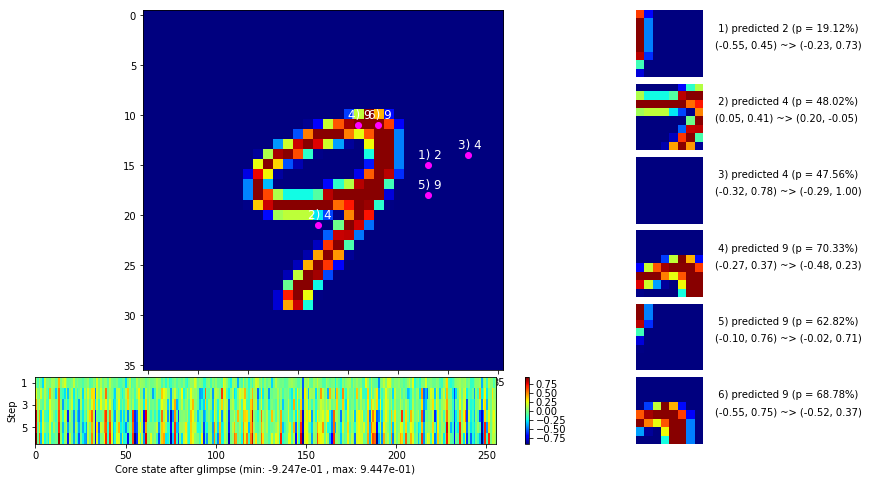

 b   1500/  3000 >> 133.2 ms/b | lr: 1.19e-04 | grad 2norm:  7.51 | grad inf norm:  1.889
       Weights || abs max:  0.82 (34048.54) | mean: -2.05e-03 ( 0.17) | var: 6.99e-03 (14164.18)
        Biases || abs max:  0.83 ( 3112.31) | mean:  2.13e-02 ( 2.80) | var: 2.81e-03 (39842.81)
                  class loss: 0.490 | steps: 2.639 | reward:  0.833 | acc.: 83.32%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.9 ms/b | lr: 1.18e-04 | grad 2norm:  7.26 | grad inf norm:  1.761
       Weights || abs max:  0.82 (48294.91) | mean: -2.07e-03 ( 0.20) | var: 7.01e-03 (104867.61)
        Biases || abs max:  0.83 ( 2355.94) | mean:  2.12e-02 ( 2.33) | var: 2.83e-03 (61878.11)
                  class loss: 0.460 | steps: 2.598 | reward:  0.845 | acc.: 84.45%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

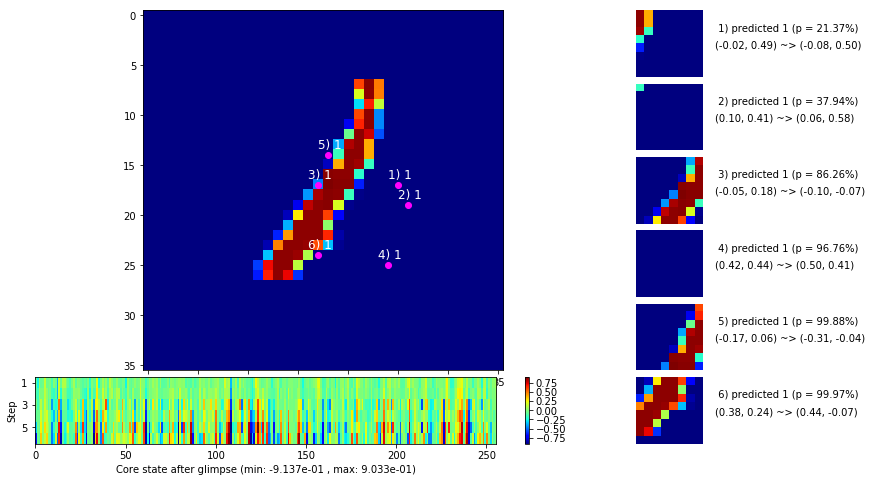

 b   2500/  3000 >> 134.1 ms/b | lr: 1.17e-04 | grad 2norm:  7.28 | grad inf norm:  1.794
       Weights || abs max:  0.82 (415207.53) | mean: -2.10e-03 ( 0.81) | var: 7.04e-03 (104435720.00)
        Biases || abs max:  0.84 ( 7062.48) | mean:  2.11e-02 ( 4.15) | var: 2.84e-03 (1796409.25)
                  class loss: 0.456 | steps: 2.612 | reward:  0.843 | acc.: 84.31%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.8 ms/b | lr: 1.16e-04 | grad 2norm:  7.34 | grad inf norm:  1.773
       Weights || abs max:  0.82 (51479.11) | mean: -2.09e-03 ( 0.20) | var: 7.06e-03 (347799.25)
        Biases || abs max:  0.84 ( 4538.77) | mean:  2.11e-02 ( 3.15) | var: 2.85e-03 (177359.88)
                  class loss: 0.464 | steps: 2.604 | reward:  0.841 | acc.: 84.09%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 

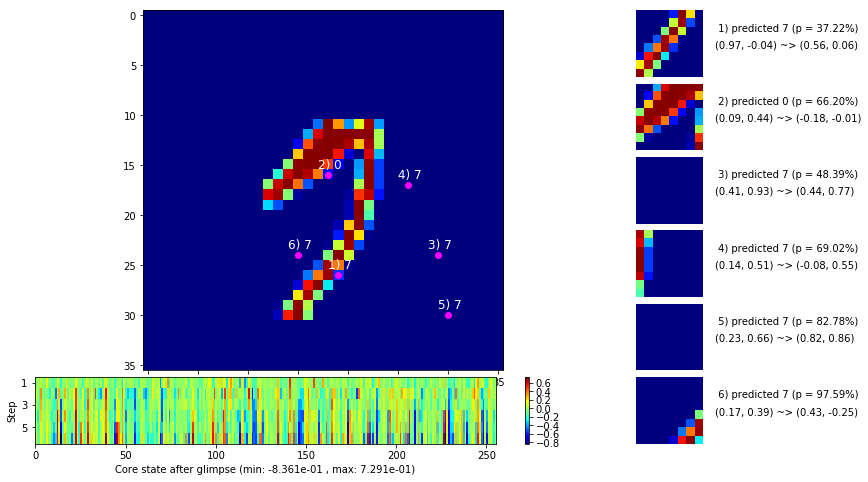

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


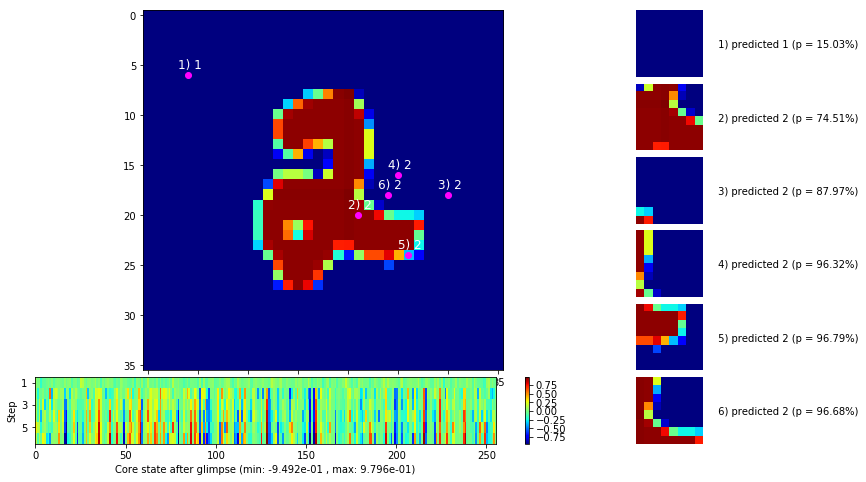


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


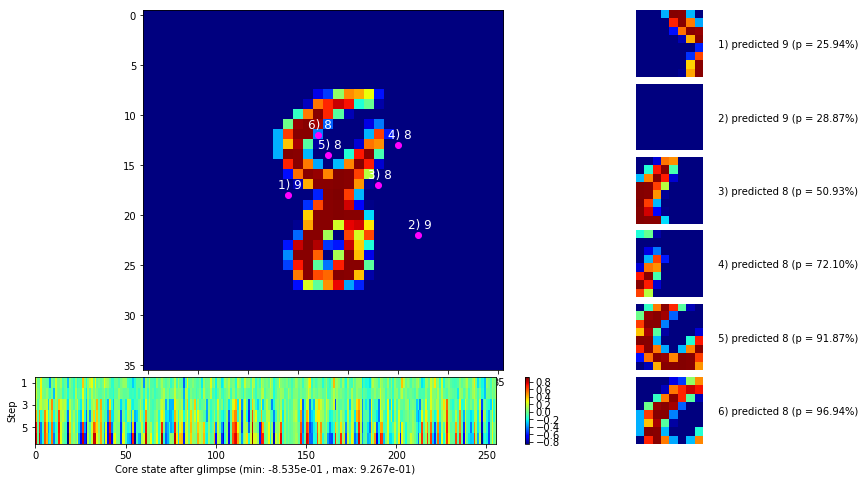

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


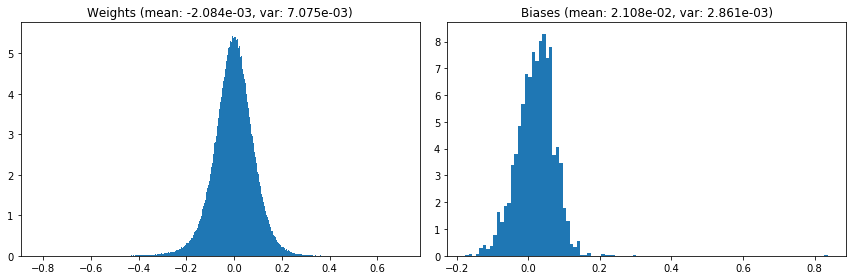

                                      Location network weights and biases


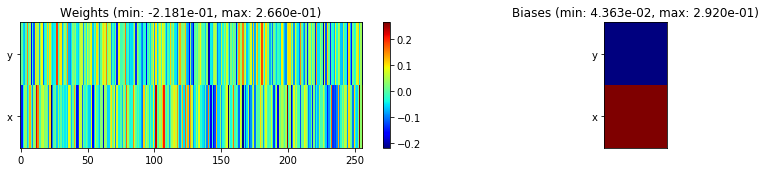

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.12 sec | TRAIN >> class loss: 0.4671 | steps:  2.613 :( | reward:  0.8407 :( | acc.: 84.073% :(
                          | VAL   >> class loss: 0.4034 | steps:  2.370    | reward:  0.8612    | acc.: 86.120% 


Epoch  19/400) lr = 0.0001153
 b    500/  3000 >> 130.3 ms/b | lr: 1.14e-04 | grad 2norm:  7.19 | grad inf norm:  1.795
       Weights || abs max:  0.82 (89114.64) | mean: -2.11e-03 ( 0.26) | var: 7.09e-03 (2239252.50)
        Biases || abs max:  0.84 ( 3215.01) | mean:  2.10e-02 ( 2.69) | var: 2.87e-03 (186097.56)
                  class loss: 0.456 | steps: 2.609 | reward:  0.846 | acc.: 84.64%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 130.3 ms/b | lr: 1.14e-04 | grad 2norm:  7.29 | grad inf norm:  1.785
       Weights || abs max:  0.82 (49002.52) | mean: -2.06e-03 ( 0.20) 

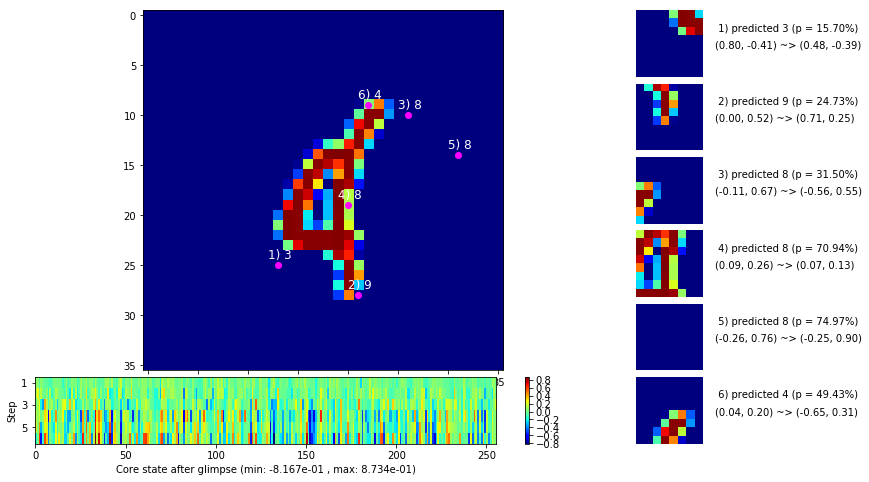

 b   1500/  3000 >> 131.4 ms/b | lr: 1.12e-04 | grad 2norm:  7.42 | grad inf norm:  1.826
       Weights || abs max:  0.82 (53547.61) | mean: -2.06e-03 ( 0.20) | var: 7.14e-03 (571433.56)
        Biases || abs max:  0.84 ( 4814.13) | mean:  2.13e-02 ( 3.31) | var: 2.91e-03 (231255.58)
                  class loss: 0.455 | steps: 2.604 | reward:  0.841 | acc.: 84.08%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 130.0 ms/b | lr: 1.12e-04 | grad 2norm:  7.30 | grad inf norm:  1.861
       Weights || abs max:  0.83 (27862.53) | mean: -2.08e-03 ( 0.16) | var: 7.16e-03 (17375.13)
        Biases || abs max:  0.84 ( 4661.13) | mean:  2.11e-02 ( 3.27) | var: 2.91e-03 (391239.84)
                  class loss: 0.465 | steps: 2.621 | reward:  0.843 | acc.: 84.25%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

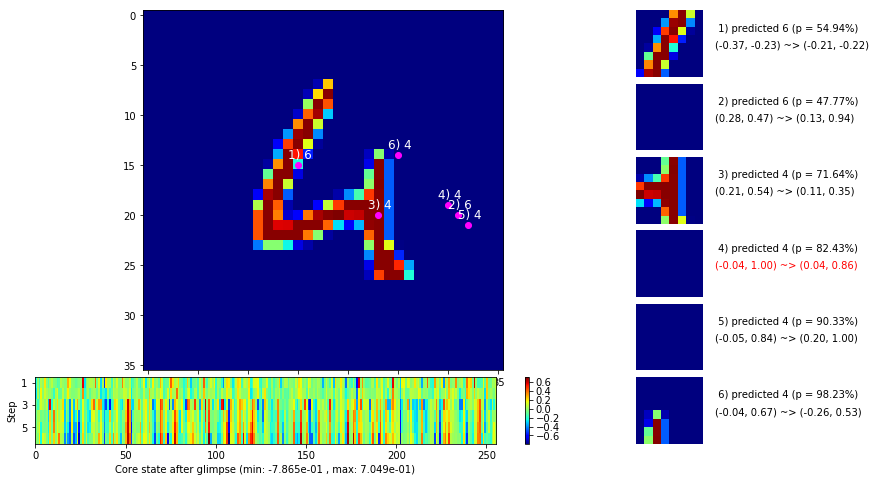

 b   2500/  3000 >> 132.4 ms/b | lr: 1.10e-04 | grad 2norm:  7.38 | grad inf norm:  1.767
       Weights || abs max:  0.83 (26866.76) | mean: -2.06e-03 ( 0.15) | var: 7.19e-03 (13375.29)
        Biases || abs max:  0.84 ( 2683.54) | mean:  2.12e-02 ( 2.62) | var: 2.93e-03 (33809.15)
                  class loss: 0.473 | steps: 2.605 | reward:  0.840 | acc.: 83.96%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.7 ms/b | lr: 1.10e-04 | grad 2norm:  7.39 | grad inf norm:  1.863
       Weights || abs max:  0.83 (49860.45) | mean: -2.06e-03 ( 0.20) | var: 7.21e-03 (199577.88)
        Biases || abs max:  0.84 ( 2795.47) | mean:  2.12e-02 ( 2.66) | var: 2.95e-03 (70950.82)
                  class loss: 0.457 | steps: 2.585 | reward:  0.838 | acc.: 83.84%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

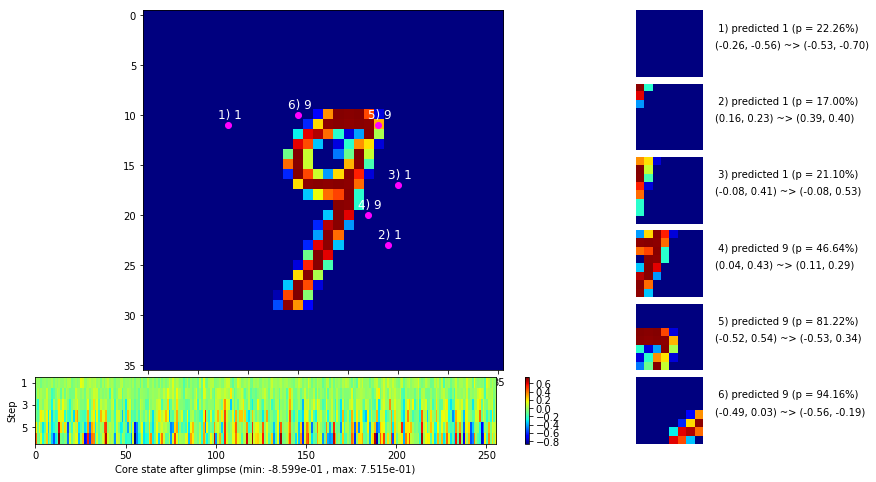

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


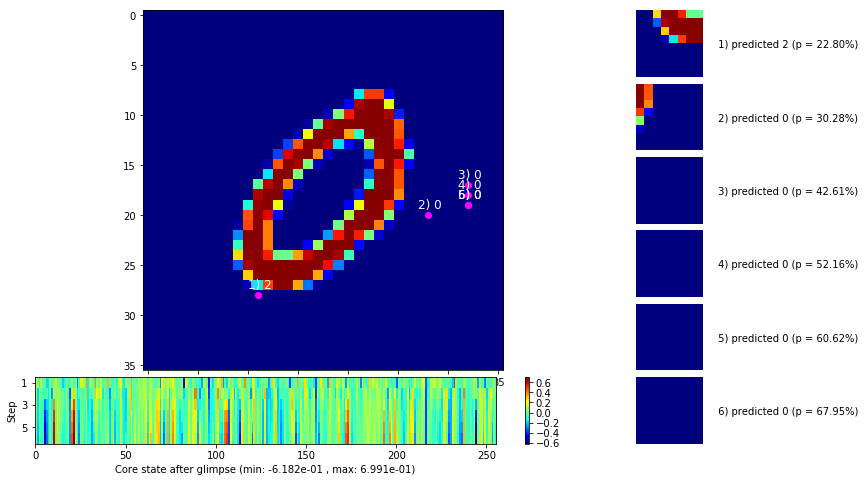


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


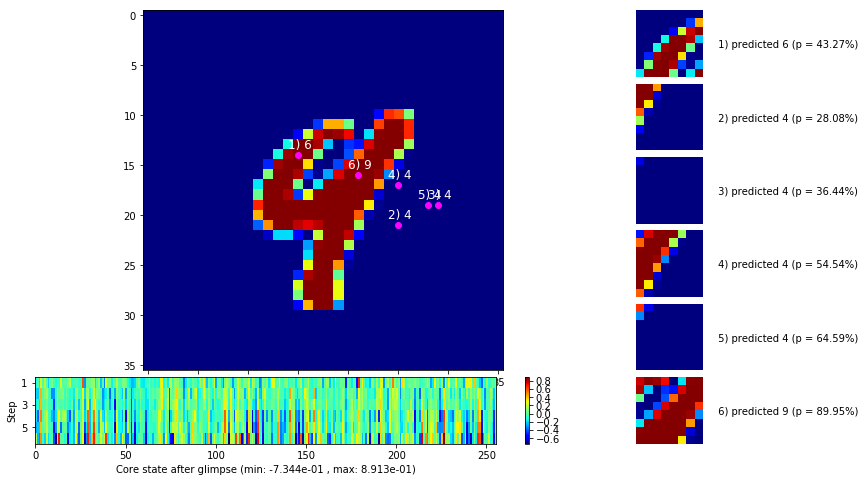

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


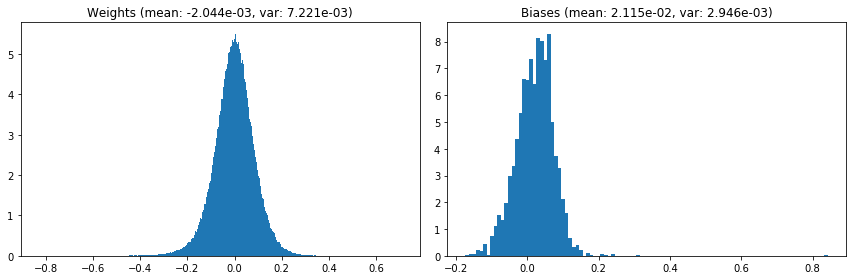

                                      Location network weights and biases


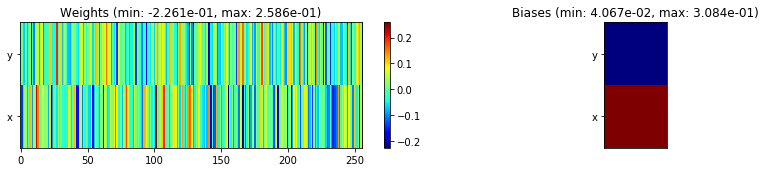

---------------------------------------------------------------------------------------------------------------
Elapsed time:  393.53 sec | TRAIN >> class loss: 0.4594 | steps:  2.605    | reward:  0.8425    | acc.: 84.250% 
                          | VAL   >> class loss: 0.4297 | steps:  2.415 :( | reward:  0.8540 :( | acc.: 85.400% :(


Epoch  20/400) lr = 0.0001093
 b    500/  3000 >> 132.3 ms/b | lr: 1.09e-04 | grad 2norm:  7.39 | grad inf norm:  1.790
       Weights || abs max:  0.83 (42517.54) | mean: -2.08e-03 ( 0.18) | var: 7.23e-03 (63342.45)
        Biases || abs max:  0.84 ( 3930.72) | mean:  2.10e-02 ( 3.20) | var: 2.96e-03 (127388.18)
                  class loss: 0.472 | steps: 2.615 | reward:  0.838 | acc.: 83.75%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.9 ms/b | lr: 1.08e-04 | grad 2norm:  7.26 | grad inf norm:  1.802
       Weights || abs max:  0.83 (25591.36) | mean: -2.13e-03 ( 0.15) | 

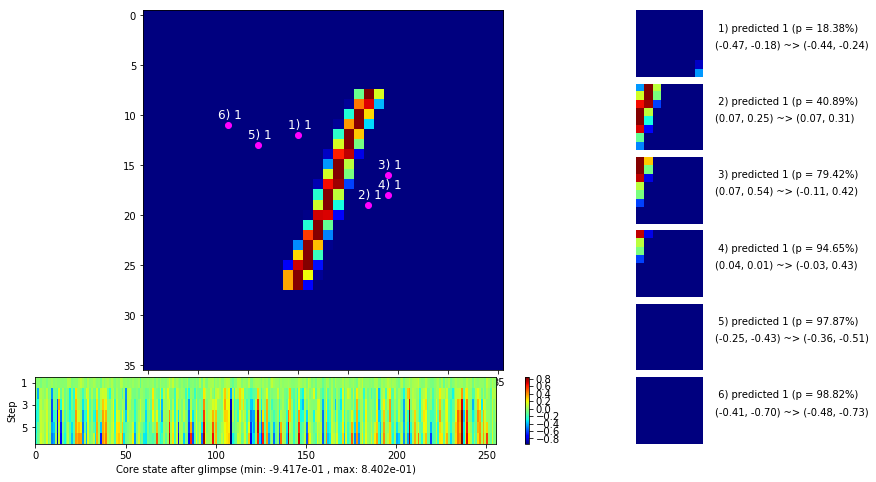

 b   1500/  3000 >> 130.5 ms/b | lr: 1.07e-04 | grad 2norm:  7.08 | grad inf norm:  1.705
       Weights || abs max:  0.83 (61212.95) | mean: -2.09e-03 ( 0.22) | var: 7.28e-03 (370806.75)
        Biases || abs max:  0.84 ( 2488.36) | mean:  2.11e-02 ( 2.21) | var: 2.99e-03 (48789.97)
                  class loss: 0.445 | steps: 2.573 | reward:  0.849 | acc.: 84.91%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 130.4 ms/b | lr: 1.06e-04 | grad 2norm:  7.31 | grad inf norm:  1.817
       Weights || abs max:  0.83 (34485.15) | mean: -2.08e-03 ( 0.17) | var: 7.30e-03 (31597.94)
        Biases || abs max:  0.85 ( 3587.30) | mean:  2.12e-02 ( 2.51) | var: 3.00e-03 (174692.55)
                  class loss: 0.443 | steps: 2.584 | reward:  0.844 | acc.: 84.44%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

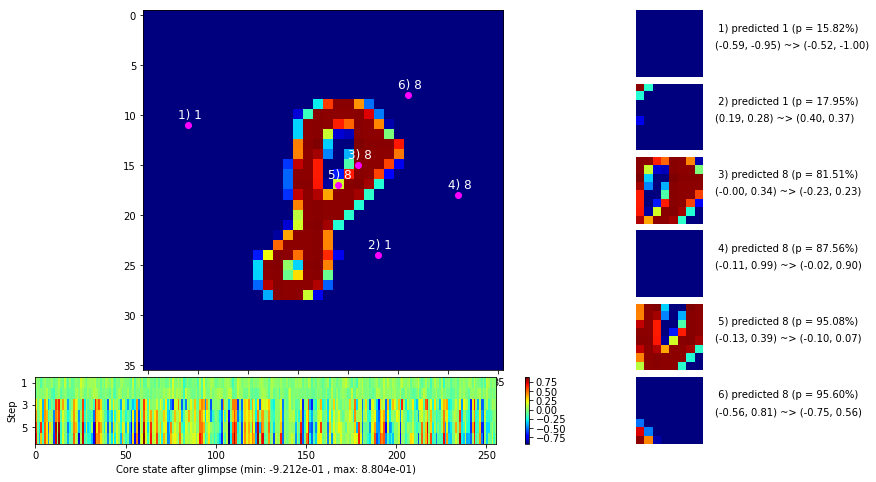

 b   2500/  3000 >> 131.9 ms/b | lr: 1.05e-04 | grad 2norm:  7.21 | grad inf norm:  1.735
       Weights || abs max:  0.83 (73786.62) | mean: -2.08e-03 ( 0.24) | var: 7.32e-03 (1268596.62)
        Biases || abs max:  0.85 ( 5155.94) | mean:  2.12e-02 ( 3.30) | var: 3.01e-03 (1153223.12)
                  class loss: 0.441 | steps: 2.585 | reward:  0.851 | acc.: 85.07%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 130.8 ms/b | lr: 1.04e-04 | grad 2norm:  7.32 | grad inf norm:  1.779
       Weights || abs max:  0.84 (37459.62) | mean: -2.10e-03 ( 0.17) | var: 7.34e-03 (67892.80)
        Biases || abs max:  0.85 ( 3437.91) | mean:  2.12e-02 ( 2.73) | var: 3.02e-03 (264342.44)
                  class loss: 0.453 | steps: 2.596 | reward:  0.845 | acc.: 84.45%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

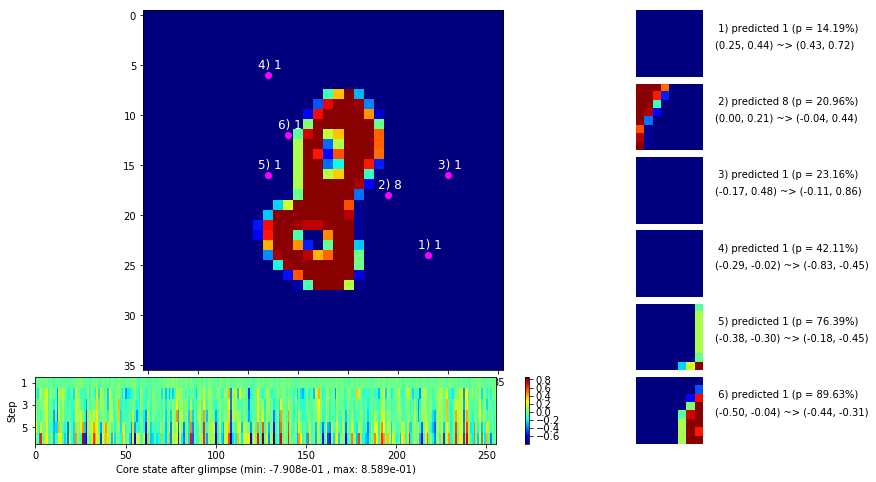

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


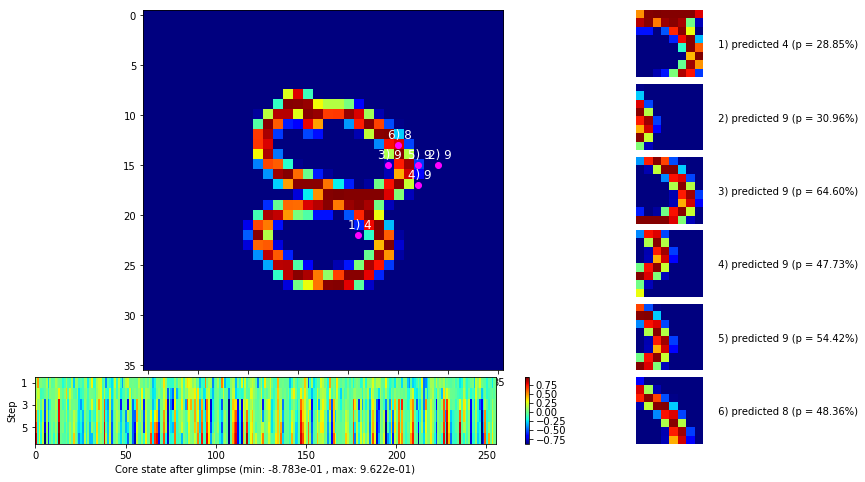


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


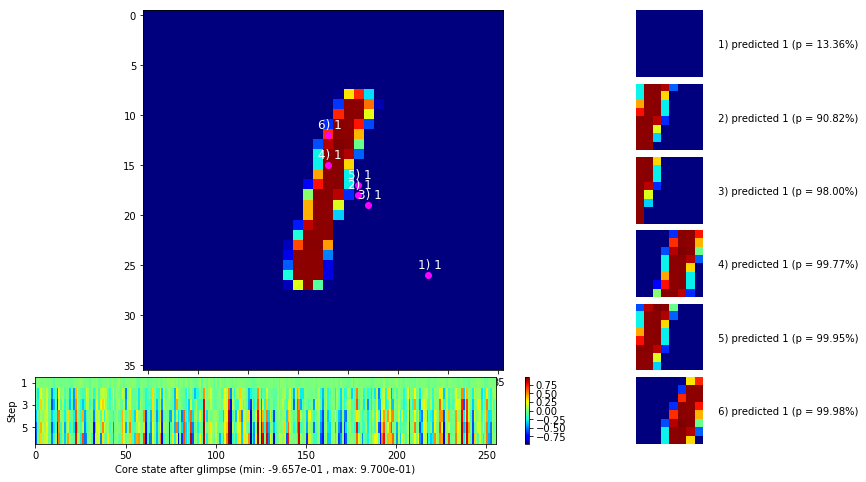

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


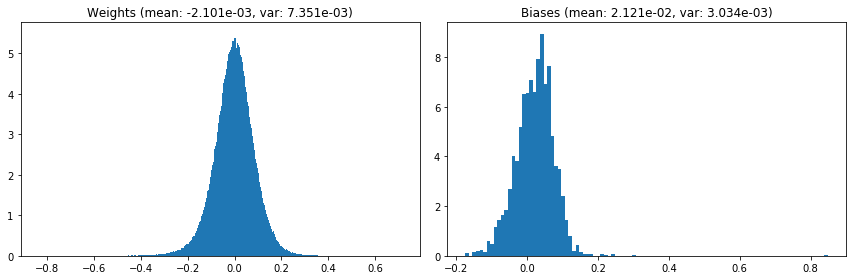

                                      Location network weights and biases


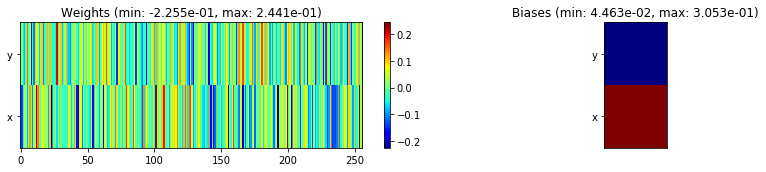

---------------------------------------------------------------------------------------------------------------
Elapsed time:  395.01 sec | TRAIN >> class loss: 0.4527 | steps:  2.586    | reward:  0.8447    | acc.: 84.468% 
                          | VAL   >> class loss: 0.3794 | steps:  2.379 :( | reward:  0.8664    | acc.: 86.640% 


Epoch  21/400) lr = 0.0001038
 b    500/  3000 >> 131.0 ms/b | lr: 1.03e-04 | grad 2norm:  7.14 | grad inf norm:  1.694
       Weights || abs max:  0.83 (37308.99) | mean: -2.10e-03 ( 0.17) | var: 7.36e-03 (49658.71)
        Biases || abs max:  0.85 ( 6906.81) | mean:  2.13e-02 ( 4.41) | var: 3.05e-03 (507483.66)
                  class loss: 0.433 | steps: 2.583 | reward:  0.854 | acc.: 85.44%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.7 ms/b | lr: 1.02e-04 | grad 2norm:  7.16 | grad inf norm:  1.769
       Weights || abs max:  0.83 (46646.46) | mean: -2.08e-03 ( 0.19) | va

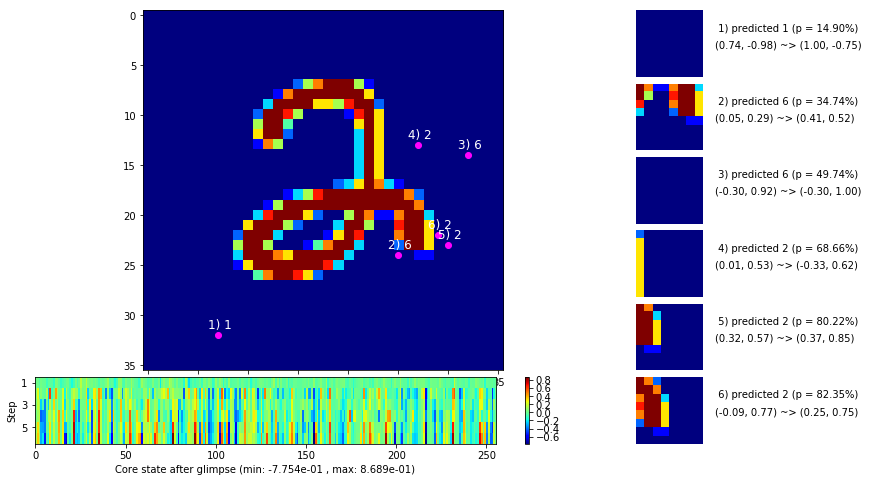

 b   1500/  3000 >> 133.9 ms/b | lr: 1.01e-04 | grad 2norm:  7.21 | grad inf norm:  1.759
       Weights || abs max:  0.83 (147220.39) | mean: -2.09e-03 ( 0.36) | var: 7.41e-03 (5480883.00)
        Biases || abs max:  0.85 ( 3521.84) | mean:  2.13e-02 ( 3.17) | var: 3.07e-03 (111365.74)
                  class loss: 0.448 | steps: 2.592 | reward:  0.847 | acc.: 84.69%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.8 ms/b | lr: 1.01e-04 | grad 2norm:  7.29 | grad inf norm:  1.758
       Weights || abs max:  0.83 (55447.52) | mean: -2.10e-03 ( 0.20) | var: 7.43e-03 (225531.62)
        Biases || abs max:  0.85 ( 3135.16) | mean:  2.13e-02 ( 2.84) | var: 3.08e-03 (36254.85)
                  class loss: 0.457 | steps: 2.595 | reward:  0.844 | acc.: 84.43%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

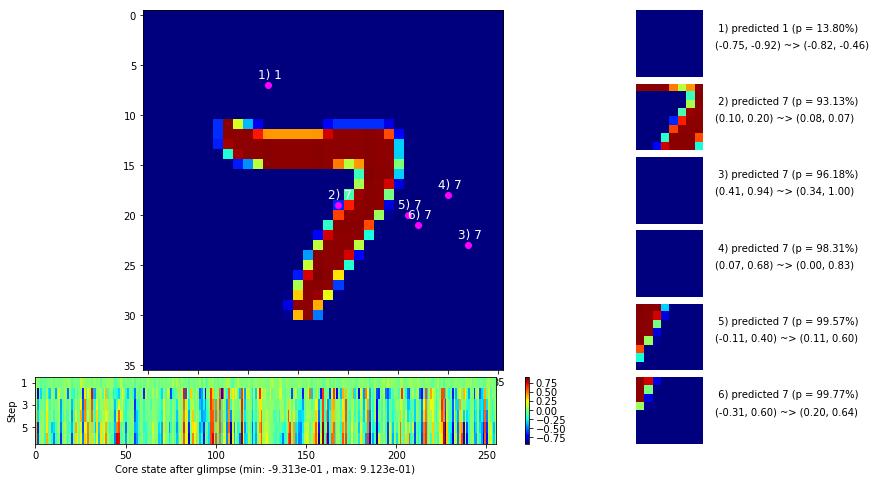

 b   2500/  3000 >> 134.2 ms/b | lr: 9.98e-05 | grad 2norm:  7.40 | grad inf norm:  1.836
       Weights || abs max:  0.84 (32011.45) | mean: -2.08e-03 ( 0.17) | var: 7.45e-03 (33257.17)
        Biases || abs max:  0.85 ( 3028.18) | mean:  2.12e-02 ( 2.56) | var: 3.09e-03 (77337.36)
                  class loss: 0.453 | steps: 2.594 | reward:  0.844 | acc.: 84.39%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.4 ms/b | lr: 9.92e-05 | grad 2norm:  7.31 | grad inf norm:  1.831
       Weights || abs max:  0.84 (51500.73) | mean: -2.08e-03 ( 0.20) | var: 7.47e-03 (167769.31)
        Biases || abs max:  0.85 ( 4073.42) | mean:  2.11e-02 ( 3.11) | var: 3.09e-03 (115734.06)
                  class loss: 0.450 | steps: 2.583 | reward:  0.844 | acc.: 84.39%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

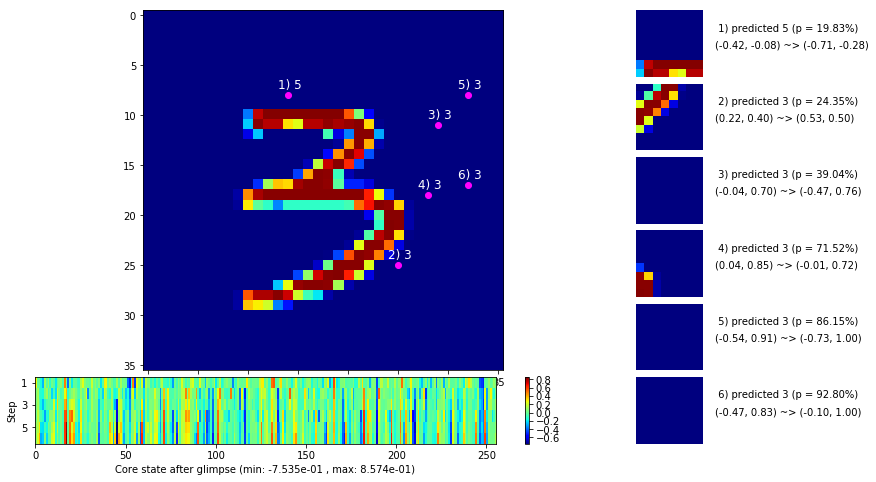

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


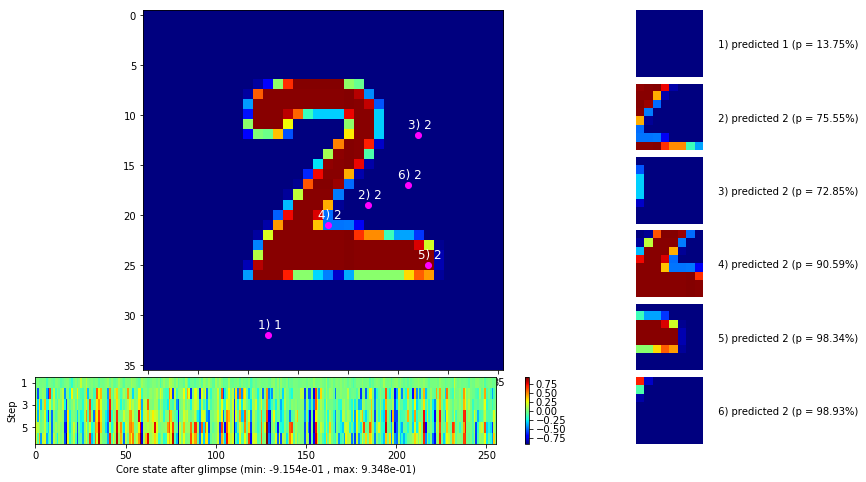


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


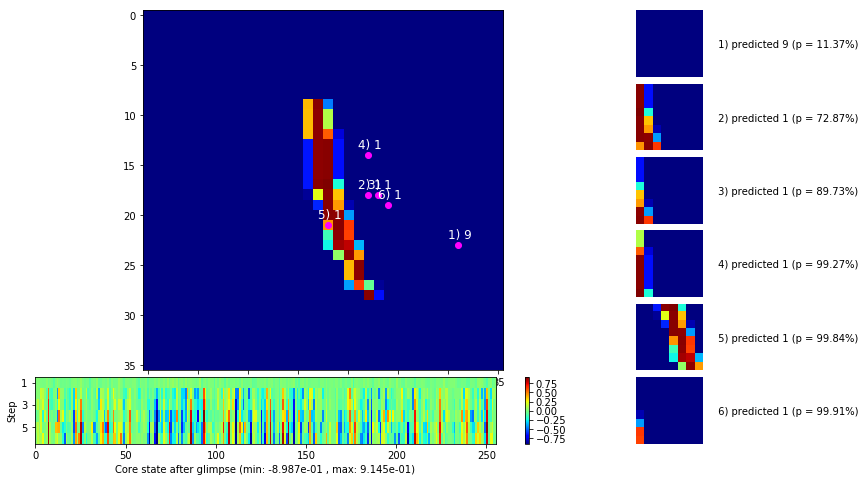

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


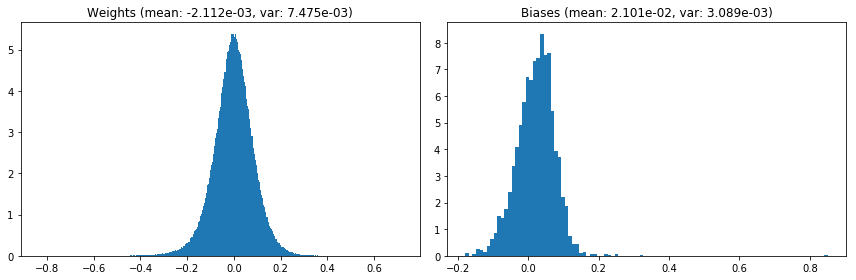

                                      Location network weights and biases


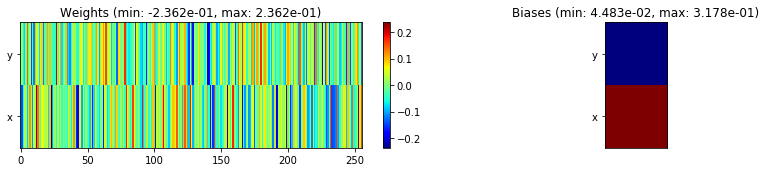

---------------------------------------------------------------------------------------------------------------
Elapsed time:  398.51 sec | TRAIN >> class loss: 0.4472 | steps:  2.589 :( | reward:  0.8477    | acc.: 84.770% 
                          | VAL   >> class loss: 0.3787 | steps:  2.332    | reward:  0.8744    | acc.: 87.440% 


Epoch  22/400) lr = 9.889e-05
 b    500/  3000 >> 132.0 ms/b | lr: 9.83e-05 | grad 2norm:  7.38 | grad inf norm:  1.850
       Weights || abs max:  0.84 (32228.90) | mean: -2.09e-03 ( 0.16) | var: 7.48e-03 (35014.82)
        Biases || abs max:  0.85 ( 5313.59) | mean:  2.11e-02 ( 3.51) | var: 3.10e-03 (563291.44)
                  class loss: 0.451 | steps: 2.568 | reward:  0.845 | acc.: 84.50%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 141.0 ms/b | lr: 9.77e-05 | grad 2norm:  7.30 | grad inf norm:  1.756
       Weights || abs max:  0.84 (39759.05) | mean: -2.07e-03 ( 0.17) | va

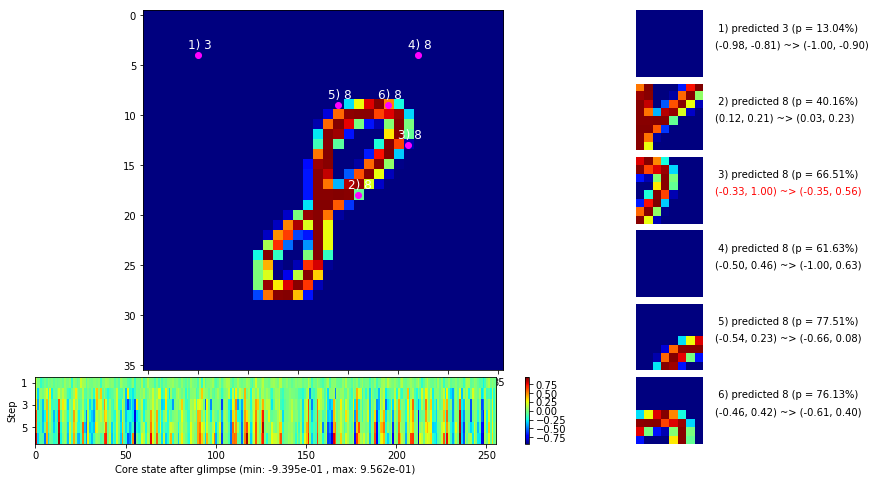

 b   1500/  3000 >> 137.6 ms/b | lr: 9.67e-05 | grad 2norm:  7.25 | grad inf norm:  1.827
       Weights || abs max:  0.84 (51493.81) | mean: -2.09e-03 ( 0.20) | var: 7.53e-03 (152838.30)
        Biases || abs max:  0.85 ( 3973.63) | mean:  2.12e-02 ( 3.57) | var: 3.13e-03 (263647.44)
                  class loss: 0.463 | steps: 2.592 | reward:  0.841 | acc.: 84.13%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 136.2 ms/b | lr: 9.62e-05 | grad 2norm:  7.51 | grad inf norm:  1.905
       Weights || abs max:  0.84 (22743.97) | mean: -2.10e-03 ( 0.15) | var: 7.55e-03 ( 7669.03)
        Biases || abs max:  0.85 (18323.81) | mean:  2.11e-02 ( 9.14) | var: 3.14e-03 (29053660.00)
                  class loss: 0.487 | steps: 2.650 | reward:  0.829 | acc.: 82.91%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

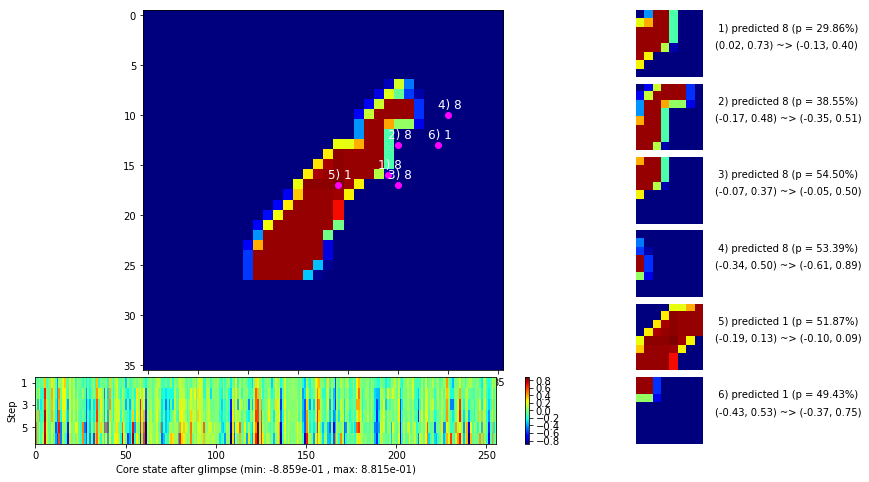

 b   2500/  3000 >> 139.1 ms/b | lr: 9.53e-05 | grad 2norm:  7.36 | grad inf norm:  1.835
       Weights || abs max:  0.84 (35192.88) | mean: -2.09e-03 ( 0.17) | var: 7.57e-03 (59557.68)
        Biases || abs max:  0.85 ( 2220.73) | mean:  2.12e-02 ( 2.47) | var: 3.16e-03 (16765.12)
                  class loss: 0.459 | steps: 2.590 | reward:  0.842 | acc.: 84.15%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 137.7 ms/b | lr: 9.47e-05 | grad 2norm:  7.31 | grad inf norm:  1.831
       Weights || abs max:  0.84 (46874.04) | mean: -2.08e-03 ( 0.20) | var: 7.59e-03 (70678.29)
        Biases || abs max:  0.85 ( 5837.10) | mean:  2.12e-02 ( 4.68) | var: 3.17e-03 (341023.75)
                  class loss: 0.464 | steps: 2.625 | reward:  0.840 | acc.: 84.01%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

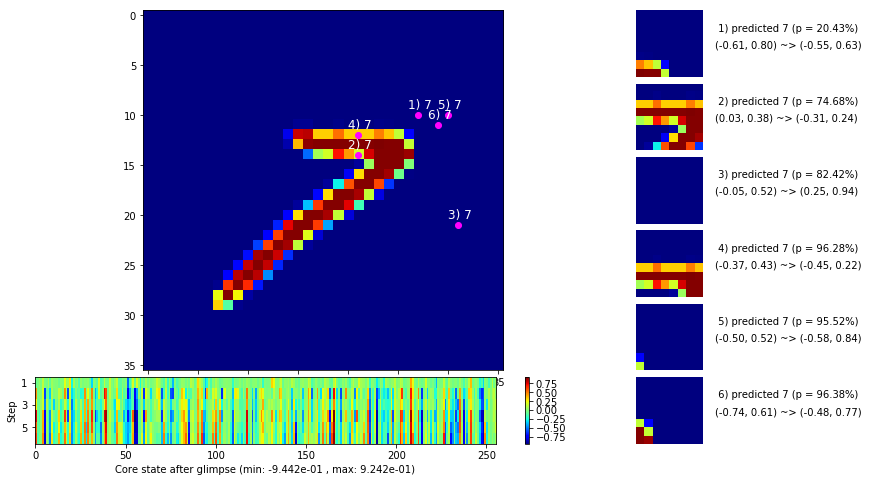

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


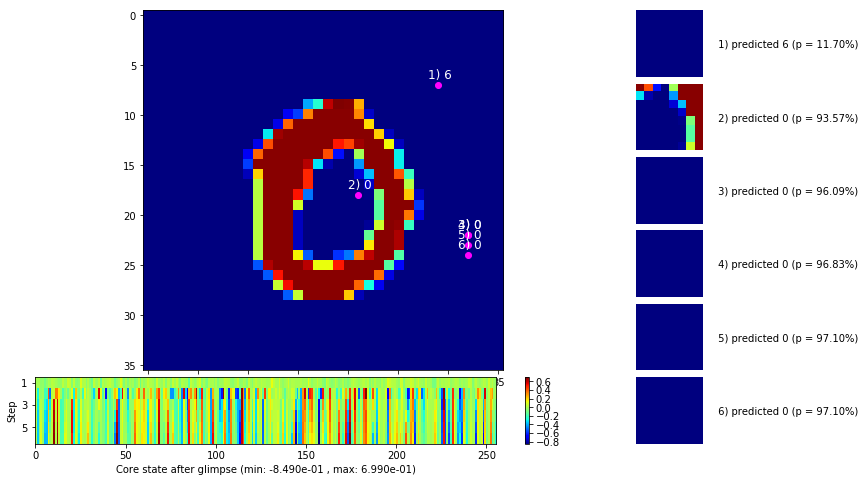


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


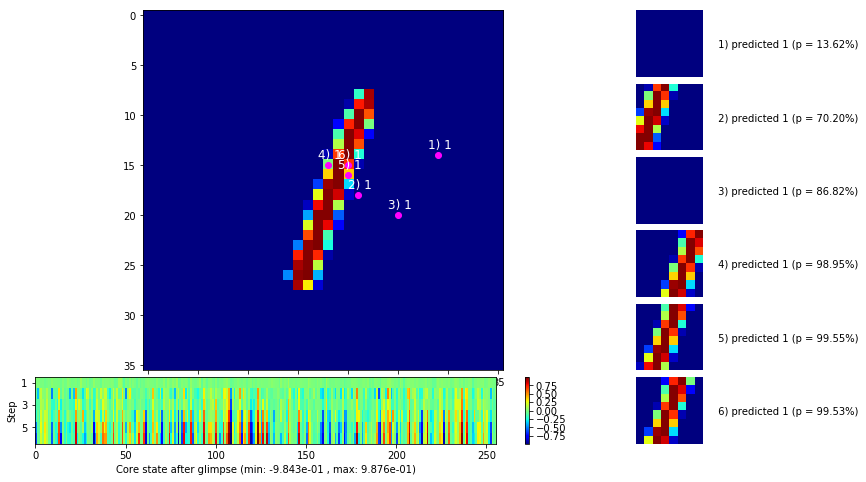

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


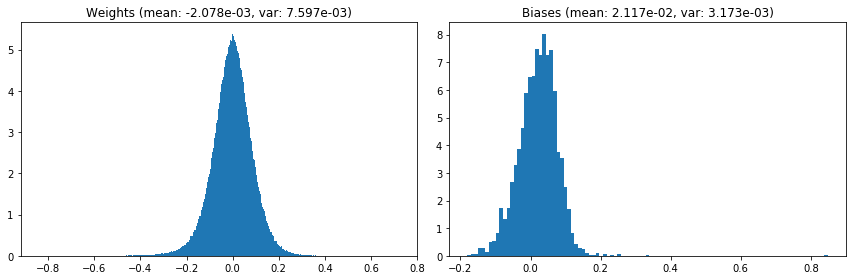

                                      Location network weights and biases


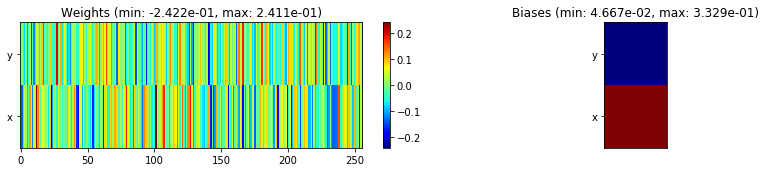

---------------------------------------------------------------------------------------------------------------
Elapsed time:  412.36 sec | TRAIN >> class loss: 0.4643 | steps:  2.603 :( | reward:  0.8399 :( | acc.: 83.995% :(
                          | VAL   >> class loss: 0.4267 | steps:  2.430 :( | reward:  0.8486 :( | acc.: 84.860% :(


Epoch  23/400) lr = 9.441e-05
 b    500/  3000 >> 138.6 ms/b | lr: 9.38e-05 | grad 2norm:  7.48 | grad inf norm:  1.921
       Weights || abs max:  0.84 (42201.86) | mean: -2.10e-03 ( 0.18) | var: 7.61e-03 (155126.06)
        Biases || abs max:  0.85 ( 5141.06) | mean:  2.12e-02 ( 3.83) | var: 3.18e-03 (105543.64)
                  class loss: 0.492 | steps: 2.639 | reward:  0.830 | acc.: 83.02%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 139.8 ms/b | lr: 9.33e-05 | grad 2norm:  7.35 | grad inf norm:  1.800
       Weights || abs max:  0.84 (33590.37) | mean: -2.11e-03 ( 0.17)

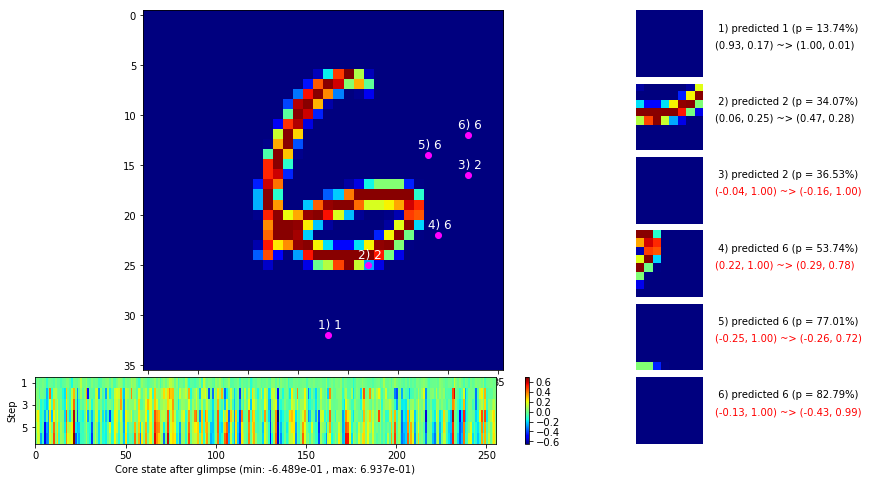

 b   1500/  3000 >> 137.1 ms/b | lr: 9.25e-05 | grad 2norm:  7.27 | grad inf norm:  1.786
       Weights || abs max:  0.85 (41243.75) | mean: -2.14e-03 ( 0.18) | var: 7.64e-03 (227419.44)
        Biases || abs max:  0.85 ( 7394.73) | mean:  2.11e-02 ( 4.87) | var: 3.20e-03 (849521.44)
                  class loss: 0.485 | steps: 2.631 | reward:  0.835 | acc.: 83.48%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.3 ms/b | lr: 9.19e-05 | grad 2norm:  7.45 | grad inf norm:  1.904
       Weights || abs max:  0.85 (49761.83) | mean: -2.17e-03 ( 0.19) | var: 7.66e-03 (118707.10)
        Biases || abs max:  0.85 ( 7545.18) | mean:  2.11e-02 ( 5.29) | var: 3.22e-03 (433149.47)
                  class loss: 0.489 | steps: 2.615 | reward:  0.831 | acc.: 83.14%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

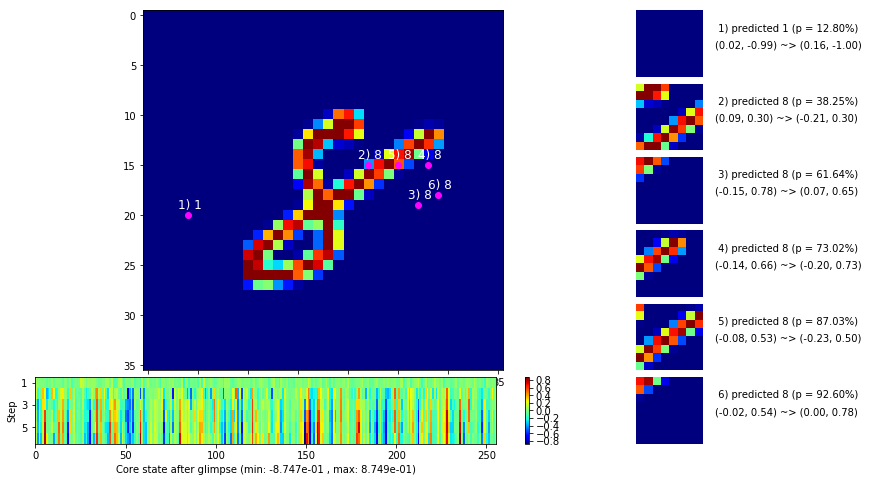

 b   2500/  3000 >> 135.5 ms/b | lr: 9.11e-05 | grad 2norm:  7.20 | grad inf norm:  1.763
       Weights || abs max:  0.85 (74116.34) | mean: -2.18e-03 ( 0.23) | var: 7.68e-03 (622491.50)
        Biases || abs max:  0.85 (44625.43) | mean:  2.11e-02 (19.15) | var: 3.22e-03 (312691072.00)
                  class loss: 0.467 | steps: 2.615 | reward:  0.841 | acc.: 84.12%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.7 ms/b | lr: 9.06e-05 | grad 2norm:  7.32 | grad inf norm:  1.812
       Weights || abs max:  0.85 (25620.79) | mean: -2.18e-03 ( 0.16) | var: 7.69e-03 ( 8492.29)
        Biases || abs max:  0.85 ( 6808.03) | mean:  2.11e-02 ( 4.52) | var: 3.23e-03 (1585832.12)
                  class loss: 0.460 | steps: 2.616 | reward:  0.841 | acc.: 84.07%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

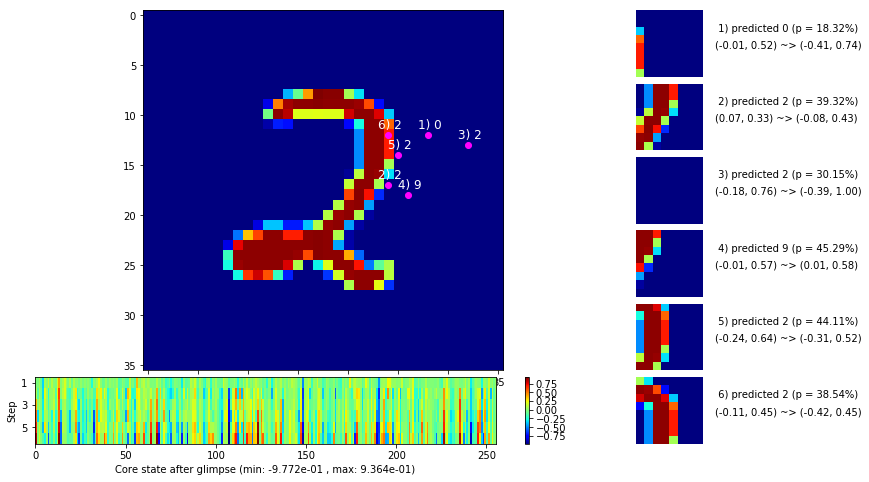

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


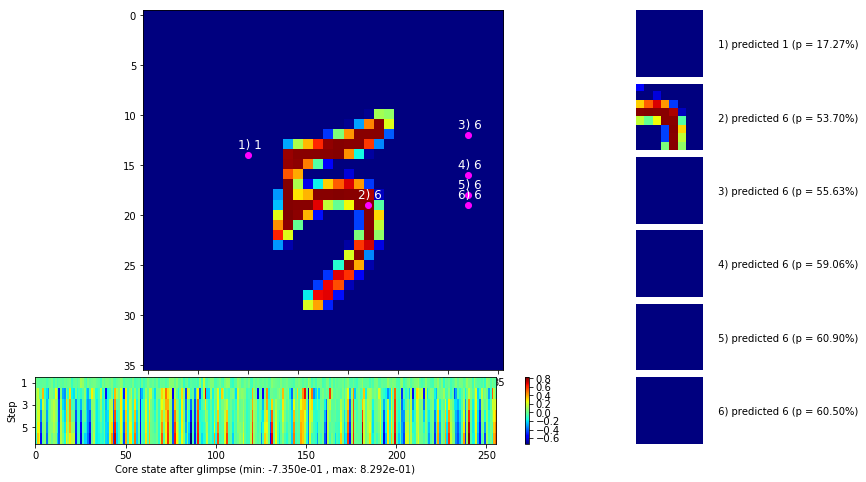


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


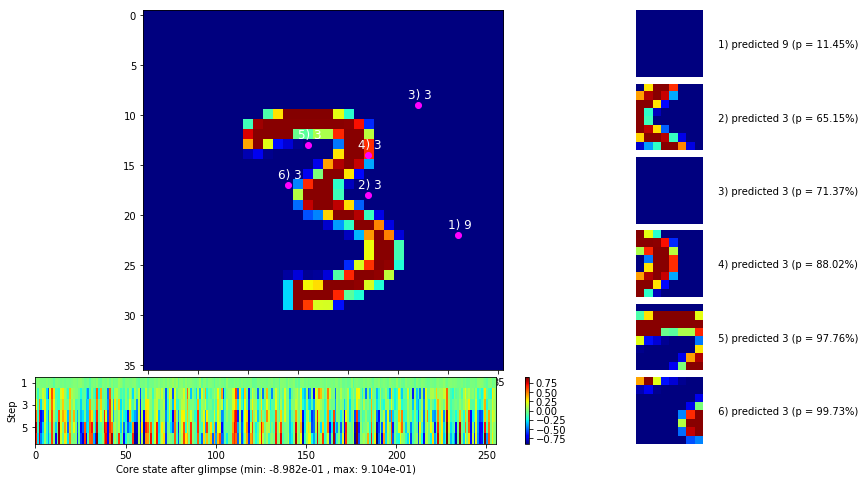

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


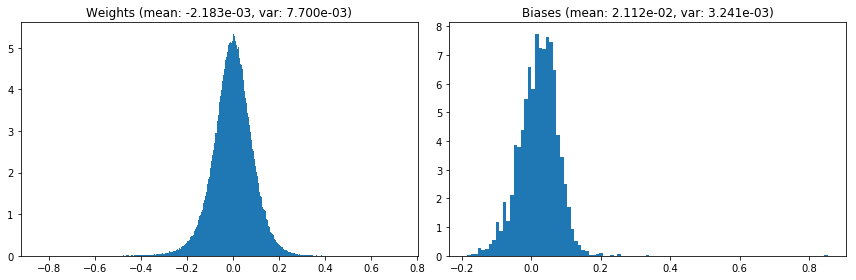

                                      Location network weights and biases


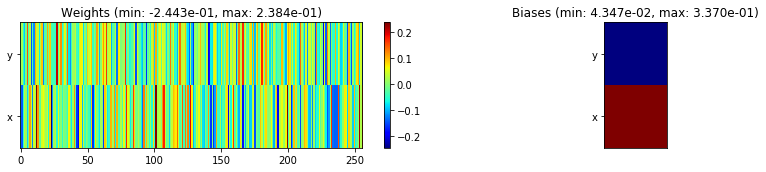

---------------------------------------------------------------------------------------------------------------
Elapsed time:  411.13 sec | TRAIN >> class loss: 0.4768 | steps:  2.619 :( | reward:  0.8367 :( | acc.: 83.670% :(
                          | VAL   >> class loss: 0.4247 | steps:  2.398 :( | reward:  0.8522 :( | acc.: 85.220% :(


Epoch  24/400) lr = 9.032e-05
 b    500/  3000 >> 134.8 ms/b | lr: 8.98e-05 | grad 2norm:  7.39 | grad inf norm:  1.799
       Weights || abs max:  0.85 (40654.61) | mean: -2.18e-03 ( 0.18) | var: 7.71e-03 (62267.59)
        Biases || abs max:  0.85 ( 4663.63) | mean:  2.11e-02 ( 3.57) | var: 3.24e-03 (145717.44)
                  class loss: 0.473 | steps: 2.618 | reward:  0.836 | acc.: 83.63%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.4 ms/b | lr: 8.93e-05 | grad 2norm:  7.37 | grad inf norm:  1.872
       Weights || abs max:  0.85 (50875.66) | mean: -2.17e-03 ( 0.20) 

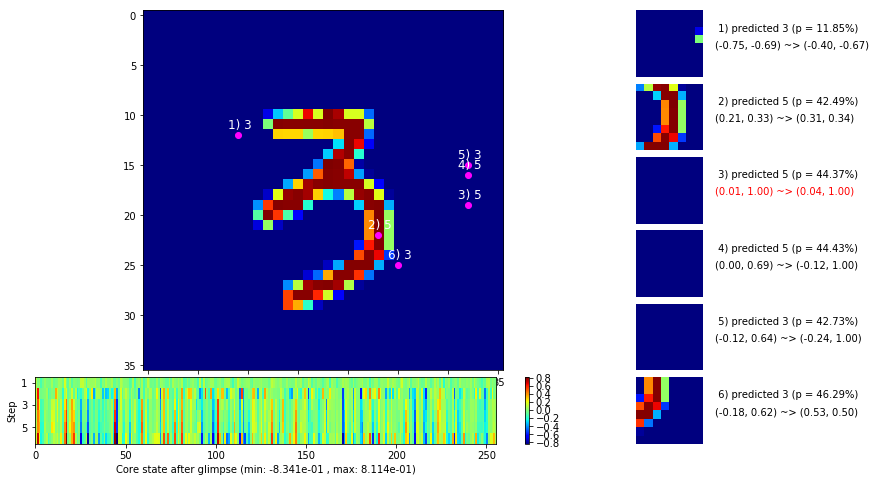

 b   1500/  3000 >> 138.3 ms/b | lr: 8.85e-05 | grad 2norm:  7.22 | grad inf norm:  1.783
       Weights || abs max:  0.85 (52753.35) | mean: -2.16e-03 ( 0.20) | var: 7.74e-03 (172619.95)
        Biases || abs max:  0.86 ( 4457.54) | mean:  2.11e-02 ( 4.07) | var: 3.28e-03 (161758.38)
                  class loss: 0.464 | steps: 2.580 | reward:  0.845 | acc.: 84.47%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 136.7 ms/b | lr: 8.80e-05 | grad 2norm:  7.26 | grad inf norm:  1.809
       Weights || abs max:  0.85 (40213.43) | mean: -2.18e-03 ( 0.18) | var: 7.76e-03 (34484.01)
        Biases || abs max:  0.86 ( 5894.26) | mean:  2.11e-02 ( 4.96) | var: 3.28e-03 (1642698.62)
                  class loss: 0.460 | steps: 2.593 | reward:  0.843 | acc.: 84.32%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

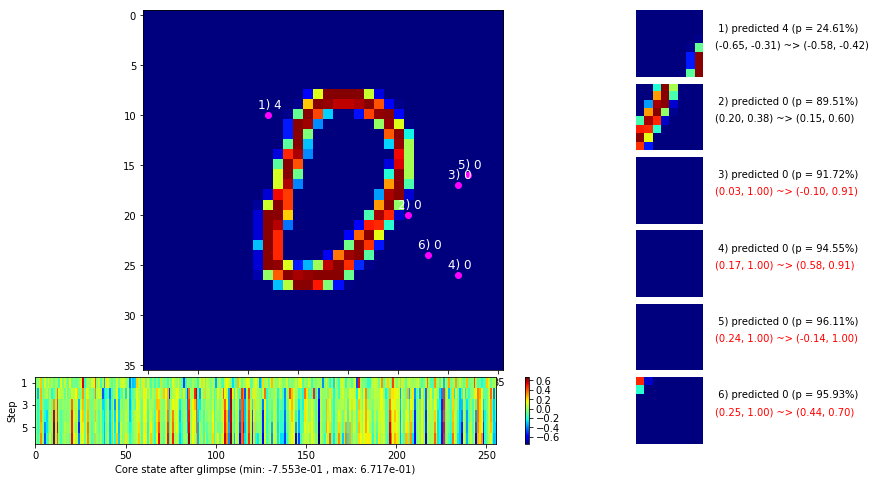

 b   2500/  3000 >> 135.5 ms/b | lr: 8.73e-05 | grad 2norm:  7.16 | grad inf norm:  1.761
       Weights || abs max:  0.85 (51518.68) | mean: -2.16e-03 ( 0.19) | var: 7.78e-03 (263455.12)
        Biases || abs max:  0.86 (21245.35) | mean:  2.11e-02 (10.34) | var: 3.30e-03 (37565548.00)
                  class loss: 0.433 | steps: 2.576 | reward:  0.850 | acc.: 85.02%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.1 ms/b | lr: 8.68e-05 | grad 2norm:  7.17 | grad inf norm:  1.686
       Weights || abs max:  0.85 (109929.23) | mean: -2.18e-03 ( 0.29) | var: 7.79e-03 (4057708.00)
        Biases || abs max:  0.86 ( 5976.08) | mean:  2.11e-02 ( 4.67) | var: 3.31e-03 (446184.75)
                  class loss: 0.450 | steps: 2.558 | reward:  0.848 | acc.: 84.75%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0

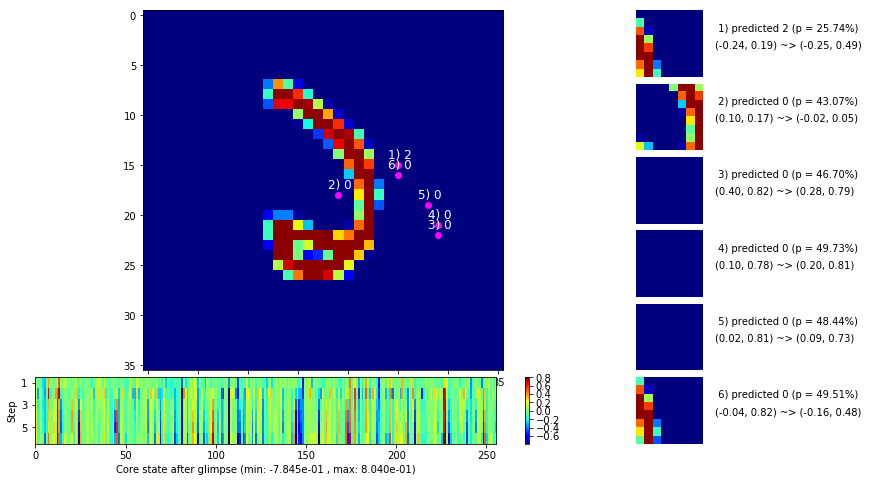

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


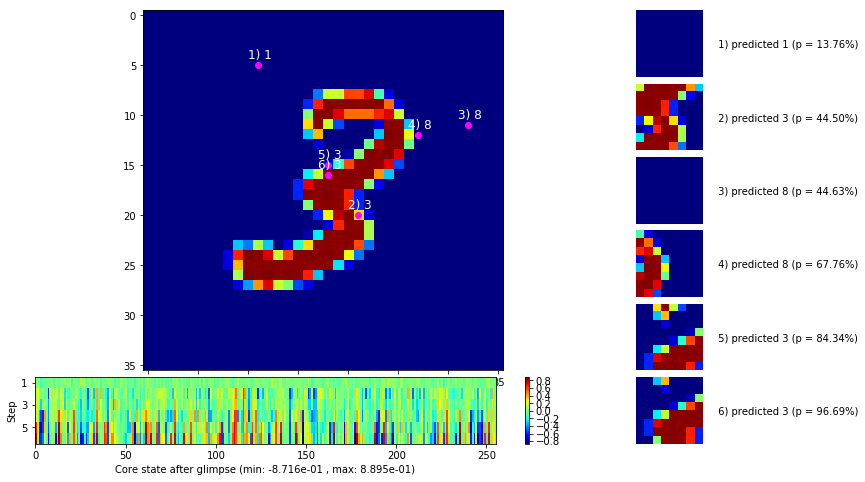


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


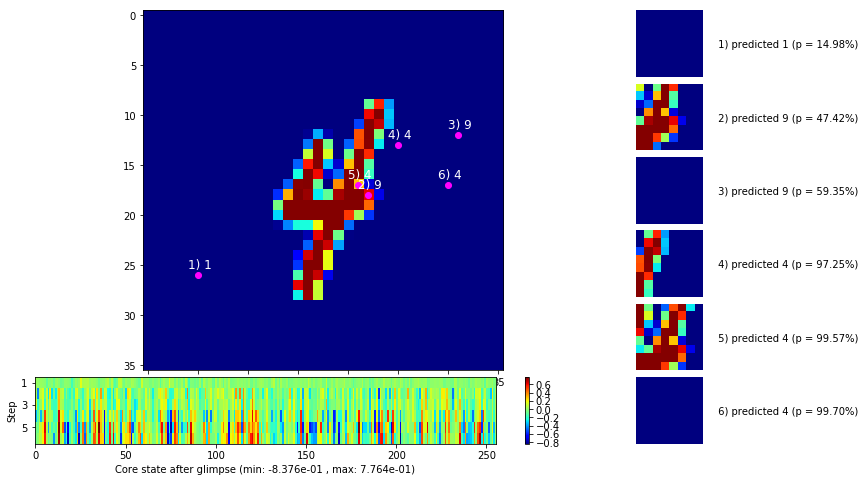

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


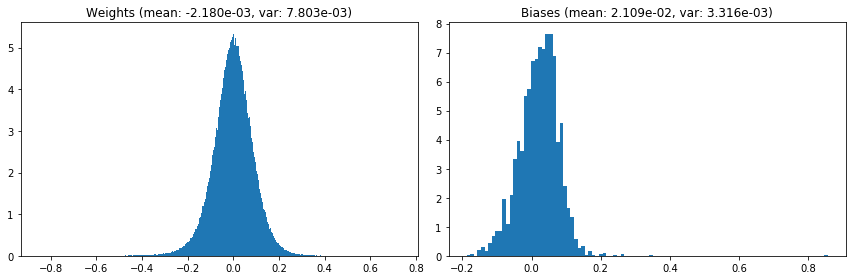

                                      Location network weights and biases


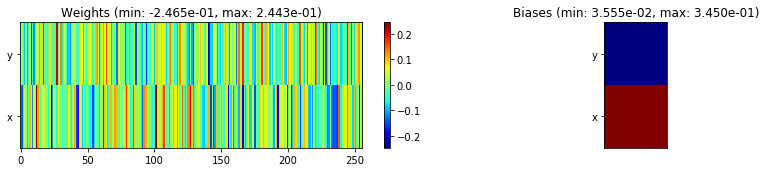

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.47 sec | TRAIN >> class loss: 0.4568 | steps:  2.586    | reward:  0.8438 :( | acc.: 84.382% :(
                          | VAL   >> class loss: 0.3976 | steps:  2.392 :( | reward:  0.8612 :( | acc.: 86.120% :(


Epoch  25/400) lr = 8.657e-05
 b    500/  3000 >> 134.2 ms/b | lr: 8.61e-05 | grad 2norm:  7.33 | grad inf norm:  1.762
       Weights || abs max:  0.85 (57051.21) | mean: -2.17e-03 ( 0.21) | var: 7.81e-03 (400897.00)
        Biases || abs max:  0.86 ( 7113.73) | mean:  2.11e-02 ( 4.91) | var: 3.32e-03 (1313195.25)
                  class loss: 0.453 | steps: 2.592 | reward:  0.843 | acc.: 84.25%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 137.8 ms/b | lr: 8.56e-05 | grad 2norm:  7.17 | grad inf norm:  1.794
       Weights || abs max:  0.85 (229018.27) | mean: -2.17e-03 ( 0.5

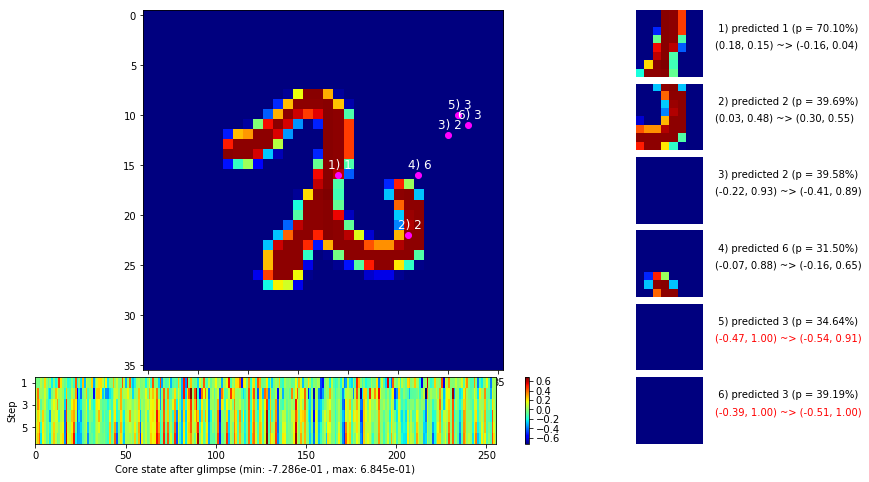

 b   1500/  3000 >> 136.2 ms/b | lr: 8.49e-05 | grad 2norm:  7.22 | grad inf norm:  1.715
       Weights || abs max:  0.85 (42043.44) | mean: -2.16e-03 ( 0.18) | var: 7.84e-03 (96781.81)
        Biases || abs max:  0.86 (12572.90) | mean:  2.11e-02 ( 6.98) | var: 3.35e-03 (10247390.00)
                  class loss: 0.443 | steps: 2.590 | reward:  0.850 | acc.: 84.98%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.5 ms/b | lr: 8.45e-05 | grad 2norm:  7.41 | grad inf norm:  1.811
       Weights || abs max:  0.85 (32466.55) | mean: -2.20e-03 ( 0.16) | var: 7.86e-03 (70335.34)
        Biases || abs max:  0.86 ( 8327.67) | mean:  2.10e-02 ( 5.00) | var: 3.35e-03 (1233439.50)
                  class loss: 0.477 | steps: 2.591 | reward:  0.837 | acc.: 83.67%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

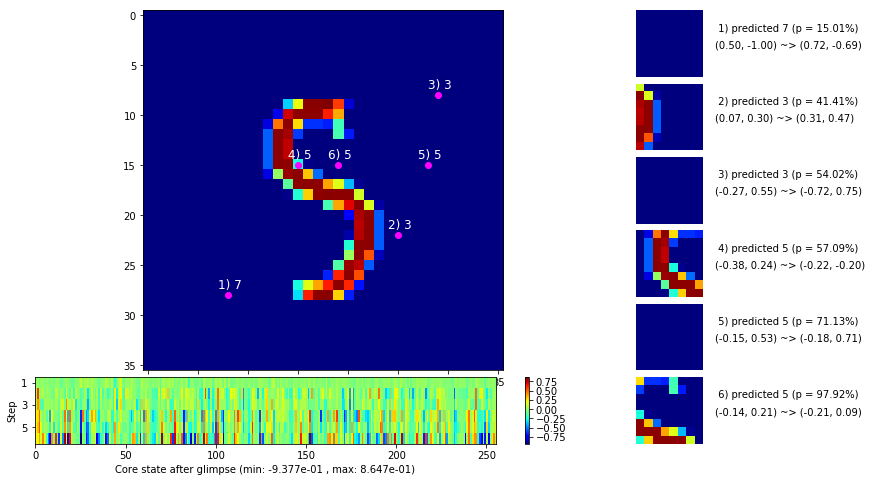

 b   2500/  3000 >> 137.6 ms/b | lr: 8.38e-05 | grad 2norm:  7.46 | grad inf norm:  1.864
       Weights || abs max:  0.85 (47639.93) | mean: -2.20e-03 ( 0.19) | var: 7.88e-03 (261970.94)
        Biases || abs max:  0.86 ( 7271.31) | mean:  2.10e-02 ( 4.51) | var: 3.37e-03 (3403385.25)
                  class loss: 0.474 | steps: 2.577 | reward:  0.838 | acc.: 83.76%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 137.5 ms/b | lr: 8.33e-05 | grad 2norm:  7.43 | grad inf norm:  1.883
       Weights || abs max:  0.85 (34385.21) | mean: -2.23e-03 ( 0.16) | var: 7.89e-03 (43662.52)
        Biases || abs max:  0.86 ( 8412.97) | mean:  2.10e-02 ( 5.29) | var: 3.38e-03 (1378633.88)
                  class loss: 0.489 | steps: 2.628 | reward:  0.830 | acc.: 83.04%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

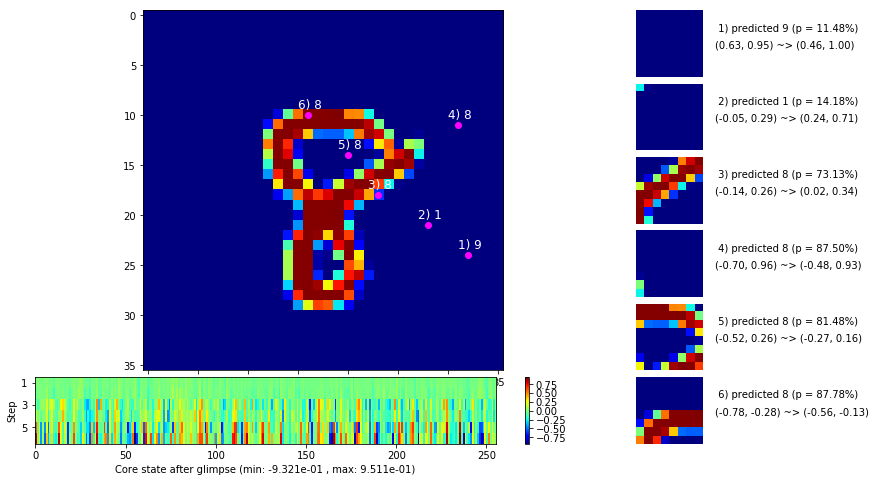

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


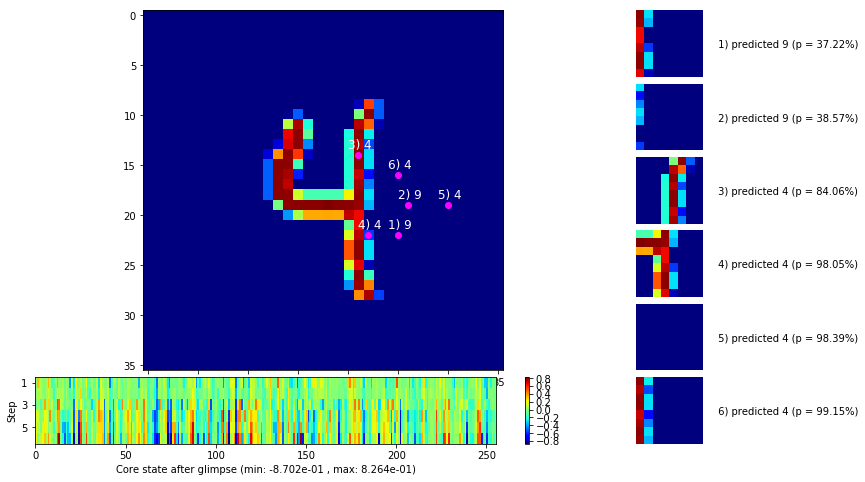


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


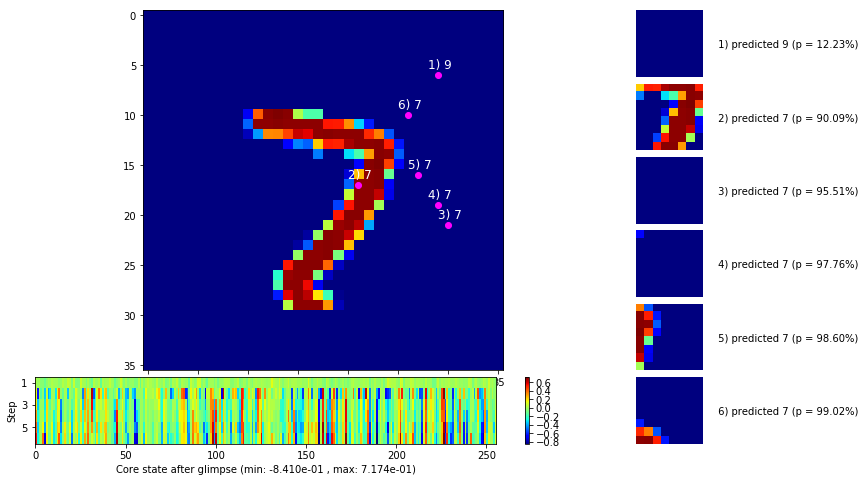

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


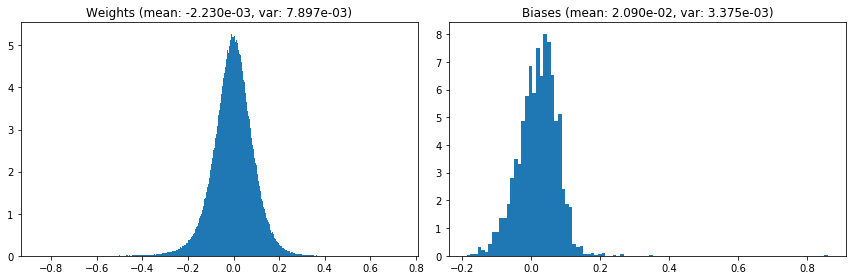

                                      Location network weights and biases


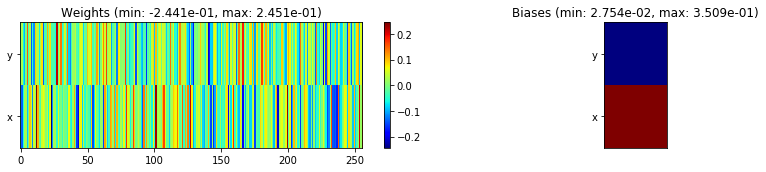

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.94 sec | TRAIN >> class loss: 0.4647 | steps:  2.589 :( | reward:  0.8408 :( | acc.: 84.083% :(
                          | VAL   >> class loss: 0.3954 | steps:  2.403 :( | reward:  0.8634 :( | acc.: 86.340% :(


Epoch  26/400) lr = 8.311e-05
 b    500/  3000 >> 135.8 ms/b | lr: 8.27e-05 | grad 2norm:  7.39 | grad inf norm:  1.749
       Weights || abs max:  0.85 (32282.97) | mean: -2.22e-03 ( 0.16) | var: 7.91e-03 (21193.39)
        Biases || abs max:  0.86 ( 4399.45) | mean:  2.10e-02 ( 3.95) | var: 3.38e-03 (66416.47)
                  class loss: 0.468 | steps: 2.580 | reward:  0.837 | acc.: 83.74%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.1 ms/b | lr: 8.22e-05 | grad 2norm:  7.40 | grad inf norm:  1.772
       Weights || abs max:  0.86 (124440.78) | mean: -2.23e-03 ( 0.31) 

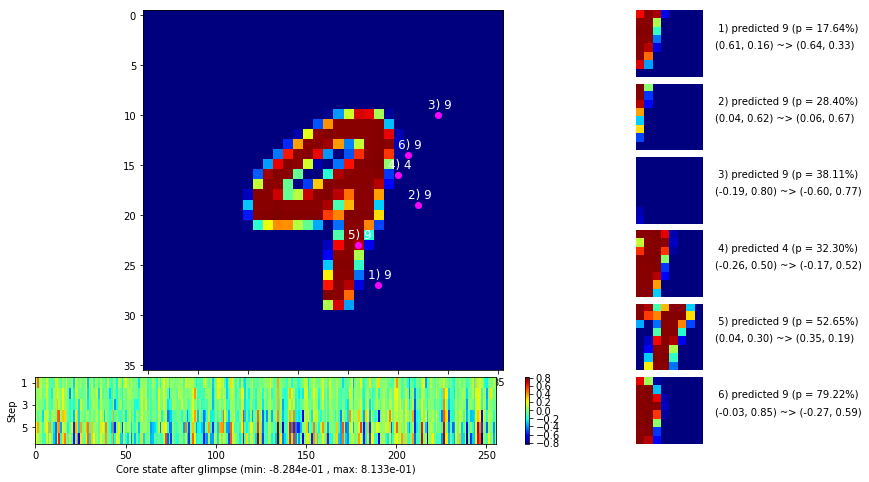

 b   1500/  3000 >> 136.6 ms/b | lr: 8.16e-05 | grad 2norm:  7.26 | grad inf norm:  1.750
       Weights || abs max:  0.86 (83551.52) | mean: -2.24e-03 ( 0.24) | var: 7.94e-03 (2261767.75)
        Biases || abs max:  0.86 ( 7344.06) | mean:  2.09e-02 ( 5.60) | var: 3.40e-03 (1025816.12)
                  class loss: 0.455 | steps: 2.543 | reward:  0.838 | acc.: 83.83%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.3 ms/b | lr: 8.12e-05 | grad 2norm:  7.51 | grad inf norm:  1.828
       Weights || abs max:  0.86 (24094.93) | mean: -2.22e-03 ( 0.15) | var: 7.95e-03 ( 9064.06)
        Biases || abs max:  0.86 ( 5685.90) | mean:  2.09e-02 ( 4.76) | var: 3.42e-03 (163717.47)
                  class loss: 0.490 | steps: 2.622 | reward:  0.830 | acc.: 82.96%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

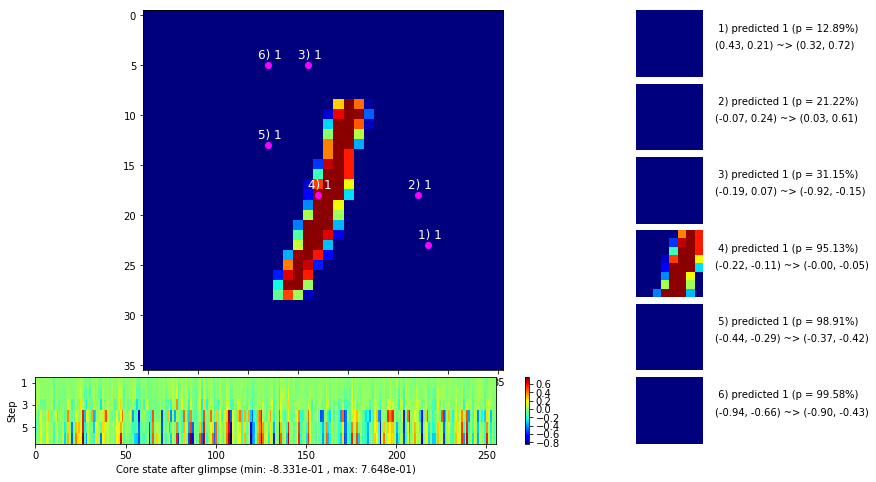

 b   2500/  3000 >> 136.3 ms/b | lr: 8.05e-05 | grad 2norm:  7.35 | grad inf norm:  1.789
       Weights || abs max:  0.85 (37525.89) | mean: -2.25e-03 ( 0.17) | var: 7.97e-03 (78013.25)
        Biases || abs max:  0.86 ( 4102.71) | mean:  2.08e-02 ( 4.03) | var: 3.42e-03 (50552.41)
                  class loss: 0.470 | steps: 2.576 | reward:  0.840 | acc.: 83.99%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.2 ms/b | lr: 8.01e-05 | grad 2norm:  7.23 | grad inf norm:  1.779
       Weights || abs max:  0.86 (122897.66) | mean: -2.26e-03 ( 0.31) | var: 7.98e-03 (1994941.62)
        Biases || abs max:  0.86 ( 4184.25) | mean:  2.09e-02 ( 3.31) | var: 3.43e-03 (195081.88)
                  class loss: 0.469 | steps: 2.561 | reward:  0.842 | acc.: 84.16%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

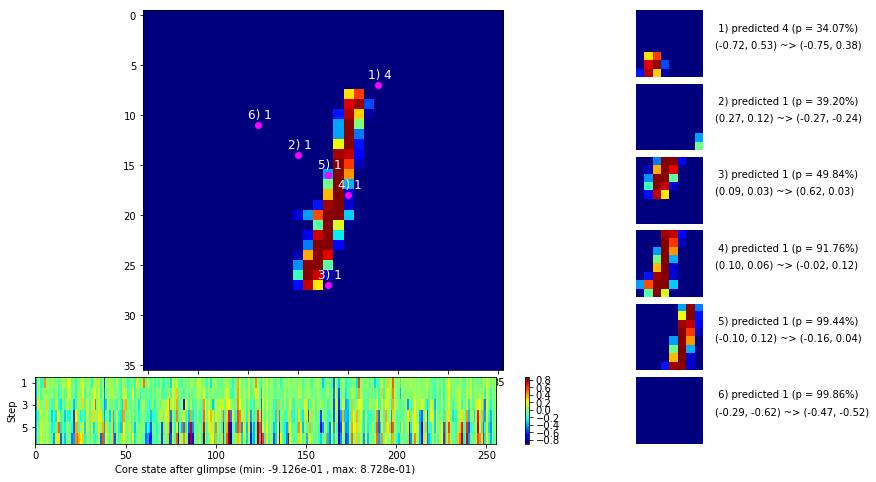

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


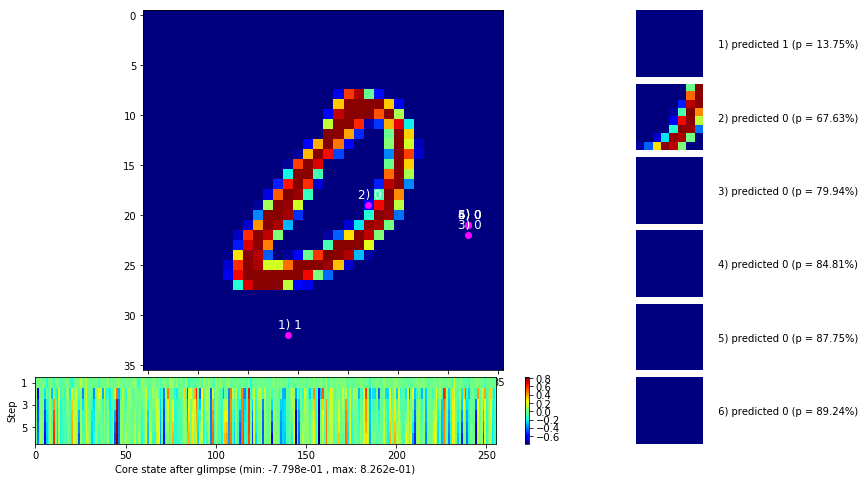


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


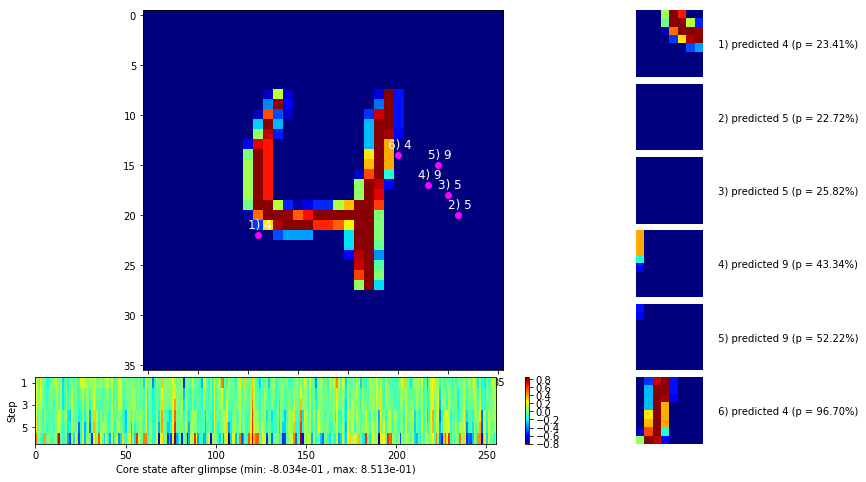

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


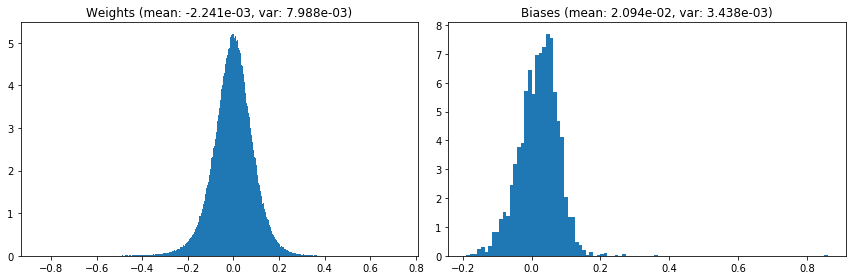

                                      Location network weights and biases


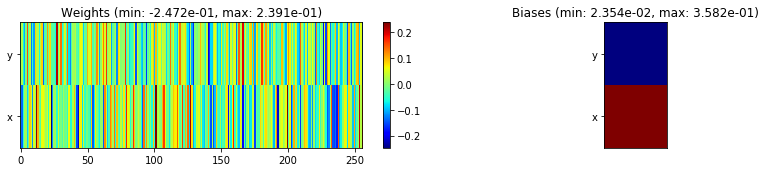

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.35 sec | TRAIN >> class loss: 0.4707 | steps:  2.575    | reward:  0.8375 :( | acc.: 83.750% :(
                          | VAL   >> class loss: 0.4134 | steps:  2.386 :( | reward:  0.8612 :( | acc.: 86.120% :(


Epoch  27/400) lr = 7.992e-05
 b    500/  3000 >> 135.9 ms/b | lr: 7.95e-05 | grad 2norm:  7.39 | grad inf norm:  1.803
       Weights || abs max:  0.86 (41899.14) | mean: -2.24e-03 ( 0.18) | var: 8.00e-03 (66187.48)
        Biases || abs max:  0.86 ( 5600.67) | mean:  2.09e-02 ( 4.18) | var: 3.44e-03 (450979.44)
                  class loss: 0.481 | steps: 2.582 | reward:  0.833 | acc.: 83.33%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 137.4 ms/b | lr: 7.91e-05 | grad 2norm:  7.31 | grad inf norm:  1.831
       Weights || abs max:  0.86 (57215.57) | mean: -2.22e-03 ( 0.20) 

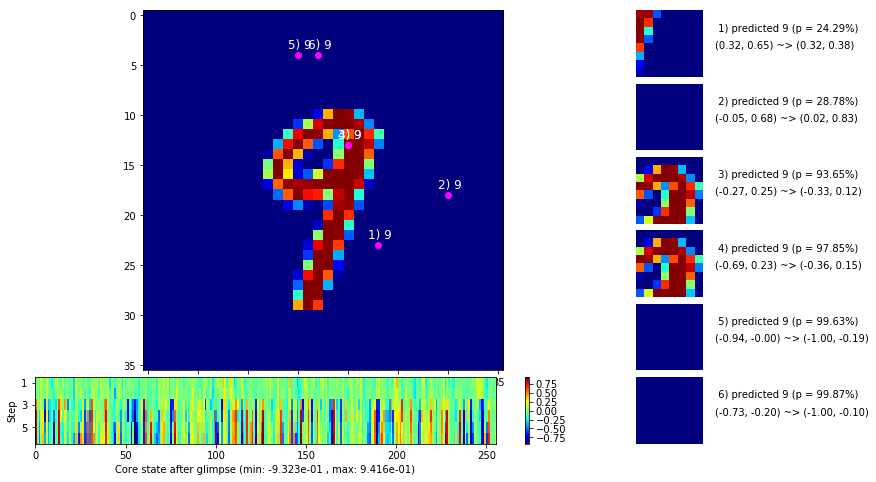

 b   1500/  3000 >> 139.0 ms/b | lr: 7.85e-05 | grad 2norm:  7.43 | grad inf norm:  1.826
       Weights || abs max:  0.86 (116443.55) | mean: -2.26e-03 ( 0.30) | var: 8.02e-03 (5301786.00)
        Biases || abs max:  0.86 ( 6484.71) | mean:  2.08e-02 ( 4.15) | var: 3.46e-03 (977086.75)
                  class loss: 0.480 | steps: 2.538 | reward:  0.836 | acc.: 83.57%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 137.1 ms/b | lr: 7.81e-05 | grad 2norm:  7.28 | grad inf norm:  1.794
       Weights || abs max:  0.86 (34057.76) | mean: -2.25e-03 ( 0.16) | var: 8.04e-03 (29409.85)
        Biases || abs max:  0.86 ( 3085.70) | mean:  2.09e-02 ( 3.10) | var: 3.46e-03 (28482.34)
                  class loss: 0.469 | steps: 2.565 | reward:  0.844 | acc.: 84.35%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

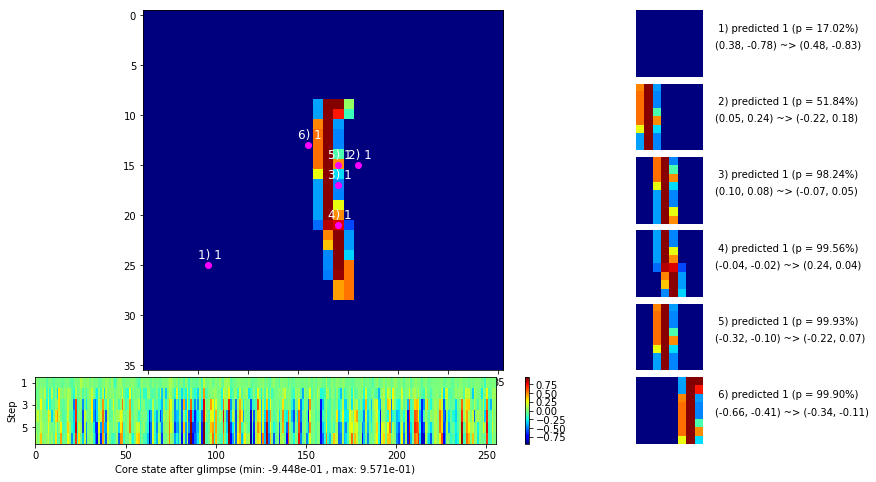

 b   2500/  3000 >> 164.2 ms/b | lr: 7.75e-05 | grad 2norm:  7.44 | grad inf norm:  1.831
       Weights || abs max:  0.86 (53147.71) | mean: -2.25e-03 ( 0.20) | var: 8.05e-03 (350850.00)
        Biases || abs max:  0.86 ( 5709.33) | mean:  2.09e-02 ( 4.46) | var: 3.47e-03 (771386.50)
                  class loss: 0.469 | steps: 2.577 | reward:  0.839 | acc.: 83.87%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 142.9 ms/b | lr: 7.72e-05 | grad 2norm:  7.55 | grad inf norm:  1.815
       Weights || abs max:  0.86 (117927.97) | mean: -2.24e-03 ( 0.31) | var: 8.07e-03 (4484797.00)
        Biases || abs max:  0.86 ( 5391.08) | mean:  2.10e-02 ( 3.87) | var: 3.48e-03 (470782.84)
                  class loss: 0.495 | steps: 2.586 | reward:  0.830 | acc.: 82.96%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

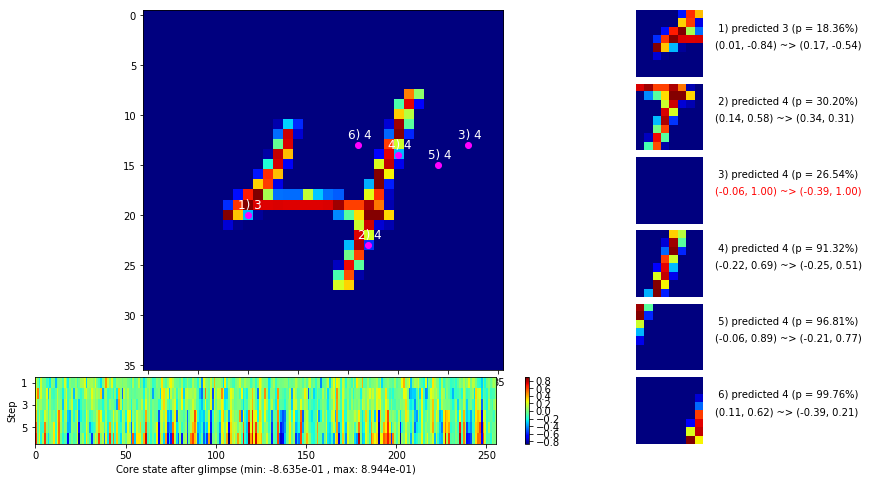

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


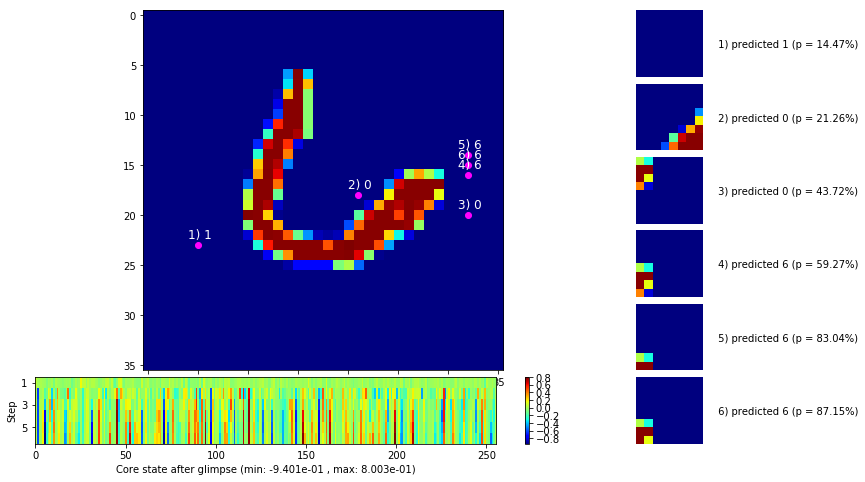


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


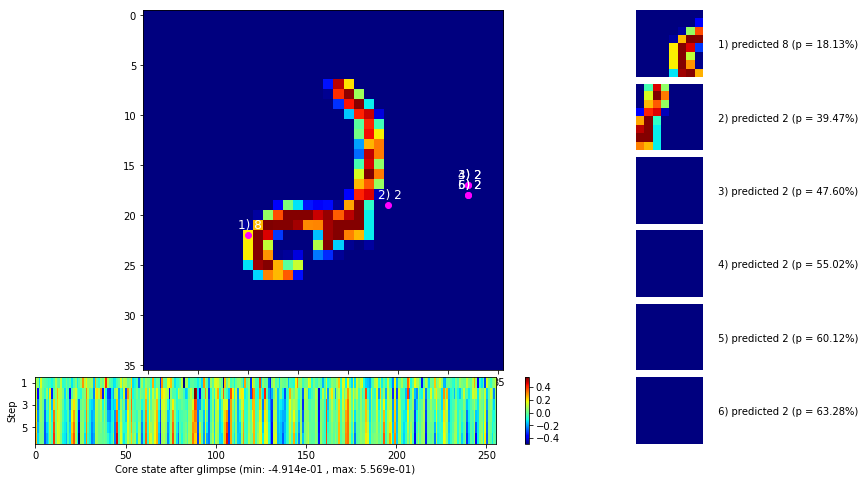

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


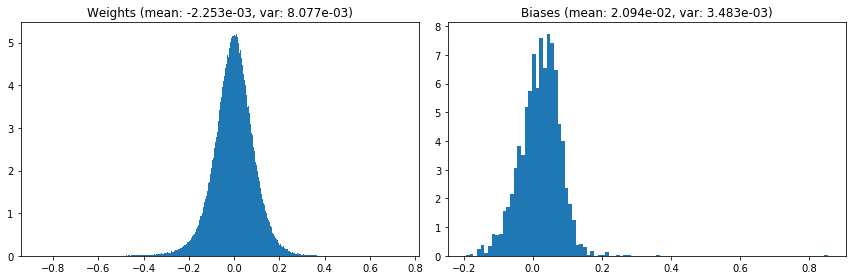

                                      Location network weights and biases


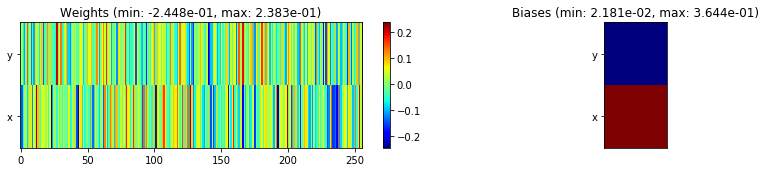

---------------------------------------------------------------------------------------------------------------
Elapsed time:  428.81 sec | TRAIN >> class loss: 0.4784 | steps:  2.572    | reward:  0.8363 :( | acc.: 83.633% :(
                          | VAL   >> class loss: 0.4150 | steps:  2.415 :( | reward:  0.8536 :( | acc.: 85.360% :(


Epoch  28/400) lr = 7.697e-05
 b    500/  3000 >> 134.3 ms/b | lr: 7.66e-05 | grad 2norm:  7.36 | grad inf norm:  1.821
       Weights || abs max:  0.86 (55210.96) | mean: -2.25e-03 ( 0.20) | var: 8.09e-03 (188900.66)
        Biases || abs max:  0.86 ( 5574.50) | mean:  2.10e-02 ( 4.43) | var: 3.49e-03 (134922.30)
                  class loss: 0.476 | steps: 2.565 | reward:  0.839 | acc.: 83.86%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.2 ms/b | lr: 7.62e-05 | grad 2norm:  7.46 | grad inf norm:  1.811
       Weights || abs max:  0.86 (215473.97) | mean: -2.25e-03 ( 0.47

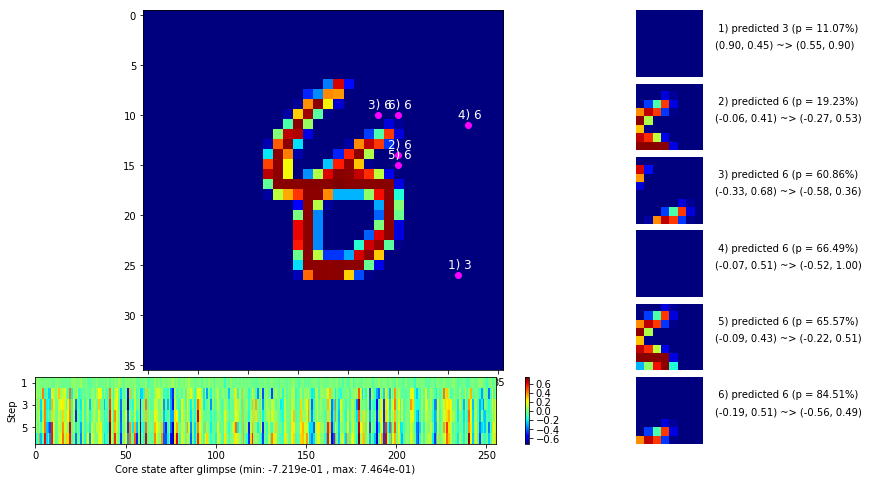

 b   1500/  3000 >> 136.3 ms/b | lr: 7.57e-05 | grad 2norm:  7.41 | grad inf norm:  1.759
       Weights || abs max:  0.87 (23726.03) | mean: -2.26e-03 ( 0.14) | var: 8.12e-03 (11796.53)
        Biases || abs max:  0.85 ( 3625.90) | mean:  2.10e-02 ( 3.32) | var: 3.51e-03 (48762.14)
                  class loss: 0.480 | steps: 2.580 | reward:  0.834 | acc.: 83.43%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.2 ms/b | lr: 7.53e-05 | grad 2norm:  7.39 | grad inf norm:  1.828
       Weights || abs max:  0.87 (25333.78) | mean: -2.27e-03 ( 0.14) | var: 8.13e-03 (14866.04)
        Biases || abs max:  0.86 ( 7158.38) | mean:  2.10e-02 ( 4.36) | var: 3.51e-03 (1103937.00)
                  class loss: 0.481 | steps: 2.571 | reward:  0.837 | acc.: 83.74%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

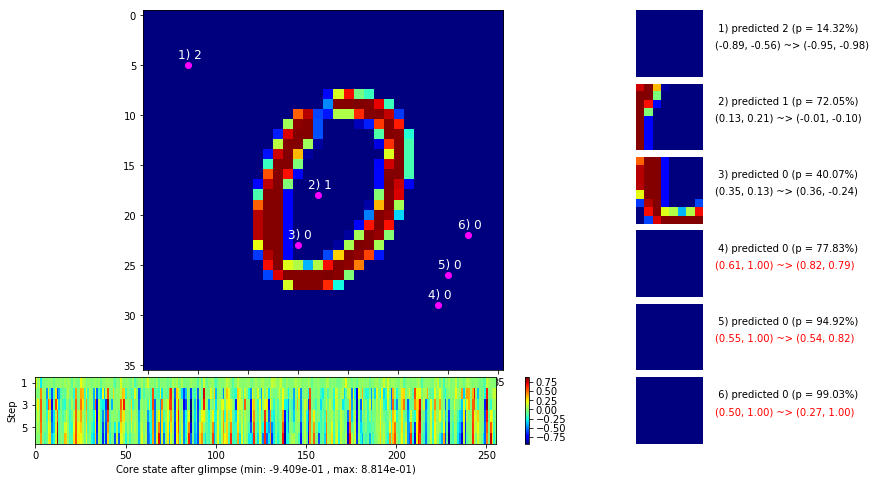

 b   2500/  3000 >> 138.5 ms/b | lr: 7.48e-05 | grad 2norm:  7.45 | grad inf norm:  1.845
       Weights || abs max:  0.87 (367276.47) | mean: -2.25e-03 ( 0.72) | var: 8.14e-03 (50668180.00)
        Biases || abs max:  0.86 ( 5985.25) | mean:  2.11e-02 ( 4.78) | var: 3.53e-03 (603227.81)
                  class loss: 0.478 | steps: 2.557 | reward:  0.835 | acc.: 83.54%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 138.0 ms/b | lr: 7.44e-05 | grad 2norm:  7.54 | grad inf norm:  1.786
       Weights || abs max:  0.87 (44631.51) | mean: -2.26e-03 ( 0.19) | var: 8.16e-03 (46475.00)
        Biases || abs max:  0.86 ( 9839.14) | mean:  2.11e-02 ( 6.42) | var: 3.55e-03 (4143053.00)
                  class loss: 0.477 | steps: 2.564 | reward:  0.839 | acc.: 83.94%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

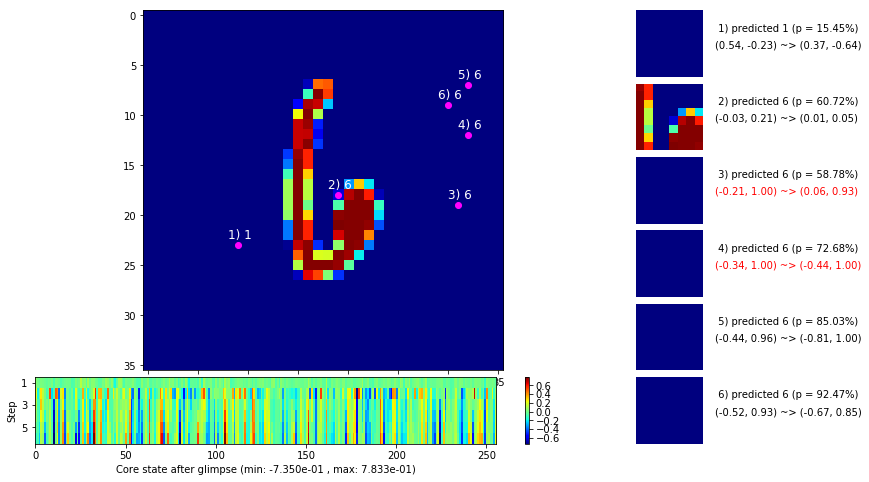

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


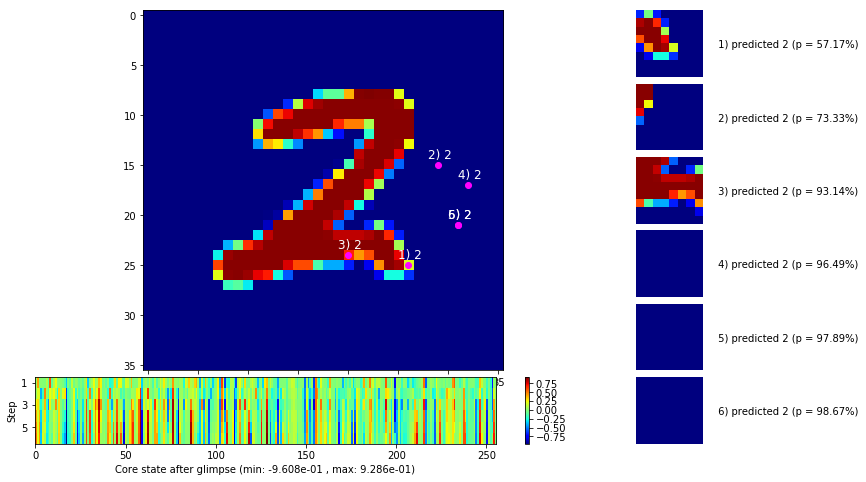


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


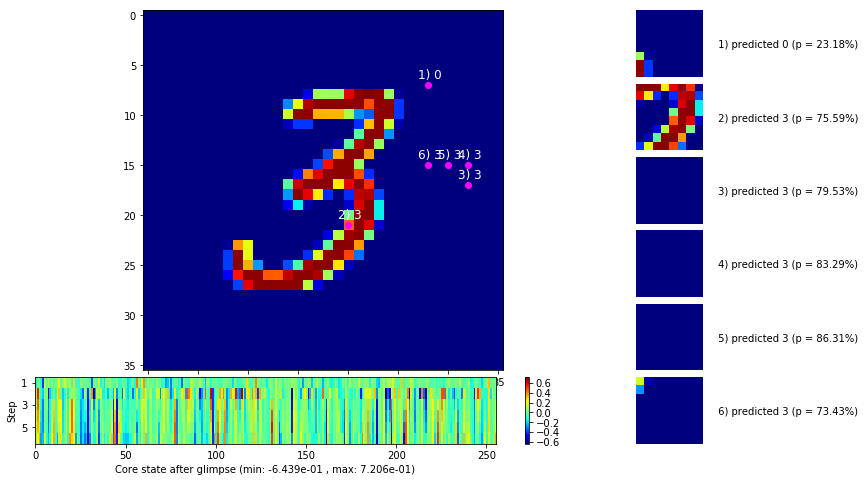

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


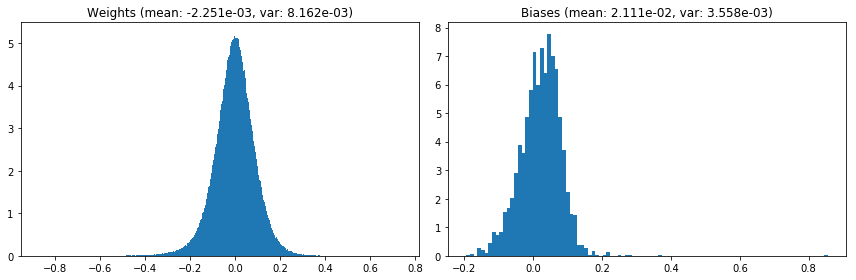

                                      Location network weights and biases


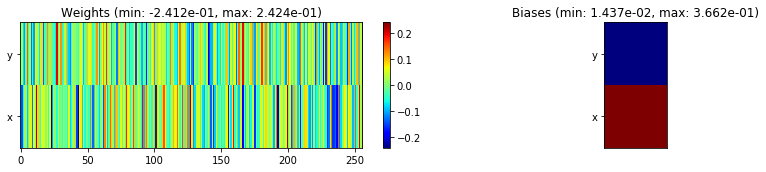

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.82 sec | TRAIN >> class loss: 0.4786 | steps:  2.568    | reward:  0.8362 :( | acc.: 83.617% :(
                          | VAL   >> class loss: 0.3983 | steps:  2.370 :( | reward:  0.8660 :( | acc.: 86.600% :(


Epoch  29/400) lr = 7.423e-05
 b    500/  3000 >> 132.2 ms/b | lr: 7.39e-05 | grad 2norm:  7.39 | grad inf norm:  1.701
       Weights || abs max:  0.87 (69765.48) | mean: -2.26e-03 ( 0.22) | var: 8.17e-03 (375582.25)
        Biases || abs max:  0.86 (10763.48) | mean:  2.11e-02 ( 6.36) | var: 3.56e-03 (2730297.00)
                  class loss: 0.472 | steps: 2.559 | reward:  0.839 | acc.: 83.85%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.9 ms/b | lr: 7.35e-05 | grad 2norm:  7.37 | grad inf norm:  1.832
       Weights || abs max:  0.87 (69157.43) | mean: -2.26e-03 ( 0.22

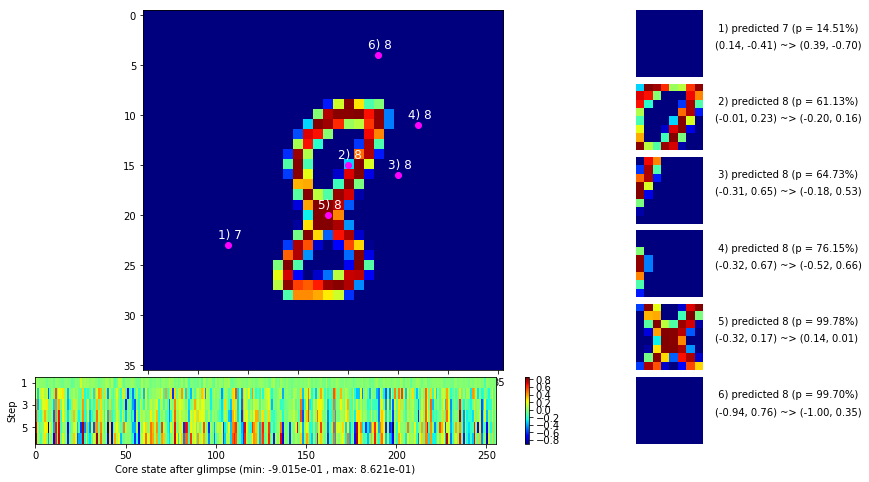

 b   1500/  3000 >> 134.6 ms/b | lr: 7.30e-05 | grad 2norm:  7.45 | grad inf norm:  1.842
       Weights || abs max:  0.87 (74114.85) | mean: -2.24e-03 ( 0.23) | var: 8.20e-03 (1051627.75)
        Biases || abs max:  0.86 (11707.80) | mean:  2.12e-02 ( 6.73) | var: 3.58e-03 (4072127.75)
                  class loss: 0.493 | steps: 2.605 | reward:  0.830 | acc.: 82.99%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.9 ms/b | lr: 7.27e-05 | grad 2norm:  7.47 | grad inf norm:  1.849
       Weights || abs max:  0.87 (33936.99) | mean: -2.28e-03 ( 0.16) | var: 8.21e-03 (55784.21)
        Biases || abs max:  0.85 (15430.08) | mean:  2.10e-02 ( 8.85) | var: 3.58e-03 (13266619.00)
                  class loss: 0.510 | steps: 2.622 | reward:  0.827 | acc.: 82.72%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

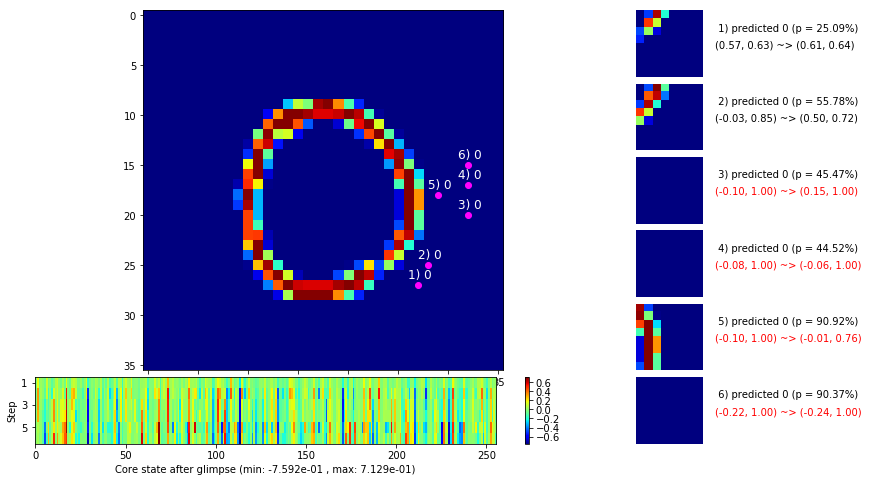

 b   2500/  3000 >> 135.0 ms/b | lr: 7.22e-05 | grad 2norm:  7.41 | grad inf norm:  1.853
       Weights || abs max:  0.87 (53281.21) | mean: -2.29e-03 ( 0.20) | var: 8.22e-03 (467497.59)
        Biases || abs max:  0.85 (10119.75) | mean:  2.10e-02 ( 6.12) | var: 3.59e-03 (3762156.50)
                  class loss: 0.495 | steps: 2.581 | reward:  0.832 | acc.: 83.22%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.3 ms/b | lr: 7.18e-05 | grad 2norm:  7.32 | grad inf norm:  1.707
       Weights || abs max:  0.87 (26352.71) | mean: -2.27e-03 ( 0.15) | var: 8.24e-03 (24091.60)
        Biases || abs max:  0.86 ( 8459.30) | mean:  2.12e-02 ( 5.61) | var: 3.60e-03 (1137052.38)
                  class loss: 0.464 | steps: 2.546 | reward:  0.844 | acc.: 84.38%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

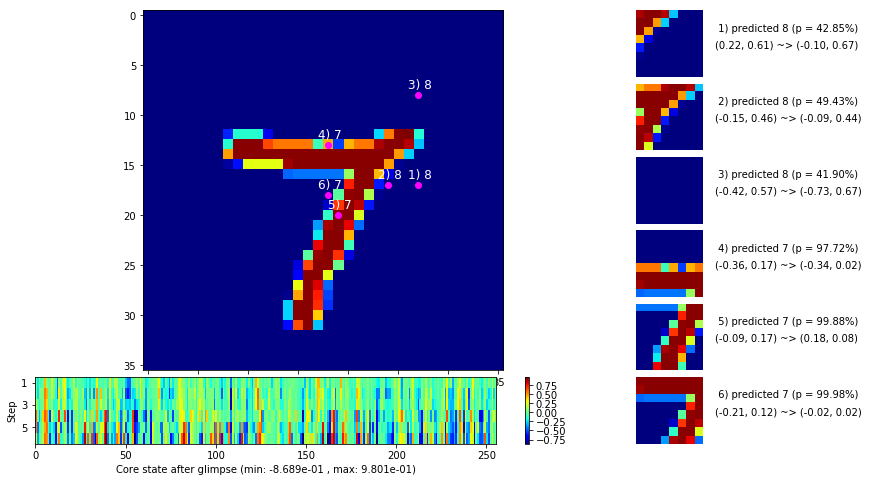

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


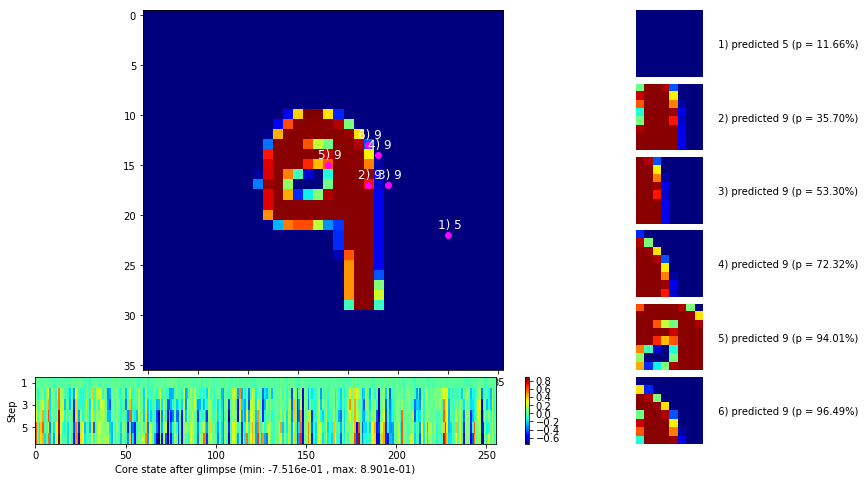


	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


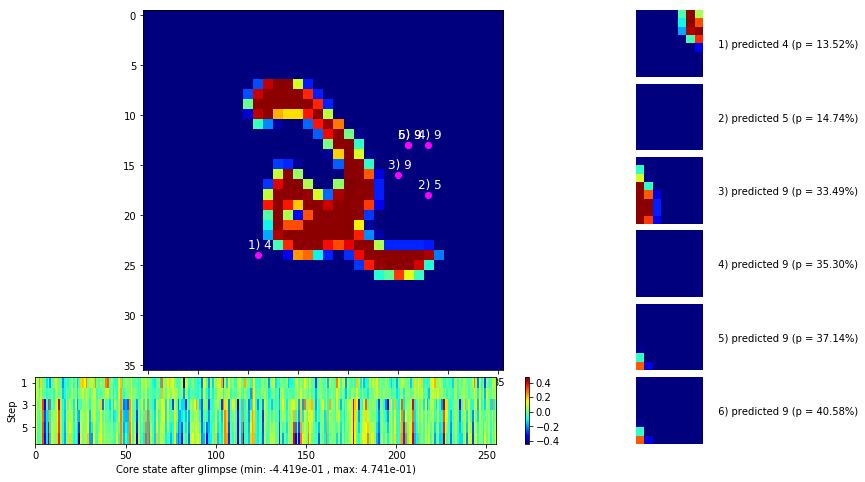

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


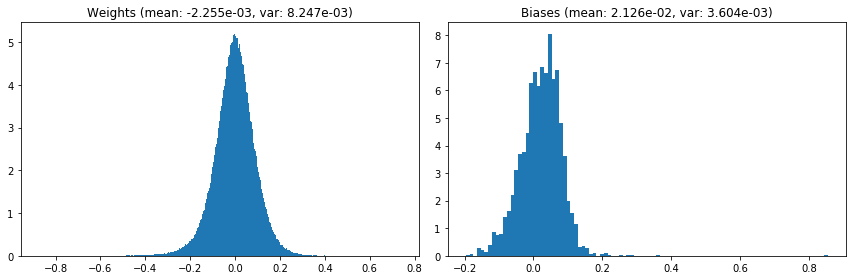

                                      Location network weights and biases


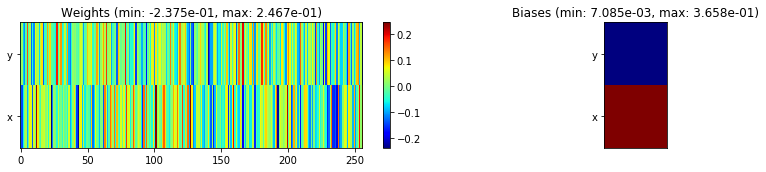

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.53 sec | TRAIN >> class loss: 0.4851 | steps:  2.578 :( | reward:  0.8347 :( | acc.: 83.472% :(
                          | VAL   >> class loss: 0.4089 | steps:  2.378 :( | reward:  0.8636 :( | acc.: 86.360% :(


Epoch  30/400) lr = 7.167e-05
 b    500/  3000 >> 136.3 ms/b | lr: 7.13e-05 | grad 2norm:  7.41 | grad inf norm:  1.814
       Weights || abs max:  0.87 (93459.01) | mean: -2.25e-03 ( 0.26) | var: 8.25e-03 (1656255.12)
        Biases || abs max:  0.86 ( 8214.50) | mean:  2.12e-02 ( 6.34) | var: 3.61e-03 (1043491.31)
                  class loss: 0.469 | steps: 2.561 | reward:  0.839 | acc.: 83.88%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.8 ms/b | lr: 7.10e-05 | grad 2norm:  7.26 | grad inf norm:  1.744
       Weights || abs max:  0.88 (49493.86) | mean: -2.25e-03 ( 0.1

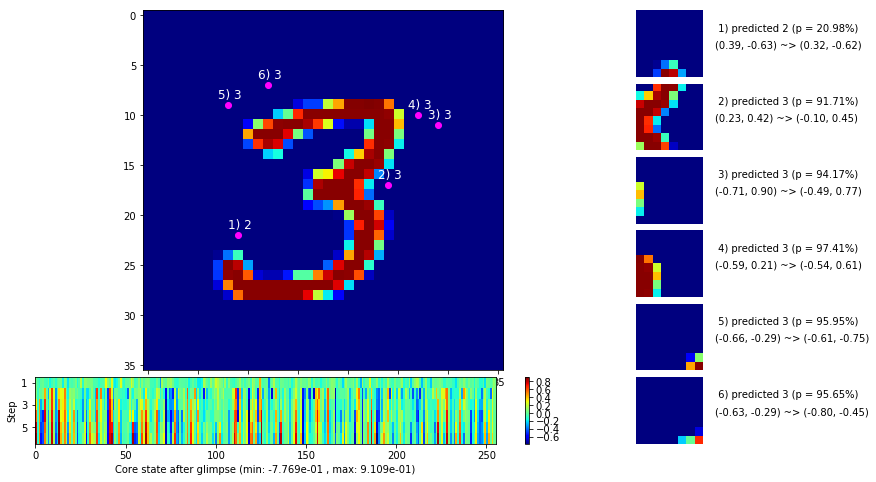

 b   1500/  3000 >> 135.6 ms/b | lr: 7.05e-05 | grad 2norm:  7.48 | grad inf norm:  1.812
       Weights || abs max:  0.88 (42140.48) | mean: -2.27e-03 ( 0.18) | var: 8.28e-03 (50086.46)
        Biases || abs max:  0.86 (13658.89) | mean:  2.11e-02 ( 8.29) | var: 3.62e-03 (3656286.25)
                  class loss: 0.480 | steps: 2.573 | reward:  0.833 | acc.: 83.31%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.3 ms/b | lr: 7.02e-05 | grad 2norm:  7.46 | grad inf norm:  1.846
       Weights || abs max:  0.88 (45328.70) | mean: -2.28e-03 ( 0.18) | var: 8.29e-03 (105552.91)
        Biases || abs max:  0.86 (10854.75) | mean:  2.11e-02 ( 6.49) | var: 3.63e-03 (4628039.50)
                  class loss: 0.471 | steps: 2.530 | reward:  0.838 | acc.: 83.84%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

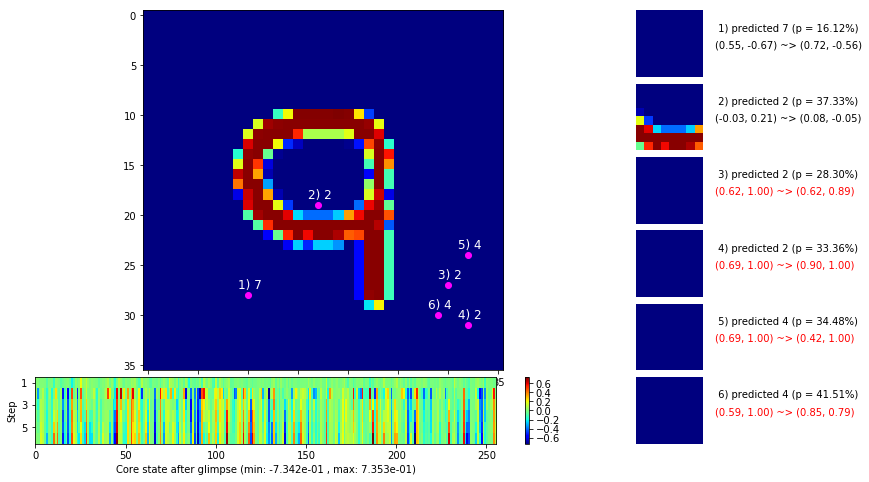

 b   2500/  3000 >> 135.6 ms/b | lr: 6.98e-05 | grad 2norm:  7.57 | grad inf norm:  1.892
       Weights || abs max:  0.88 (59402.00) | mean: -2.28e-03 ( 0.20) | var: 8.30e-03 (528495.56)
        Biases || abs max:  0.86 ( 8902.43) | mean:  2.11e-02 ( 5.84) | var: 3.64e-03 (2527548.75)
                  class loss: 0.484 | steps: 2.571 | reward:  0.834 | acc.: 83.41%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.6 ms/b | lr: 6.94e-05 | grad 2norm:  7.31 | grad inf norm:  1.768
       Weights || abs max:  0.88 (46479.03) | mean: -2.30e-03 ( 0.19) | var: 8.31e-03 (108805.53)
        Biases || abs max:  0.86 ( 7629.72) | mean:  2.11e-02 ( 5.26) | var: 3.64e-03 (700282.25)
                  class loss: 0.472 | steps: 2.538 | reward:  0.841 | acc.: 84.07%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

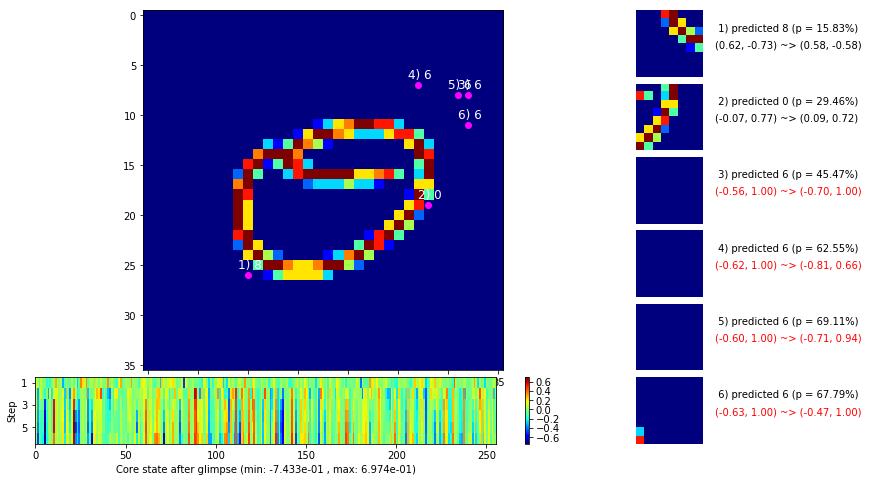

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


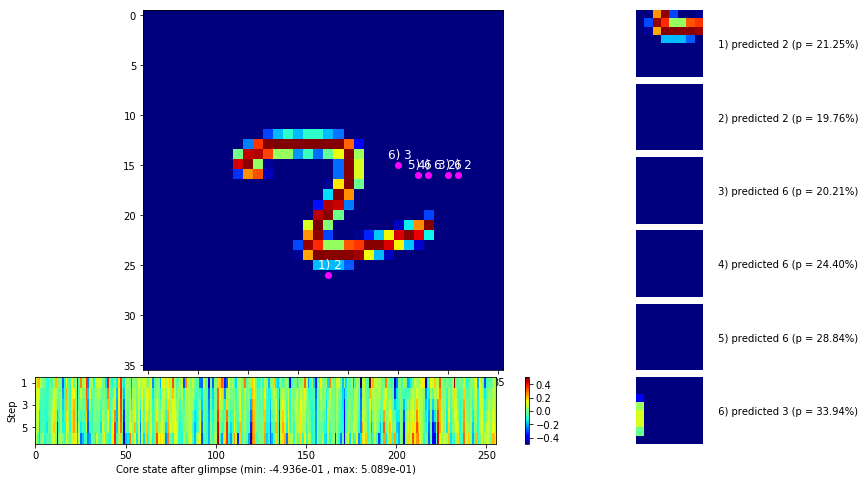


	Target class: 0  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


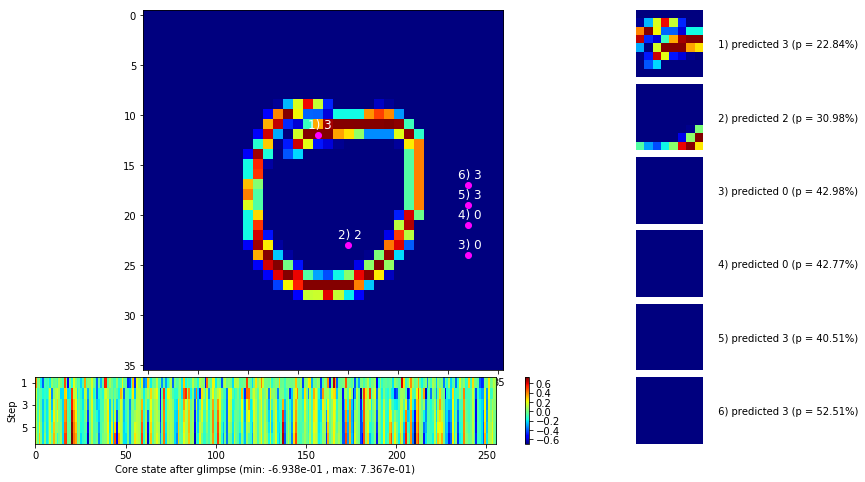

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


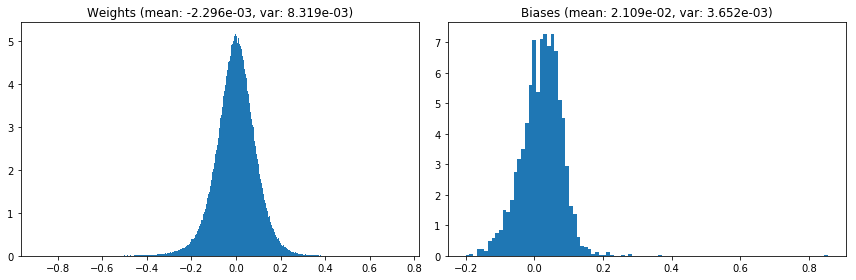

                                      Location network weights and biases


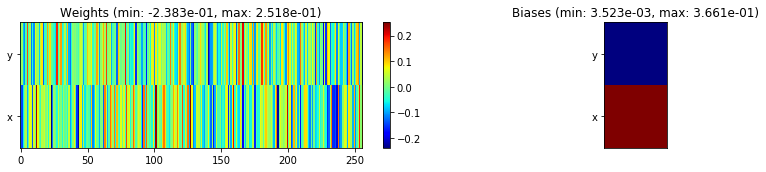

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.63 sec | TRAIN >> class loss: 0.4734 | steps:  2.557    | reward:  0.8387 :( | acc.: 83.875% :(
                          | VAL   >> class loss: 0.3868 | steps:  2.344 :( | reward:  0.8744    | acc.: 87.440% 


Epoch  31/400) lr = 6.929e-05
 b    500/  3000 >> 134.8 ms/b | lr: 6.90e-05 | grad 2norm:  7.44 | grad inf norm:  1.793
       Weights || abs max:  0.89 (41242.18) | mean: -2.29e-03 ( 0.18) | var: 8.33e-03 (88899.92)
        Biases || abs max:  0.86 ( 5685.24) | mean:  2.12e-02 ( 4.86) | var: 3.65e-03 (275993.16)
                  class loss: 0.455 | steps: 2.523 | reward:  0.841 | acc.: 84.11%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.4 ms/b | lr: 6.87e-05 | grad 2norm:  7.38 | grad inf norm:  1.813
       Weights || abs max:  0.89 (32733.02) | mean: -2.30e-03 ( 0.16) | 

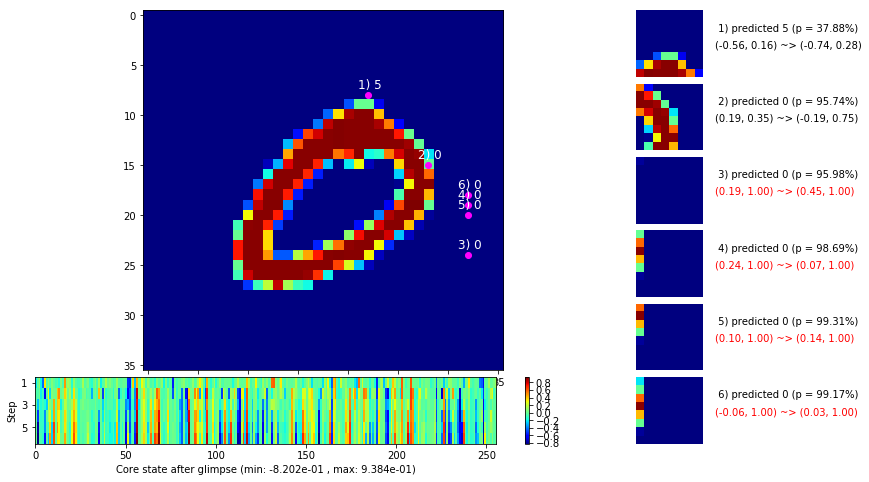

 b   1500/  3000 >> 138.1 ms/b | lr: 6.82e-05 | grad 2norm:  7.25 | grad inf norm:  1.794
       Weights || abs max:  0.90 (32676.55) | mean: -2.31e-03 ( 0.16) | var: 8.35e-03 (44882.37)
        Biases || abs max:  0.86 (19192.93) | mean:  2.11e-02 (10.49) | var: 3.67e-03 (3719731.25)
                  class loss: 0.455 | steps: 2.525 | reward:  0.848 | acc.: 84.78%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 137.9 ms/b | lr: 6.79e-05 | grad 2norm:  7.28 | grad inf norm:  1.759
       Weights || abs max:  0.90 (197571.44) | mean: -2.32e-03 ( 0.43) | var: 8.36e-03 (23369452.00)
        Biases || abs max:  0.86 ( 5177.12) | mean:  2.11e-02 ( 4.21) | var: 3.67e-03 (162941.72)
                  class loss: 0.454 | steps: 2.524 | reward:  0.846 | acc.: 84.56%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

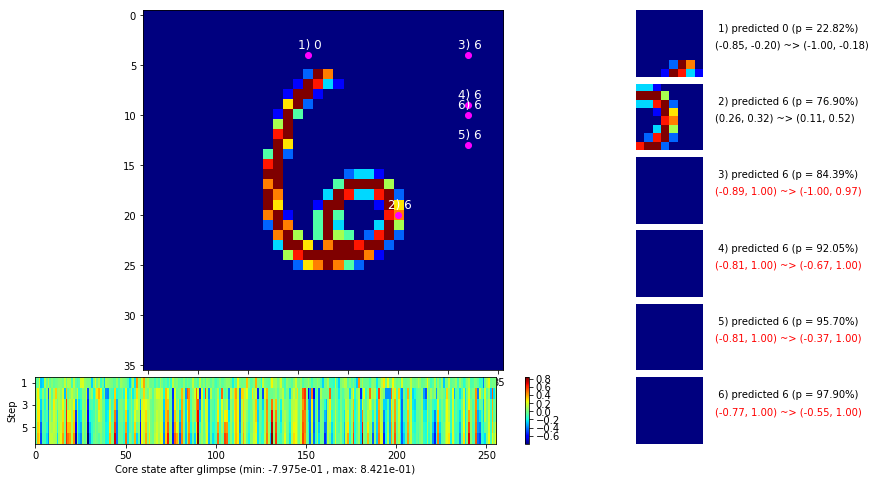

 b   2500/  3000 >> 139.6 ms/b | lr: 6.75e-05 | grad 2norm:  7.44 | grad inf norm:  1.808
       Weights || abs max:  0.90 (29916.04) | mean: -2.30e-03 ( 0.16) | var: 8.38e-03 (15462.24)
        Biases || abs max:  0.86 ( 6827.63) | mean:  2.12e-02 ( 5.22) | var: 3.68e-03 (339072.91)
                  class loss: 0.466 | steps: 2.540 | reward:  0.840 | acc.: 84.00%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.7 ms/b | lr: 6.72e-05 | grad 2norm:  7.28 | grad inf norm:  1.769
       Weights || abs max:  0.91 (44814.11) | mean: -2.30e-03 ( 0.19) | var: 8.39e-03 (53714.75)
        Biases || abs max:  0.86 (67793.95) | mean:  2.12e-02 (29.10) | var: 3.68e-03 (448026624.00)
                  class loss: 0.451 | steps: 2.539 | reward:  0.845 | acc.: 84.50%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

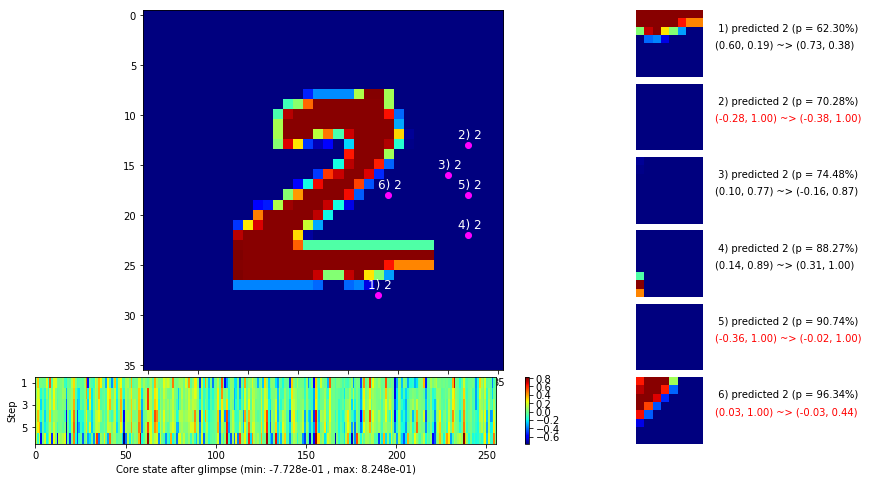

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


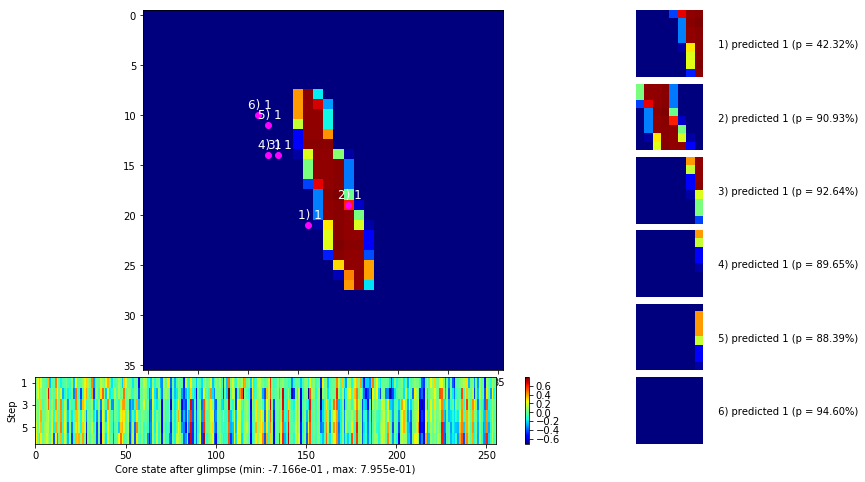


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


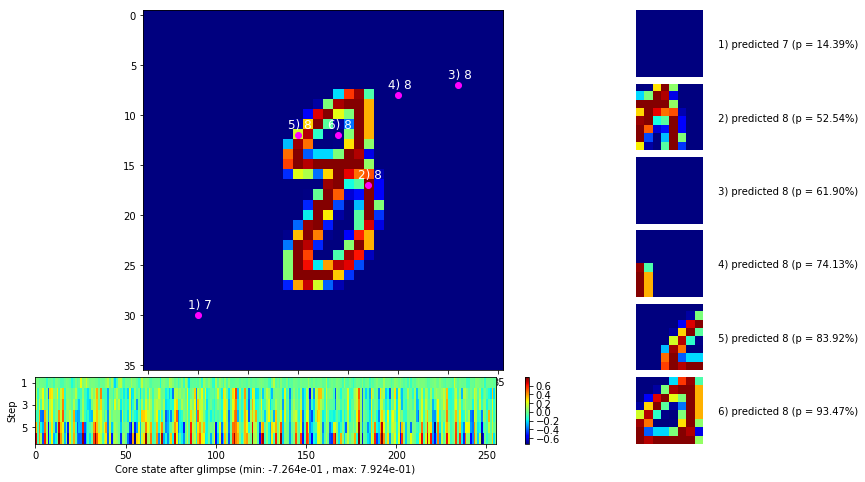

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


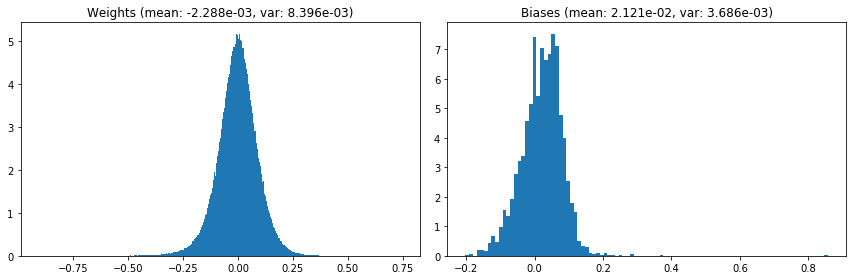

                                      Location network weights and biases


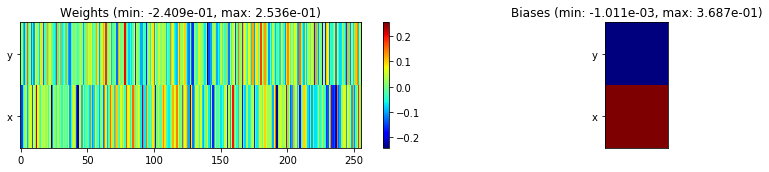

---------------------------------------------------------------------------------------------------------------
Elapsed time:  411.32 sec | TRAIN >> class loss: 0.4585 | steps:  2.536    | reward:  0.8430 :( | acc.: 84.305% :(
                          | VAL   >> class loss: 0.3814 | steps:  2.296    | reward:  0.8756    | acc.: 87.560% 


Epoch  32/400) lr = 6.706e-05
 b    500/  3000 >> 134.4 ms/b | lr: 6.68e-05 | grad 2norm:  7.47 | grad inf norm:  1.784
       Weights || abs max:  0.91 (51034.65) | mean: -2.27e-03 ( 0.20) | var: 8.40e-03 (122697.77)
        Biases || abs max:  0.86 ( 6523.11) | mean:  2.13e-02 ( 4.85) | var: 3.69e-03 (384084.44)
                  class loss: 0.467 | steps: 2.546 | reward:  0.840 | acc.: 84.04%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.3 ms/b | lr: 6.65e-05 | grad 2norm:  7.42 | grad inf norm:  1.834
       Weights || abs max:  0.91 (116077.91) | mean: -2.30e-03 ( 0.30) 

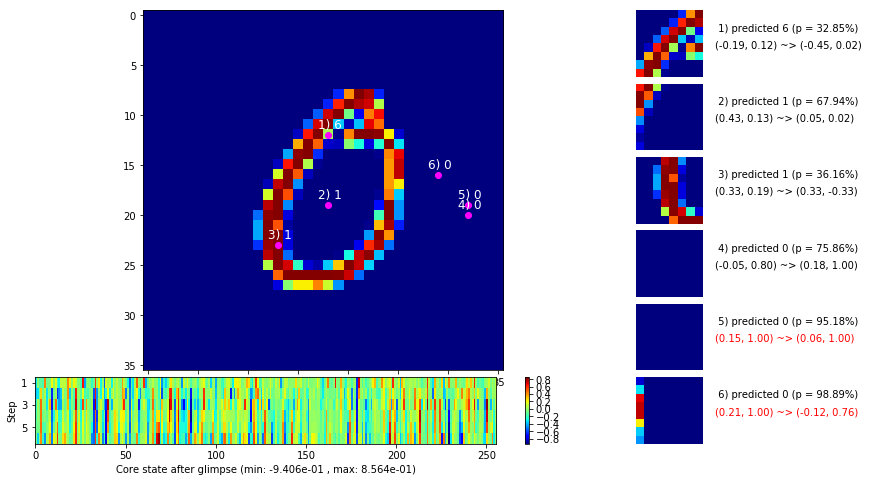

 b   1500/  3000 >> 134.9 ms/b | lr: 6.61e-05 | grad 2norm:  7.28 | grad inf norm:  1.764
       Weights || abs max:  0.92 (62471.07) | mean: -2.29e-03 ( 0.22) | var: 8.42e-03 (436371.78)
        Biases || abs max:  0.86 (15441.62) | mean:  2.12e-02 ( 8.42) | var: 3.72e-03 (4093399.00)
                  class loss: 0.442 | steps: 2.504 | reward:  0.850 | acc.: 84.98%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.2 ms/b | lr: 6.58e-05 | grad 2norm:  7.26 | grad inf norm:  1.710
       Weights || abs max:  0.92 (44575.59) | mean: -2.28e-03 ( 0.18) | var: 8.44e-03 (113073.38)
        Biases || abs max:  0.86 ( 3865.50) | mean:  2.13e-02 ( 3.50) | var: 3.73e-03 (150733.02)
                  class loss: 0.452 | steps: 2.517 | reward:  0.848 | acc.: 84.83%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

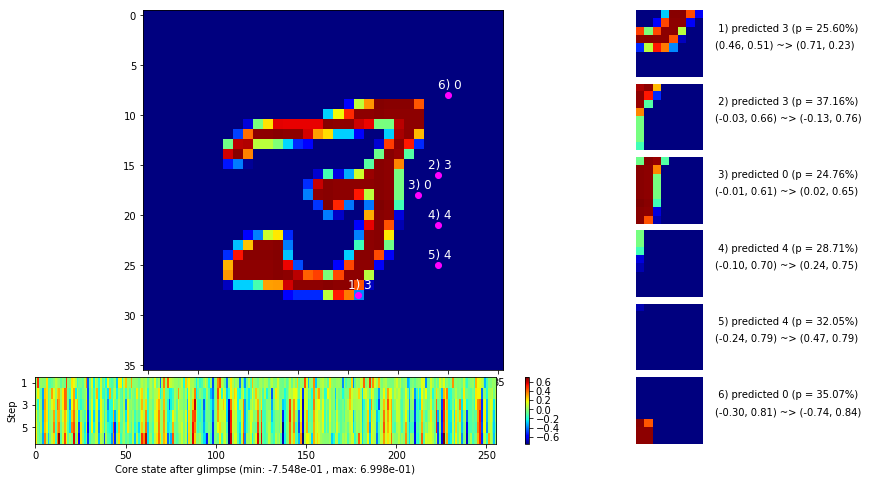

 b   2500/  3000 >> 134.9 ms/b | lr: 6.54e-05 | grad 2norm:  7.33 | grad inf norm:  1.772
       Weights || abs max:  0.92 (32183.38) | mean: -2.27e-03 ( 0.16) | var: 8.45e-03 (33947.29)
        Biases || abs max:  0.86 ( 5858.45) | mean:  2.13e-02 ( 4.69) | var: 3.74e-03 (290828.25)
                  class loss: 0.469 | steps: 2.544 | reward:  0.843 | acc.: 84.25%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.2 ms/b | lr: 6.51e-05 | grad 2norm:  7.27 | grad inf norm:  1.716
       Weights || abs max:  0.92 (30138.67) | mean: -2.28e-03 ( 0.16) | var: 8.46e-03 (15639.15)
        Biases || abs max:  0.86 ( 8620.65) | mean:  2.12e-02 ( 5.53) | var: 3.74e-03 (1562194.88)
                  class loss: 0.447 | steps: 2.511 | reward:  0.844 | acc.: 84.44%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

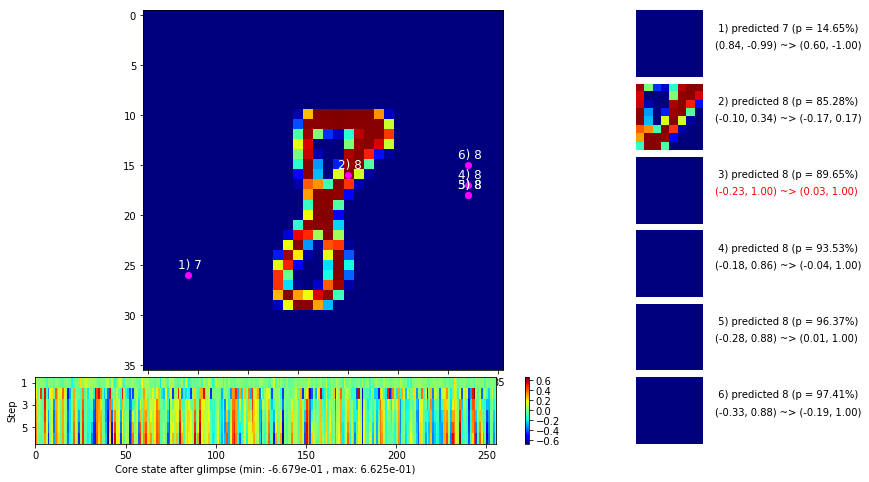

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


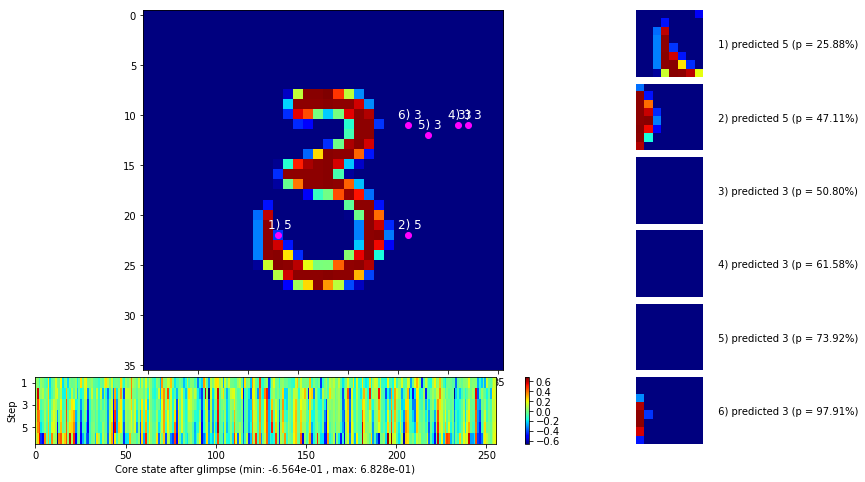


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


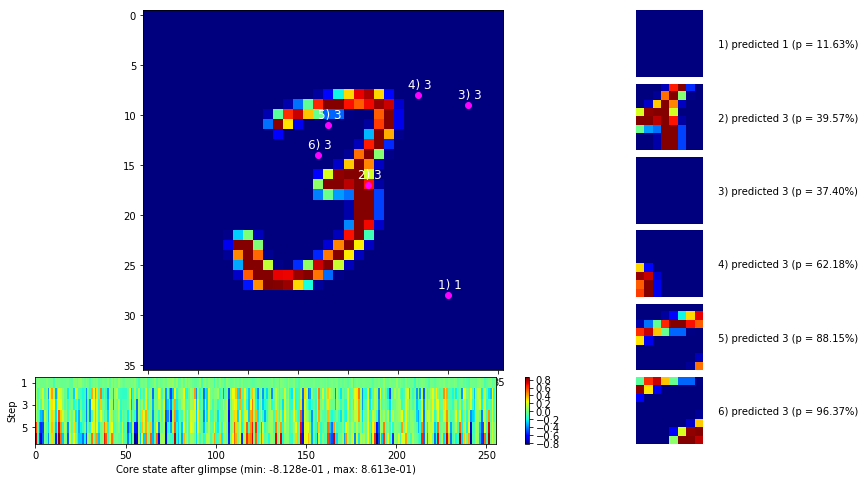

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


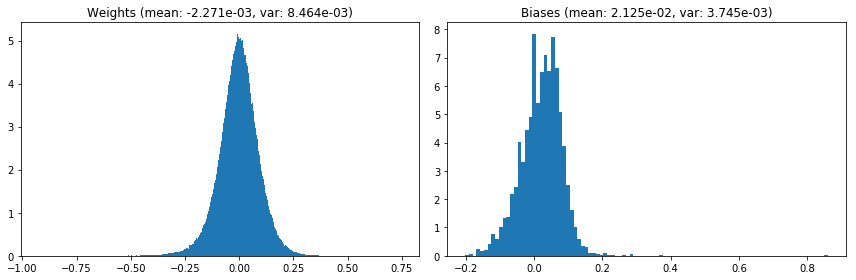

                                      Location network weights and biases


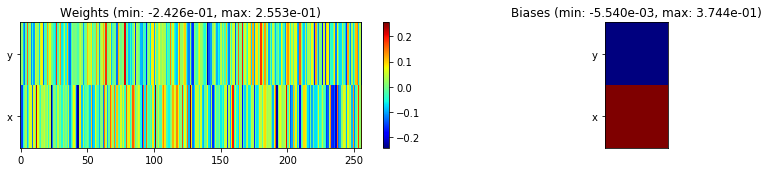

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.13 sec | TRAIN >> class loss: 0.4569 | steps:  2.529    | reward:  0.8440 :( | acc.: 84.405% :(
                          | VAL   >> class loss: 0.3772 | steps:  2.332 :( | reward:  0.8742 :( | acc.: 87.420% :(


Epoch  33/400) lr = 6.497e-05
 b    500/  3000 >> 135.9 ms/b | lr: 6.47e-05 | grad 2norm:  7.44 | grad inf norm:  1.729
       Weights || abs max:  0.92 (42683.61) | mean: -2.27e-03 ( 0.19) | var: 8.47e-03 (53408.02)
        Biases || abs max:  0.86 ( 7086.55) | mean:  2.13e-02 ( 5.37) | var: 3.75e-03 (700554.19)
                  class loss: 0.457 | steps: 2.530 | reward:  0.845 | acc.: 84.46%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.1 ms/b | lr: 6.44e-05 | grad 2norm:  7.44 | grad inf norm:  1.715
       Weights || abs max:  0.93 (60833.96) | mean: -2.30e-03 ( 0.21) 

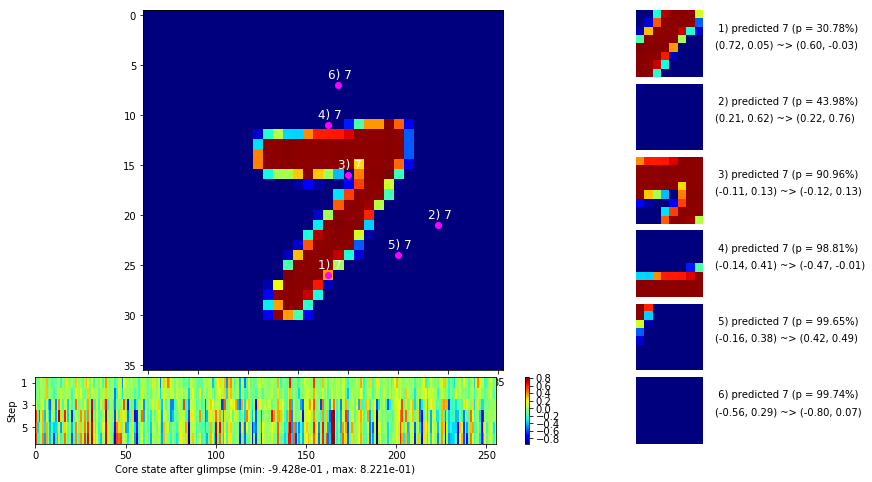

 b   1500/  3000 >> 132.6 ms/b | lr: 6.40e-05 | grad 2norm:  7.56 | grad inf norm:  1.895
       Weights || abs max:  0.93 (57765.41) | mean: -2.29e-03 ( 0.21) | var: 8.49e-03 (430455.03)
        Biases || abs max:  0.86 ( 8961.18) | mean:  2.12e-02 ( 5.75) | var: 3.76e-03 (1201630.38)
                  class loss: 0.480 | steps: 2.525 | reward:  0.836 | acc.: 83.55%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.9 ms/b | lr: 6.38e-05 | grad 2norm:  7.52 | grad inf norm:  1.852
       Weights || abs max:  0.93 (68775.55) | mean: -2.29e-03 ( 0.22) | var: 8.50e-03 (408800.12)
        Biases || abs max:  0.86 ( 6959.95) | mean:  2.12e-02 ( 5.14) | var: 3.76e-03 (554838.31)
                  class loss: 0.481 | steps: 2.544 | reward:  0.837 | acc.: 83.69%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

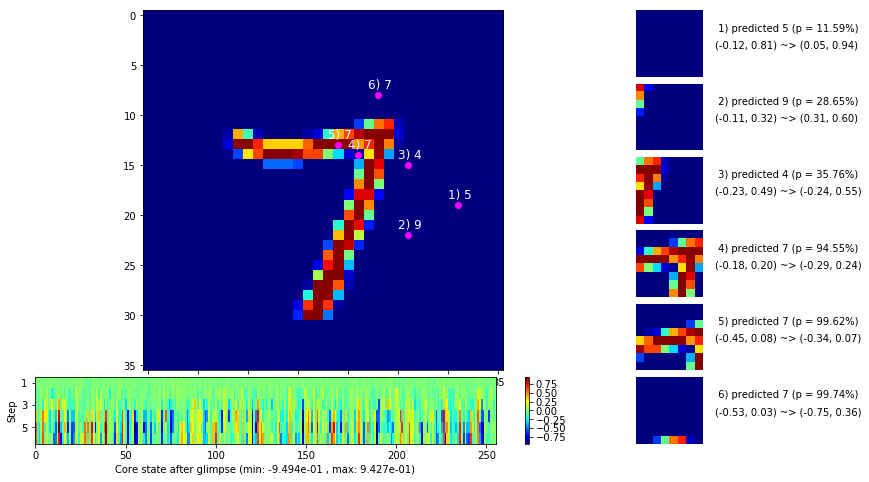

 b   2500/  3000 >> 133.4 ms/b | lr: 6.34e-05 | grad 2norm:  7.53 | grad inf norm:  1.849
       Weights || abs max:  0.93 (31295.08) | mean: -2.31e-03 ( 0.16) | var: 8.51e-03 (13365.26)
        Biases || abs max:  0.86 ( 6184.52) | mean:  2.11e-02 ( 4.45) | var: 3.76e-03 (326026.25)
                  class loss: 0.484 | steps: 2.546 | reward:  0.836 | acc.: 83.59%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.0 ms/b | lr: 6.31e-05 | grad 2norm:  7.34 | grad inf norm:  1.727
       Weights || abs max:  0.94 (40340.01) | mean: -2.33e-03 ( 0.18) | var: 8.52e-03 (81604.80)
        Biases || abs max:  0.86 ( 8741.95) | mean:  2.11e-02 ( 5.41) | var: 3.77e-03 (4640906.00)
                  class loss: 0.475 | steps: 2.562 | reward:  0.837 | acc.: 83.71%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

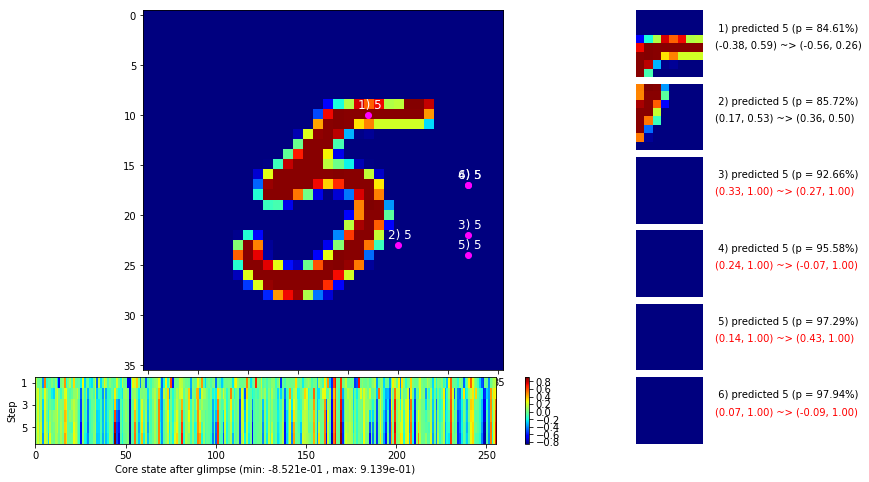

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


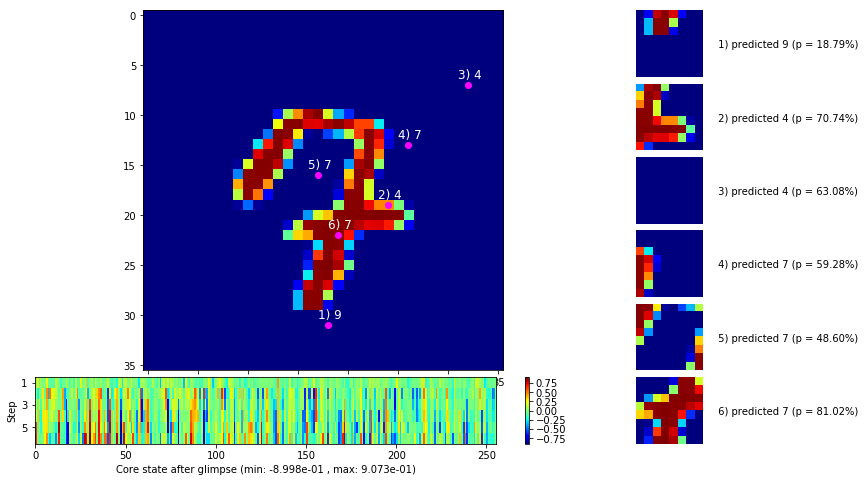


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


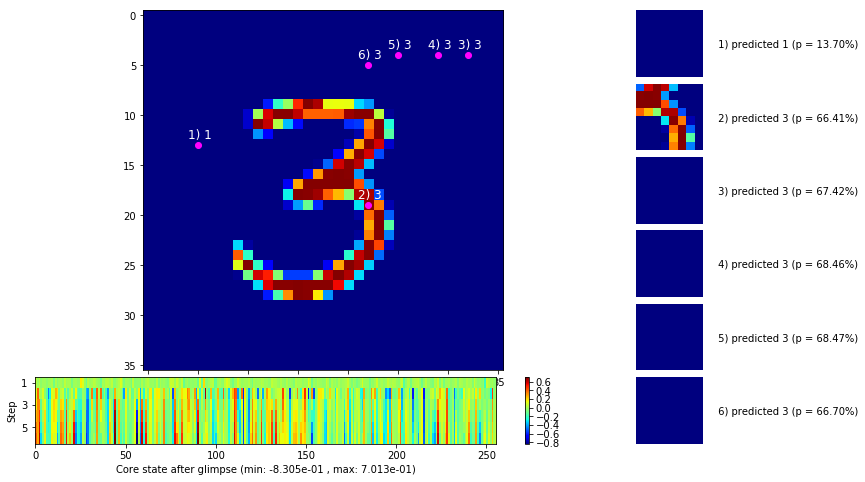

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


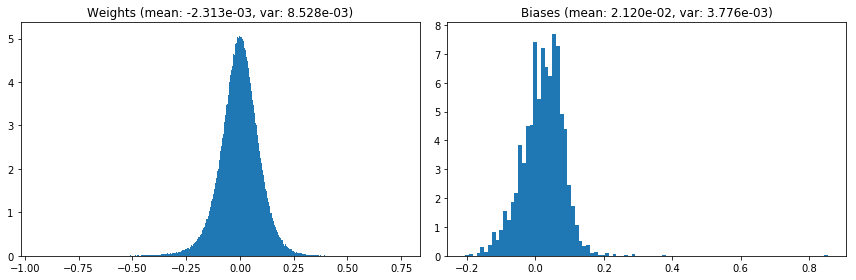

                                      Location network weights and biases


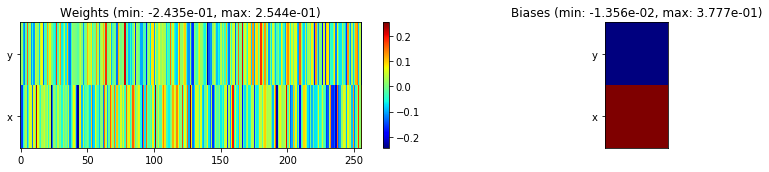

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.94 sec | TRAIN >> class loss: 0.4748 | steps:  2.539 :( | reward:  0.8380 :( | acc.: 83.803% :(
                          | VAL   >> class loss: 0.3853 | steps:  2.326 :( | reward:  0.8646 :( | acc.: 86.460% :(


Epoch  34/400) lr = 6.3e-05
 b    500/  3000 >> 134.4 ms/b | lr: 6.28e-05 | grad 2norm:  7.50 | grad inf norm:  1.838
       Weights || abs max:  0.94 (24799.86) | mean: -2.33e-03 ( 0.14) | var: 8.53e-03 (43094.78)
        Biases || abs max:  0.86 ( 4642.43) | mean:  2.12e-02 ( 4.14) | var: 3.78e-03 (288887.97)
                  class loss: 0.484 | steps: 2.552 | reward:  0.836 | acc.: 83.61%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.2 ms/b | lr: 6.25e-05 | grad 2norm:  7.46 | grad inf norm:  1.772
       Weights || abs max:  0.94 (94524.32) | mean: -2.34e-03 ( 0.27) | 

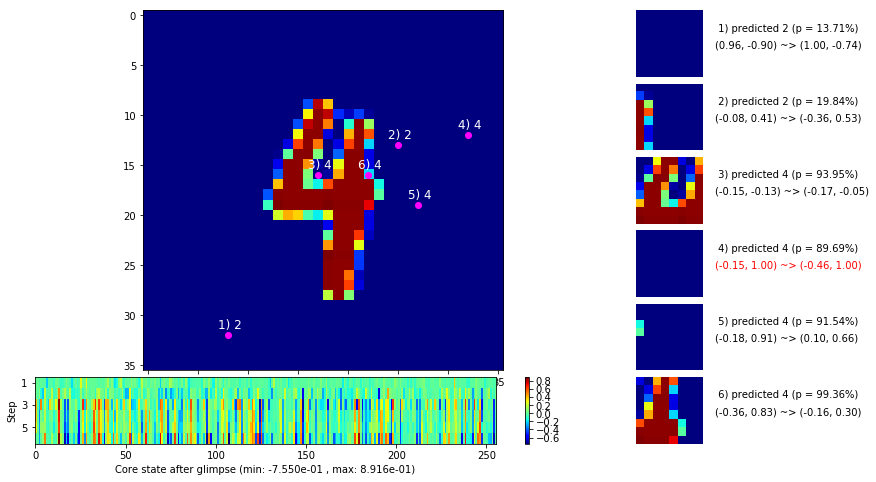

 b   1500/  3000 >> 138.7 ms/b | lr: 6.21e-05 | grad 2norm:  7.38 | grad inf norm:  1.801
       Weights || abs max:  0.94 (37776.83) | mean: -2.36e-03 ( 0.17) | var: 8.55e-03 (57431.17)
        Biases || abs max:  0.85 (10760.46) | mean:  2.11e-02 ( 6.45) | var: 3.79e-03 (5727909.50)
                  class loss: 0.469 | steps: 2.546 | reward:  0.837 | acc.: 83.66%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 136.4 ms/b | lr: 6.19e-05 | grad 2norm:  7.43 | grad inf norm:  1.828
       Weights || abs max:  0.95 (167447.31) | mean: -2.33e-03 ( 0.39) | var: 8.57e-03 (15976970.00)
        Biases || abs max:  0.86 (10361.75) | mean:  2.12e-02 ( 6.48) | var: 3.81e-03 (5328958.00)
                  class loss: 0.473 | steps: 2.533 | reward:  0.840 | acc.: 83.97%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

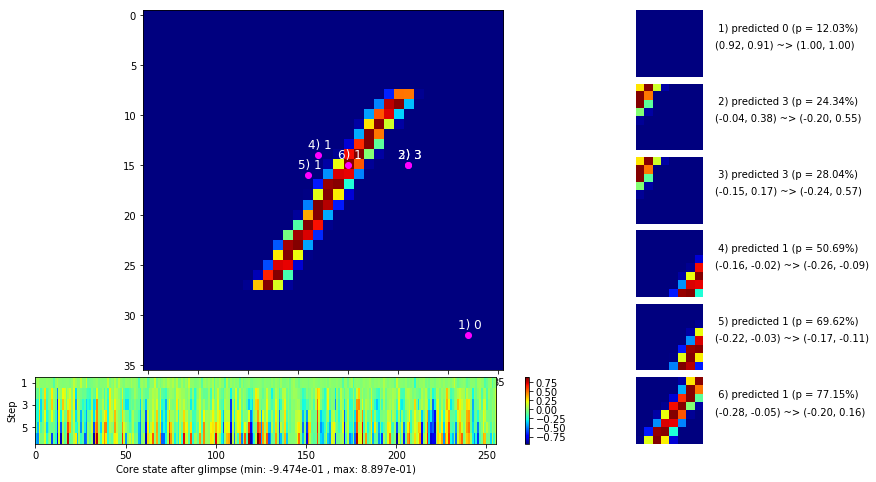

 b   2500/  3000 >> 137.8 ms/b | lr: 6.15e-05 | grad 2norm:  7.47 | grad inf norm:  1.834
       Weights || abs max:  0.95 (56006.21) | mean: -2.30e-03 ( 0.21) | var: 8.58e-03 (112062.80)
        Biases || abs max:  0.85 (11640.66) | mean:  2.12e-02 ( 7.27) | var: 3.81e-03 (3049726.25)
                  class loss: 0.476 | steps: 2.516 | reward:  0.835 | acc.: 83.48%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.4 ms/b | lr: 6.13e-05 | grad 2norm:  7.55 | grad inf norm:  1.800
       Weights || abs max:  0.95 (77672.76) | mean: -2.29e-03 ( 0.24) | var: 8.59e-03 (1085991.88)
        Biases || abs max:  0.85 ( 5536.26) | mean:  2.12e-02 ( 4.36) | var: 3.82e-03 (214470.92)
                  class loss: 0.480 | steps: 2.542 | reward:  0.833 | acc.: 83.27%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

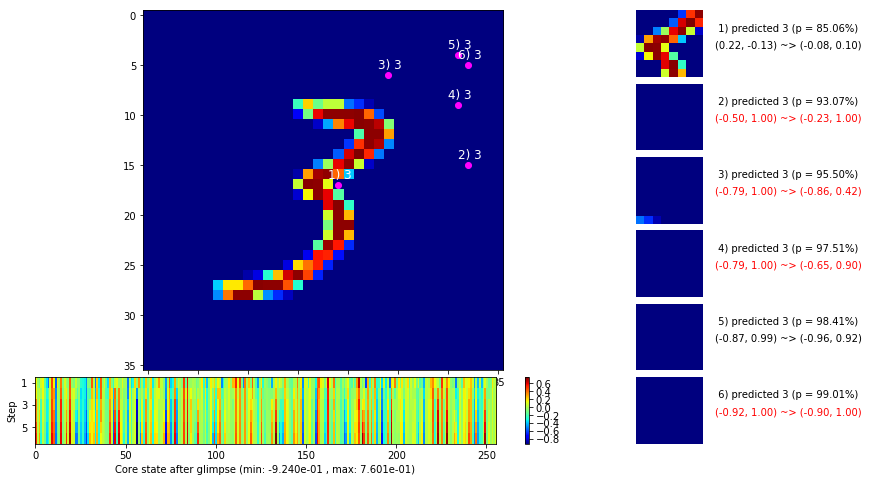

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


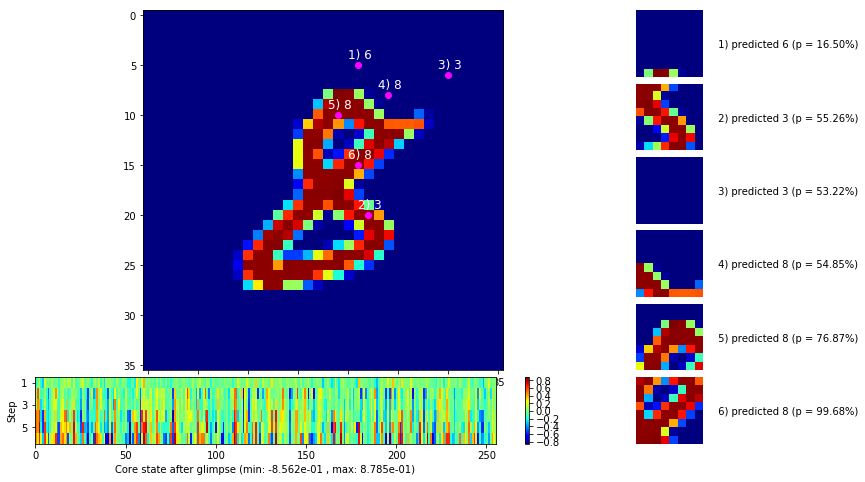


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


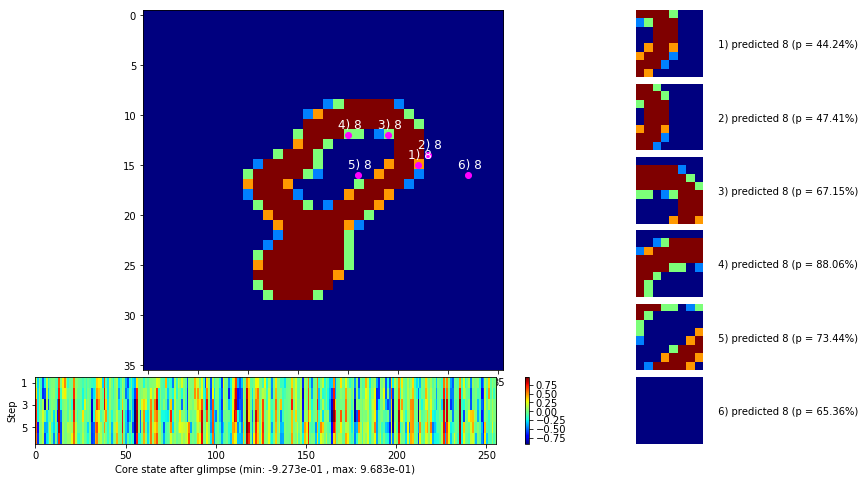

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


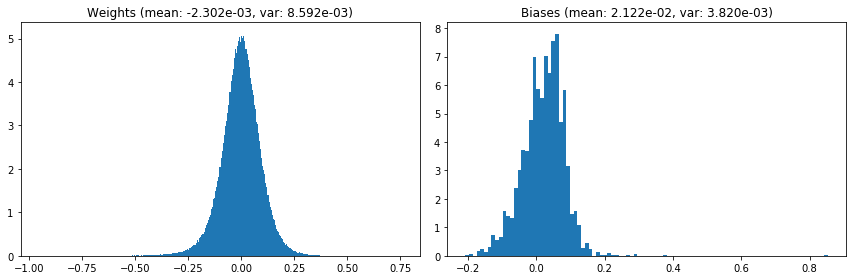

                                      Location network weights and biases


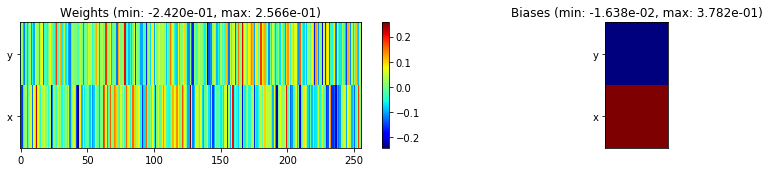

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.48 sec | TRAIN >> class loss: 0.4767 | steps:  2.539 :( | reward:  0.8360 :( | acc.: 83.598% :(
                          | VAL   >> class loss: 0.3989 | steps:  2.358 :( | reward:  0.8588 :( | acc.: 85.880% :(


Epoch  35/400) lr = 6.115e-05
 b    500/  3000 >> 134.7 ms/b | lr: 6.09e-05 | grad 2norm:  7.43 | grad inf norm:  1.803
       Weights || abs max:  0.96 (38702.96) | mean: -2.30e-03 ( 0.18) | var: 8.60e-03 (26803.26)
        Biases || abs max:  0.86 ( 3930.84) | mean:  2.12e-02 ( 3.47) | var: 3.83e-03 (76255.24)
                  class loss: 0.463 | steps: 2.524 | reward:  0.841 | acc.: 84.05%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.4 ms/b | lr: 6.07e-05 | grad 2norm:  7.34 | grad inf norm:  1.775
       Weights || abs max:  0.96 (43424.88) | mean: -2.31e-03 ( 0.18) |

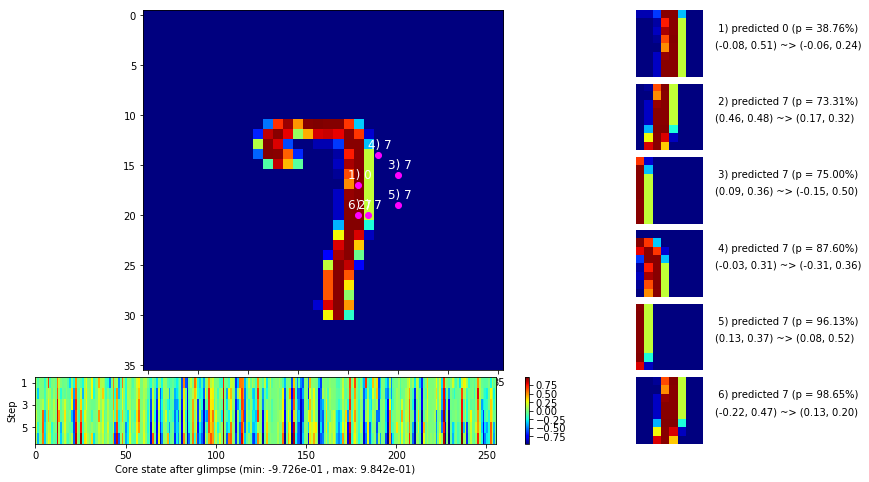

 b   1500/  3000 >> 135.1 ms/b | lr: 6.03e-05 | grad 2norm:  7.50 | grad inf norm:  1.817
       Weights || abs max:  0.96 (39824.12) | mean: -2.33e-03 ( 0.18) | var: 8.62e-03 (35608.31)
        Biases || abs max:  0.86 ( 6079.51) | mean:  2.11e-02 ( 5.18) | var: 3.83e-03 (345345.91)
                  class loss: 0.507 | steps: 2.593 | reward:  0.828 | acc.: 82.75%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.3 ms/b | lr: 6.01e-05 | grad 2norm:  7.23 | grad inf norm:  1.714
       Weights || abs max:  0.97 (67795.48) | mean: -2.34e-03 ( 0.22) | var: 8.63e-03 (324890.88)
        Biases || abs max:  0.86 (25220.72) | mean:  2.11e-02 (12.31) | var: 3.84e-03 (68994304.00)
                  class loss: 0.449 | steps: 2.485 | reward:  0.849 | acc.: 84.94%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

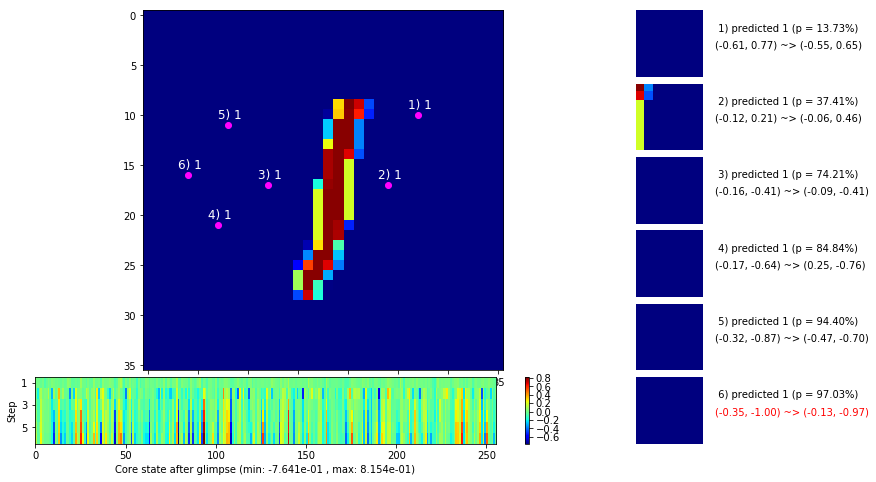

 b   2500/  3000 >> 136.8 ms/b | lr: 5.98e-05 | grad 2norm:  7.45 | grad inf norm:  1.878
       Weights || abs max:  0.97 (57816.11) | mean: -2.34e-03 ( 0.22) | var: 8.64e-03 (192677.05)
        Biases || abs max:  0.86 (14982.94) | mean:  2.11e-02 ( 7.95) | var: 3.85e-03 (11064656.00)
                  class loss: 0.482 | steps: 2.527 | reward:  0.835 | acc.: 83.50%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.8 ms/b | lr: 5.95e-05 | grad 2norm:  7.44 | grad inf norm:  1.824
       Weights || abs max:  0.97 (101968.21) | mean: -2.30e-03 ( 0.28) | var: 8.65e-03 (1445072.88)
        Biases || abs max:  0.86 ( 9477.42) | mean:  2.12e-02 ( 6.53) | var: 3.86e-03 (988018.12)
                  class loss: 0.474 | steps: 2.514 | reward:  0.836 | acc.: 83.62%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

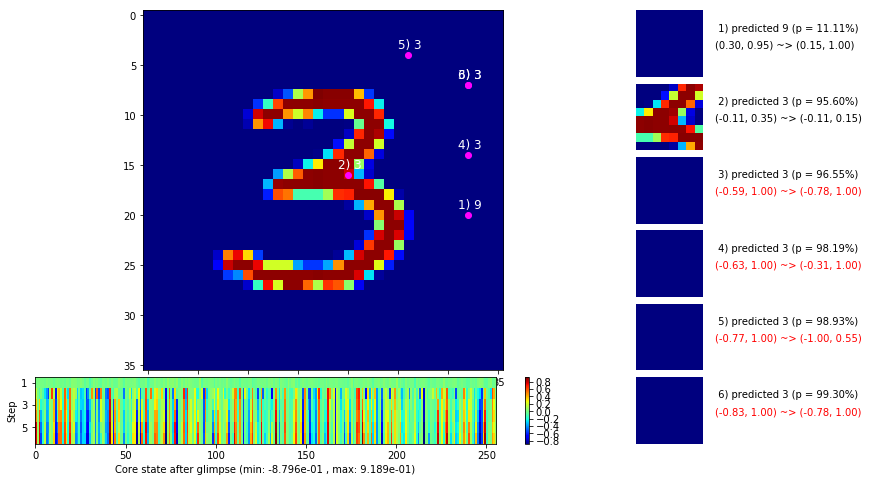

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


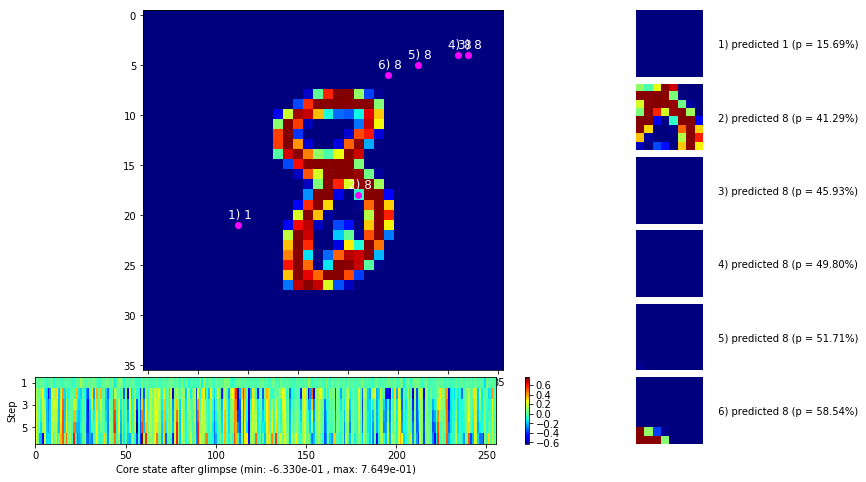


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


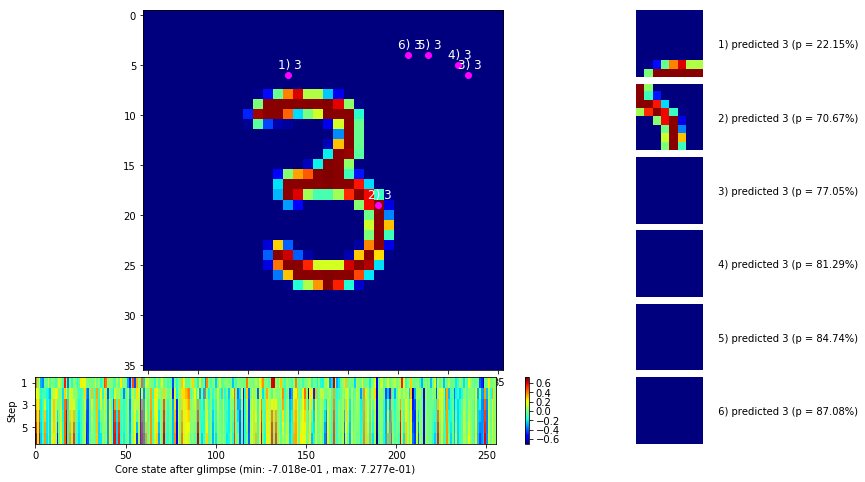

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


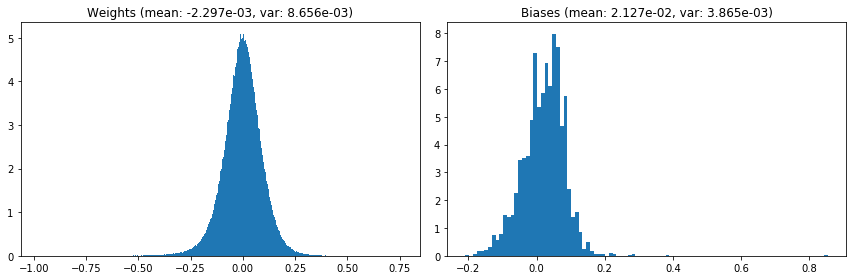

                                      Location network weights and biases


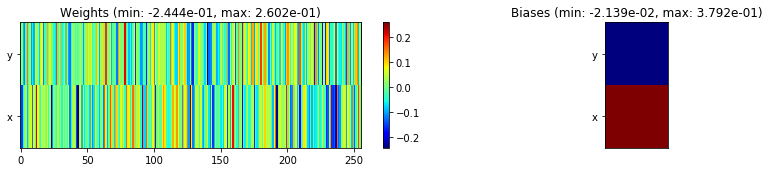

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.75 sec | TRAIN >> class loss: 0.4734 | steps:  2.525    | reward:  0.8379 :( | acc.: 83.792% :(
                          | VAL   >> class loss: 0.3984 | steps:  2.351 :( | reward:  0.8622 :( | acc.: 86.220% :(


Epoch  36/400) lr = 5.941e-05
 b    500/  3000 >> 136.0 ms/b | lr: 5.92e-05 | grad 2norm:  7.48 | grad inf norm:  1.847
       Weights || abs max:  0.98 (25658.81) | mean: -2.28e-03 ( 0.15) | var: 8.66e-03 (11529.00)
        Biases || abs max:  0.85 ( 7858.62) | mean:  2.13e-02 ( 5.35) | var: 3.87e-03 (914907.50)
                  class loss: 0.486 | steps: 2.507 | reward:  0.835 | acc.: 83.45%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.5 ms/b | lr: 5.90e-05 | grad 2norm:  7.34 | grad inf norm:  1.818
       Weights || abs max:  0.98 (47203.58) | mean: -2.29e-03 ( 0.19) 

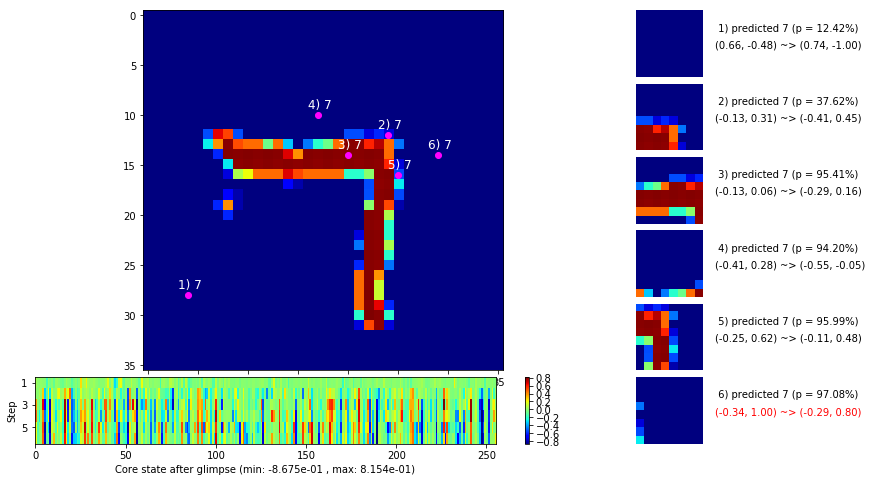

 b   1500/  3000 >> 134.5 ms/b | lr: 5.86e-05 | grad 2norm:  7.45 | grad inf norm:  1.921
       Weights || abs max:  0.98 (29487.47) | mean: -2.30e-03 ( 0.16) | var: 8.68e-03 (14873.48)
        Biases || abs max:  0.85 ( 5899.42) | mean:  2.12e-02 ( 4.32) | var: 3.88e-03 (305092.28)
                  class loss: 0.479 | steps: 2.531 | reward:  0.836 | acc.: 83.55%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.7 ms/b | lr: 5.84e-05 | grad 2norm:  7.49 | grad inf norm:  1.786
       Weights || abs max:  0.99 (44435.31) | mean: -2.32e-03 ( 0.18) | var: 8.69e-03 (145720.03)
        Biases || abs max:  0.85 ( 7793.24) | mean:  2.11e-02 ( 5.29) | var: 3.88e-03 (552017.94)
                  class loss: 0.476 | steps: 2.530 | reward:  0.838 | acc.: 83.76%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

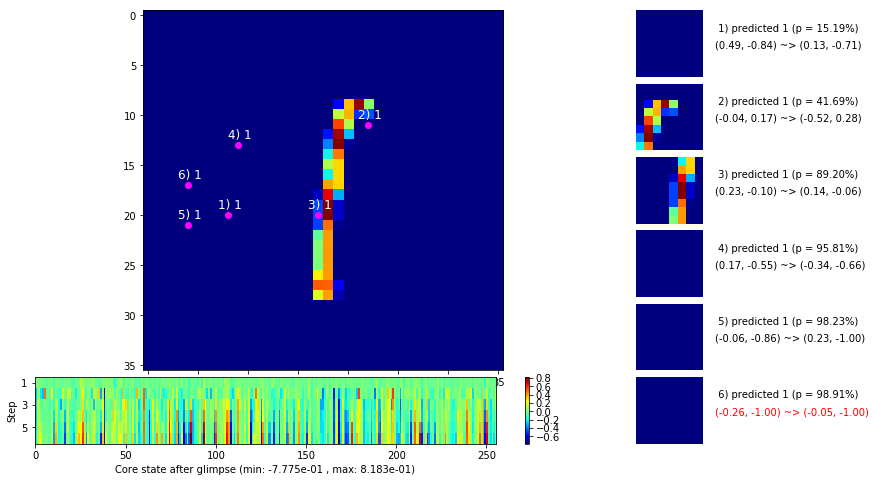

 b   2500/  3000 >> 136.5 ms/b | lr: 5.81e-05 | grad 2norm:  7.53 | grad inf norm:  1.836
       Weights || abs max:  0.99 (38632.56) | mean: -2.33e-03 ( 0.18) | var: 8.70e-03 (39426.85)
        Biases || abs max:  0.85 ( 5965.12) | mean:  2.11e-02 ( 4.44) | var: 3.89e-03 (191261.64)
                  class loss: 0.494 | steps: 2.520 | reward:  0.831 | acc.: 83.06%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.2 ms/b | lr: 5.79e-05 | grad 2norm:  7.59 | grad inf norm:  1.853
       Weights || abs max:  0.99 (40680.68) | mean: -2.30e-03 ( 0.18) | var: 8.71e-03 (32620.50)
        Biases || abs max:  0.85 ( 5874.14) | mean:  2.12e-02 ( 4.65) | var: 3.90e-03 (170414.14)
                  class loss: 0.486 | steps: 2.519 | reward:  0.833 | acc.: 83.34%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

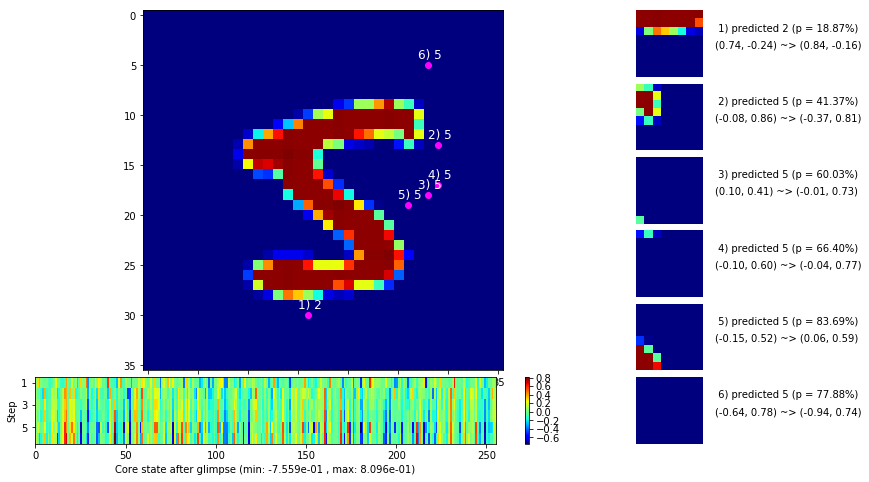

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


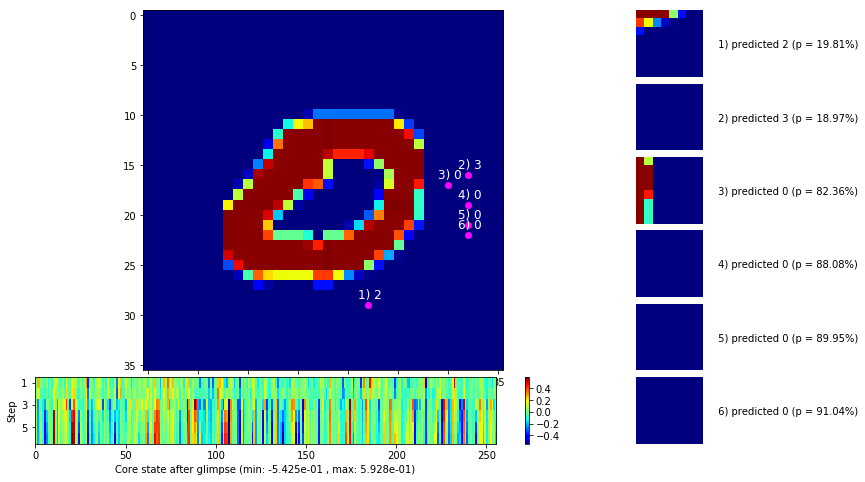


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


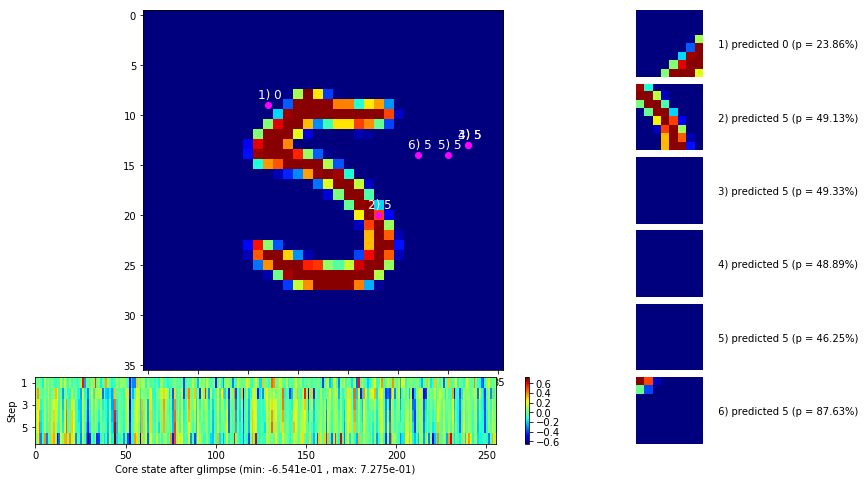

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


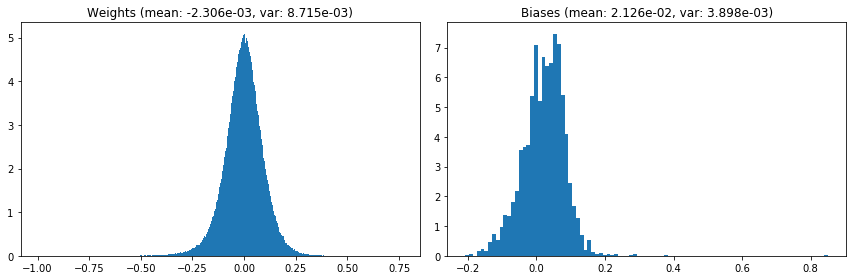

                                      Location network weights and biases


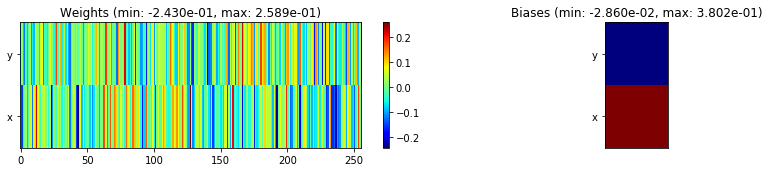

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.26 sec | TRAIN >> class loss: 0.4841 | steps:  2.523    | reward:  0.8343 :( | acc.: 83.427% :(
                          | VAL   >> class loss: 0.4285 | steps:  2.327 :( | reward:  0.8556 :( | acc.: 85.560% :(


Epoch  37/400) lr = 5.776e-05
 b    500/  3000 >> 133.7 ms/b | lr: 5.76e-05 | grad 2norm:  7.47 | grad inf norm:  1.717
       Weights || abs max:  0.99 (31858.68) | mean: -2.32e-03 ( 0.16) | var: 8.72e-03 (25211.35)
        Biases || abs max:  0.85 ( 8841.11) | mean:  2.12e-02 ( 5.88) | var: 3.90e-03 (856268.94)
                  class loss: 0.496 | steps: 2.562 | reward:  0.829 | acc.: 82.86%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.3 ms/b | lr: 5.73e-05 | grad 2norm:  7.38 | grad inf norm:  1.761
       Weights || abs max:  1.00 (46953.61) | mean: -2.30e-03 ( 0.18) 

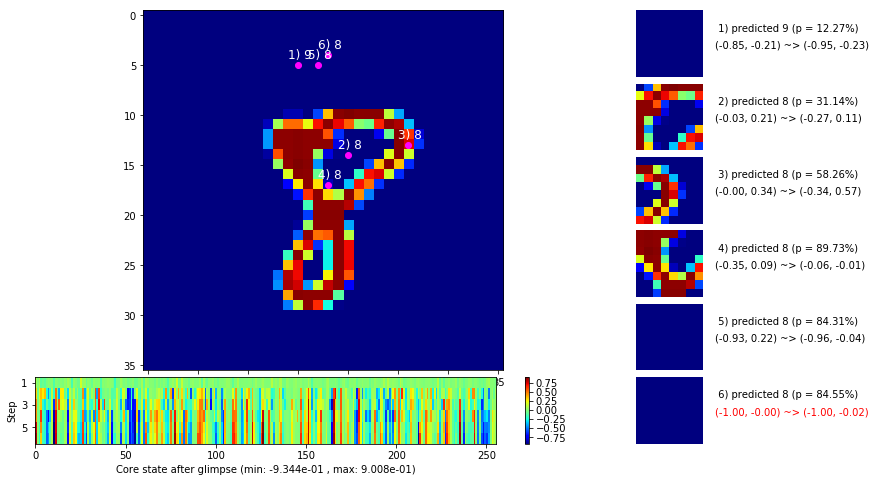

 b   1500/  3000 >> 137.6 ms/b | lr: 5.70e-05 | grad 2norm:  7.44 | grad inf norm:  1.740
       Weights || abs max:  1.00 (48390.31) | mean: -2.30e-03 ( 0.19) | var: 8.74e-03 (169026.66)
        Biases || abs max:  0.85 ( 6908.63) | mean:  2.13e-02 ( 4.85) | var: 3.92e-03 (207628.55)
                  class loss: 0.480 | steps: 2.520 | reward:  0.836 | acc.: 83.60%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.7 ms/b | lr: 5.68e-05 | grad 2norm:  7.65 | grad inf norm:  1.871
       Weights || abs max:  1.00 (44158.30) | mean: -2.31e-03 ( 0.18) | var: 8.75e-03 (169076.44)
        Biases || abs max:  0.85 ( 7362.94) | mean:  2.12e-02 ( 4.86) | var: 3.92e-03 (497361.88)
                  class loss: 0.478 | steps: 2.511 | reward:  0.834 | acc.: 83.43%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

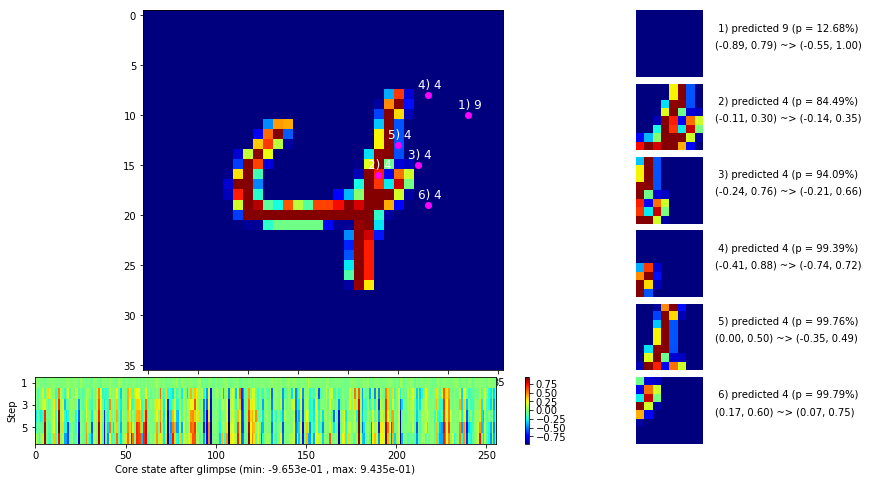

 b   2500/  3000 >> 134.8 ms/b | lr: 5.65e-05 | grad 2norm:  7.54 | grad inf norm:  1.860
       Weights || abs max:  1.00 (49744.20) | mean: -2.29e-03 ( 0.19) | var: 8.76e-03 (109907.03)
        Biases || abs max:  0.85 ( 9694.06) | mean:  2.12e-02 ( 5.61) | var: 3.92e-03 (2032348.50)
                  class loss: 0.473 | steps: 2.544 | reward:  0.838 | acc.: 83.80%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.6 ms/b | lr: 5.63e-05 | grad 2norm:  7.56 | grad inf norm:  1.838
       Weights || abs max:  1.01 (56622.07) | mean: -2.29e-03 ( 0.20) | var: 8.77e-03 (223216.22)
        Biases || abs max:  0.85 ( 5847.04) | mean:  2.12e-02 ( 4.28) | var: 3.93e-03 (524775.50)
                  class loss: 0.486 | steps: 2.564 | reward:  0.831 | acc.: 83.09%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

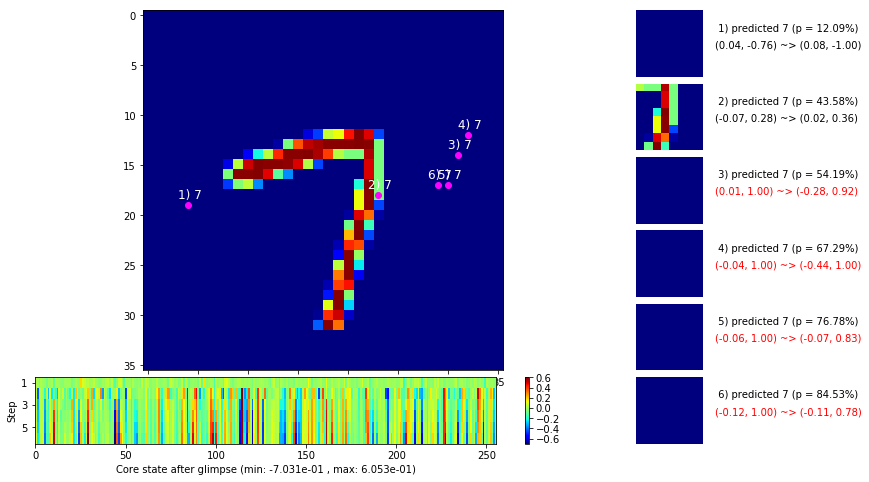

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


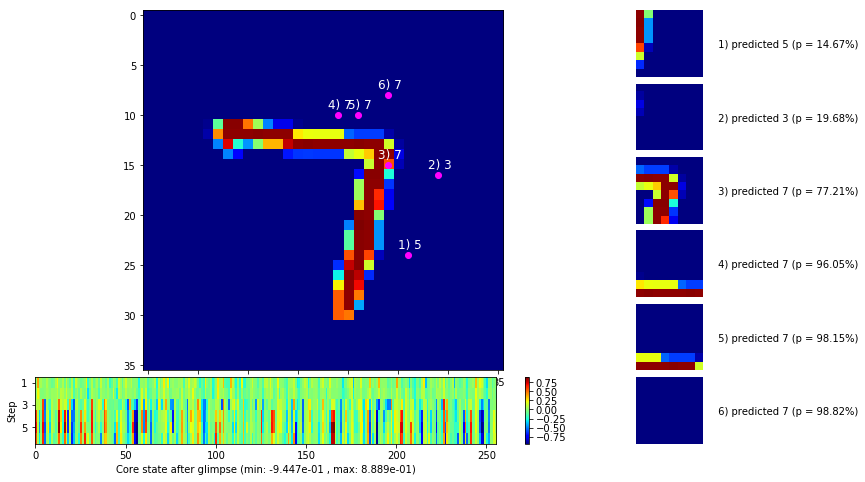


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


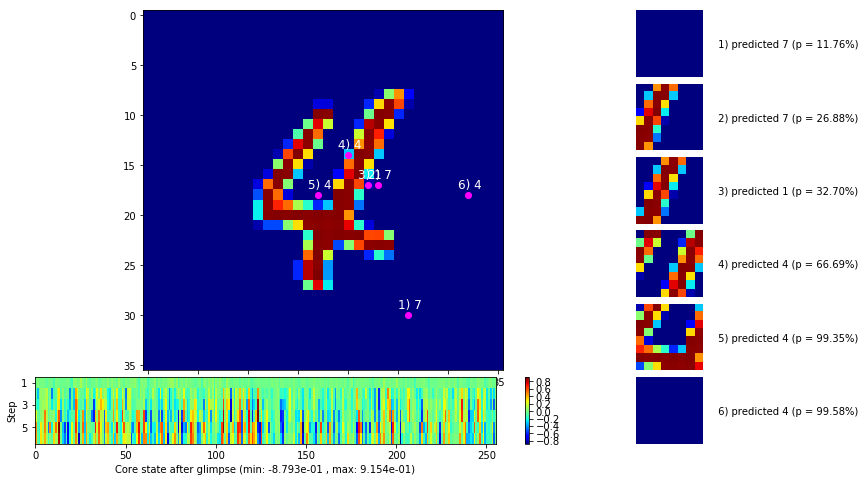

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


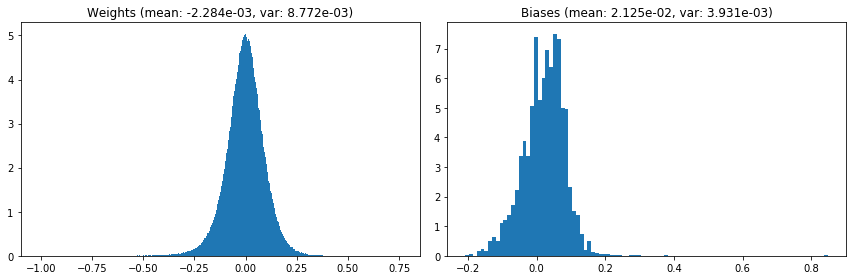

                                      Location network weights and biases


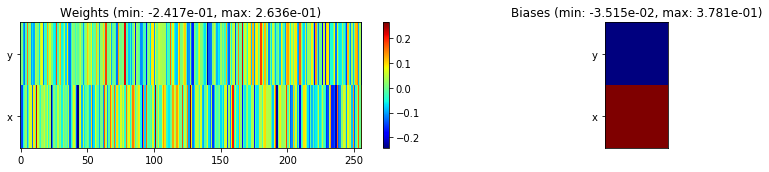

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.39 sec | TRAIN >> class loss: 0.4809 | steps:  2.536 :( | reward:  0.8348 :( | acc.: 83.482% :(
                          | VAL   >> class loss: 0.4008 | steps:  2.310 :( | reward:  0.8650 :( | acc.: 86.500% :(


Epoch  38/400) lr = 5.621e-05
 b    500/  3000 >> 134.2 ms/b | lr: 5.60e-05 | grad 2norm:  7.39 | grad inf norm:  1.840
       Weights || abs max:  1.01 (93186.88) | mean: -2.29e-03 ( 0.27) | var: 8.78e-03 (1784726.38)
        Biases || abs max:  0.85 ( 9447.69) | mean:  2.12e-02 ( 6.14) | var: 3.93e-03 (1805489.38)
                  class loss: 0.457 | steps: 2.514 | reward:  0.846 | acc.: 84.55%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.4 ms/b | lr: 5.58e-05 | grad 2norm:  7.44 | grad inf norm:  1.752
       Weights || abs max:  1.01 (40432.55) | mean: -2.29e-03 ( 0.1

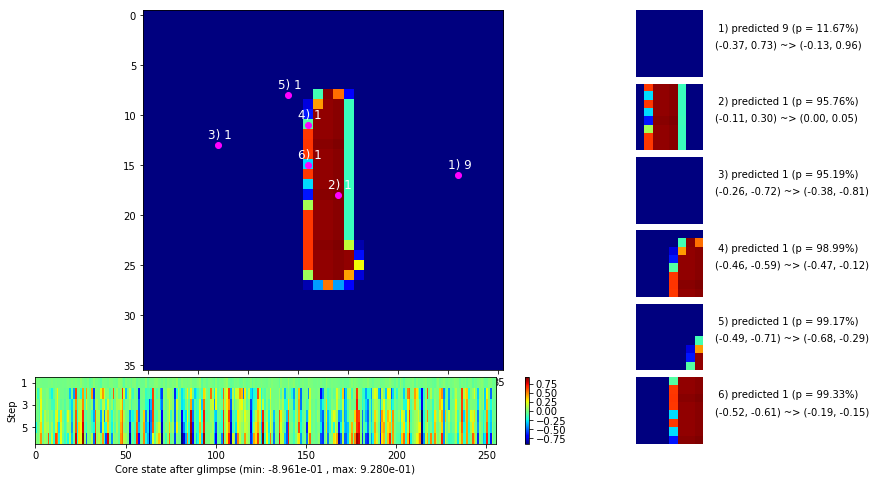

 b   1500/  3000 >> 135.6 ms/b | lr: 5.55e-05 | grad 2norm:  7.39 | grad inf norm:  1.732
       Weights || abs max:  1.02 (45733.52) | mean: -2.29e-03 ( 0.19) | var: 8.79e-03 (94590.95)
        Biases || abs max:  0.85 ( 5197.33) | mean:  2.12e-02 ( 3.77) | var: 3.94e-03 (258656.17)
                  class loss: 0.460 | steps: 2.495 | reward:  0.842 | acc.: 84.22%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.3 ms/b | lr: 5.53e-05 | grad 2norm:  7.35 | grad inf norm:  1.781
       Weights || abs max:  1.02 (117220.36) | mean: -2.29e-03 ( 0.30) | var: 8.80e-03 (5242494.50)
        Biases || abs max:  0.85 ( 4423.02) | mean:  2.12e-02 ( 3.93) | var: 3.95e-03 (56046.25)
                  class loss: 0.465 | steps: 2.498 | reward:  0.841 | acc.: 84.08%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

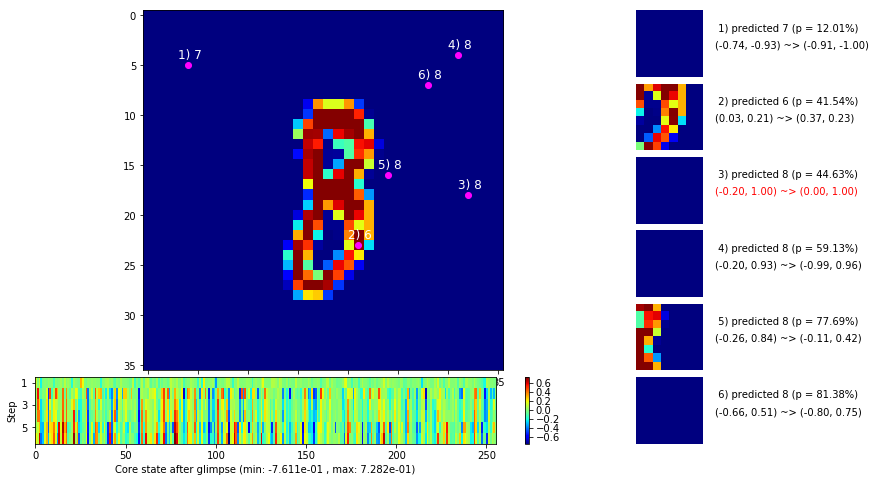

 b   2500/  3000 >> 135.9 ms/b | lr: 5.50e-05 | grad 2norm:  7.31 | grad inf norm:  1.769
       Weights || abs max:  1.02 (40535.87) | mean: -2.27e-03 ( 0.17) | var: 8.82e-03 (102249.10)
        Biases || abs max:  0.85 ( 9285.70) | mean:  2.13e-02 ( 6.49) | var: 3.96e-03 (448119.41)
                  class loss: 0.448 | steps: 2.496 | reward:  0.851 | acc.: 85.07%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.2 ms/b | lr: 5.48e-05 | grad 2norm:  7.58 | grad inf norm:  1.817
       Weights || abs max:  1.02 (32277.66) | mean: -2.26e-03 ( 0.16) | var: 8.82e-03 (27177.69)
        Biases || abs max:  0.85 (25640.66) | mean:  2.13e-02 (12.40) | var: 3.97e-03 (77503888.00)
                  class loss: 0.470 | steps: 2.507 | reward:  0.836 | acc.: 83.60%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

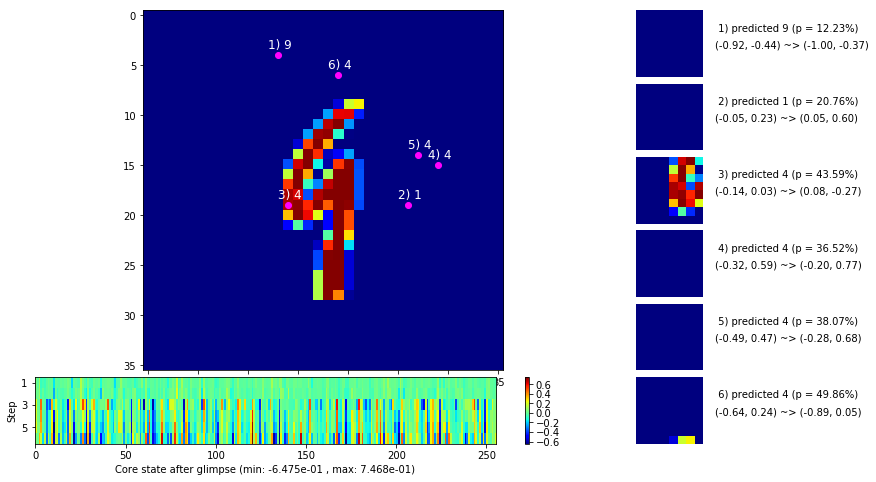

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


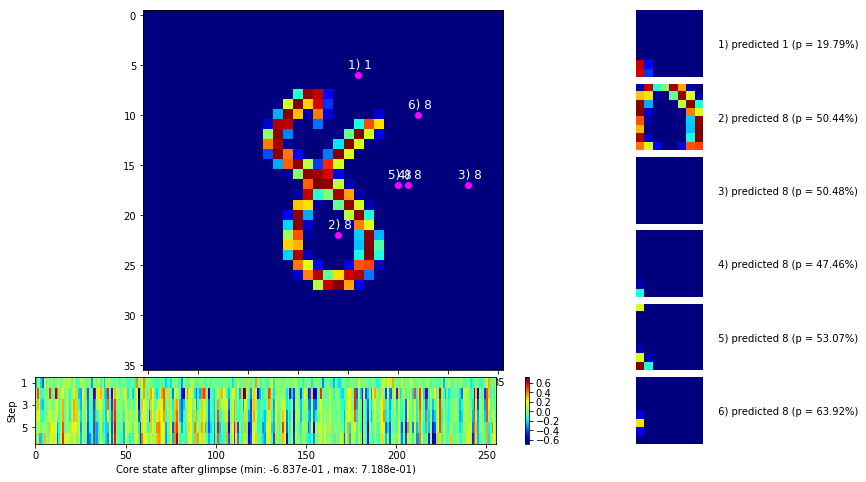


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


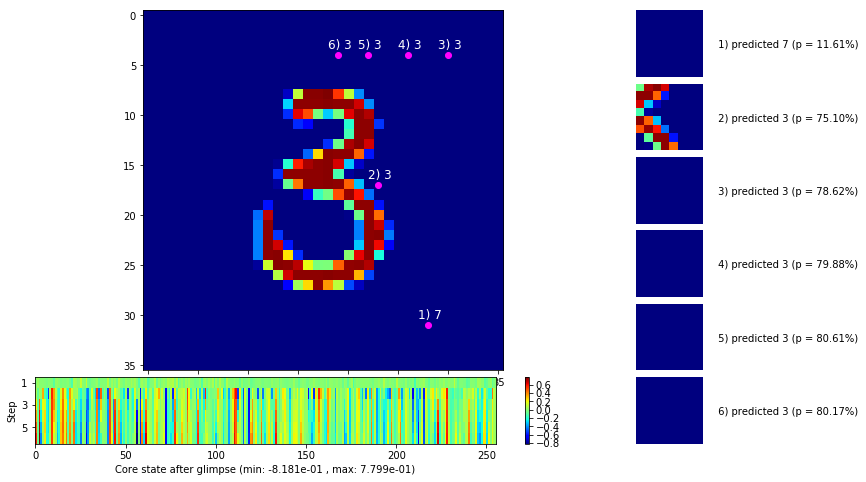

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


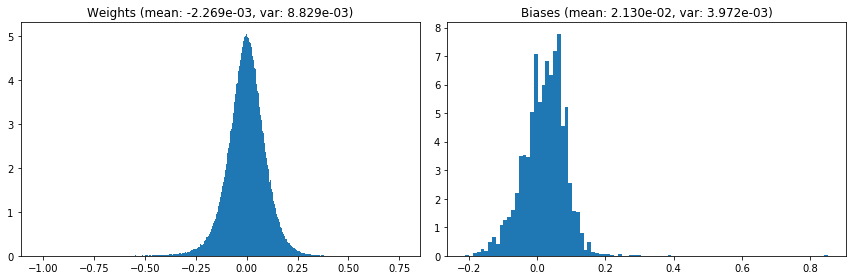

                                      Location network weights and biases


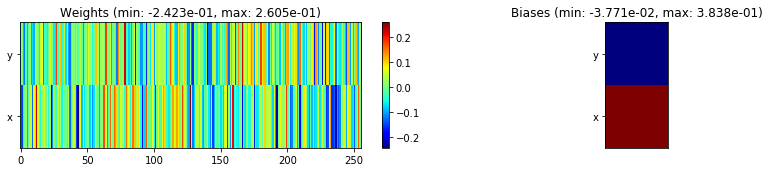

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.94 sec | TRAIN >> class loss: 0.4616 | steps:  2.504    | reward:  0.8431 :( | acc.: 84.307% :(
                          | VAL   >> class loss: 0.3959 | steps:  2.303 :( | reward:  0.8666 :( | acc.: 86.660% :(


Epoch  39/400) lr = 5.473e-05
 b    500/  3000 >> 136.4 ms/b | lr: 5.45e-05 | grad 2norm:  7.49 | grad inf norm:  1.789
       Weights || abs max:  1.02 (85677.25) | mean: -2.28e-03 ( 0.25) | var: 8.83e-03 (1924727.38)
        Biases || abs max:  0.85 ( 6535.79) | mean:  2.13e-02 ( 5.23) | var: 3.98e-03 (1754317.62)
                  class loss: 0.462 | steps: 2.523 | reward:  0.841 | acc.: 84.12%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.1 ms/b | lr: 5.43e-05 | grad 2norm:  7.51 | grad inf norm:  1.810
       Weights || abs max:  1.03 (28851.74) | mean: -2.27e-03 ( 0.1

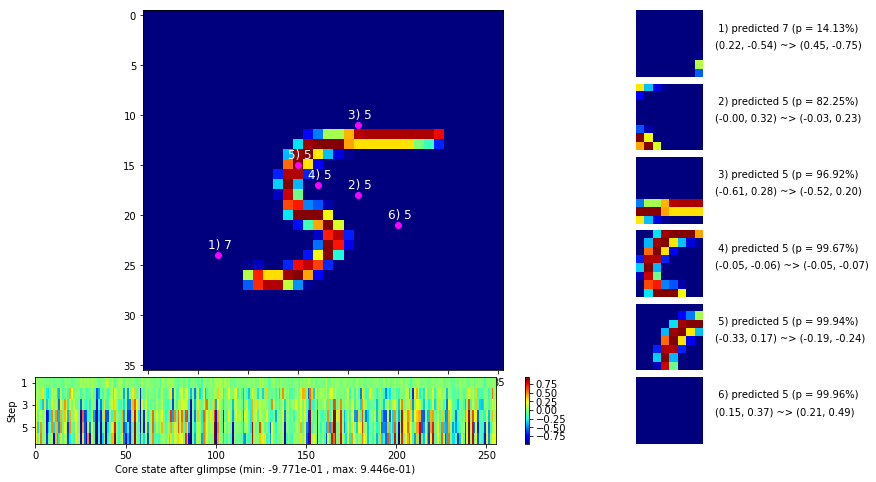

 b   1500/  3000 >> 135.4 ms/b | lr: 5.41e-05 | grad 2norm:  7.41 | grad inf norm:  1.764
       Weights || abs max:  1.03 (49268.49) | mean: -2.29e-03 ( 0.19) | var: 8.85e-03 (156086.59)
        Biases || abs max:  0.85 ( 7789.06) | mean:  2.12e-02 ( 5.67) | var: 3.99e-03 (462704.97)
                  class loss: 0.475 | steps: 2.524 | reward:  0.839 | acc.: 83.90%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.8 ms/b | lr: 5.39e-05 | grad 2norm:  7.50 | grad inf norm:  1.811
       Weights || abs max:  1.03 (72949.29) | mean: -2.29e-03 ( 0.23) | var: 8.86e-03 (796526.50)
        Biases || abs max:  0.85 ( 5840.97) | mean:  2.13e-02 ( 4.22) | var: 3.99e-03 (621493.62)
                  class loss: 0.469 | steps: 2.519 | reward:  0.839 | acc.: 83.89%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

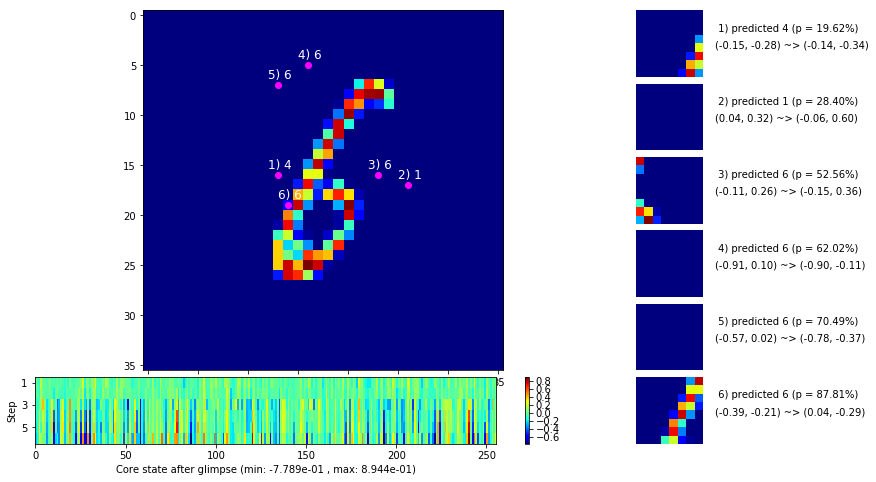

 b   2500/  3000 >> 136.4 ms/b | lr: 5.36e-05 | grad 2norm:  7.47 | grad inf norm:  1.806
       Weights || abs max:  1.03 (60621.43) | mean: -2.28e-03 ( 0.21) | var: 8.87e-03 (168671.55)
        Biases || abs max:  0.85 (16037.46) | mean:  2.13e-02 ( 9.22) | var: 3.99e-03 (3694413.75)
                  class loss: 0.463 | steps: 2.521 | reward:  0.837 | acc.: 83.74%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.8 ms/b | lr: 5.34e-05 | grad 2norm:  7.53 | grad inf norm:  1.781
       Weights || abs max:  1.04 (31102.79) | mean: -2.28e-03 ( 0.15) | var: 8.88e-03 (31651.58)
        Biases || abs max:  0.85 ( 7048.43) | mean:  2.13e-02 ( 5.75) | var: 4.00e-03 (339057.31)
                  class loss: 0.464 | steps: 2.528 | reward:  0.840 | acc.: 84.02%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

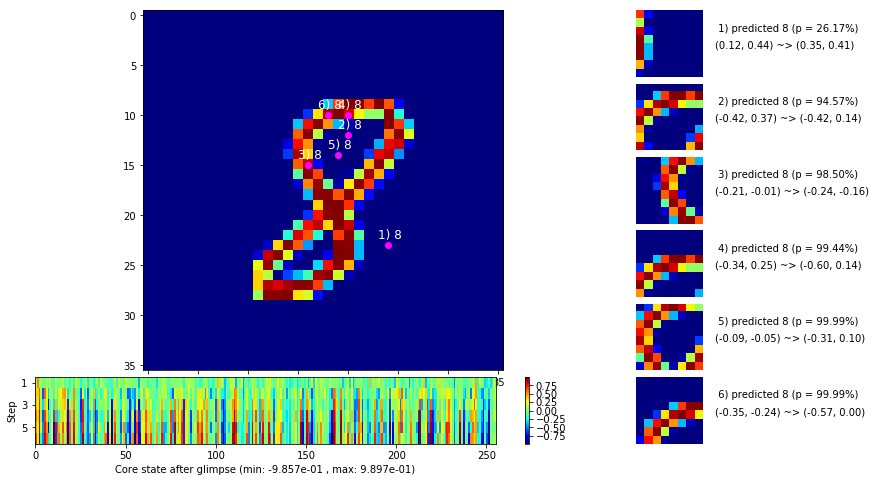

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


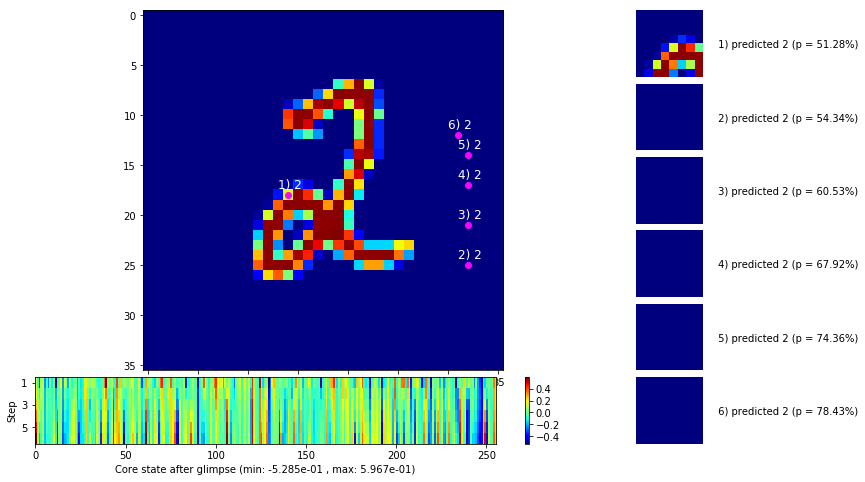


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


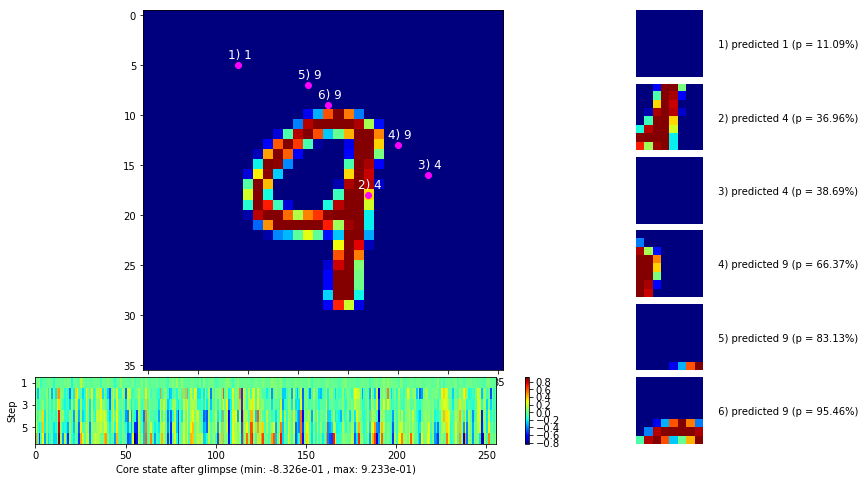

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


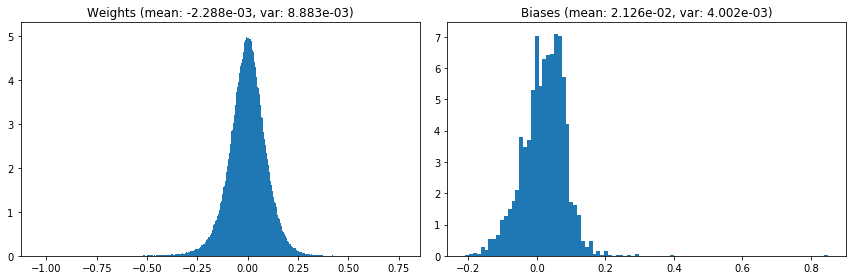

                                      Location network weights and biases


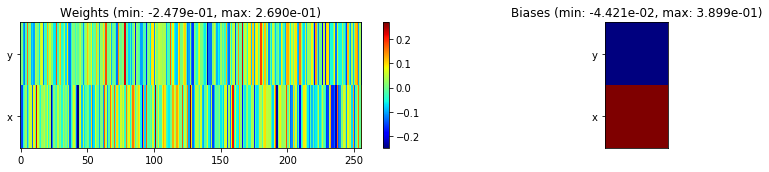

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.89 sec | TRAIN >> class loss: 0.4665 | steps:  2.520 :( | reward:  0.8395 :( | acc.: 83.947% :(
                          | VAL   >> class loss: 0.4109 | steps:  2.332 :( | reward:  0.8606 :( | acc.: 86.060% :(


Epoch  40/400) lr = 5.333e-05
 b    500/  3000 >> 134.8 ms/b | lr: 5.31e-05 | grad 2norm:  7.52 | grad inf norm:  1.821
       Weights || abs max:  1.04 (31698.30) | mean: -2.28e-03 ( 0.16) | var: 8.89e-03 (38149.71)
        Biases || abs max:  0.85 ( 6300.61) | mean:  2.13e-02 ( 5.18) | var: 4.01e-03 (495404.81)
                  class loss: 0.469 | steps: 2.505 | reward:  0.839 | acc.: 83.94%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.9 ms/b | lr: 5.30e-05 | grad 2norm:  7.56 | grad inf norm:  1.807
       Weights || abs max:  1.04 (35450.27) | mean: -2.26e-03 ( 0.17) 

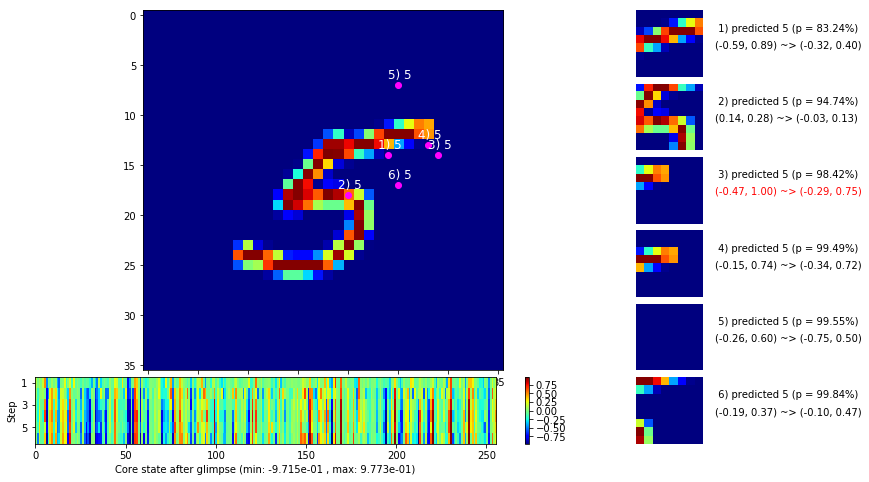

 b   1500/  3000 >> 138.5 ms/b | lr: 5.27e-05 | grad 2norm:  7.68 | grad inf norm:  1.787
       Weights || abs max:  1.04 (63016.46) | mean: -2.29e-03 ( 0.20) | var: 8.91e-03 (465735.47)
        Biases || abs max:  0.85 (10788.56) | mean:  2.14e-02 ( 7.05) | var: 4.02e-03 (4481299.00)
                  class loss: 0.488 | steps: 2.561 | reward:  0.830 | acc.: 82.98%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.0 ms/b | lr: 5.25e-05 | grad 2norm:  7.43 | grad inf norm:  1.759
       Weights || abs max:  1.04 (30914.29) | mean: -2.29e-03 ( 0.15) | var: 8.92e-03 (17334.17)
        Biases || abs max:  0.85 (43770.93) | mean:  2.14e-02 (19.48) | var: 4.02e-03 (175615200.00)
                  class loss: 0.464 | steps: 2.512 | reward:  0.847 | acc.: 84.66%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

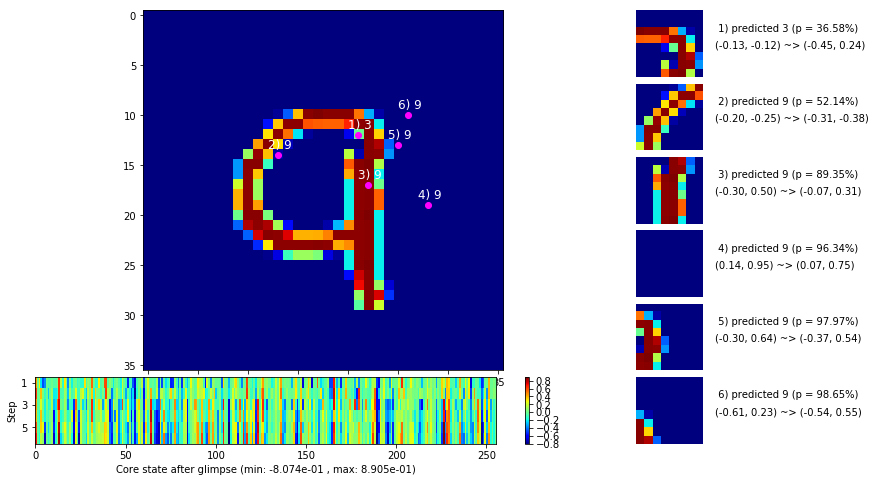

 b   2500/  3000 >> 132.6 ms/b | lr: 5.23e-05 | grad 2norm:  7.56 | grad inf norm:  1.773
       Weights || abs max:  1.05 (58929.66) | mean: -2.29e-03 ( 0.20) | var: 8.92e-03 (484101.91)
        Biases || abs max:  0.85 ( 5284.47) | mean:  2.14e-02 ( 4.57) | var: 4.03e-03 (235749.41)
                  class loss: 0.471 | steps: 2.530 | reward:  0.837 | acc.: 83.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.6 ms/b | lr: 5.21e-05 | grad 2norm:  7.64 | grad inf norm:  1.916
       Weights || abs max:  1.05 (57005.86) | mean: -2.31e-03 ( 0.20) | var: 8.93e-03 (413690.47)
        Biases || abs max:  0.85 (35379.99) | mean:  2.12e-02 (16.29) | var: 4.02e-03 (161751328.00)
                  class loss: 0.491 | steps: 2.541 | reward:  0.836 | acc.: 83.57%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

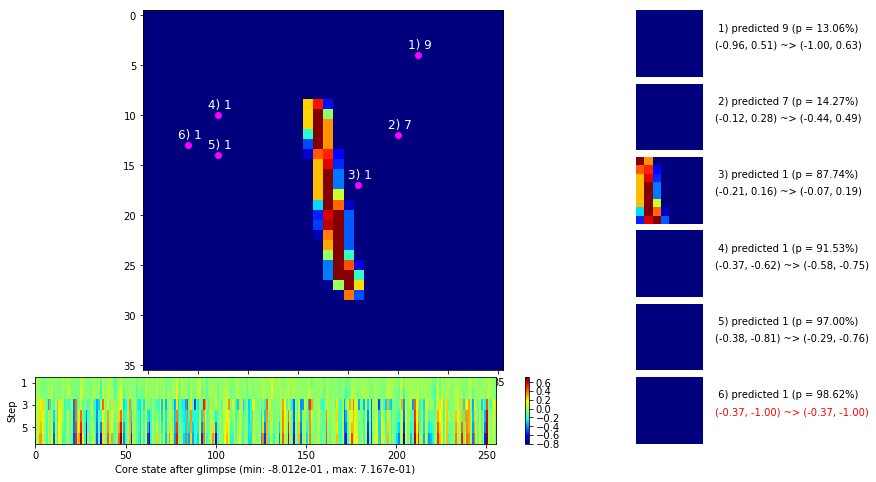

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


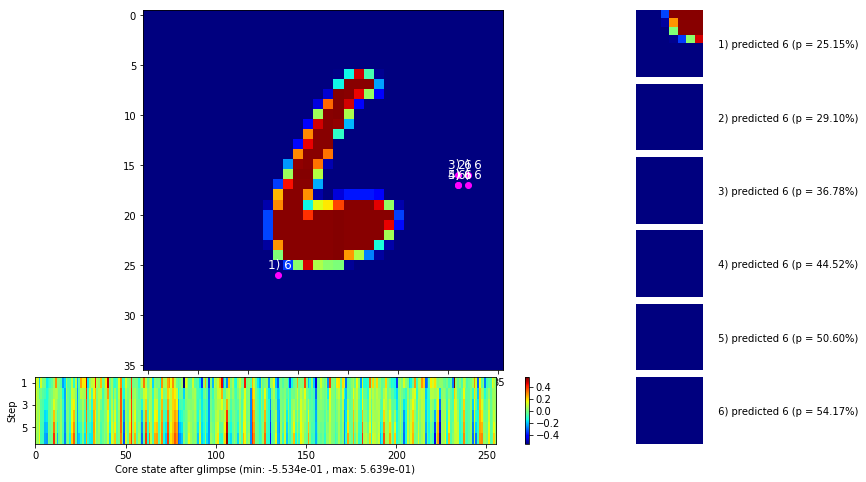


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


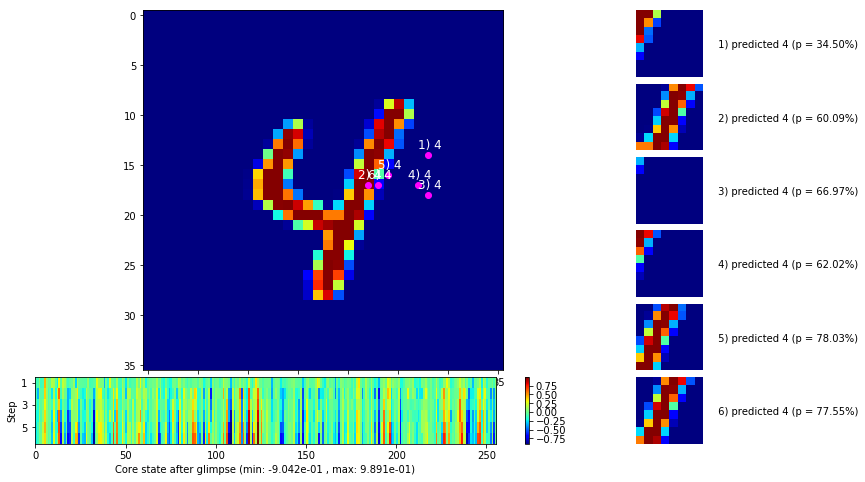

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


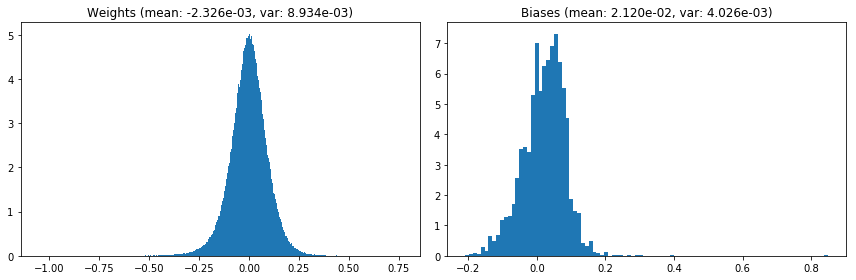

                                      Location network weights and biases


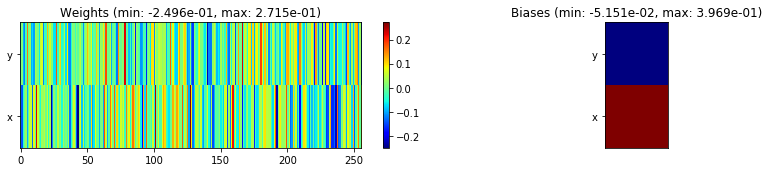

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.74 sec | TRAIN >> class loss: 0.4756 | steps:  2.528 :( | reward:  0.8377 :( | acc.: 83.772% :(
                          | VAL   >> class loss: 0.3825 | steps:  2.301 :( | reward:  0.8686 :( | acc.: 86.860% :(


Epoch  41/400) lr = 5.2e-05
 b    500/  3000 >> 134.6 ms/b | lr: 5.18e-05 | grad 2norm:  7.35 | grad inf norm:  1.814
       Weights || abs max:  1.05 (46567.83) | mean: -2.34e-03 ( 0.19) | var: 8.94e-03 (79021.67)
        Biases || abs max:  0.85 (22487.01) | mean:  2.12e-02 (13.99) | var: 4.02e-03 (23452480.00)
                  class loss: 0.463 | steps: 2.504 | reward:  0.840 | acc.: 84.01%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.5 ms/b | lr: 5.17e-05 | grad 2norm:  7.35 | grad inf norm:  1.774
       Weights || abs max:  1.06 (78761.30) | mean: -2.32e-03 ( 0.23) 

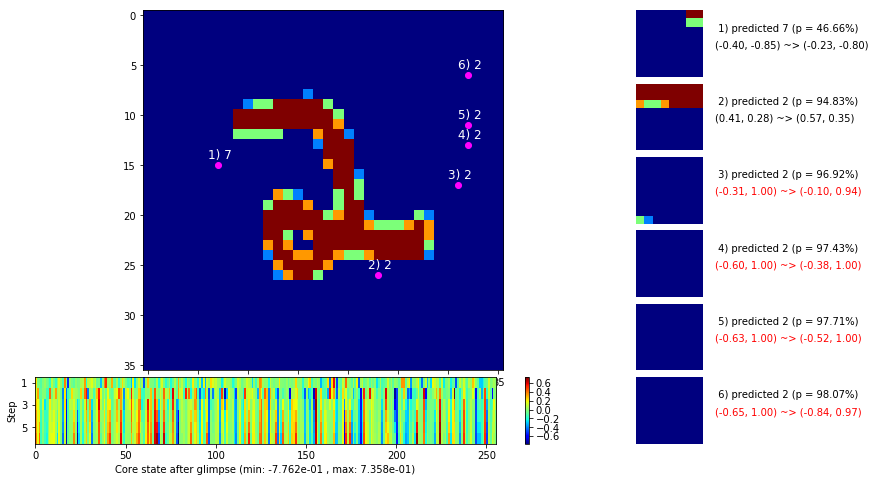

 b   1500/  3000 >> 136.5 ms/b | lr: 5.14e-05 | grad 2norm:  7.42 | grad inf norm:  1.764
       Weights || abs max:  1.06 (80253.81) | mean: -2.31e-03 ( 0.24) | var: 8.96e-03 (825613.88)
        Biases || abs max:  0.85 ( 7797.16) | mean:  2.13e-02 ( 6.05) | var: 4.04e-03 (625481.44)
                  class loss: 0.478 | steps: 2.514 | reward:  0.841 | acc.: 84.07%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 136.8 ms/b | lr: 5.12e-05 | grad 2norm:  7.52 | grad inf norm:  1.817
       Weights || abs max:  1.06 (26747.21) | mean: -2.30e-03 ( 0.14) | var: 8.96e-03 ( 9755.26)
        Biases || abs max:  0.85 ( 7976.94) | mean:  2.13e-02 ( 6.04) | var: 4.05e-03 (554593.94)
                  class loss: 0.478 | steps: 2.519 | reward:  0.839 | acc.: 83.90%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

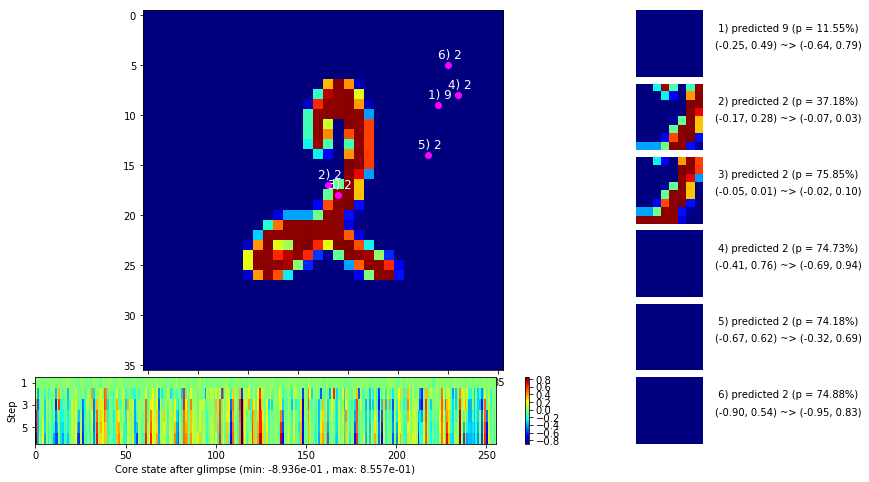

 b   2500/  3000 >> 138.5 ms/b | lr: 5.10e-05 | grad 2norm:  7.58 | grad inf norm:  1.860
       Weights || abs max:  1.06 (47411.70) | mean: -2.31e-03 ( 0.18) | var: 8.97e-03 (315097.00)
        Biases || abs max:  0.85 ( 7253.52) | mean:  2.13e-02 ( 5.77) | var: 4.05e-03 (513945.69)
                  class loss: 0.485 | steps: 2.516 | reward:  0.835 | acc.: 83.53%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 138.1 ms/b | lr: 5.08e-05 | grad 2norm:  7.50 | grad inf norm:  1.780
       Weights || abs max:  1.06 (36504.95) | mean: -2.33e-03 ( 0.17) | var: 8.98e-03 (29647.33)
        Biases || abs max:  0.85 ( 7192.38) | mean:  2.12e-02 ( 5.42) | var: 4.06e-03 (425679.41)
                  class loss: 0.471 | steps: 2.518 | reward:  0.836 | acc.: 83.61%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

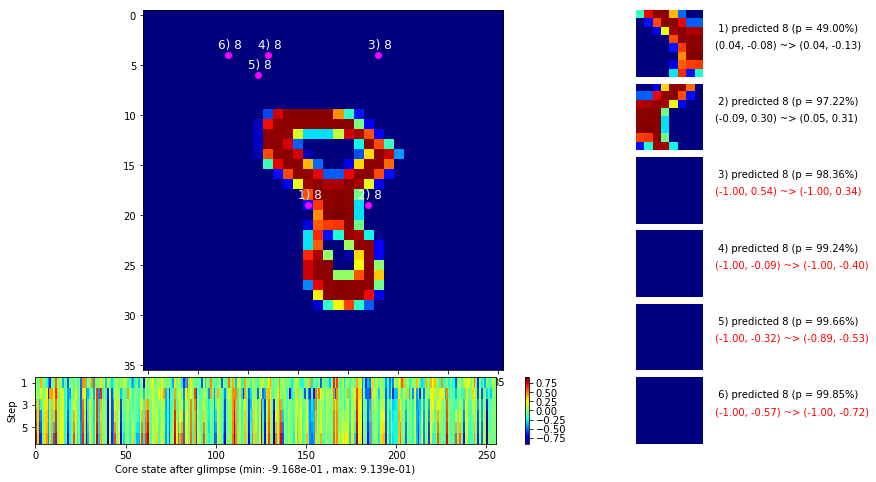

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


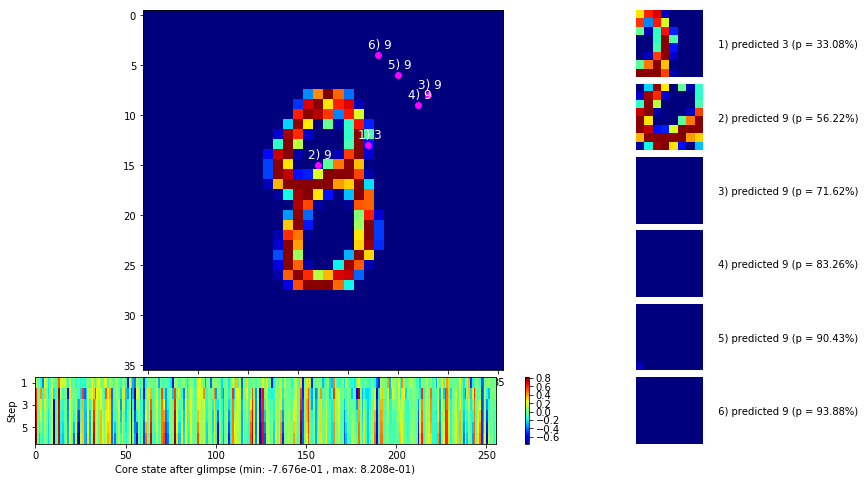


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


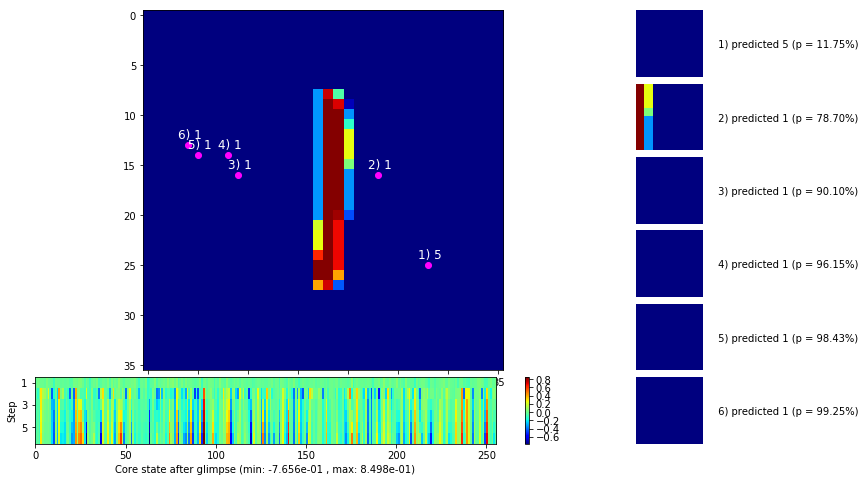

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


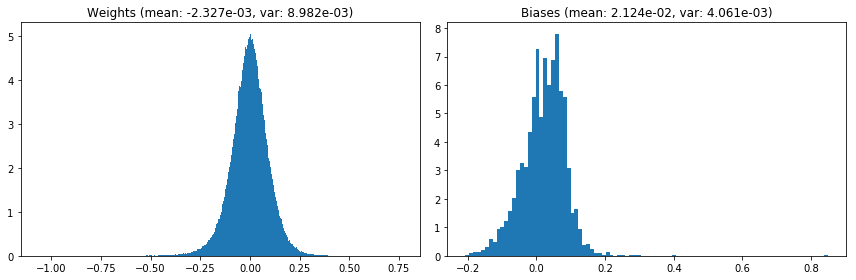

                                      Location network weights and biases


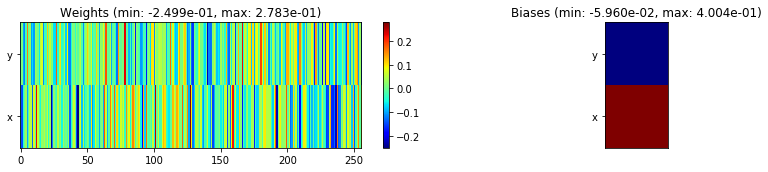

---------------------------------------------------------------------------------------------------------------
Elapsed time:  410.11 sec | TRAIN >> class loss: 0.4732 | steps:  2.513 :( | reward:  0.8387 :( | acc.: 83.872% :(
                          | VAL   >> class loss: 0.4056 | steps:  2.332 :( | reward:  0.8600 :( | acc.: 86.000% :(


Epoch  42/400) lr = 5.073e-05
 b    500/  3000 >> 134.8 ms/b | lr: 5.06e-05 | grad 2norm:  7.44 | grad inf norm:  1.789
       Weights || abs max:  1.07 (230479.84) | mean: -2.33e-03 ( 0.49) | var: 8.99e-03 (14724385.00)
        Biases || abs max:  0.85 ( 8054.16) | mean:  2.12e-02 ( 5.96) | var: 4.06e-03 (889029.88)
                  class loss: 0.479 | steps: 2.525 | reward:  0.836 | acc.: 83.62%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.8 ms/b | lr: 5.04e-05 | grad 2norm:  7.46 | grad inf norm:  1.755
       Weights || abs max:  1.07 (37018.32) | mean: -2.34e-03 ( 0.

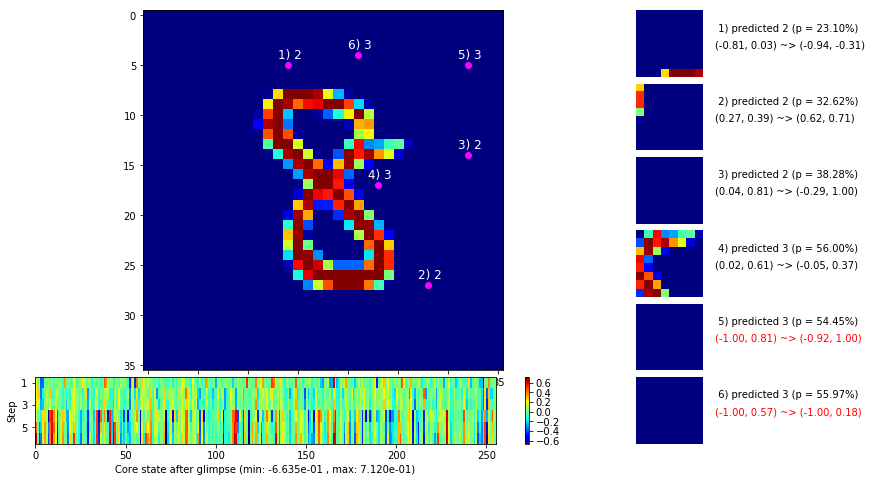

 b   1500/  3000 >> 136.3 ms/b | lr: 5.02e-05 | grad 2norm:  7.33 | grad inf norm:  1.802
       Weights || abs max:  1.07 (56480.54) | mean: -2.33e-03 ( 0.21) | var: 9.00e-03 (142409.97)
        Biases || abs max:  0.85 ( 5910.17) | mean:  2.12e-02 ( 5.20) | var: 4.07e-03 (296022.41)
                  class loss: 0.453 | steps: 2.464 | reward:  0.845 | acc.: 84.52%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.0 ms/b | lr: 5.00e-05 | grad 2norm:  7.67 | grad inf norm:  1.920
       Weights || abs max:  1.07 (39910.57) | mean: -2.31e-03 ( 0.18) | var: 9.01e-03 (30644.43)
        Biases || abs max:  0.85 ( 9224.84) | mean:  2.13e-02 ( 6.85) | var: 4.08e-03 (611554.75)
                  class loss: 0.495 | steps: 2.538 | reward:  0.830 | acc.: 82.95%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

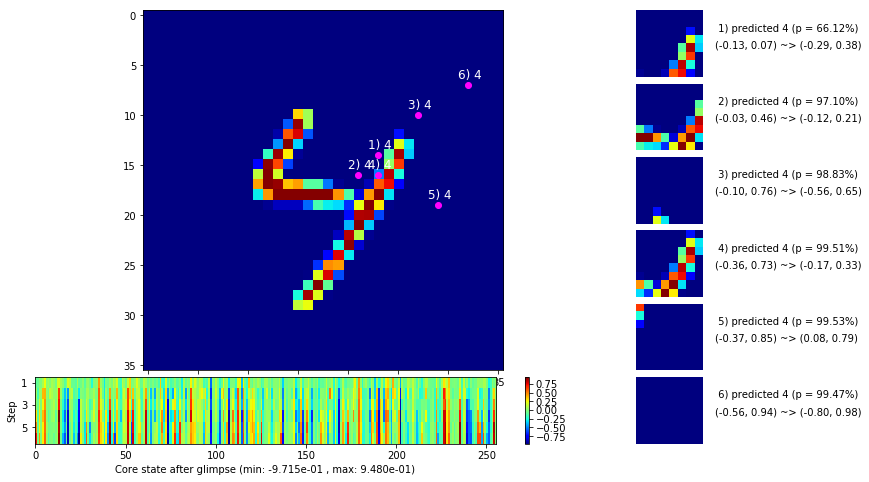

 b   2500/  3000 >> 136.5 ms/b | lr: 4.98e-05 | grad 2norm:  7.50 | grad inf norm:  1.851
       Weights || abs max:  1.07 (38068.53) | mean: -2.31e-03 ( 0.17) | var: 9.02e-03 (43400.00)
        Biases || abs max:  0.85 (18543.22) | mean:  2.13e-02 (10.57) | var: 4.08e-03 (10046890.00)
                  class loss: 0.468 | steps: 2.509 | reward:  0.840 | acc.: 83.95%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.7 ms/b | lr: 4.96e-05 | grad 2norm:  7.41 | grad inf norm:  1.817
       Weights || abs max:  1.07 (42005.15) | mean: -2.31e-03 ( 0.18) | var: 9.03e-03 (106297.13)
        Biases || abs max:  0.85 ( 9213.48) | mean:  2.14e-02 ( 6.12) | var: 4.09e-03 (3309313.00)
                  class loss: 0.468 | steps: 2.511 | reward:  0.838 | acc.: 83.79%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

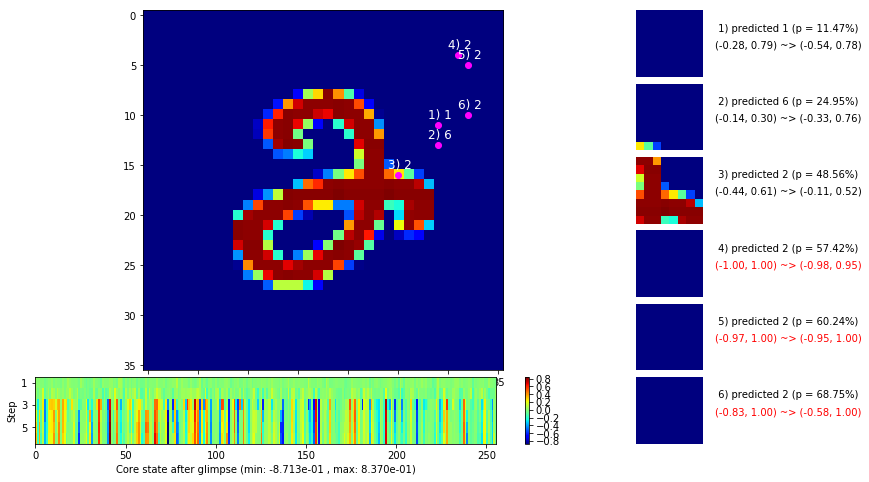

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


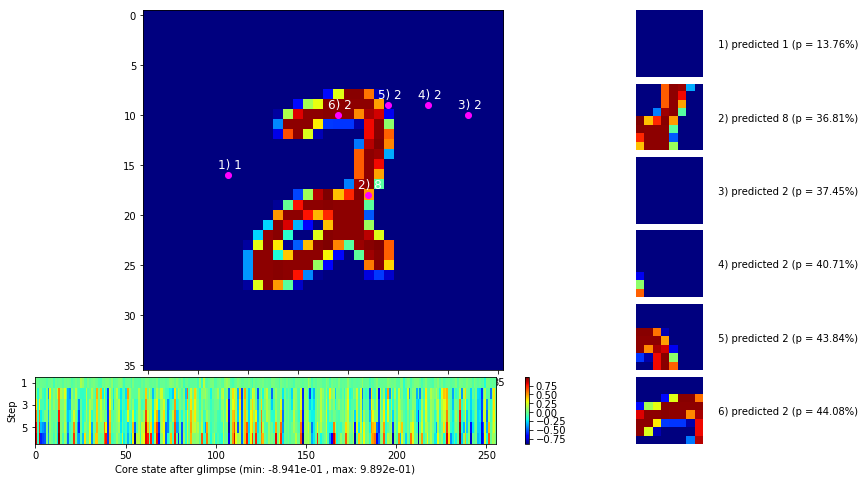


	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


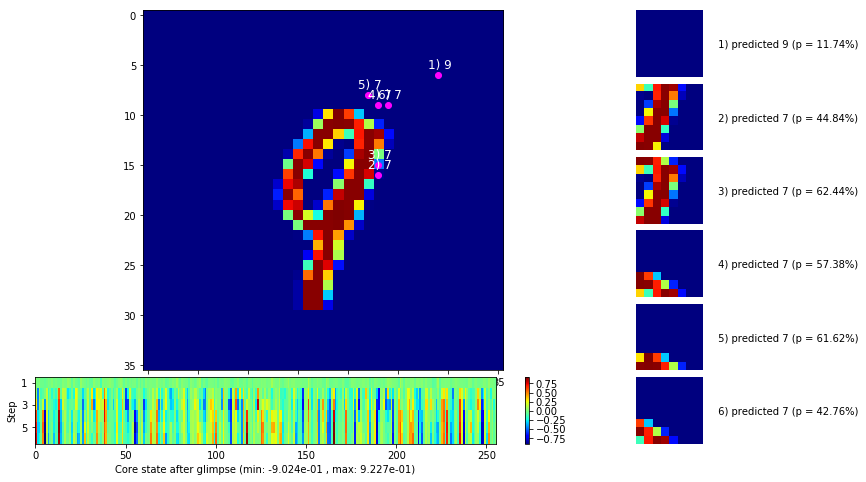

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


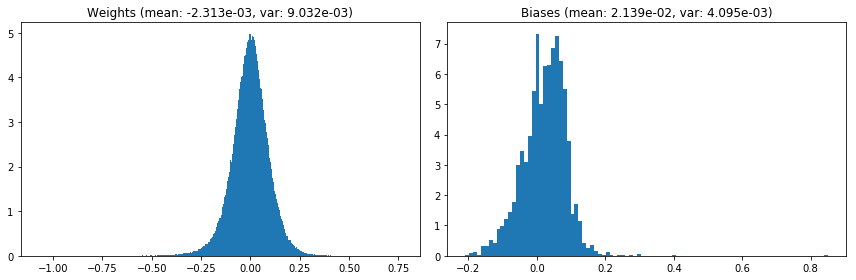

                                      Location network weights and biases


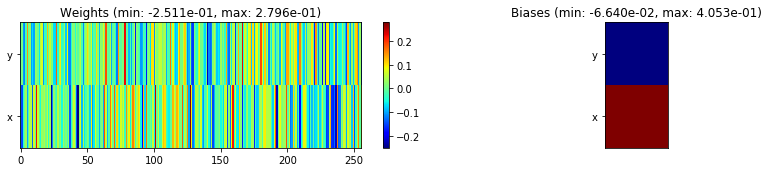

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.62 sec | TRAIN >> class loss: 0.4733 | steps:  2.510 :( | reward:  0.8380 :( | acc.: 83.800% :(
                          | VAL   >> class loss: 0.4089 | steps:  2.349 :( | reward:  0.8580 :( | acc.: 85.800% :(


Epoch  43/400) lr = 4.952e-05
 b    500/  3000 >> 135.5 ms/b | lr: 4.94e-05 | grad 2norm:  7.60 | grad inf norm:  1.876
       Weights || abs max:  1.07 (38169.51) | mean: -2.31e-03 ( 0.18) | var: 9.04e-03 (27394.55)
        Biases || abs max:  0.85 ( 6641.03) | mean:  2.14e-02 ( 5.30) | var: 4.10e-03 (399024.22)
                  class loss: 0.495 | steps: 2.535 | reward:  0.830 | acc.: 83.00%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.7 ms/b | lr: 4.92e-05 | grad 2norm:  7.55 | grad inf norm:  1.871
       Weights || abs max:  1.08 (294256.75) | mean: -2.32e-03 ( 0.60)

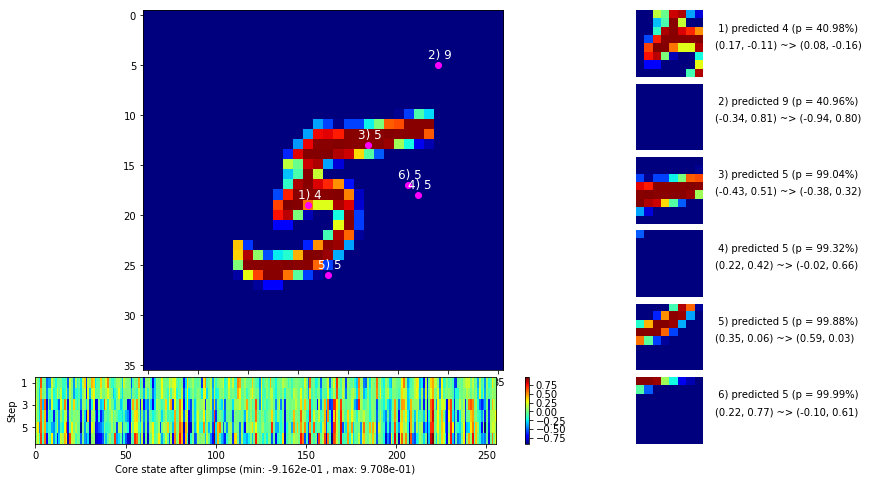

 b   1500/  3000 >> 139.2 ms/b | lr: 4.90e-05 | grad 2norm:  7.48 | grad inf norm:  1.843
       Weights || abs max:  1.08 (71779.59) | mean: -2.33e-03 ( 0.22) | var: 9.05e-03 (340219.34)
        Biases || abs max:  0.85 (16526.72) | mean:  2.14e-02 ( 8.62) | var: 4.11e-03 (13368800.00)
                  class loss: 0.480 | steps: 2.513 | reward:  0.839 | acc.: 83.85%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.8 ms/b | lr: 4.88e-05 | grad 2norm:  7.50 | grad inf norm:  1.792
       Weights || abs max:  1.08 (29535.79) | mean: -2.34e-03 ( 0.16) | var: 9.06e-03 (13151.87)
        Biases || abs max:  0.85 ( 9964.86) | mean:  2.14e-02 ( 5.87) | var: 4.11e-03 (3050778.00)
                  class loss: 0.479 | steps: 2.508 | reward:  0.834 | acc.: 83.41%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

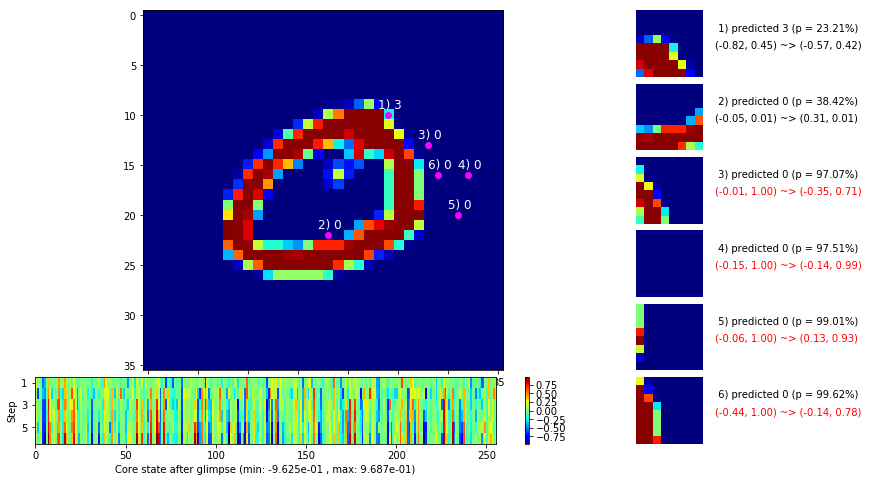

 b   2500/  3000 >> 136.6 ms/b | lr: 4.86e-05 | grad 2norm:  7.48 | grad inf norm:  1.780
       Weights || abs max:  1.08 (39074.68) | mean: -2.34e-03 ( 0.17) | var: 9.06e-03 (44672.96)
        Biases || abs max:  0.85 (11043.60) | mean:  2.13e-02 ( 6.40) | var: 4.12e-03 (1678308.25)
                  class loss: 0.490 | steps: 2.547 | reward:  0.836 | acc.: 83.57%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.1 ms/b | lr: 4.84e-05 | grad 2norm:  7.40 | grad inf norm:  1.831
       Weights || abs max:  1.08 (31133.71) | mean: -2.34e-03 ( 0.16) | var: 9.07e-03 (45196.71)
        Biases || abs max:  0.85 ( 4688.68) | mean:  2.14e-02 ( 4.12) | var: 4.12e-03 (57237.02)
                  class loss: 0.466 | steps: 2.503 | reward:  0.842 | acc.: 84.24%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

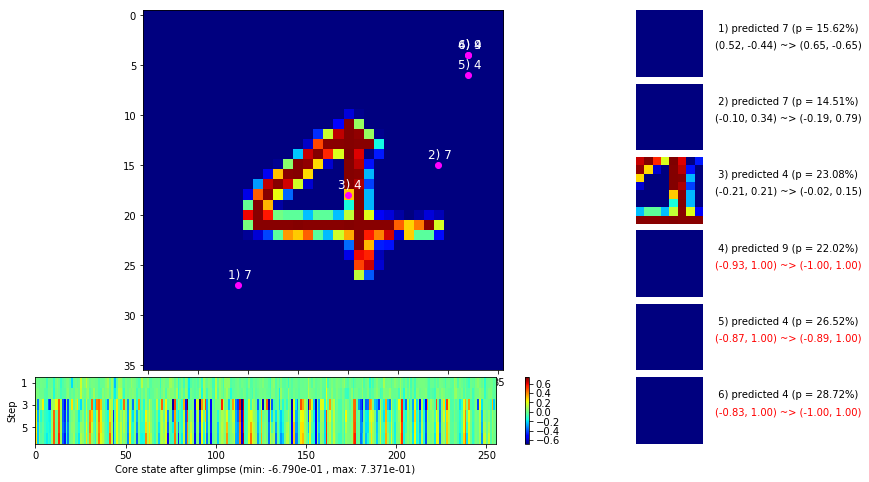

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


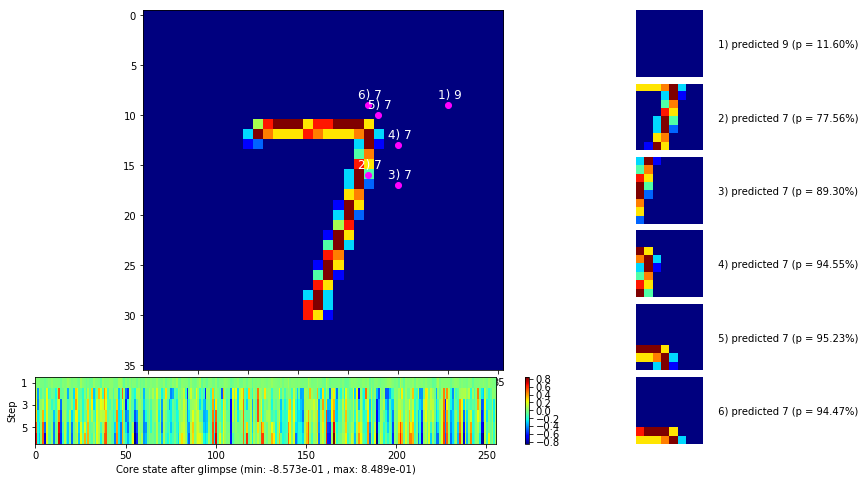


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


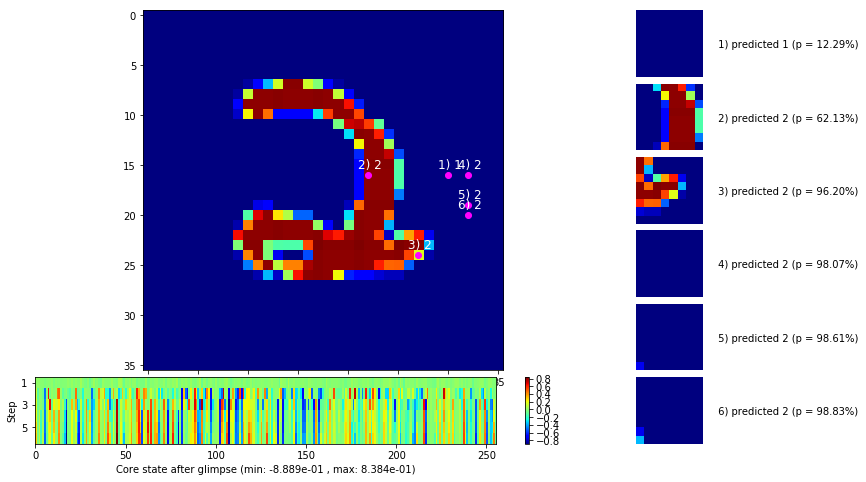

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


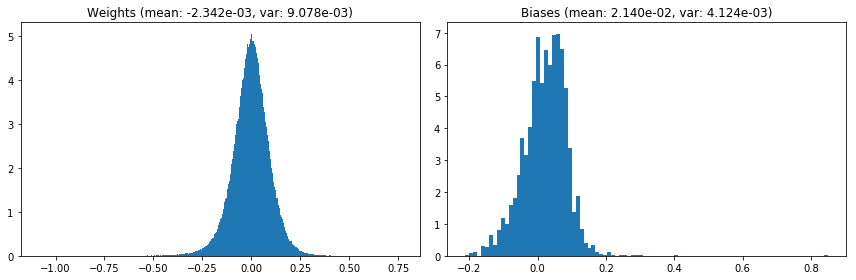

                                      Location network weights and biases


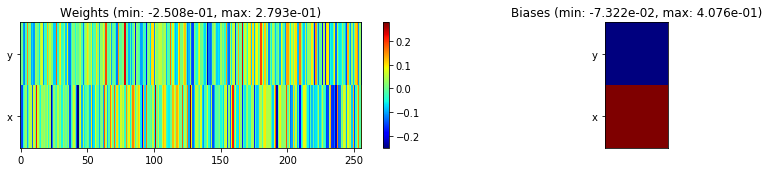

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.95 sec | TRAIN >> class loss: 0.4828 | steps:  2.520 :( | reward:  0.8354 :( | acc.: 83.538% :(
                          | VAL   >> class loss: 0.3975 | steps:  2.303 :( | reward:  0.8686 :( | acc.: 86.860% :(


Epoch  44/400) lr = 4.837e-05
 b    500/  3000 >> 135.6 ms/b | lr: 4.82e-05 | grad 2norm:  7.46 | grad inf norm:  1.807
       Weights || abs max:  1.09 (88402.46) | mean: -2.35e-03 ( 0.27) | var: 9.08e-03 (924559.50)
        Biases || abs max:  0.85 ( 9261.69) | mean:  2.14e-02 ( 6.47) | var: 4.13e-03 (267589.50)
                  class loss: 0.474 | steps: 2.512 | reward:  0.838 | acc.: 83.80%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.9 ms/b | lr: 4.81e-05 | grad 2norm:  7.41 | grad inf norm:  1.795
       Weights || abs max:  1.09 (39349.52) | mean: -2.35e-03 ( 0.18)

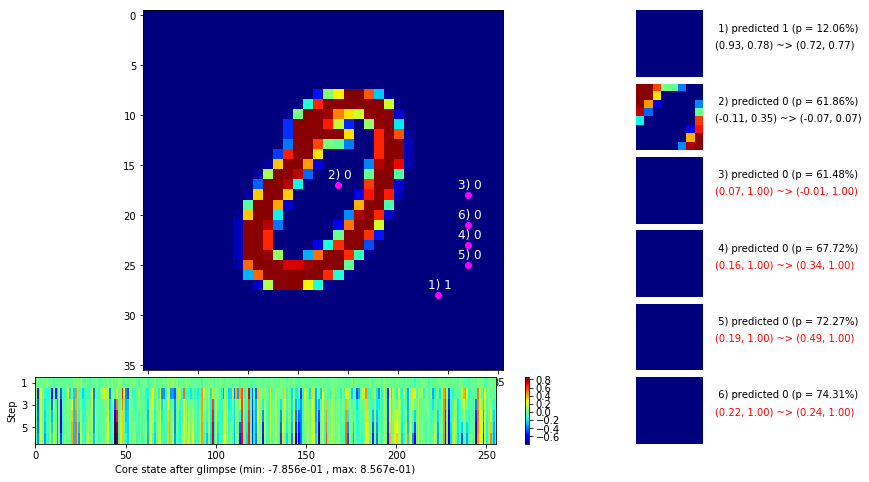

 b   1500/  3000 >> 137.4 ms/b | lr: 4.79e-05 | grad 2norm:  7.43 | grad inf norm:  1.820
       Weights || abs max:  1.09 (39794.36) | mean: -2.35e-03 ( 0.18) | var: 9.10e-03 (78531.20)
        Biases || abs max:  0.85 (30375.67) | mean:  2.14e-02 (14.67) | var: 4.14e-03 (30343320.00)
                  class loss: 0.472 | steps: 2.510 | reward:  0.841 | acc.: 84.06%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.7 ms/b | lr: 4.77e-05 | grad 2norm:  7.53 | grad inf norm:  1.845
       Weights || abs max:  1.10 (29104.71) | mean: -2.35e-03 ( 0.16) | var: 9.10e-03 (14717.05)
        Biases || abs max:  0.85 (17706.07) | mean:  2.14e-02 (14.24) | var: 4.14e-03 (65381960.00)
                  class loss: 0.487 | steps: 2.511 | reward:  0.835 | acc.: 83.47%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

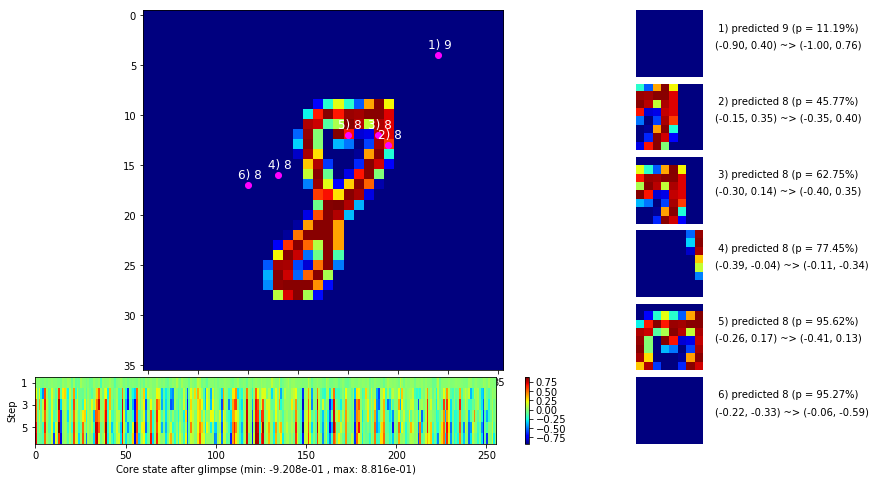

 b   2500/  3000 >> 139.4 ms/b | lr: 4.75e-05 | grad 2norm:  7.36 | grad inf norm:  1.770
       Weights || abs max:  1.10 (63702.21) | mean: -2.36e-03 ( 0.22) | var: 9.11e-03 (299209.31)
        Biases || abs max:  0.85 (10085.15) | mean:  2.14e-02 ( 6.10) | var: 4.15e-03 (2019122.88)
                  class loss: 0.464 | steps: 2.497 | reward:  0.841 | acc.: 84.13%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.6 ms/b | lr: 4.73e-05 | grad 2norm:  7.51 | grad inf norm:  1.808
       Weights || abs max:  1.10 (33465.20) | mean: -2.37e-03 ( 0.17) | var: 9.12e-03 (45477.35)
        Biases || abs max:  0.85 ( 6091.45) | mean:  2.13e-02 ( 4.57) | var: 4.15e-03 (328541.75)
                  class loss: 0.489 | steps: 2.528 | reward:  0.832 | acc.: 83.21%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

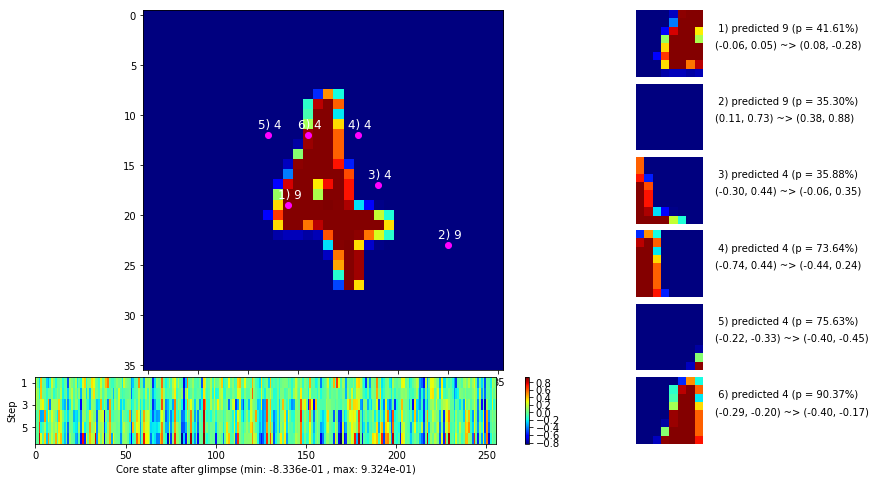

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


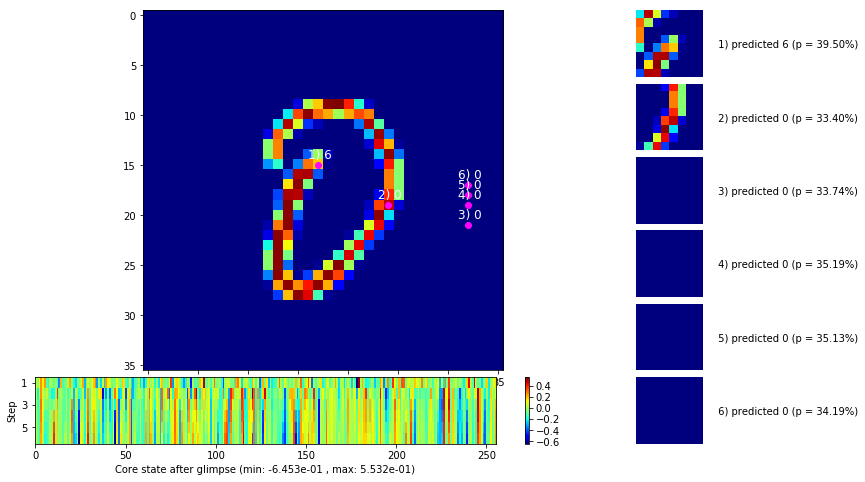


	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


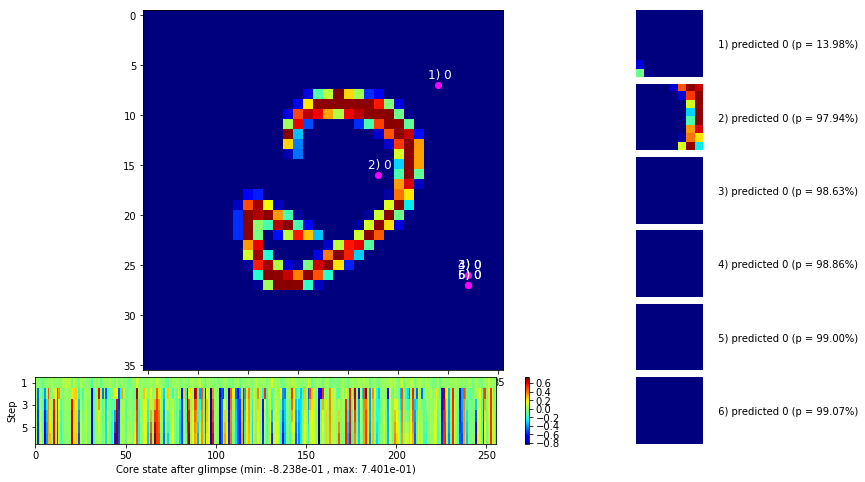

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


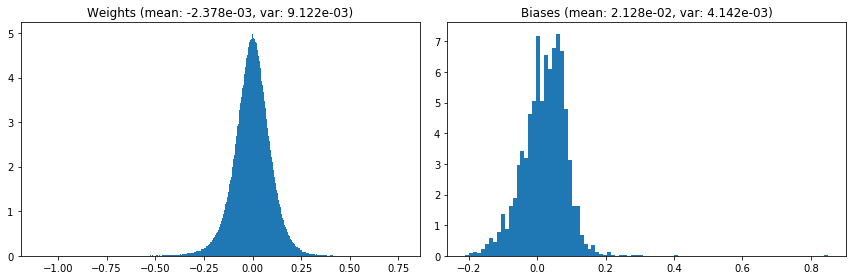

                                      Location network weights and biases


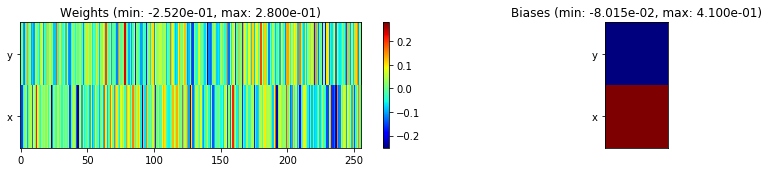

---------------------------------------------------------------------------------------------------------------
Elapsed time:  410.55 sec | TRAIN >> class loss: 0.4749 | steps:  2.513 :( | reward:  0.8382 :( | acc.: 83.823% :(
                          | VAL   >> class loss: 0.4351 | steps:  2.366 :( | reward:  0.8432 :( | acc.: 84.320% :(


Epoch  45/400) lr = 4.728e-05
 b    500/  3000 >> 134.5 ms/b | lr: 4.71e-05 | grad 2norm:  7.43 | grad inf norm:  1.776
       Weights || abs max:  1.10 (36500.34) | mean: -2.36e-03 ( 0.17) | var: 9.13e-03 (49484.59)
        Biases || abs max:  0.85 (45241.79) | mean:  2.13e-02 (20.29) | var: 4.15e-03 (285083552.00)
                  class loss: 0.473 | steps: 2.493 | reward:  0.840 | acc.: 84.04%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.4 ms/b | lr: 4.70e-05 | grad 2norm:  7.45 | grad inf norm:  1.850
       Weights || abs max:  1.10 (124433.87) | mean: -2.37e-03 ( 0.

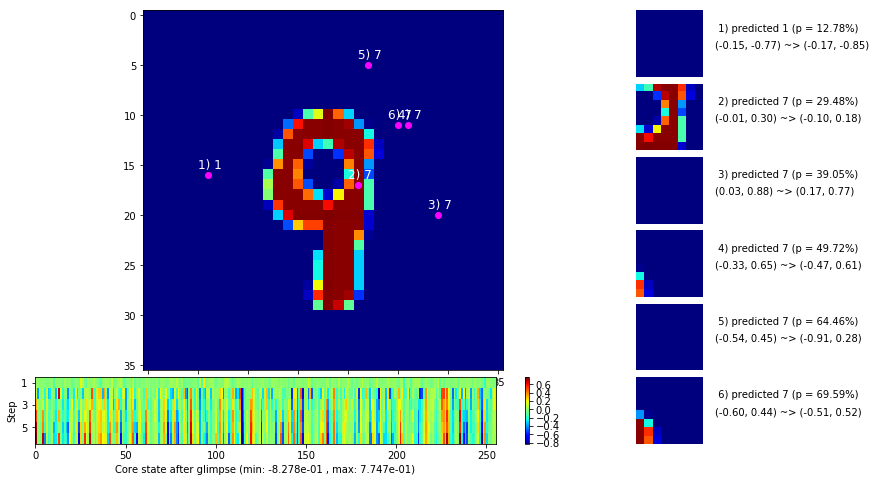

 b   1500/  3000 >> 136.6 ms/b | lr: 4.68e-05 | grad 2norm:  7.36 | grad inf norm:  1.761
       Weights || abs max:  1.10 (95672.47) | mean: -2.38e-03 ( 0.28) | var: 9.14e-03 (834639.75)
        Biases || abs max:  0.85 ( 6603.21) | mean:  2.13e-02 ( 4.66) | var: 4.16e-03 (269777.69)
                  class loss: 0.464 | steps: 2.486 | reward:  0.841 | acc.: 84.14%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 137.1 ms/b | lr: 4.66e-05 | grad 2norm:  7.41 | grad inf norm:  1.834
       Weights || abs max:  1.10 (55116.36) | mean: -2.39e-03 ( 0.21) | var: 9.15e-03 (134282.84)
        Biases || abs max:  0.85 (52626.84) | mean:  2.12e-02 (39.87) | var: 4.17e-03 (734118528.00)
                  class loss: 0.465 | steps: 2.513 | reward:  0.840 | acc.: 83.95%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

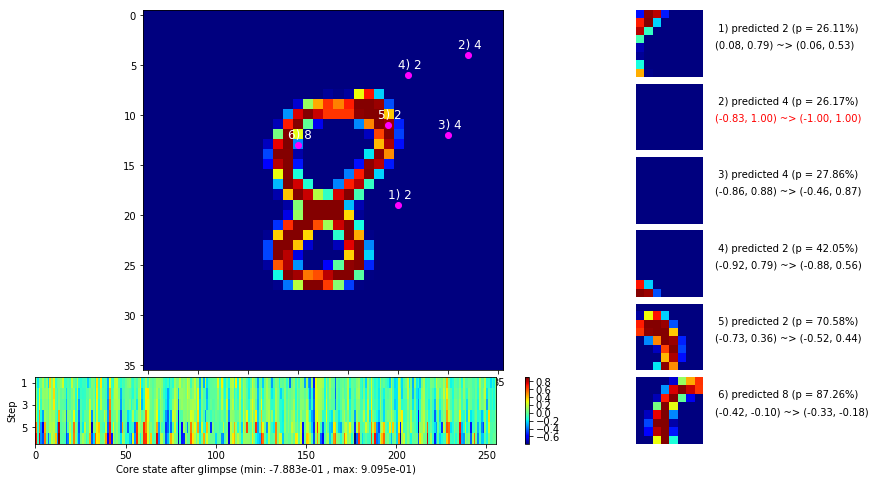

 b   2500/  3000 >> 134.7 ms/b | lr: 4.64e-05 | grad 2norm:  7.52 | grad inf norm:  1.875
       Weights || abs max:  1.11 (53464.30) | mean: -2.40e-03 ( 0.20) | var: 9.15e-03 (129727.55)
        Biases || abs max:  0.85 (15731.34) | mean:  2.12e-02 ( 7.94) | var: 4.18e-03 (11333291.00)
                  class loss: 0.485 | steps: 2.528 | reward:  0.836 | acc.: 83.55%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.3 ms/b | lr: 4.63e-05 | grad 2norm:  7.46 | grad inf norm:  1.732
       Weights || abs max:  1.11 (103255.42) | mean: -2.40e-03 ( 0.28) | var: 9.16e-03 (2428322.25)
        Biases || abs max:  0.85 ( 6999.77) | mean:  2.12e-02 ( 5.26) | var: 4.18e-03 (240334.22)
                  class loss: 0.475 | steps: 2.500 | reward:  0.836 | acc.: 83.55%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

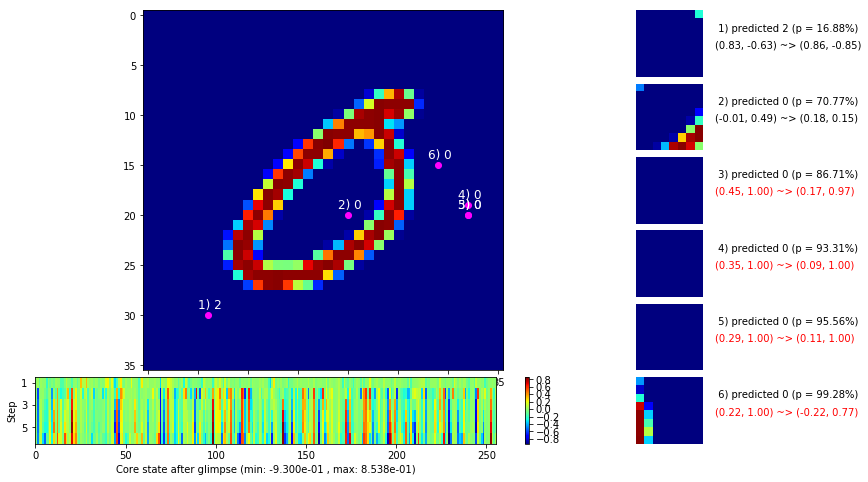

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


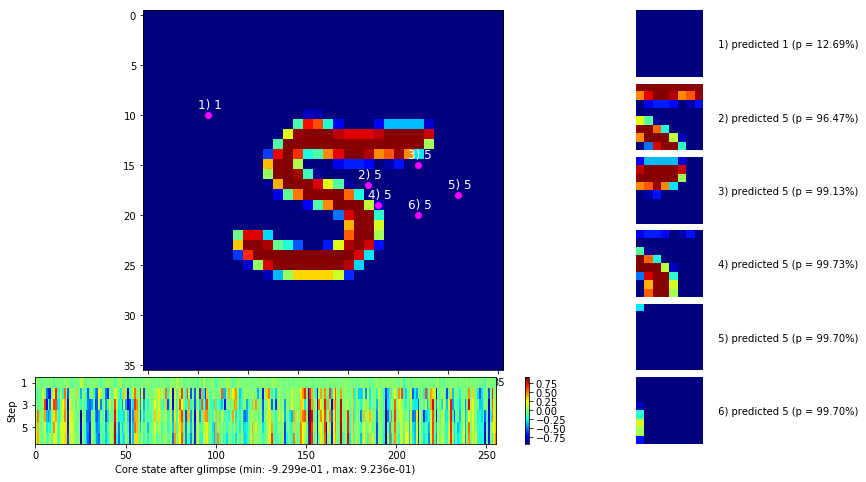


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


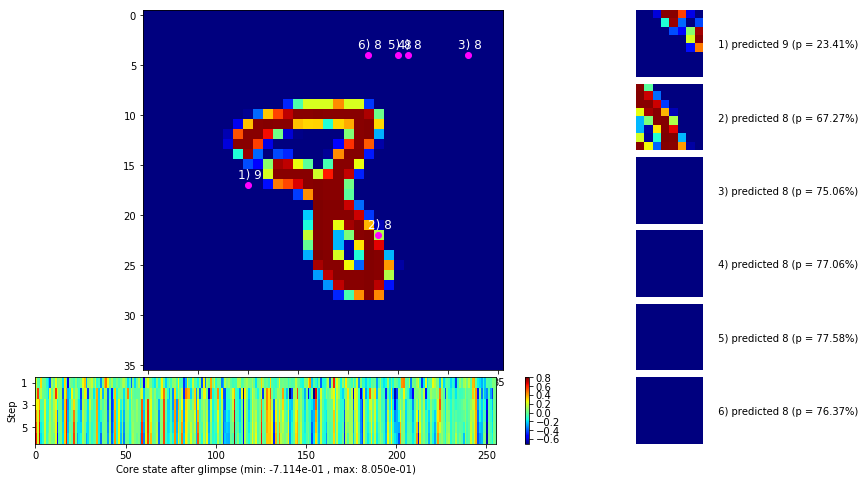

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


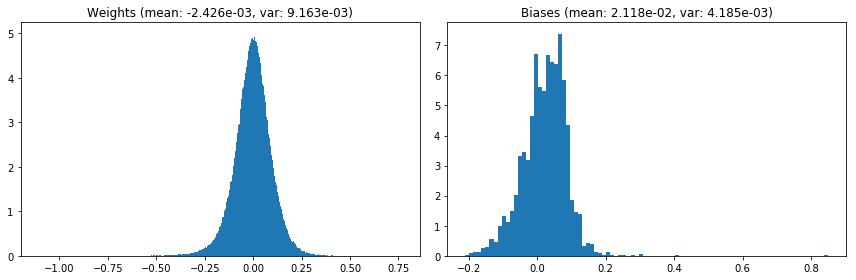

                                      Location network weights and biases


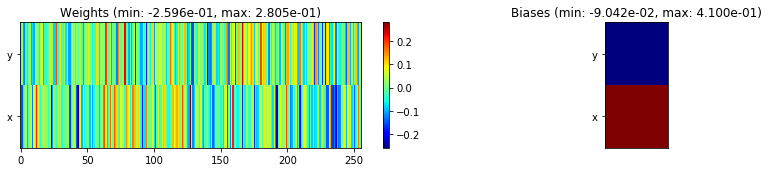

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.42 sec | TRAIN >> class loss: 0.4722 | steps:  2.503    | reward:  0.8384 :( | acc.: 83.838% :(
                          | VAL   >> class loss: 0.4026 | steps:  2.300 :( | reward:  0.8656 :( | acc.: 86.560% :(


Epoch  46/400) lr = 4.623e-05
 b    500/  3000 >> 138.6 ms/b | lr: 4.61e-05 | grad 2norm:  7.15 | grad inf norm:  1.737
       Weights || abs max:  1.11 (63997.77) | mean: -2.41e-03 ( 0.21) | var: 9.17e-03 (1207118.75)
        Biases || abs max:  0.85 (31080.00) | mean:  2.13e-02 (14.60) | var: 4.19e-03 (46475452.00)
                  class loss: 0.450 | steps: 2.461 | reward:  0.848 | acc.: 84.79%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 137.5 ms/b | lr: 4.60e-05 | grad 2norm:  7.43 | grad inf norm:  1.842
       Weights || abs max:  1.11 (43443.76) | mean: -2.39e-03 ( 0.

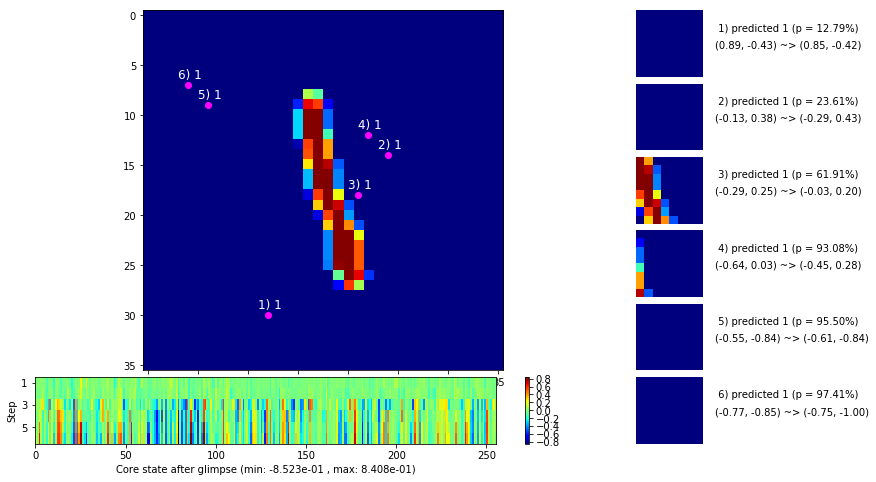

 b   1500/  3000 >> 135.8 ms/b | lr: 4.58e-05 | grad 2norm:  7.44 | grad inf norm:  1.818
       Weights || abs max:  1.11 (56048.69) | mean: -2.39e-03 ( 0.21) | var: 9.18e-03 (314121.91)
        Biases || abs max:  0.85 ( 7986.97) | mean:  2.13e-02 ( 5.87) | var: 4.19e-03 (466432.44)
                  class loss: 0.485 | steps: 2.526 | reward:  0.838 | acc.: 83.76%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.0 ms/b | lr: 4.56e-05 | grad 2norm:  7.38 | grad inf norm:  1.791
       Weights || abs max:  1.11 (179680.89) | mean: -2.39e-03 ( 0.41) | var: 9.19e-03 (8183426.00)
        Biases || abs max:  0.85 (10792.76) | mean:  2.13e-02 ( 6.55) | var: 4.20e-03 (1820225.88)
                  class loss: 0.470 | steps: 2.512 | reward:  0.840 | acc.: 84.00%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

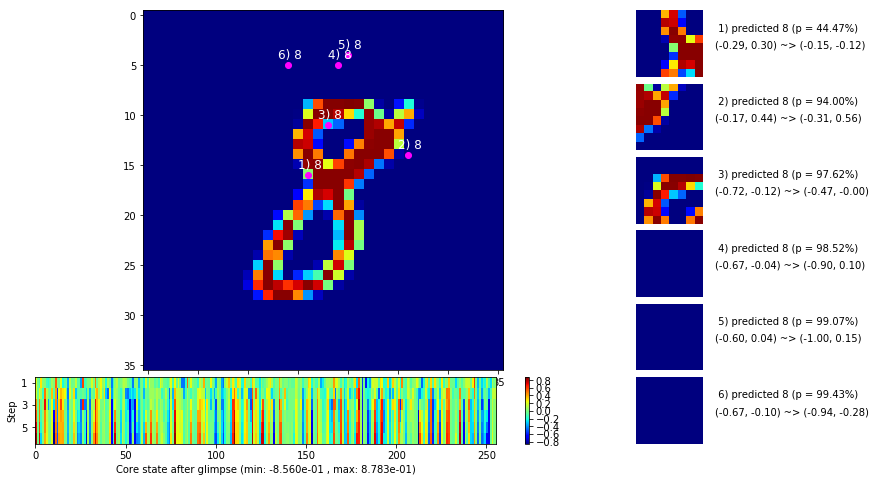

 b   2500/  3000 >> 135.3 ms/b | lr: 4.54e-05 | grad 2norm:  7.47 | grad inf norm:  1.832
       Weights || abs max:  1.12 (39704.09) | mean: -2.40e-03 ( 0.17) | var: 9.20e-03 (111497.10)
        Biases || abs max:  0.85 ( 9753.87) | mean:  2.13e-02 ( 6.10) | var: 4.20e-03 (2659311.50)
                  class loss: 0.469 | steps: 2.509 | reward:  0.838 | acc.: 83.80%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.9 ms/b | lr: 4.53e-05 | grad 2norm:  7.39 | grad inf norm:  1.796
       Weights || abs max:  1.12 (51453.57) | mean: -2.41e-03 ( 0.21) | var: 9.21e-03 (55043.51)
        Biases || abs max:  0.85 ( 9057.44) | mean:  2.13e-02 ( 6.51) | var: 4.21e-03 (579857.00)
                  class loss: 0.478 | steps: 2.527 | reward:  0.835 | acc.: 83.47%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

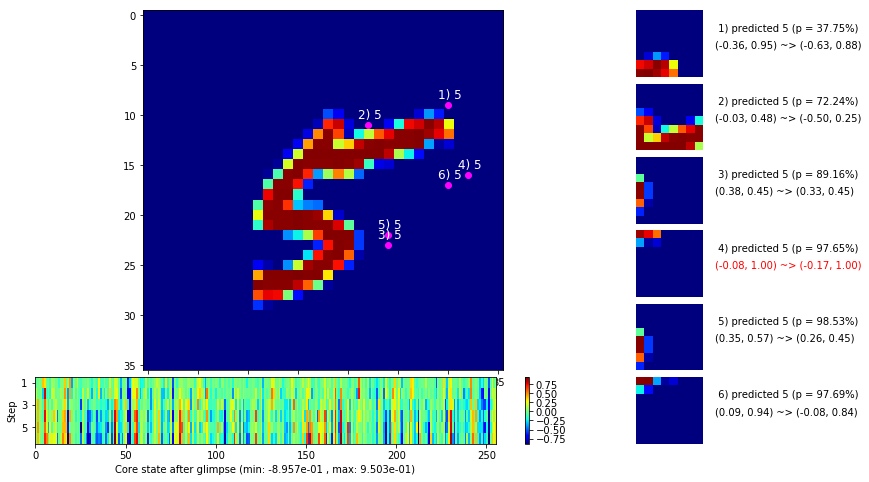

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


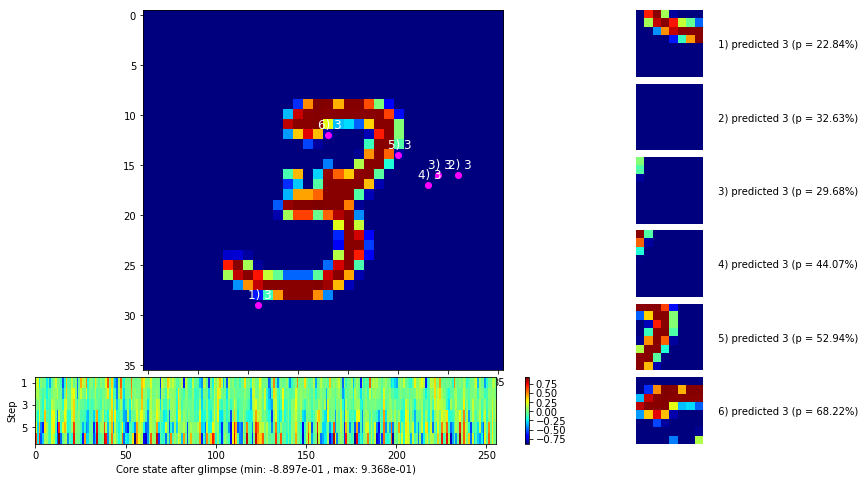


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


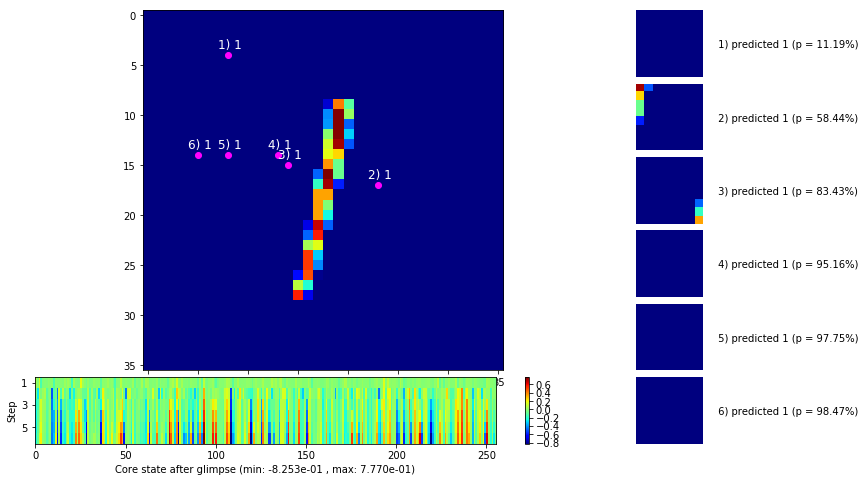

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


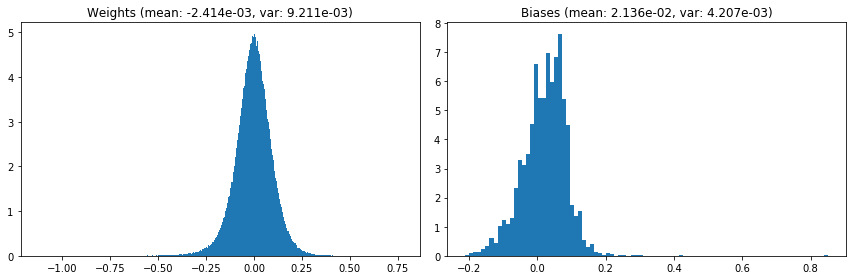

                                      Location network weights and biases


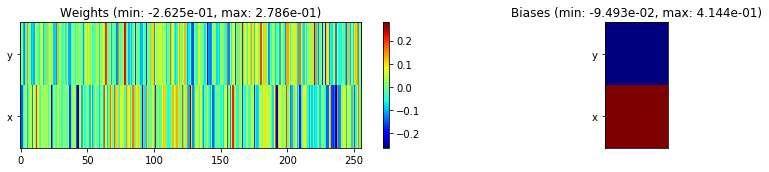

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.03 sec | TRAIN >> class loss: 0.4694 | steps:  2.504 :( | reward:  0.8393 :( | acc.: 83.927% :(
                          | VAL   >> class loss: 0.4127 | steps:  2.329 :( | reward:  0.8598 :( | acc.: 85.980% :(


Epoch  47/400) lr = 4.522e-05
 b    500/  3000 >> 134.3 ms/b | lr: 4.51e-05 | grad 2norm:  7.41 | grad inf norm:  1.765
       Weights || abs max:  1.12 (50011.09) | mean: -2.43e-03 ( 0.20) | var: 9.21e-03 (166375.17)
        Biases || abs max:  0.85 ( 7945.64) | mean:  2.13e-02 ( 5.54) | var: 4.20e-03 (1790676.25)
                  class loss: 0.470 | steps: 2.500 | reward:  0.839 | acc.: 83.94%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.5 ms/b | lr: 4.50e-05 | grad 2norm:  7.25 | grad inf norm:  1.725
       Weights || abs max:  1.12 (58380.72) | mean: -2.41e-03 ( 0.21

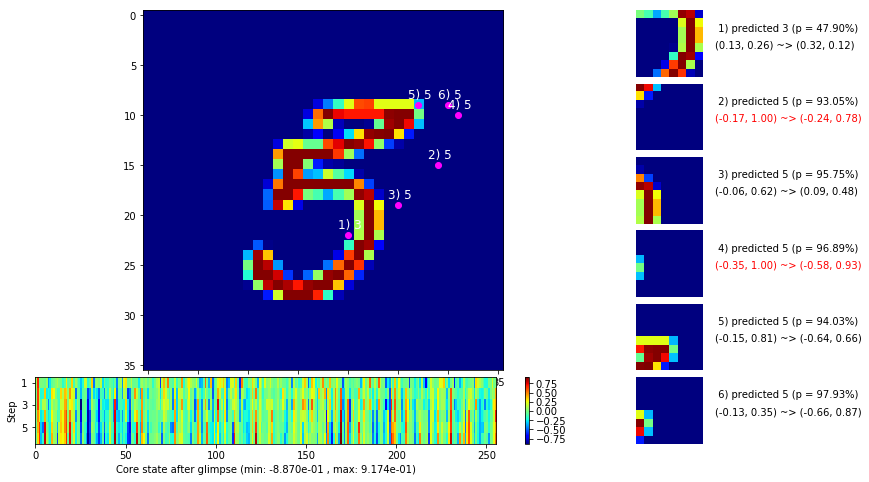

 b   1500/  3000 >> 137.7 ms/b | lr: 4.48e-05 | grad 2norm:  7.56 | grad inf norm:  1.851
       Weights || abs max:  1.13 (59236.12) | mean: -2.41e-03 ( 0.21) | var: 9.23e-03 (283302.16)
        Biases || abs max:  0.85 ( 6997.64) | mean:  2.14e-02 ( 4.64) | var: 4.23e-03 (696838.50)
                  class loss: 0.481 | steps: 2.486 | reward:  0.837 | acc.: 83.71%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.1 ms/b | lr: 4.46e-05 | grad 2norm:  7.45 | grad inf norm:  1.803
       Weights || abs max:  1.13 (329535.81) | mean: -2.43e-03 ( 0.66) | var: 9.24e-03 (69658200.00)
        Biases || abs max:  0.85 (12513.17) | mean:  2.14e-02 ( 8.68) | var: 4.24e-03 (3273195.25)
                  class loss: 0.466 | steps: 2.503 | reward:  0.836 | acc.: 83.58%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

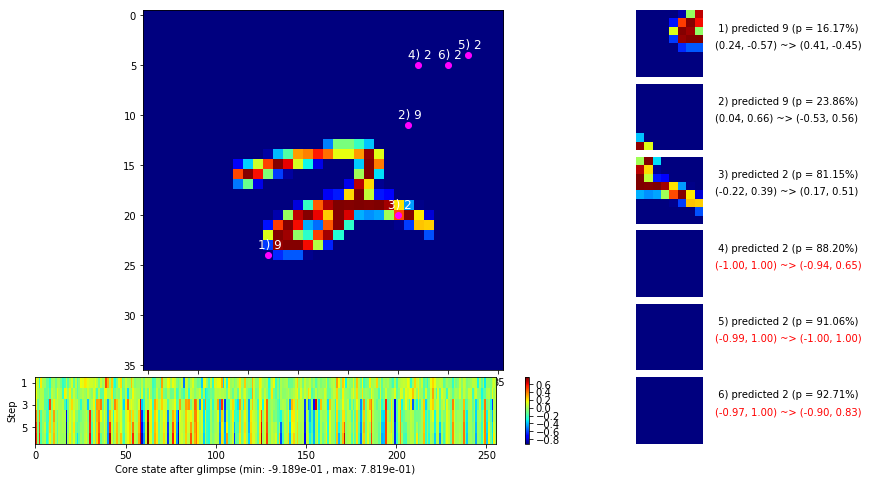

 b   2500/  3000 >> 137.6 ms/b | lr: 4.45e-05 | grad 2norm:  7.40 | grad inf norm:  1.806
       Weights || abs max:  1.13 (48182.52) | mean: -2.44e-03 ( 0.19) | var: 9.24e-03 (89674.45)
        Biases || abs max:  0.85 (11379.30) | mean:  2.13e-02 ( 7.64) | var: 4.23e-03 (1233595.12)
                  class loss: 0.481 | steps: 2.509 | reward:  0.834 | acc.: 83.36%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.9 ms/b | lr: 4.43e-05 | grad 2norm:  7.30 | grad inf norm:  1.747
       Weights || abs max:  1.13 (62753.59) | mean: -2.43e-03 ( 0.22) | var: 9.25e-03 (219825.66)
        Biases || abs max:  0.85 ( 8761.13) | mean:  2.13e-02 ( 6.06) | var: 4.23e-03 (1575035.75)
                  class loss: 0.460 | steps: 2.493 | reward:  0.843 | acc.: 84.26%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

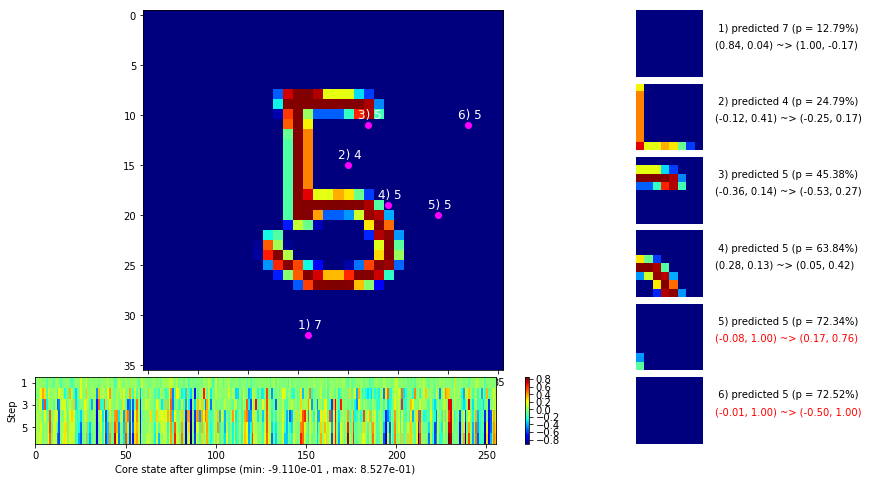

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


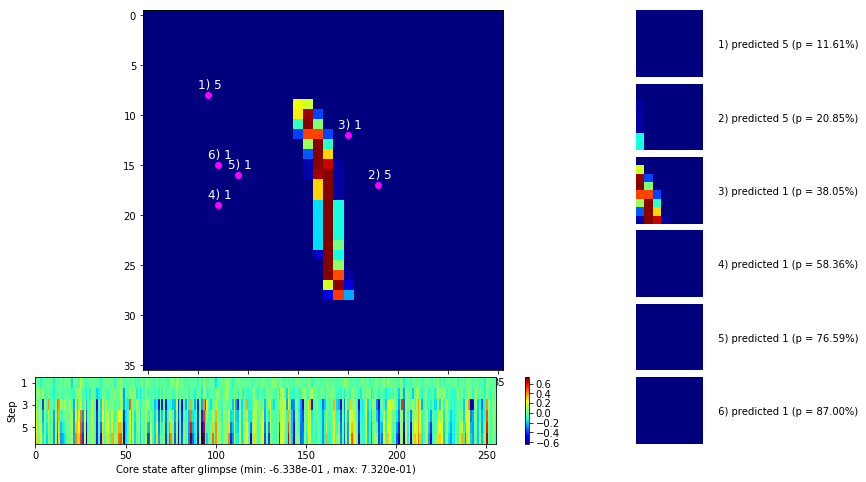


	Target class: 8  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


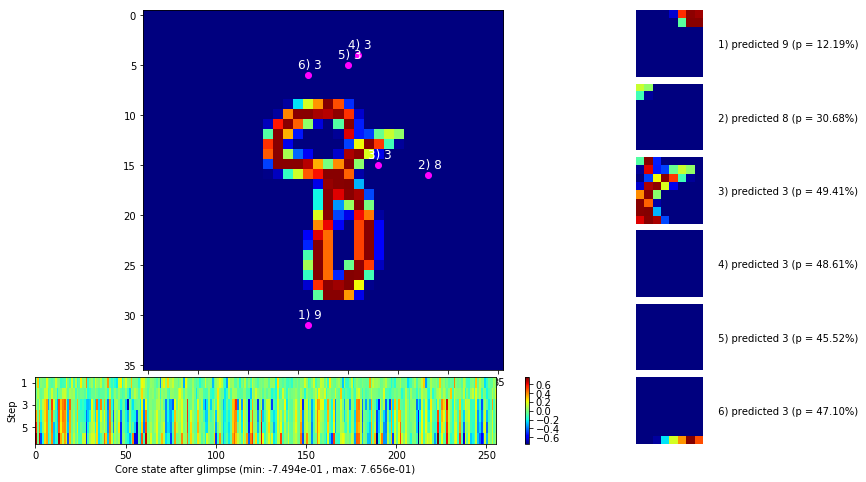

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


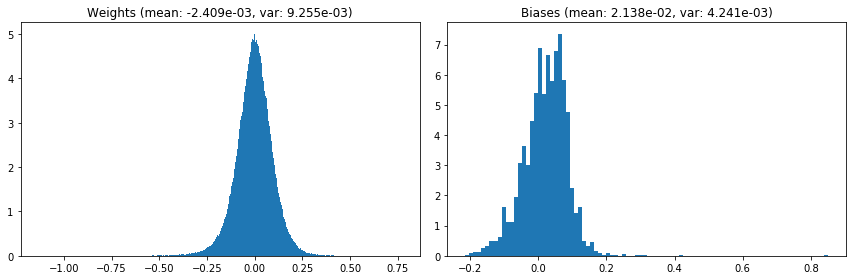

                                      Location network weights and biases


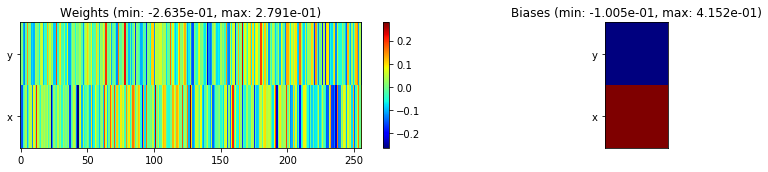

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.23 sec | TRAIN >> class loss: 0.4695 | steps:  2.498    | reward:  0.8385 :( | acc.: 83.852% :(
                          | VAL   >> class loss: 0.4193 | steps:  2.306 :( | reward:  0.8624 :( | acc.: 86.240% :(


Epoch  48/400) lr = 4.426e-05
 b    500/  3000 >> 134.4 ms/b | lr: 4.41e-05 | grad 2norm:  7.38 | grad inf norm:  1.785
       Weights || abs max:  1.13 (44504.11) | mean: -2.40e-03 ( 0.18) | var: 9.26e-03 (167219.55)
        Biases || abs max:  0.85 ( 6652.02) | mean:  2.14e-02 ( 5.47) | var: 4.25e-03 (332244.91)
                  class loss: 0.479 | steps: 2.499 | reward:  0.839 | acc.: 83.88%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.5 ms/b | lr: 4.40e-05 | grad 2norm:  7.23 | grad inf norm:  1.763
       Weights || abs max:  1.13 (35546.09) | mean: -2.40e-03 ( 0.17)

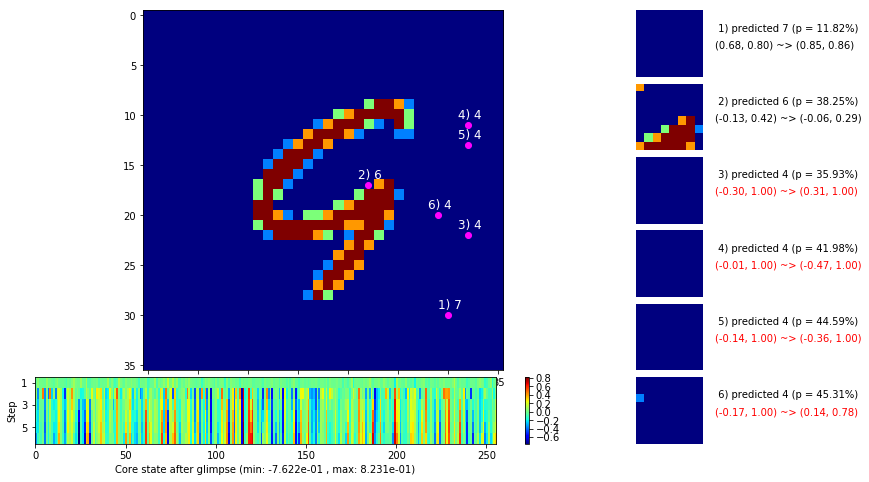

 b   1500/  3000 >> 136.0 ms/b | lr: 4.38e-05 | grad 2norm:  7.35 | grad inf norm:  1.738
       Weights || abs max:  1.14 (67475.11) | mean: -2.39e-03 ( 0.21) | var: 9.27e-03 (1101349.38)
        Biases || abs max:  0.85 ( 7268.61) | mean:  2.14e-02 ( 5.90) | var: 4.25e-03 (190303.78)
                  class loss: 0.469 | steps: 2.478 | reward:  0.841 | acc.: 84.08%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 129.7 ms/b | lr: 4.37e-05 | grad 2norm:  7.44 | grad inf norm:  1.785
       Weights || abs max:  1.14 (275771.00) | mean: -2.39e-03 ( 0.56) | var: 9.28e-03 (53538580.00)
        Biases || abs max:  0.85 ( 6776.93) | mean:  2.14e-02 ( 5.39) | var: 4.25e-03 (415967.50)
                  class loss: 0.475 | steps: 2.510 | reward:  0.839 | acc.: 83.87%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

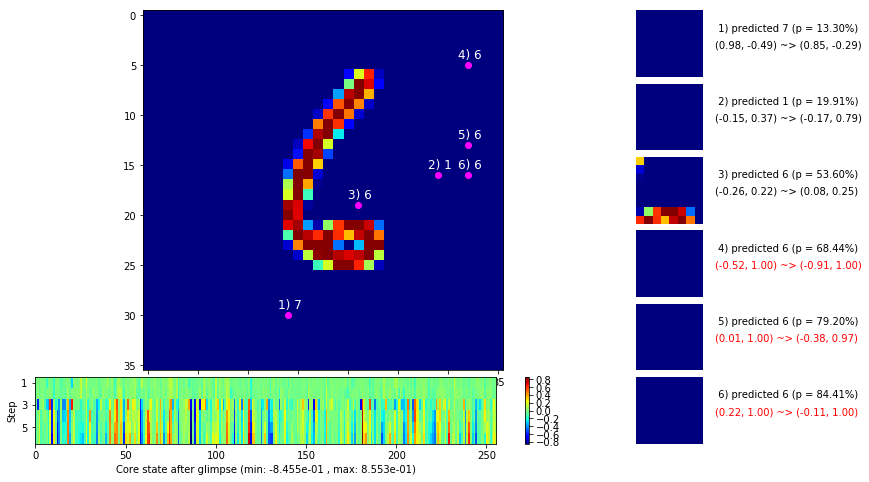

 b   2500/  3000 >> 132.0 ms/b | lr: 4.35e-05 | grad 2norm:  7.58 | grad inf norm:  1.811
       Weights || abs max:  1.14 (77862.13) | mean: -2.39e-03 ( 0.24) | var: 9.29e-03 (1414605.00)
        Biases || abs max:  0.85 ( 4030.31) | mean:  2.14e-02 ( 3.47) | var: 4.25e-03 (74845.40)
                  class loss: 0.473 | steps: 2.492 | reward:  0.836 | acc.: 83.64%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.9 ms/b | lr: 4.34e-05 | grad 2norm:  7.41 | grad inf norm:  1.711
       Weights || abs max:  1.14 (35475.72) | mean: -2.39e-03 ( 0.16) | var: 9.29e-03 (106944.93)
        Biases || abs max:  0.85 ( 9982.26) | mean:  2.14e-02 ( 6.49) | var: 4.26e-03 (1552881.12)
                  class loss: 0.474 | steps: 2.498 | reward:  0.837 | acc.: 83.71%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

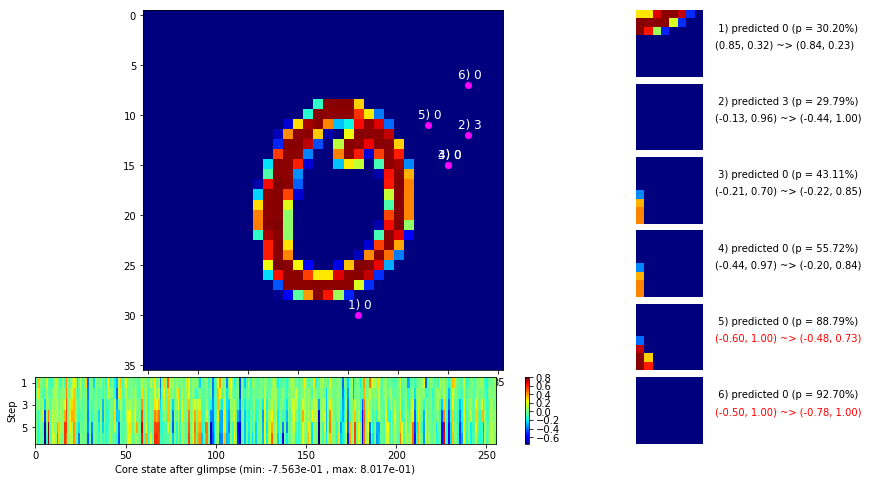

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


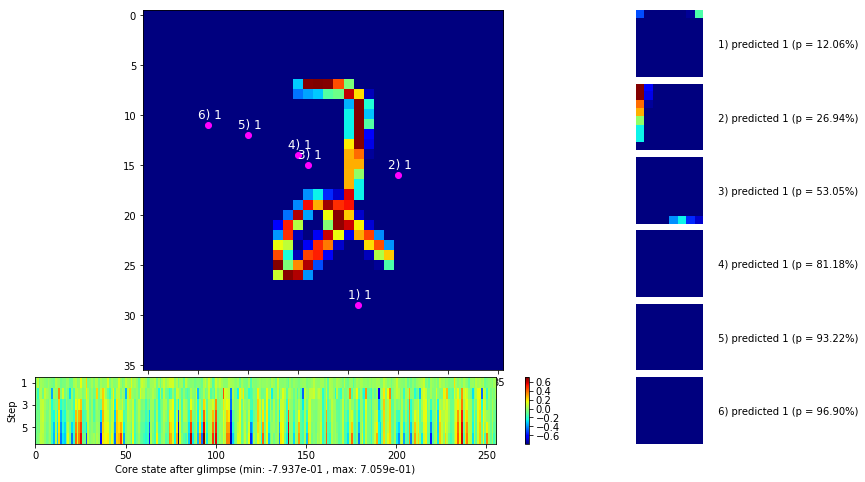


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


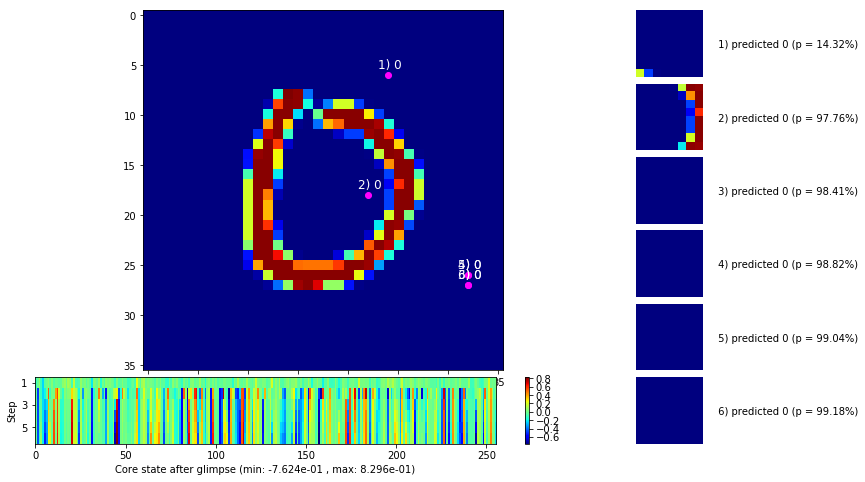

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


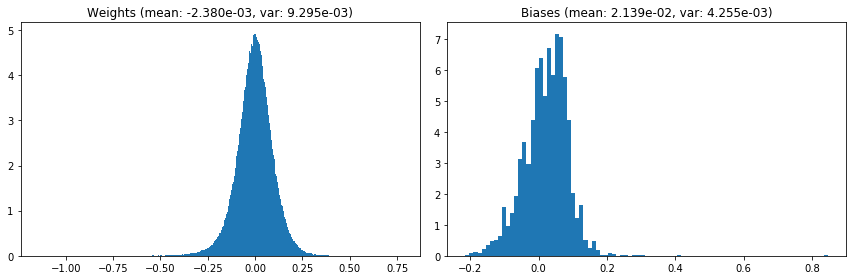

                                      Location network weights and biases


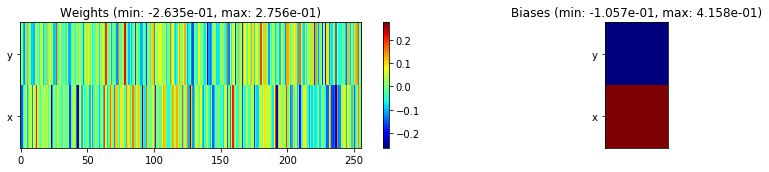

---------------------------------------------------------------------------------------------------------------
Elapsed time:  399.73 sec | TRAIN >> class loss: 0.4728 | steps:  2.494    | reward:  0.8385 :( | acc.: 83.853% :(
                          | VAL   >> class loss: 0.3855 | steps:  2.297 :( | reward:  0.8694 :( | acc.: 86.940% :(


Epoch  49/400) lr = 4.334e-05
 b    500/  3000 >> 131.3 ms/b | lr: 4.32e-05 | grad 2norm:  7.41 | grad inf norm:  1.800
       Weights || abs max:  1.14 (56223.73) | mean: -2.37e-03 ( 0.21) | var: 9.30e-03 (154830.17)
        Biases || abs max:  0.85 (16050.99) | mean:  2.15e-02 (12.81) | var: 4.27e-03 (44099292.00)
                  class loss: 0.470 | steps: 2.511 | reward:  0.838 | acc.: 83.83%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 129.6 ms/b | lr: 4.31e-05 | grad 2norm:  7.39 | grad inf norm:  1.727
       Weights || abs max:  1.15 (34042.41) | mean: -2.36e-03 ( 0.1

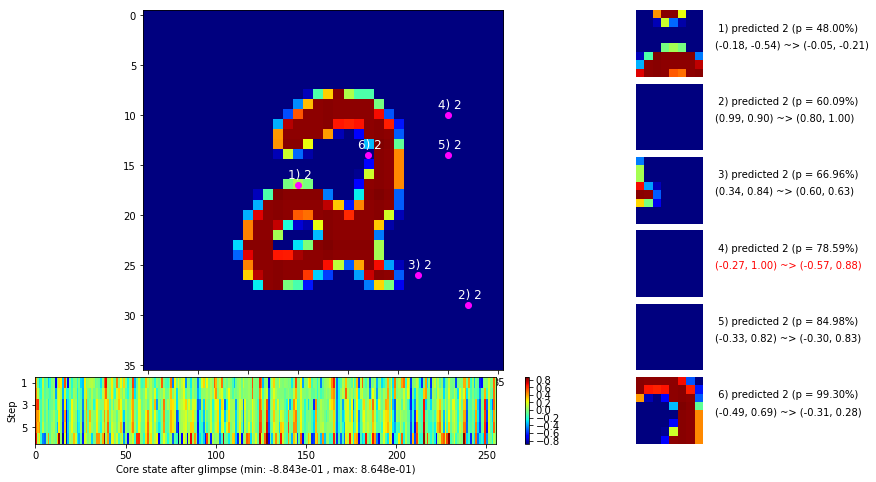

 b   1500/  3000 >> 132.7 ms/b | lr: 4.29e-05 | grad 2norm:  7.43 | grad inf norm:  1.782
       Weights || abs max:  1.15 (365653.97) | mean: -2.37e-03 ( 0.71) | var: 9.31e-03 (93849040.00)
        Biases || abs max:  0.85 ( 7854.61) | mean:  2.14e-02 ( 5.70) | var: 4.27e-03 (694443.31)
                  class loss: 0.482 | steps: 2.520 | reward:  0.835 | acc.: 83.47%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 129.3 ms/b | lr: 4.28e-05 | grad 2norm:  7.34 | grad inf norm:  1.810
       Weights || abs max:  1.15 (84256.09) | mean: -2.36e-03 ( 0.25) | var: 9.32e-03 (1541042.25)
        Biases || abs max:  0.85 (11777.79) | mean:  2.14e-02 ( 6.85) | var: 4.28e-03 (2176230.75)
                  class loss: 0.460 | steps: 2.496 | reward:  0.844 | acc.: 84.36%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 

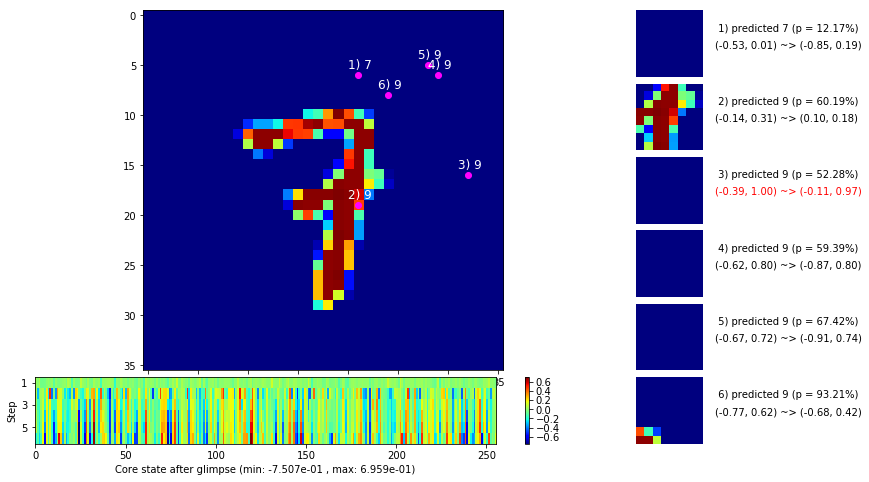

 b   2500/  3000 >> 130.2 ms/b | lr: 4.26e-05 | grad 2norm:  7.38 | grad inf norm:  1.784
       Weights || abs max:  1.15 (56799.13) | mean: -2.37e-03 ( 0.20) | var: 9.32e-03 (440195.84)
        Biases || abs max:  0.85 ( 5692.96) | mean:  2.14e-02 ( 4.50) | var: 4.28e-03 (195914.12)
                  class loss: 0.471 | steps: 2.506 | reward:  0.838 | acc.: 83.82%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 129.5 ms/b | lr: 4.25e-05 | grad 2norm:  7.41 | grad inf norm:  1.823
       Weights || abs max:  1.15 (211990.33) | mean: -2.39e-03 ( 0.46) | var: 9.33e-03 (21478880.00)
        Biases || abs max:  0.85 ( 9020.90) | mean:  2.14e-02 ( 6.48) | var: 4.29e-03 (1274538.75)
                  class loss: 0.461 | steps: 2.515 | reward:  0.845 | acc.: 84.45%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0

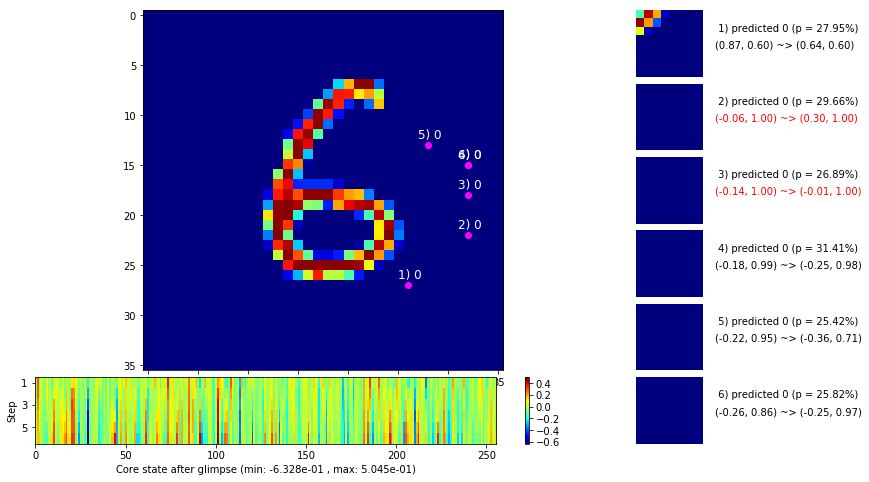

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


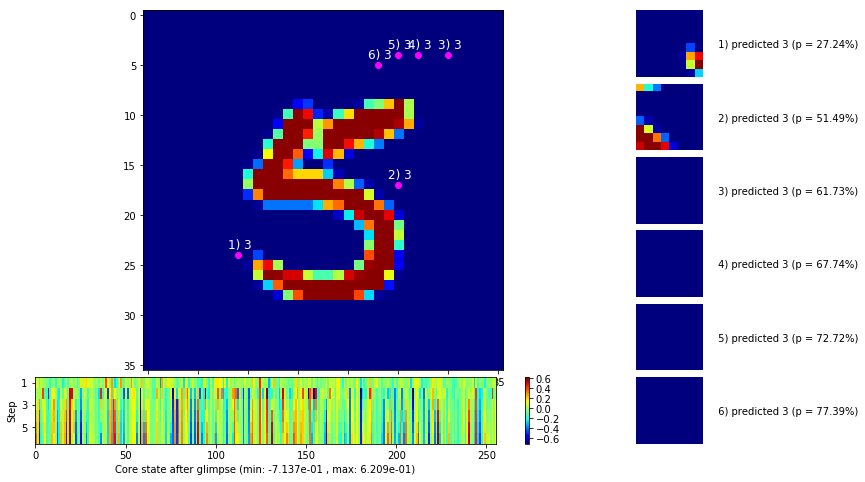


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


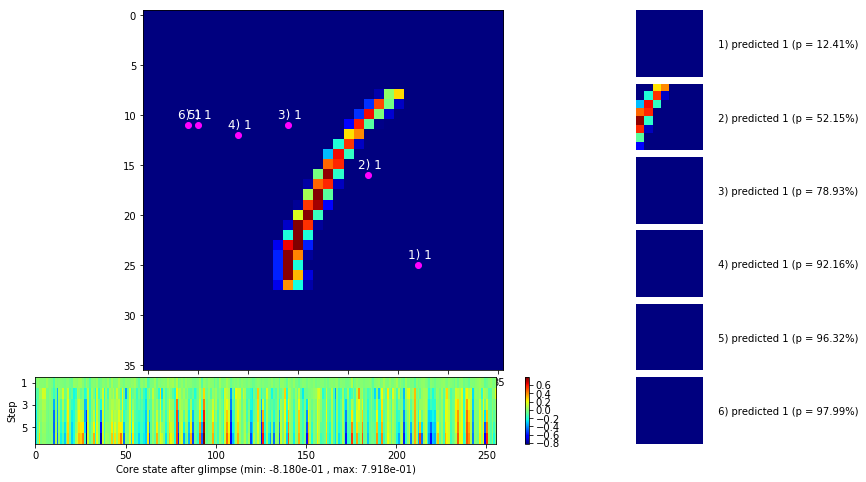

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


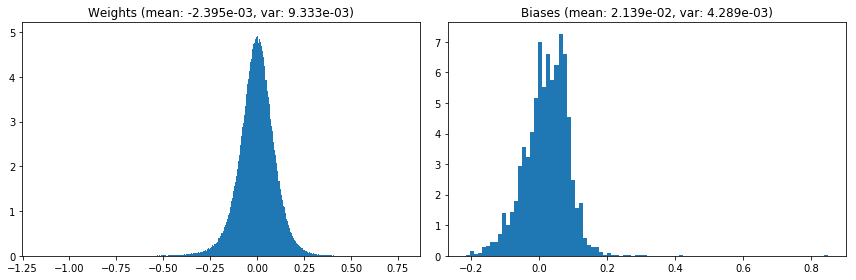

                                      Location network weights and biases


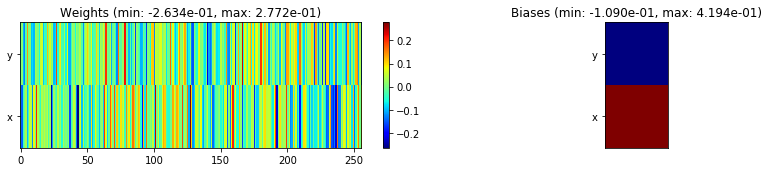

---------------------------------------------------------------------------------------------------------------
Elapsed time:  391.80 sec | TRAIN >> class loss: 0.4677 | steps:  2.509 :( | reward:  0.8402 :( | acc.: 84.018% :(
                          | VAL   >> class loss: 0.3728 | steps:  2.270    | reward:  0.8718 :( | acc.: 87.180% :(


Epoch  50/400) lr = 4.246e-05
 b    500/  3000 >> 129.0 ms/b | lr: 4.23e-05 | grad 2norm:  7.29 | grad inf norm:  1.802
       Weights || abs max:  1.16 (36831.02) | mean: -2.40e-03 ( 0.17) | var: 9.34e-03 (27266.52)
        Biases || abs max:  0.85 ( 7123.42) | mean:  2.14e-02 ( 5.24) | var: 4.29e-03 (472646.44)
                  class loss: 0.467 | steps: 2.504 | reward:  0.845 | acc.: 84.53%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.5 ms/b | lr: 4.22e-05 | grad 2norm:  7.37 | grad inf norm:  1.729
       Weights || abs max:  1.16 (49387.98) | mean: -2.40e-03 ( 0.20) 

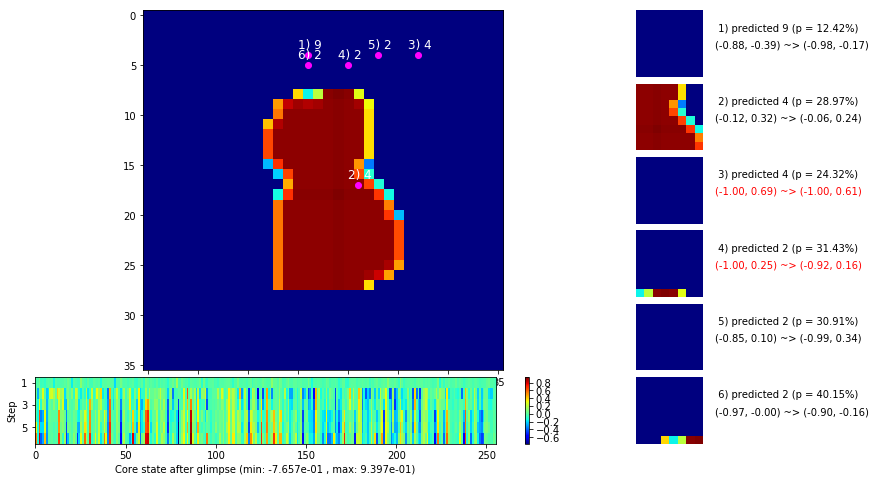

 b   1500/  3000 >> 130.7 ms/b | lr: 4.21e-05 | grad 2norm:  7.38 | grad inf norm:  1.830
       Weights || abs max:  1.16 (26107.50) | mean: -2.41e-03 ( 0.15) | var: 9.35e-03 (15976.65)
        Biases || abs max:  0.85 ( 8628.27) | mean:  2.14e-02 ( 6.48) | var: 4.29e-03 (383472.50)
                  class loss: 0.466 | steps: 2.509 | reward:  0.840 | acc.: 83.98%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 129.7 ms/b | lr: 4.19e-05 | grad 2norm:  7.31 | grad inf norm:  1.751
       Weights || abs max:  1.17 (226887.72) | mean: -2.40e-03 ( 0.48) | var: 9.36e-03 (27332972.00)
        Biases || abs max:  0.85 (10488.11) | mean:  2.14e-02 ( 6.66) | var: 4.30e-03 (2002970.62)
                  class loss: 0.457 | steps: 2.506 | reward:  0.842 | acc.: 84.24%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.

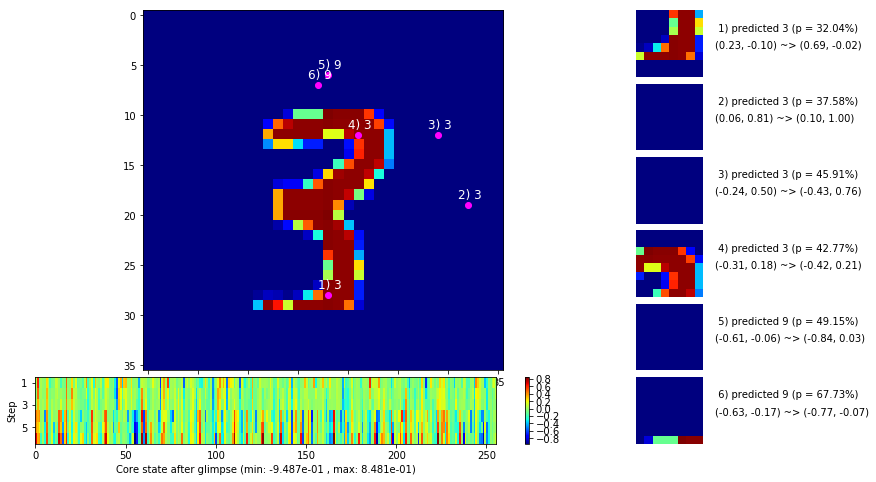

 b   2500/  3000 >> 130.4 ms/b | lr: 4.18e-05 | grad 2norm:  7.34 | grad inf norm:  1.702
       Weights || abs max:  1.17 (38661.74) | mean: -2.38e-03 ( 0.17) | var: 9.36e-03 (34366.20)
        Biases || abs max:  0.85 ( 7397.64) | mean:  2.14e-02 ( 5.03) | var: 4.30e-03 (352830.03)
                  class loss: 0.459 | steps: 2.484 | reward:  0.843 | acc.: 84.30%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 129.1 ms/b | lr: 4.17e-05 | grad 2norm:  7.30 | grad inf norm:  1.785
       Weights || abs max:  1.17 (34734.66) | mean: -2.38e-03 ( 0.17) | var: 9.37e-03 (20724.77)
        Biases || abs max:  0.85 (22663.69) | mean:  2.14e-02 (10.84) | var: 4.30e-03 (16209731.00)
                  class loss: 0.467 | steps: 2.498 | reward:  0.843 | acc.: 84.30%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

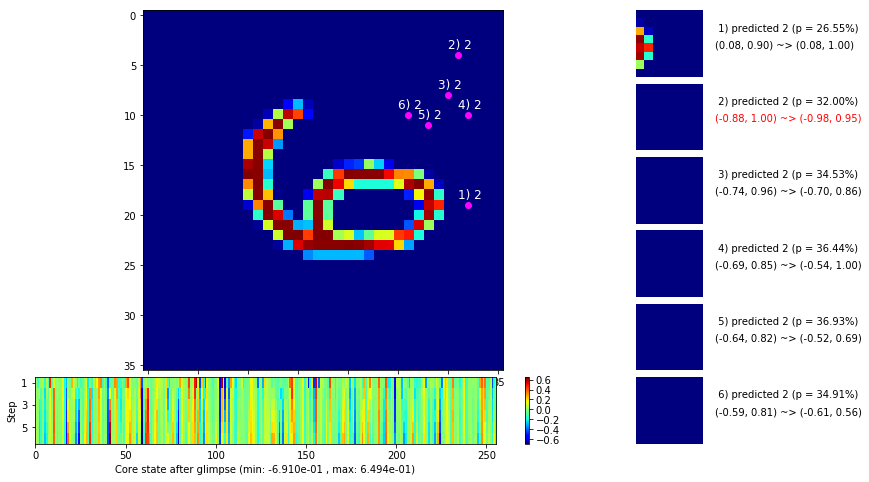

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


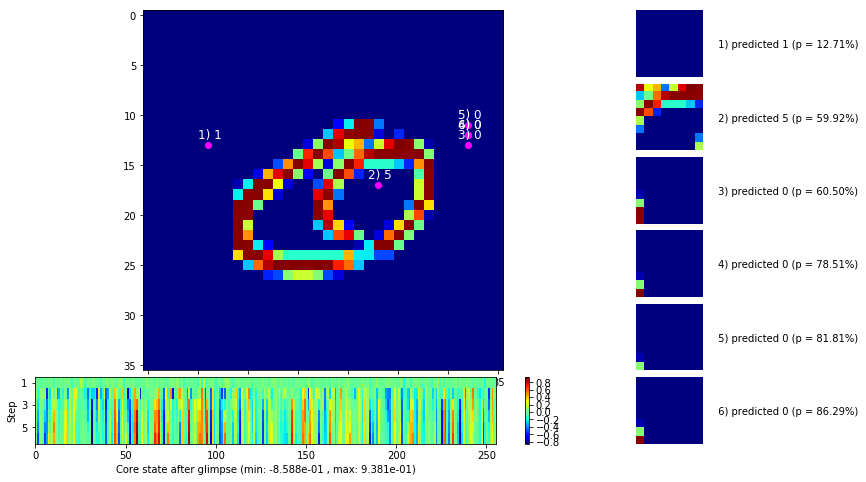


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


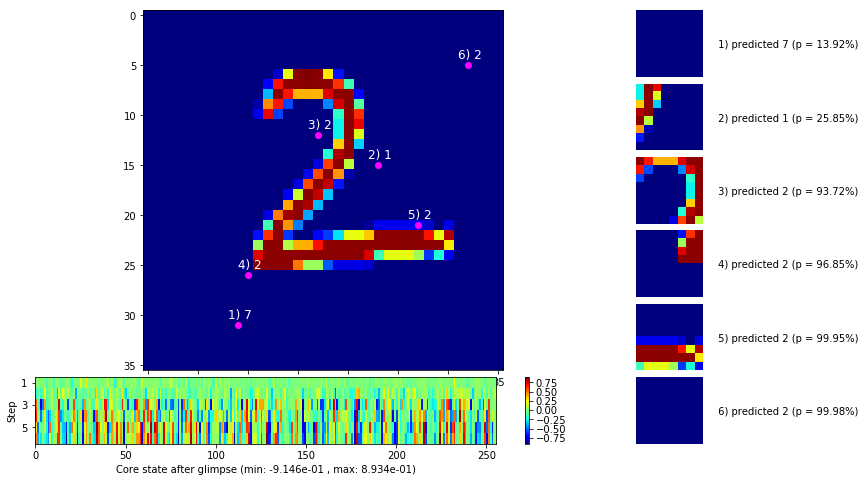

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


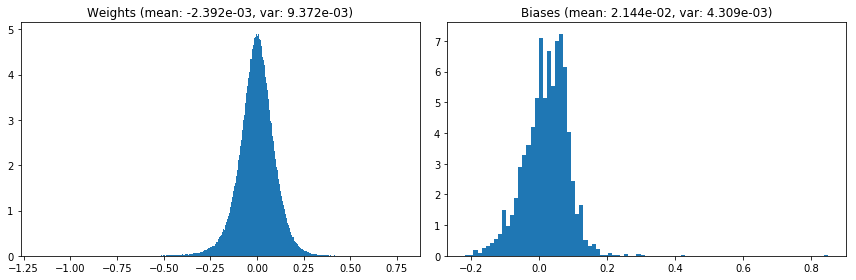

                                      Location network weights and biases


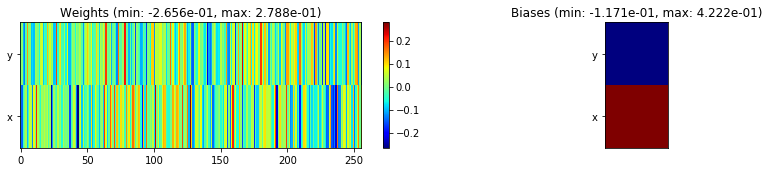

---------------------------------------------------------------------------------------------------------------
Elapsed time:  391.85 sec | TRAIN >> class loss: 0.4667 | steps:  2.503 :( | reward:  0.8419 :( | acc.: 84.187% :(
                          | VAL   >> class loss: 0.4092 | steps:  2.312 :( | reward:  0.8646 :( | acc.: 86.460% :(


Epoch  51/400) lr = 4.161e-05
 b    500/  3000 >> 128.4 ms/b | lr: 4.15e-05 | grad 2norm:  7.33 | grad inf norm:  1.788
       Weights || abs max:  1.17 (30388.94) | mean: -2.40e-03 ( 0.15) | var: 9.38e-03 (22841.38)
        Biases || abs max:  0.85 (16076.04) | mean:  2.14e-02 ( 8.35) | var: 4.31e-03 (11780085.00)
                  class loss: 0.455 | steps: 2.474 | reward:  0.849 | acc.: 84.90%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 128.6 ms/b | lr: 4.14e-05 | grad 2norm:  7.31 | grad inf norm:  1.793
       Weights || abs max:  1.17 (107532.22) | mean: -2.39e-03 ( 0.2

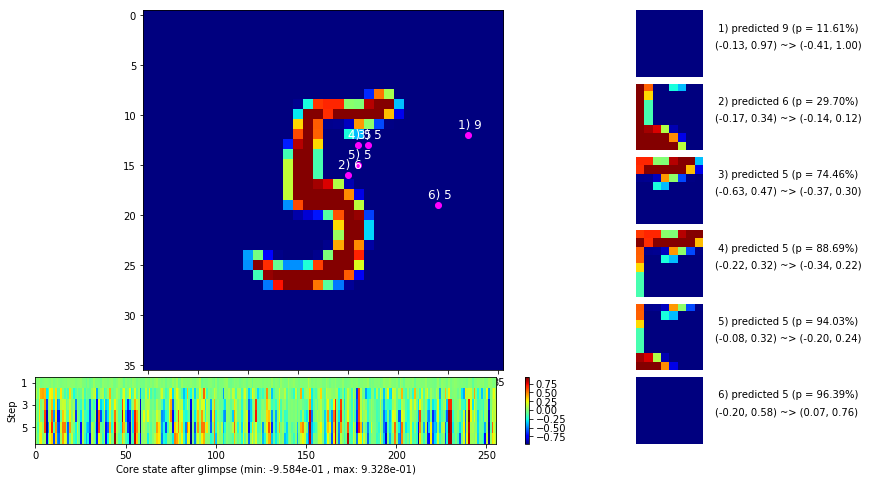

 b   1500/  3000 >> 130.2 ms/b | lr: 4.12e-05 | grad 2norm:  7.29 | grad inf norm:  1.738
       Weights || abs max:  1.17 (41035.77) | mean: -2.41e-03 ( 0.18) | var: 9.39e-03 (27603.70)
        Biases || abs max:  0.85 ( 6090.05) | mean:  2.14e-02 ( 4.21) | var: 4.32e-03 (1289529.00)
                  class loss: 0.466 | steps: 2.499 | reward:  0.841 | acc.: 84.05%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 129.1 ms/b | lr: 4.11e-05 | grad 2norm:  7.38 | grad inf norm:  1.734
       Weights || abs max:  1.18 (50193.50) | mean: -2.41e-03 ( 0.20) | var: 9.39e-03 (152368.55)
        Biases || abs max:  0.85 (11762.26) | mean:  2.14e-02 ( 6.61) | var: 4.33e-03 (7174980.00)
                  class loss: 0.471 | steps: 2.528 | reward:  0.836 | acc.: 83.62%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

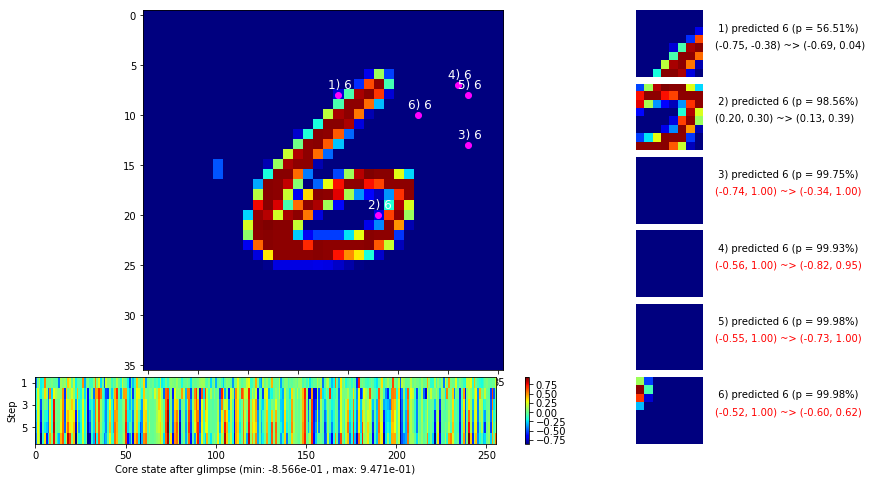

 b   2500/  3000 >> 132.5 ms/b | lr: 4.10e-05 | grad 2norm:  7.22 | grad inf norm:  1.780
       Weights || abs max:  1.18 (45789.02) | mean: -2.40e-03 ( 0.19) | var: 9.40e-03 (251853.22)
        Biases || abs max:  0.85 ( 5409.76) | mean:  2.14e-02 ( 4.21) | var: 4.33e-03 (550619.69)
                  class loss: 0.461 | steps: 2.491 | reward:  0.846 | acc.: 84.62%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 129.1 ms/b | lr: 4.08e-05 | grad 2norm:  7.43 | grad inf norm:  1.803
       Weights || abs max:  1.18 (50120.71) | mean: -2.38e-03 ( 0.19) | var: 9.41e-03 (211681.97)
        Biases || abs max:  0.85 (13718.90) | mean:  2.15e-02 ( 8.26) | var: 4.34e-03 (3504302.00)
                  class loss: 0.466 | steps: 2.479 | reward:  0.839 | acc.: 83.91%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

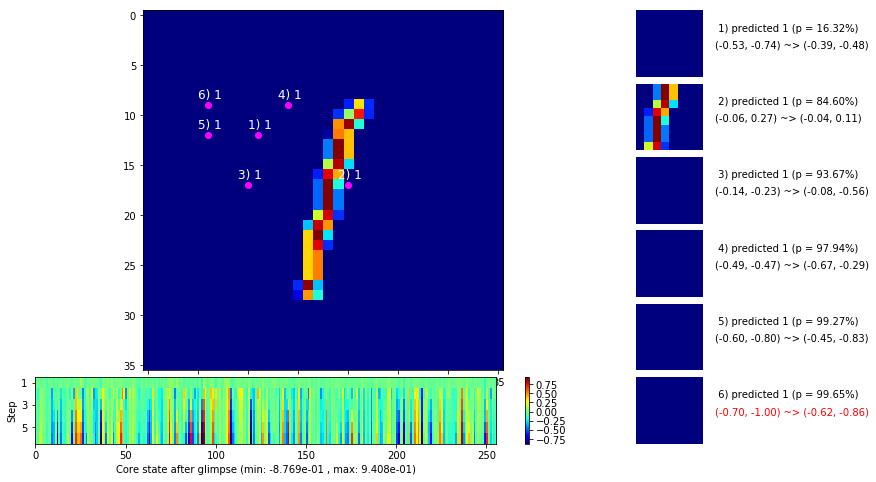

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


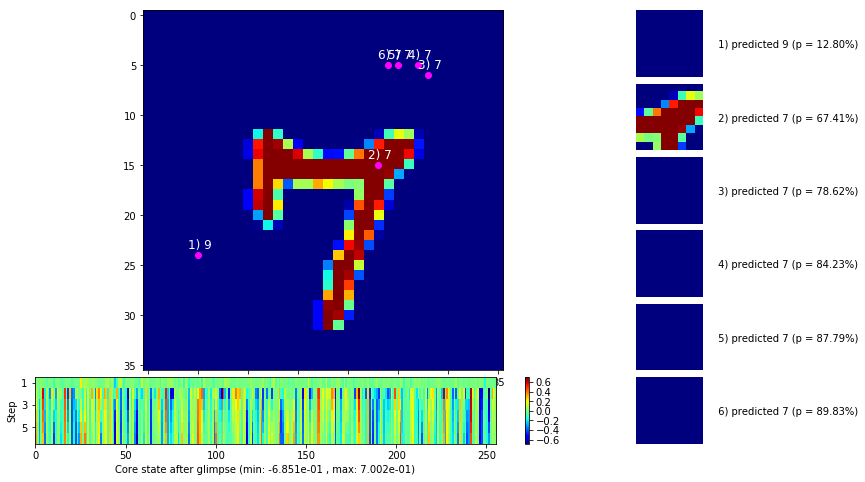


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


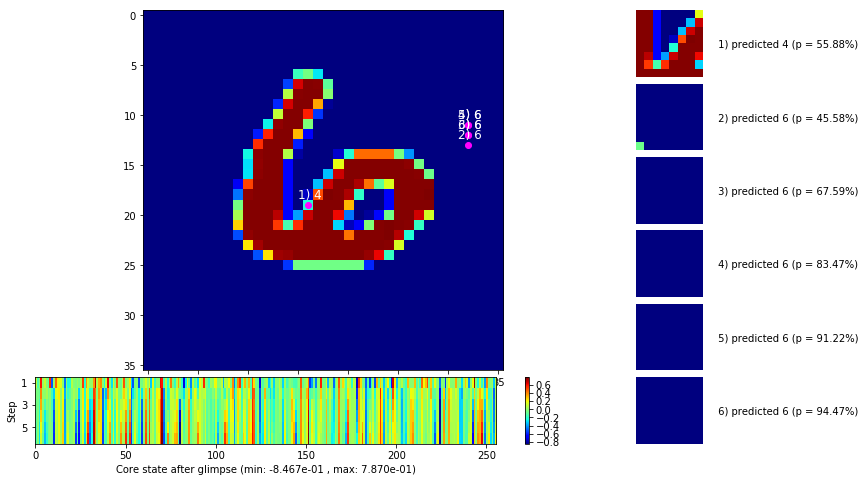

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


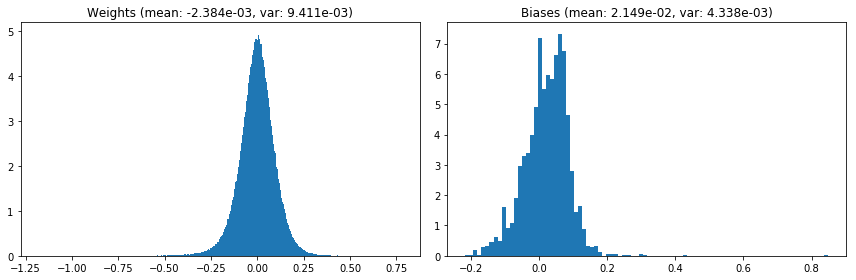

                                      Location network weights and biases


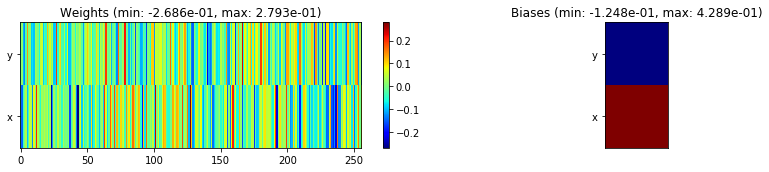

---------------------------------------------------------------------------------------------------------------
Elapsed time:  389.53 sec | TRAIN >> class loss: 0.4640 | steps:  2.497 :( | reward:  0.8425 :( | acc.: 84.252% :(
                          | VAL   >> class loss: 0.4232 | steps:  2.309 :( | reward:  0.8582 :( | acc.: 85.820% :(


Epoch  52/400) lr = 4.08e-05
 b    500/  3000 >> 128.9 ms/b | lr: 4.07e-05 | grad 2norm:  7.44 | grad inf norm:  1.861
       Weights || abs max:  1.18 (45364.93) | mean: -2.39e-03 ( 0.18) | var: 9.41e-03 (181752.34)
        Biases || abs max:  0.85 ( 5475.02) | mean:  2.15e-02 ( 4.46) | var: 4.34e-03 (153318.58)
                  class loss: 0.476 | steps: 2.484 | reward:  0.841 | acc.: 84.09%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 128.7 ms/b | lr: 4.06e-05 | grad 2norm:  7.36 | grad inf norm:  1.801
       Weights || abs max:  1.18 (42824.72) | mean: -2.37e-03 ( 0.18) 

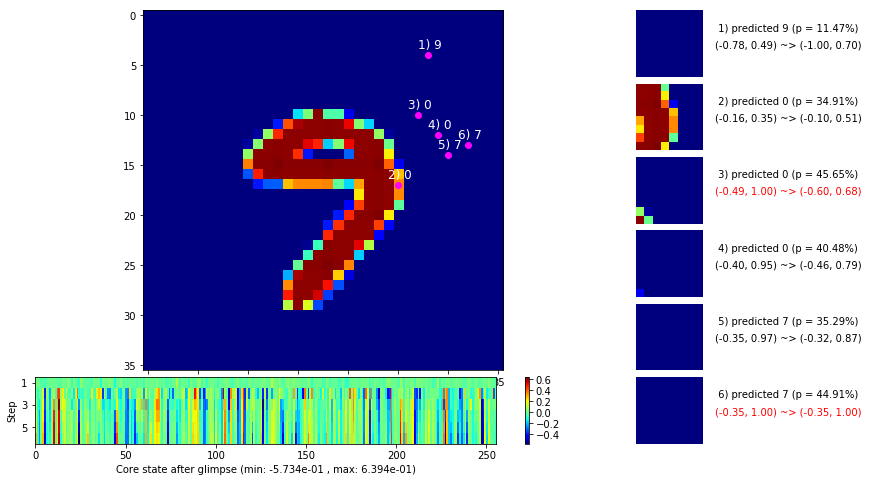

 b   1500/  3000 >> 130.9 ms/b | lr: 4.04e-05 | grad 2norm:  7.31 | grad inf norm:  1.789
       Weights || abs max:  1.18 (87047.19) | mean: -2.35e-03 ( 0.25) | var: 9.43e-03 (763621.50)
        Biases || abs max:  0.85 (1237652.50) | mean:  2.16e-02 (483.54) | var: 4.36e-03 (290076360704.00)
                  class loss: 0.461 | steps: 2.483 | reward:  0.843 | acc.: 84.29%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 129.6 ms/b | lr: 4.03e-05 | grad 2norm:  7.42 | grad inf norm:  1.785
       Weights || abs max:  1.19 (51188.13) | mean: -2.35e-03 ( 0.21) | var: 9.43e-03 (357552.62)
        Biases || abs max:  0.85 ( 7718.68) | mean:  2.16e-02 ( 5.29) | var: 4.36e-03 (501115.84)
                  class loss: 0.467 | steps: 2.529 | reward:  0.842 | acc.: 84.15%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1

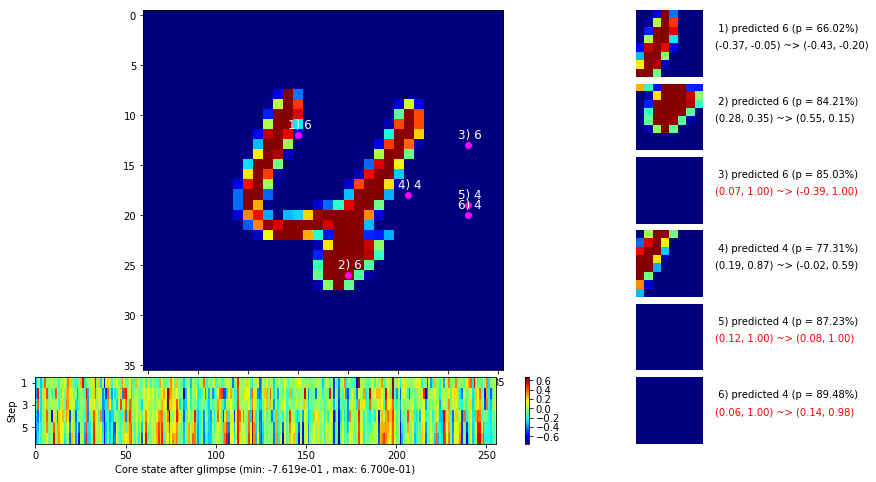

 b   2500/  3000 >> 129.3 ms/b | lr: 4.02e-05 | grad 2norm:  7.60 | grad inf norm:  1.815
       Weights || abs max:  1.19 (42537.04) | mean: -2.36e-03 ( 0.18) | var: 9.44e-03 (68537.91)
        Biases || abs max:  0.85 ( 8395.48) | mean:  2.15e-02 ( 5.82) | var: 4.35e-03 (572475.56)
                  class loss: 0.494 | steps: 2.510 | reward:  0.827 | acc.: 82.68%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 129.2 ms/b | lr: 4.01e-05 | grad 2norm:  7.40 | grad inf norm:  1.798
       Weights || abs max:  1.19 (34360.56) | mean: -2.37e-03 ( 0.17) | var: 9.45e-03 (36057.52)
        Biases || abs max:  0.85 ( 8370.99) | mean:  2.15e-02 ( 5.88) | var: 4.36e-03 (380624.03)
                  class loss: 0.484 | steps: 2.536 | reward:  0.838 | acc.: 83.80%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

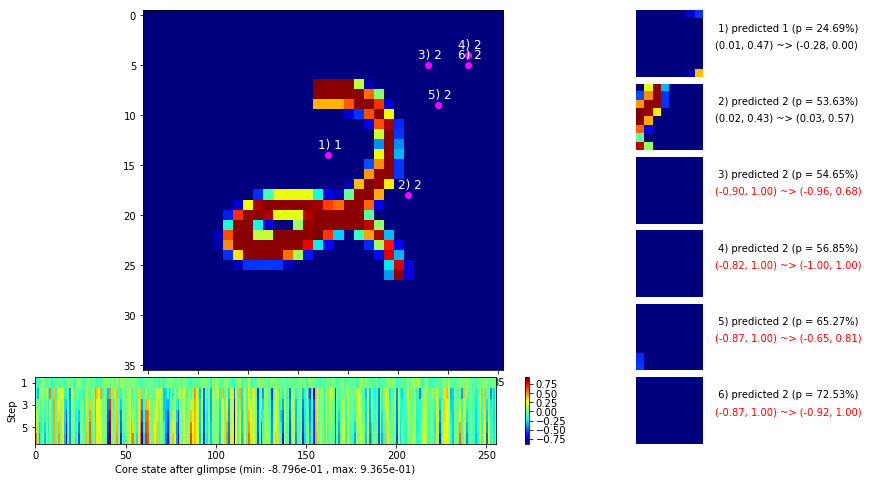

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


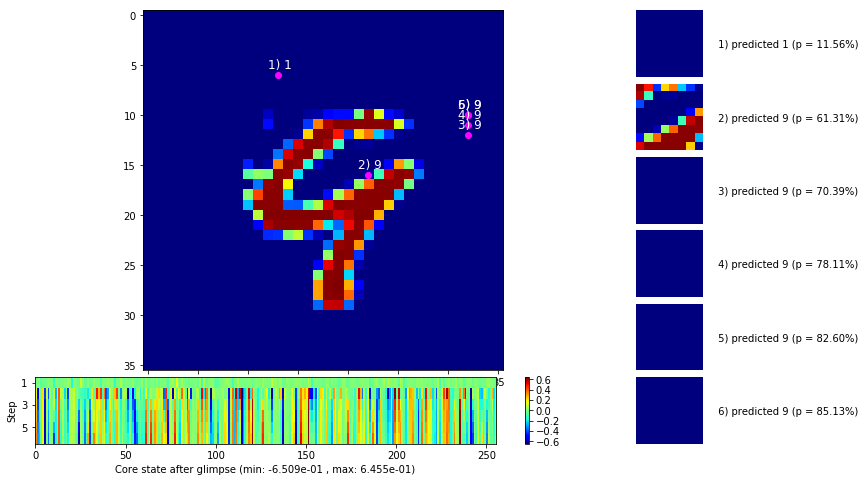


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


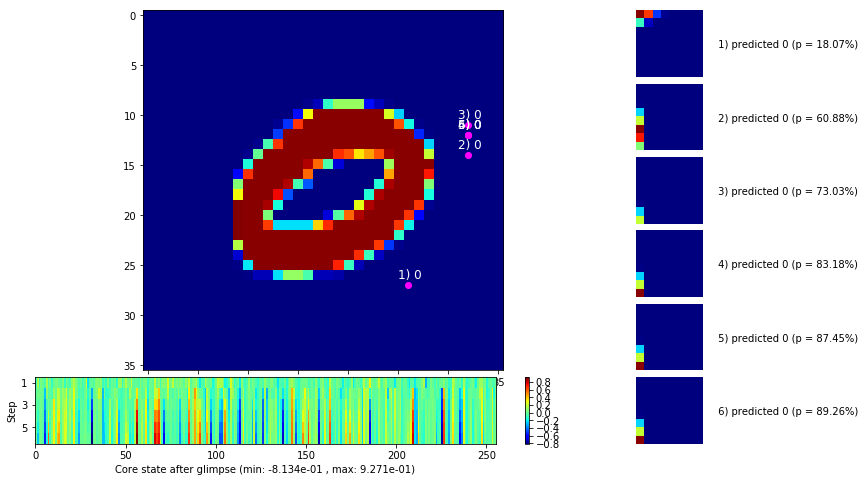

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


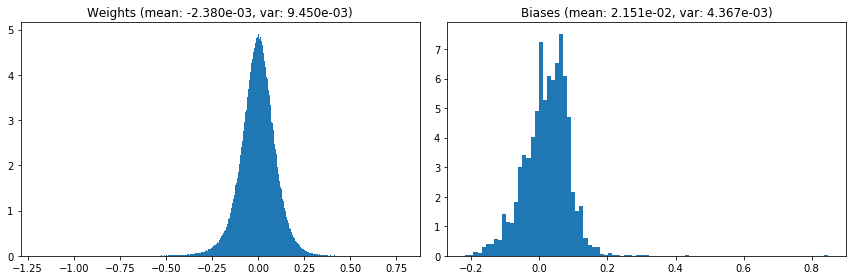

                                      Location network weights and biases


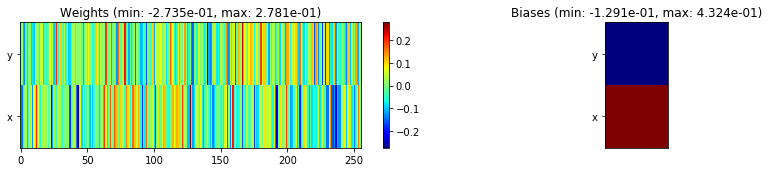

---------------------------------------------------------------------------------------------------------------
Elapsed time:  388.79 sec | TRAIN >> class loss: 0.4739 | steps:  2.502 :( | reward:  0.8388 :( | acc.: 83.877% :(
                          | VAL   >> class loss: 0.4044 | steps:  2.315 :( | reward:  0.8610 :( | acc.: 86.100% :(


Epoch  53/400) lr = 4.001e-05
 b    500/  3000 >> 129.0 ms/b | lr: 3.99e-05 | grad 2norm:  7.41 | grad inf norm:  1.796
       Weights || abs max:  1.19 (558655.69) | mean: -2.39e-03 ( 1.03) | var: 9.45e-03 (228837616.00)
        Biases || abs max:  0.85 ( 7442.58) | mean:  2.15e-02 ( 5.43) | var: 4.37e-03 (624620.06)
                  class loss: 0.477 | steps: 2.506 | reward:  0.836 | acc.: 83.62%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.8 ms/b | lr: 3.98e-05 | grad 2norm:  7.40 | grad inf norm:  1.818
       Weights || abs max:  1.19 (54384.80) | mean: -2.38e-03 ( 0

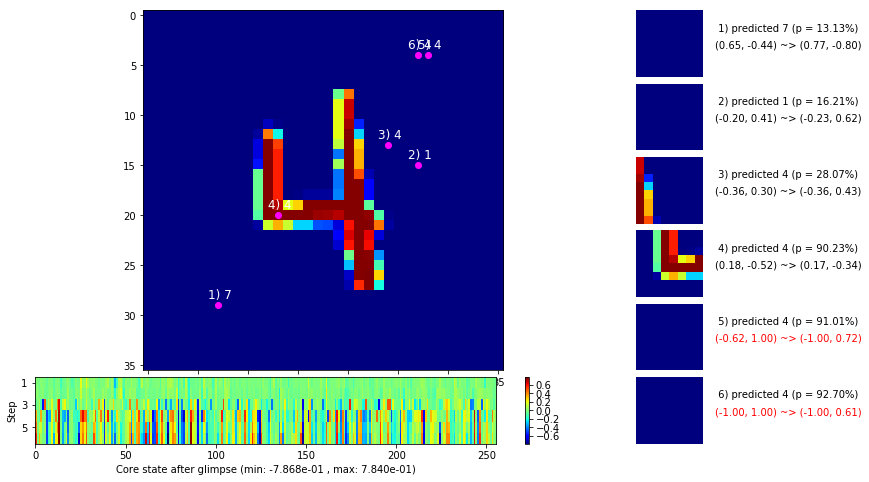

 b   1500/  3000 >> 130.7 ms/b | lr: 3.97e-05 | grad 2norm:  7.38 | grad inf norm:  1.781
       Weights || abs max:  1.19 (53690.86) | mean: -2.39e-03 ( 0.20) | var: 9.47e-03 (103369.19)
        Biases || abs max:  0.85 (16195.42) | mean:  2.15e-02 (10.51) | var: 4.38e-03 (9515651.00)
                  class loss: 0.483 | steps: 2.532 | reward:  0.836 | acc.: 83.58%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 127.5 ms/b | lr: 3.96e-05 | grad 2norm:  7.40 | grad inf norm:  1.797
       Weights || abs max:  1.19 (25187.01) | mean: -2.40e-03 ( 0.15) | var: 9.47e-03 (16913.65)
        Biases || abs max:  0.85 (10790.67) | mean:  2.15e-02 ( 6.47) | var: 4.38e-03 (3863721.25)
                  class loss: 0.487 | steps: 2.544 | reward:  0.833 | acc.: 83.26%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

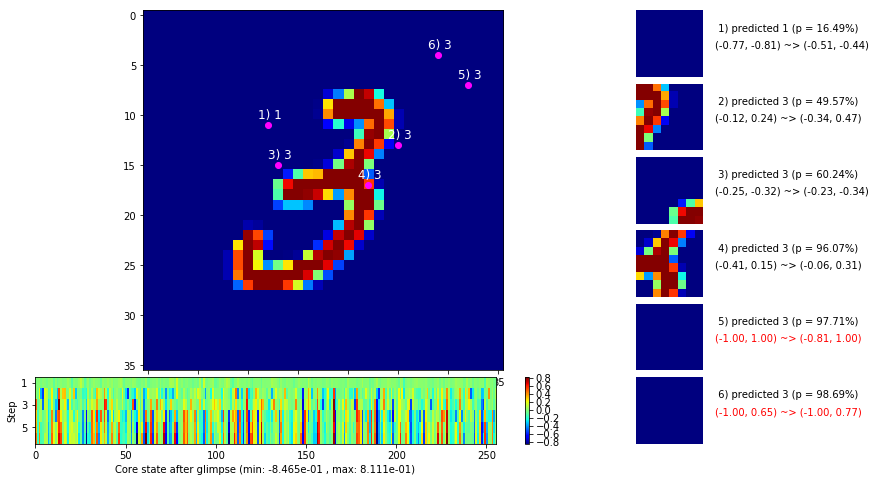

 b   2500/  3000 >> 129.7 ms/b | lr: 3.94e-05 | grad 2norm:  7.30 | grad inf norm:  1.771
       Weights || abs max:  1.20 (48185.24) | mean: -2.39e-03 ( 0.19) | var: 9.48e-03 (134851.39)
        Biases || abs max:  0.85 (15197.68) | mean:  2.16e-02 ( 8.57) | var: 4.38e-03 (9620988.00)
                  class loss: 0.475 | steps: 2.512 | reward:  0.836 | acc.: 83.61%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 128.4 ms/b | lr: 3.93e-05 | grad 2norm:  7.33 | grad inf norm:  1.782
       Weights || abs max:  1.20 (238335.39) | mean: -2.38e-03 ( 0.50) | var: 9.49e-03 (30200958.00)
        Biases || abs max:  0.85 ( 8722.92) | mean:  2.16e-02 ( 6.68) | var: 4.39e-03 (332022.94)
                  class loss: 0.472 | steps: 2.505 | reward:  0.839 | acc.: 83.89%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1

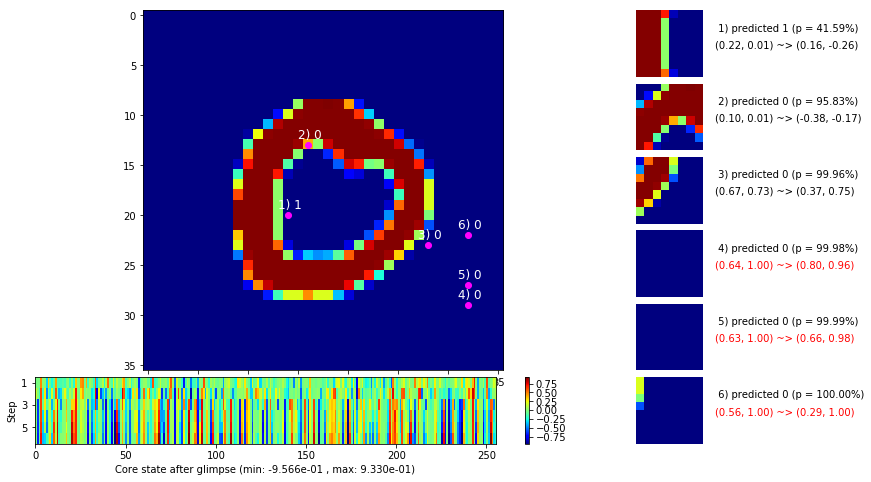

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


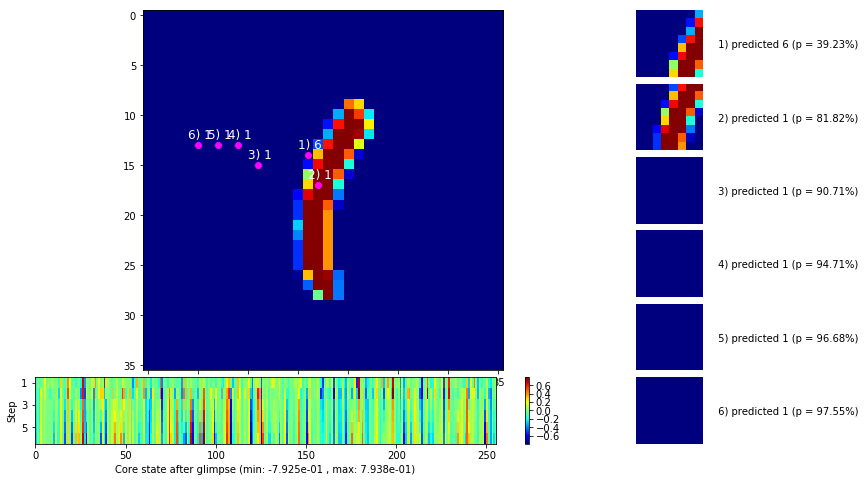


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


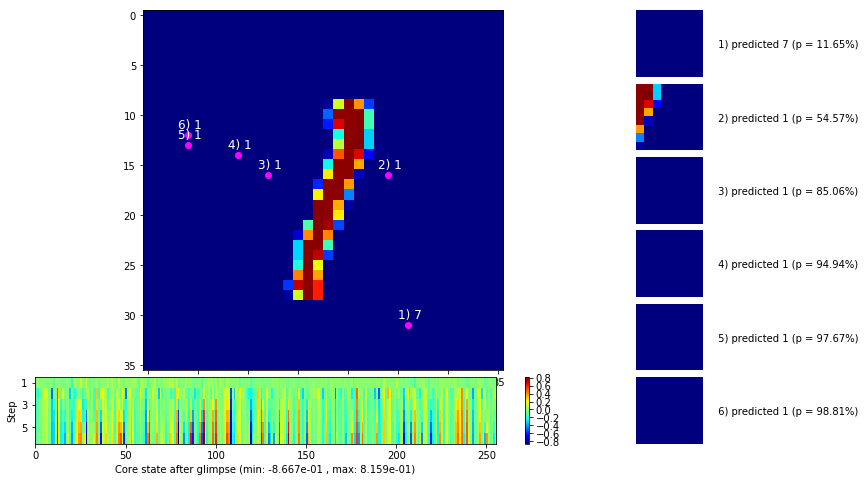

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


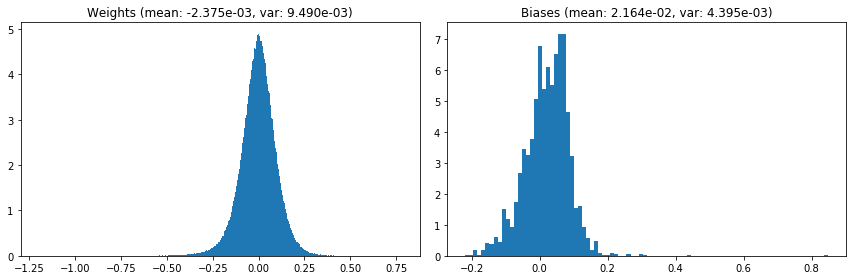

                                      Location network weights and biases


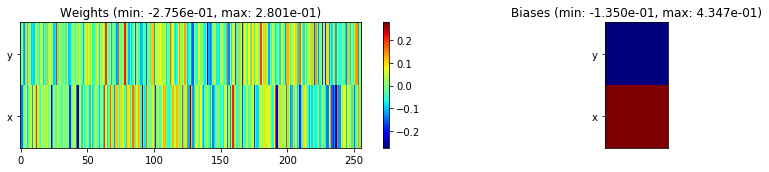

---------------------------------------------------------------------------------------------------------------
Elapsed time:  389.14 sec | TRAIN >> class loss: 0.4790 | steps:  2.520 :( | reward:  0.8365 :( | acc.: 83.648% :(
                          | VAL   >> class loss: 0.4297 | steps:  2.299 :( | reward:  0.8564 :( | acc.: 85.640% :(


Epoch  54/400) lr = 3.926e-05
 b    500/  3000 >> 127.7 ms/b | lr: 3.92e-05 | grad 2norm:  7.55 | grad inf norm:  1.864
       Weights || abs max:  1.20 (49360.91) | mean: -2.40e-03 ( 0.19) | var: 9.49e-03 (106339.28)
        Biases || abs max:  0.85 (12974.50) | mean:  2.15e-02 ( 8.16) | var: 4.39e-03 (7493783.00)
                  class loss: 0.515 | steps: 2.543 | reward:  0.827 | acc.: 82.70%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 128.6 ms/b | lr: 3.91e-05 | grad 2norm:  7.39 | grad inf norm:  1.812
       Weights || abs max:  1.20 (39963.61) | mean: -2.40e-03 ( 0.18

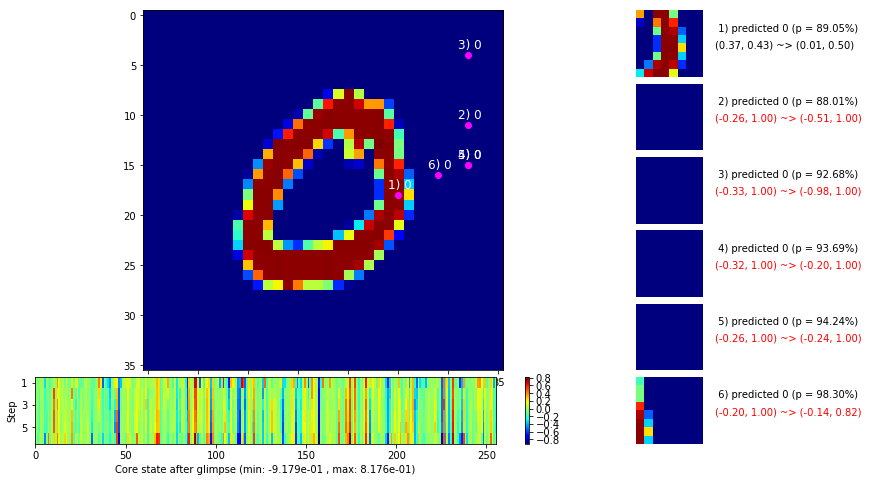

 b   1500/  3000 >> 129.9 ms/b | lr: 3.89e-05 | grad 2norm:  7.36 | grad inf norm:  1.834
       Weights || abs max:  1.20 (79628.10) | mean: -2.39e-03 ( 0.24) | var: 9.50e-03 (2518274.25)
        Biases || abs max:  0.85 (11031.64) | mean:  2.16e-02 ( 7.55) | var: 4.40e-03 (2439766.75)
                  class loss: 0.465 | steps: 2.496 | reward:  0.840 | acc.: 83.96%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 128.7 ms/b | lr: 3.88e-05 | grad 2norm:  7.33 | grad inf norm:  1.807
       Weights || abs max:  1.20 (61198.73) | mean: -2.39e-03 ( 0.22) | var: 9.51e-03 (196431.41)
        Biases || abs max:  0.85 (11508.51) | mean:  2.16e-02 ( 8.33) | var: 4.40e-03 (1435946.62)
                  class loss: 0.481 | steps: 2.480 | reward:  0.842 | acc.: 84.16%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

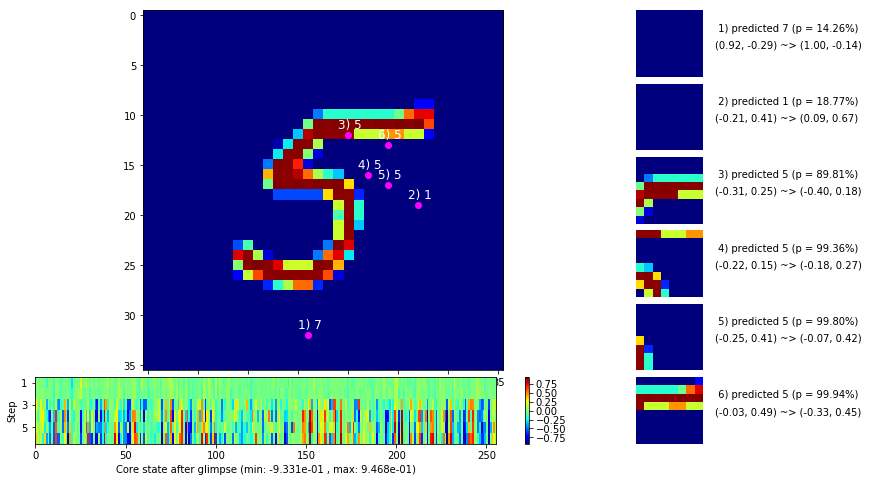

 b   2500/  3000 >> 133.0 ms/b | lr: 3.87e-05 | grad 2norm:  7.52 | grad inf norm:  1.840
       Weights || abs max:  1.21 (35544.29) | mean: -2.38e-03 ( 0.17) | var: 9.52e-03 (28262.47)
        Biases || abs max:  0.85 ( 8246.14) | mean:  2.16e-02 ( 6.45) | var: 4.41e-03 (213976.27)
                  class loss: 0.481 | steps: 2.510 | reward:  0.836 | acc.: 83.55%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 129.9 ms/b | lr: 3.86e-05 | grad 2norm:  7.47 | grad inf norm:  1.810
       Weights || abs max:  1.21 (28975.67) | mean: -2.40e-03 ( 0.15) | var: 9.52e-03 (25266.00)
        Biases || abs max:  0.85 ( 9699.02) | mean:  2.16e-02 ( 6.38) | var: 4.41e-03 (1083913.75)
                  class loss: 0.505 | steps: 2.528 | reward:  0.830 | acc.: 82.97%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

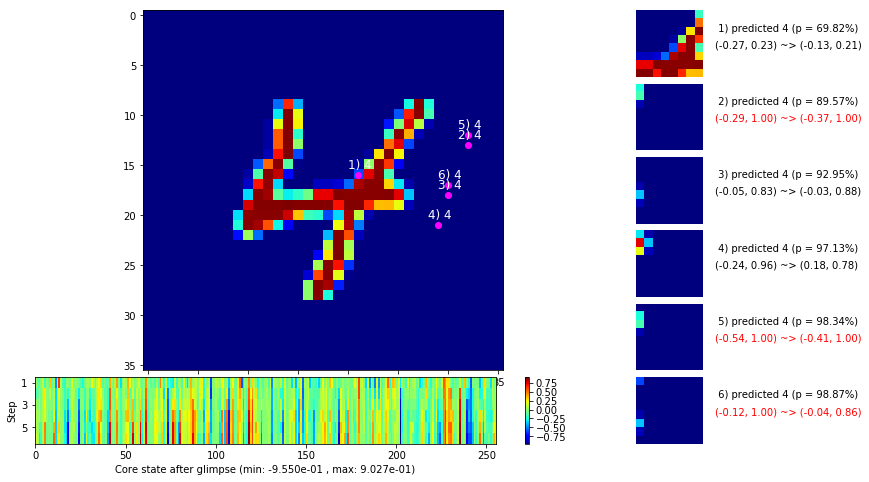

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


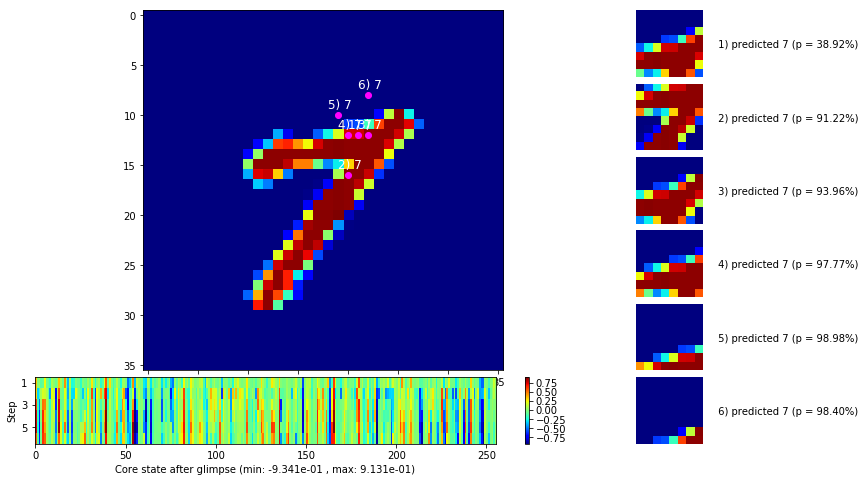


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


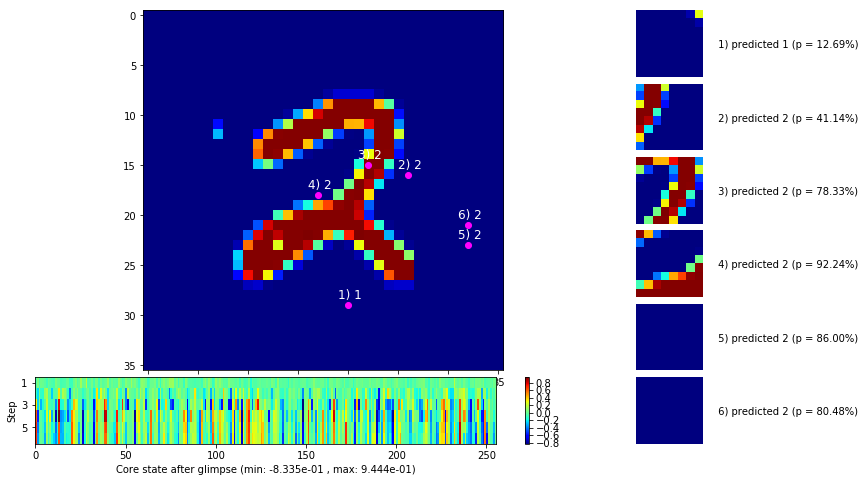

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


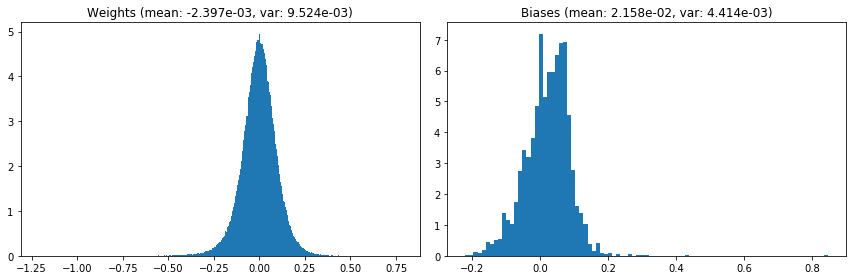

                                      Location network weights and biases


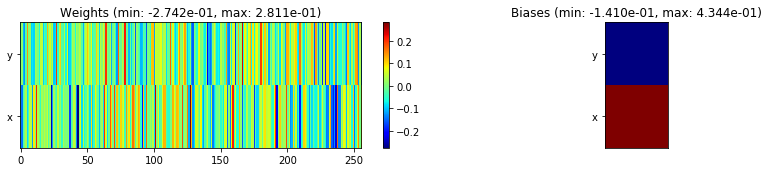

---------------------------------------------------------------------------------------------------------------
Elapsed time:  389.40 sec | TRAIN >> class loss: 0.4880 | steps:  2.510 :( | reward:  0.8348 :( | acc.: 83.483% :(
                          | VAL   >> class loss: 0.4258 | steps:  2.284 :( | reward:  0.8552 :( | acc.: 85.520% :(


Epoch  55/400) lr = 3.853e-05
 b    500/  3000 >> 128.4 ms/b | lr: 3.84e-05 | grad 2norm:  7.45 | grad inf norm:  1.893
       Weights || abs max:  1.21 (55017.80) | mean: -2.39e-03 ( 0.20) | var: 9.53e-03 (267464.38)
        Biases || abs max:  0.85 (15206.50) | mean:  2.16e-02 ( 9.34) | var: 4.41e-03 (7628476.00)
                  class loss: 0.495 | steps: 2.520 | reward:  0.826 | acc.: 82.56%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 128.4 ms/b | lr: 3.83e-05 | grad 2norm:  7.28 | grad inf norm:  1.738
       Weights || abs max:  1.21 (57812.90) | mean: -2.39e-03 ( 0.20

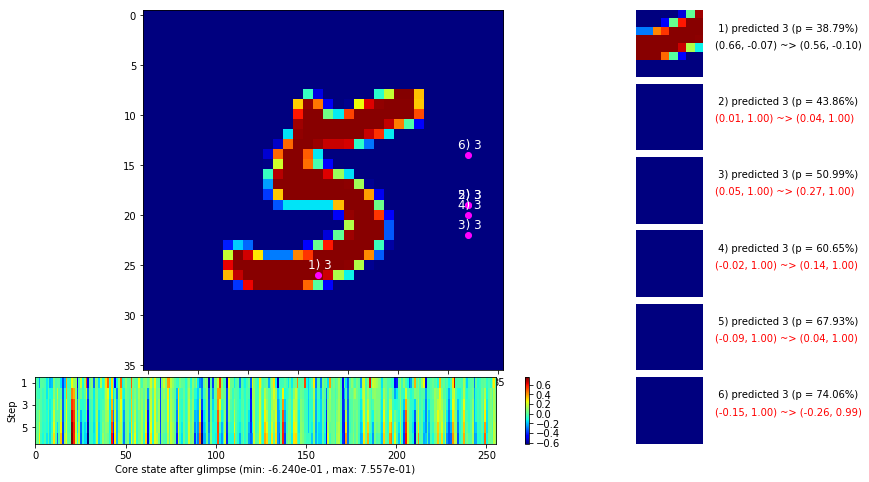

 b   1500/  3000 >> 128.2 ms/b | lr: 3.82e-05 | grad 2norm:  7.39 | grad inf norm:  1.829
       Weights || abs max:  1.21 (72384.64) | mean: -2.41e-03 ( 0.23) | var: 9.54e-03 (522480.75)
        Biases || abs max:  0.85 (10927.69) | mean:  2.15e-02 ( 7.01) | var: 4.42e-03 (953846.56)
                  class loss: 0.498 | steps: 2.506 | reward:  0.832 | acc.: 83.19%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 126.6 ms/b | lr: 3.81e-05 | grad 2norm:  7.48 | grad inf norm:  1.784
       Weights || abs max:  1.22 (35277.90) | mean: -2.40e-03 ( 0.17) | var: 9.55e-03 (38305.75)
        Biases || abs max:  0.85 (13856.67) | mean:  2.15e-02 ( 8.10) | var: 4.42e-03 (3645088.50)
                  class loss: 0.486 | steps: 2.512 | reward:  0.834 | acc.: 83.39%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

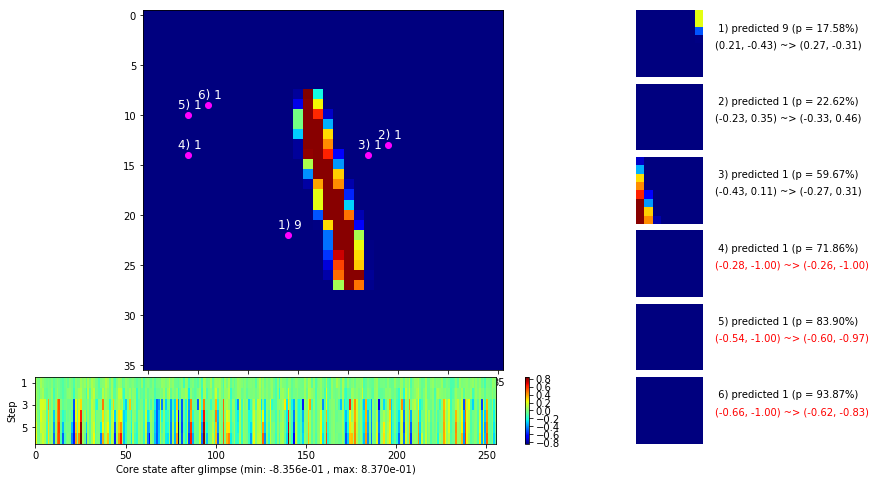

 b   2500/  3000 >> 128.9 ms/b | lr: 3.80e-05 | grad 2norm:  7.48 | grad inf norm:  1.815
       Weights || abs max:  1.22 (810474.06) | mean: -2.41e-03 ( 1.46) | var: 9.55e-03 (453441376.00)
        Biases || abs max:  0.84 (18086.17) | mean:  2.16e-02 ( 9.46) | var: 4.43e-03 (11380748.00)
                  class loss: 0.487 | steps: 2.519 | reward:  0.833 | acc.: 83.29%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 127.6 ms/b | lr: 3.79e-05 | grad 2norm:  7.40 | grad inf norm:  1.774
       Weights || abs max:  1.22 (54845.80) | mean: -2.41e-03 ( 0.21) | var: 9.56e-03 (112728.64)
        Biases || abs max:  0.84 (10468.93) | mean:  2.16e-02 ( 7.24) | var: 4.44e-03 (480123.91)
                  class loss: 0.486 | steps: 2.504 | reward:  0.833 | acc.: 83.31%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0,

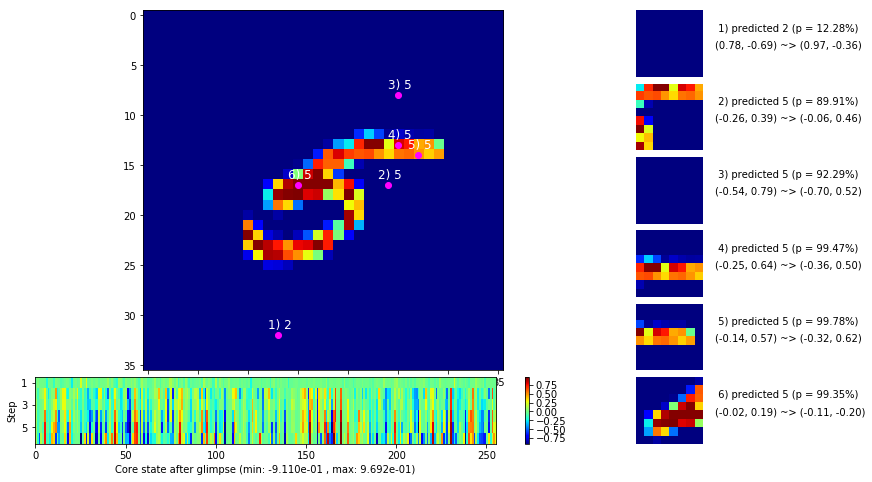

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


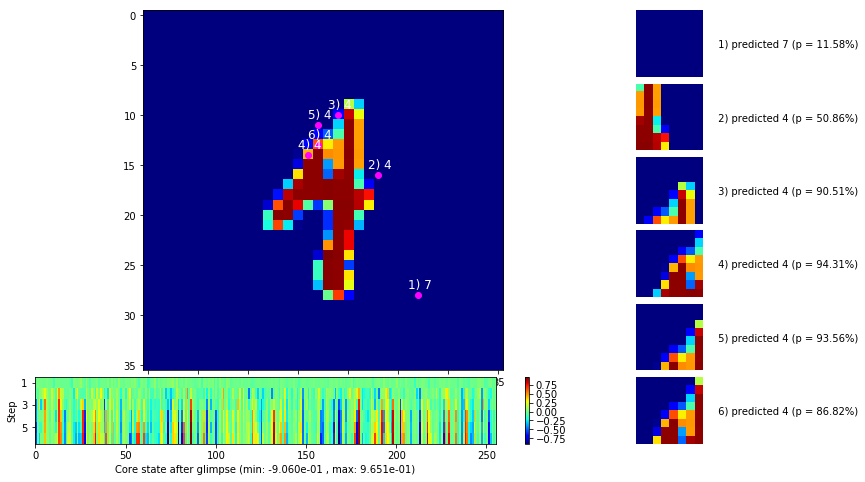


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


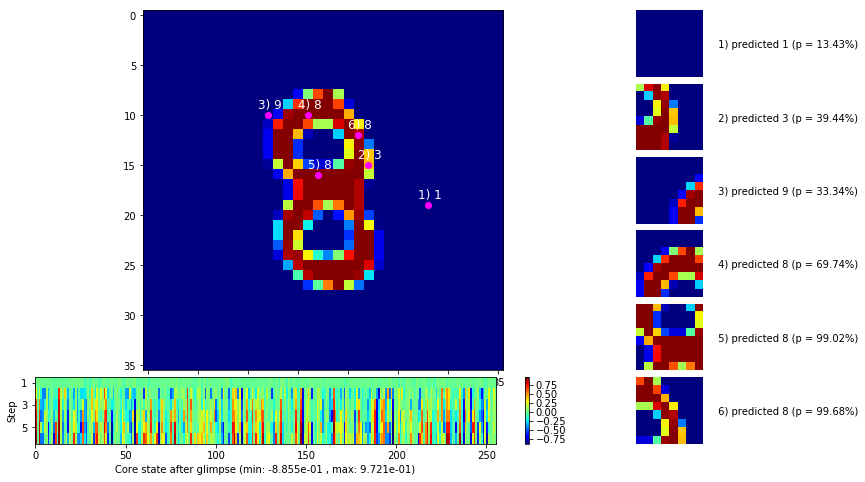

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


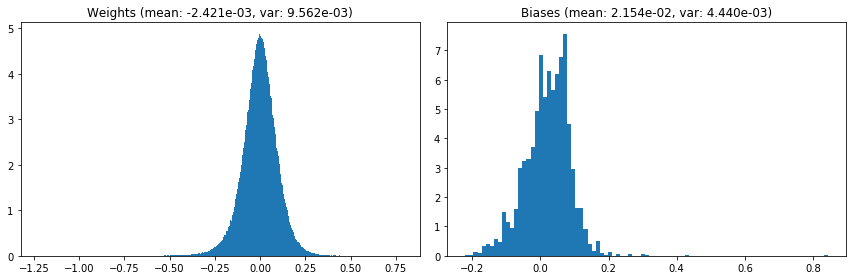

                                      Location network weights and biases


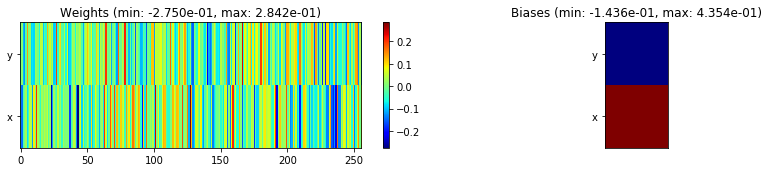

---------------------------------------------------------------------------------------------------------------
Elapsed time:  384.51 sec | TRAIN >> class loss: 0.4886 | steps:  2.510 :( | reward:  0.8324 :( | acc.: 83.243% :(
                          | VAL   >> class loss: 0.4075 | steps:  2.264    | reward:  0.8628 :( | acc.: 86.280% :(


Epoch  56/400) lr = 3.783e-05
 b    500/  3000 >> 127.6 ms/b | lr: 3.77e-05 | grad 2norm:  7.28 | grad inf norm:  1.771
       Weights || abs max:  1.22 (34201.67) | mean: -2.41e-03 ( 0.17) | var: 9.57e-03 (22702.95)
        Biases || abs max:  0.85 ( 9838.90) | mean:  2.16e-02 ( 6.69) | var: 4.45e-03 (1173827.75)
                  class loss: 0.467 | steps: 2.461 | reward:  0.841 | acc.: 84.14%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 129.1 ms/b | lr: 3.77e-05 | grad 2norm:  7.63 | grad inf norm:  1.907
       Weights || abs max:  1.23 (34002.62) | mean: -2.41e-03 ( 0.16)

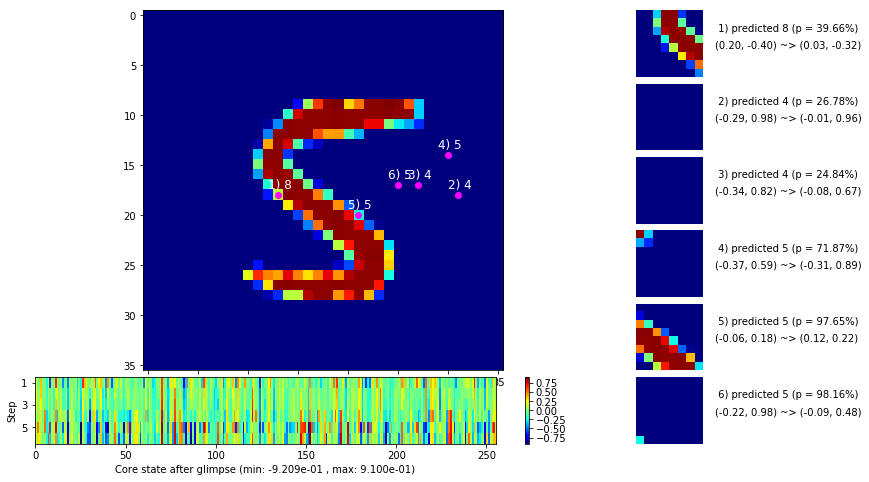

 b   1500/  3000 >> 129.8 ms/b | lr: 3.75e-05 | grad 2norm:  7.43 | grad inf norm:  1.818
       Weights || abs max:  1.23 (36421.15) | mean: -2.41e-03 ( 0.16) | var: 9.58e-03 (110555.23)
        Biases || abs max:  0.85 ( 7015.11) | mean:  2.16e-02 ( 5.46) | var: 4.45e-03 (153047.19)
                  class loss: 0.475 | steps: 2.494 | reward:  0.837 | acc.: 83.69%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 127.7 ms/b | lr: 3.74e-05 | grad 2norm:  7.39 | grad inf norm:  1.779
       Weights || abs max:  1.23 (36409.38) | mean: -2.41e-03 ( 0.17) | var: 9.58e-03 (38904.80)
        Biases || abs max:  0.84 (10099.73) | mean:  2.16e-02 ( 6.73) | var: 4.45e-03 (551335.19)
                  class loss: 0.485 | steps: 2.492 | reward:  0.834 | acc.: 83.39%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0

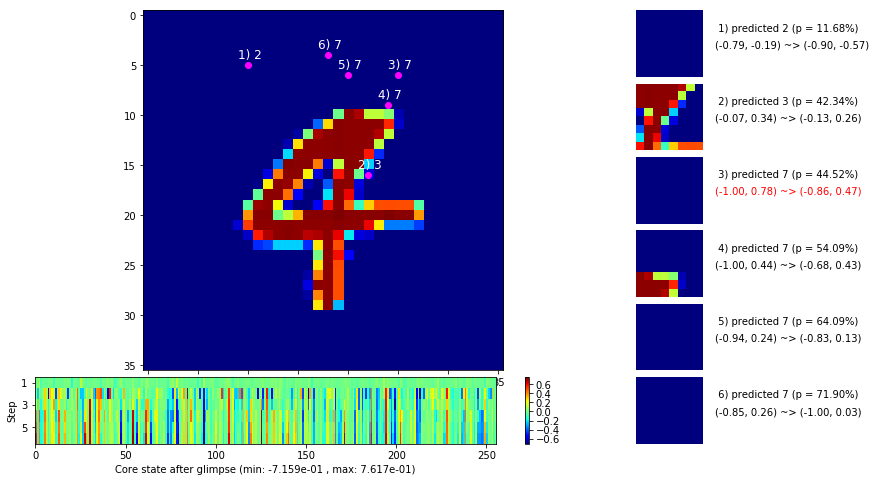

 b   2500/  3000 >> 128.8 ms/b | lr: 3.73e-05 | grad 2norm:  7.44 | grad inf norm:  1.818
       Weights || abs max:  1.23 (134033.23) | mean: -2.40e-03 ( 0.33) | var: 9.59e-03 (7711788.50)
        Biases || abs max:  0.84 (12409.38) | mean:  2.16e-02 ( 7.94) | var: 4.45e-03 (1675913.38)
                  class loss: 0.488 | steps: 2.495 | reward:  0.835 | acc.: 83.45%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 127.4 ms/b | lr: 3.72e-05 | grad 2norm:  7.47 | grad inf norm:  1.812
       Weights || abs max:  1.24 (35573.93) | mean: -2.41e-03 ( 0.17) | var: 9.59e-03 (20753.92)
        Biases || abs max:  0.84 (10718.30) | mean:  2.15e-02 ( 7.26) | var: 4.45e-03 (3735923.00)
                  class loss: 0.502 | steps: 2.542 | reward:  0.831 | acc.: 83.13%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

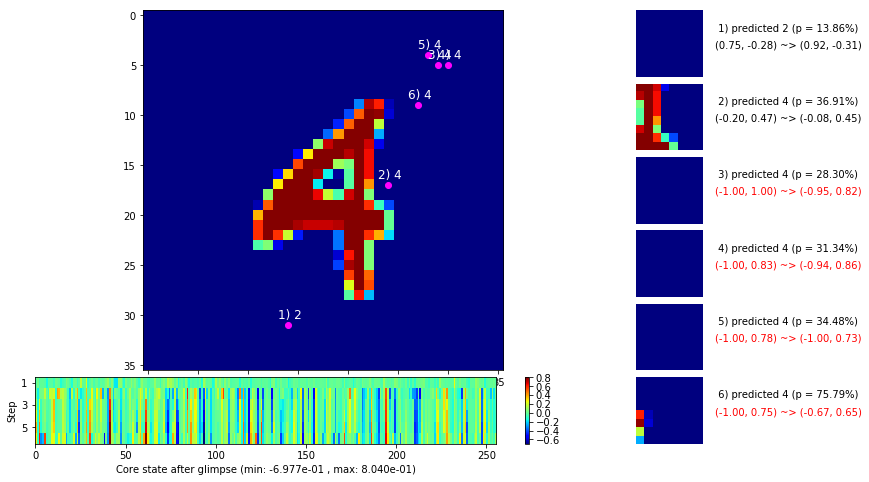

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


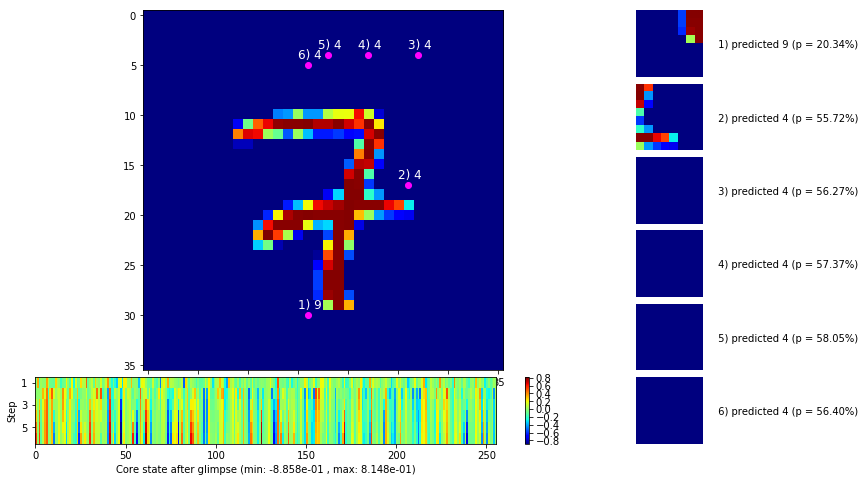


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


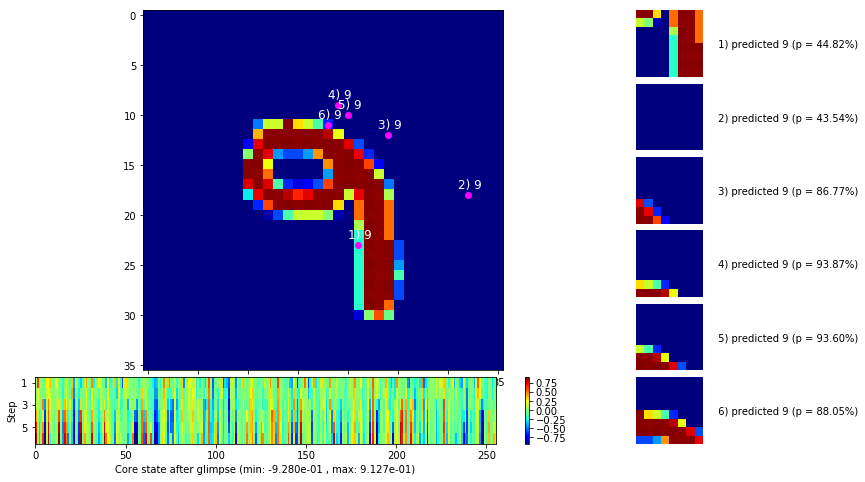

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


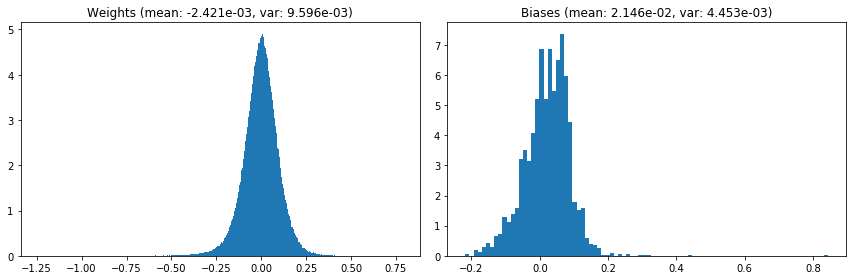

                                      Location network weights and biases


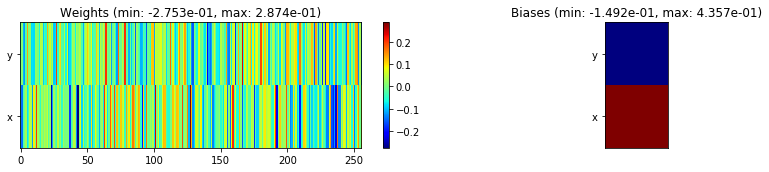

---------------------------------------------------------------------------------------------------------------
Elapsed time:  385.86 sec | TRAIN >> class loss: 0.4846 | steps:  2.500 :( | reward:  0.8346 :( | acc.: 83.460% :(
                          | VAL   >> class loss: 0.4309 | steps:  2.288 :( | reward:  0.8530 :( | acc.: 85.300% :(


Epoch  57/400) lr = 3.716e-05
 b    500/  3000 >> 127.8 ms/b | lr: 3.71e-05 | grad 2norm:  7.55 | grad inf norm:  1.871
       Weights || abs max:  1.24 (27699.41) | mean: -2.42e-03 ( 0.15) | var: 9.60e-03 (13484.23)
        Biases || abs max:  0.84 (19511.43) | mean:  2.15e-02 (11.49) | var: 4.46e-03 (4031764.50)
                  class loss: 0.486 | steps: 2.522 | reward:  0.832 | acc.: 83.19%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 127.1 ms/b | lr: 3.70e-05 | grad 2norm:  7.35 | grad inf norm:  1.842
       Weights || abs max:  1.24 (33879.83) | mean: -2.42e-03 ( 0.16)

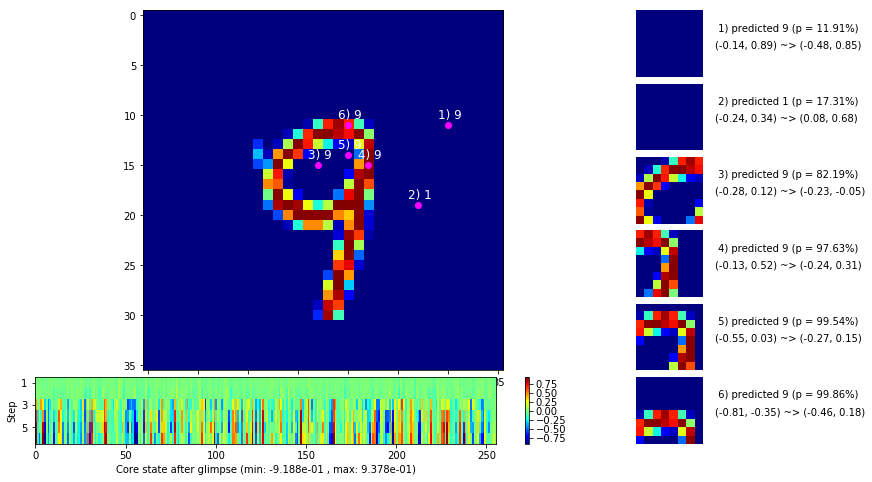

 b   1500/  3000 >> 129.0 ms/b | lr: 3.69e-05 | grad 2norm:  7.63 | grad inf norm:  1.867
       Weights || abs max:  1.24 (41597.20) | mean: -2.42e-03 ( 0.18) | var: 9.61e-03 (138804.75)
        Biases || abs max:  0.84 (12288.33) | mean:  2.16e-02 ( 8.06) | var: 4.46e-03 (2099410.75)
                  class loss: 0.500 | steps: 2.530 | reward:  0.827 | acc.: 82.74%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 127.7 ms/b | lr: 3.68e-05 | grad 2norm:  7.65 | grad inf norm:  1.899
       Weights || abs max:  1.24 (76233.28) | mean: -2.43e-03 ( 0.23) | var: 9.62e-03 (1105764.25)
        Biases || abs max:  0.84 (38517.56) | mean:  2.15e-02 (18.52) | var: 4.47e-03 (71335544.00)
                  class loss: 0.499 | steps: 2.523 | reward:  0.827 | acc.: 82.66%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0

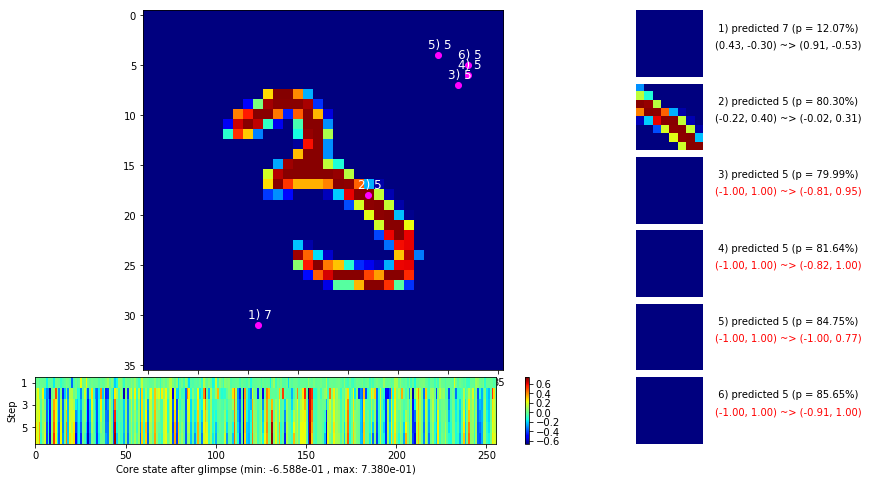

 b   2500/  3000 >> 128.7 ms/b | lr: 3.66e-05 | grad 2norm:  7.36 | grad inf norm:  1.804
       Weights || abs max:  1.24 (98952.09) | mean: -2.42e-03 ( 0.27) | var: 9.62e-03 (4215422.00)
        Biases || abs max:  0.84 (23644.65) | mean:  2.16e-02 (12.21) | var: 4.48e-03 (22918886.00)
                  class loss: 0.475 | steps: 2.484 | reward:  0.838 | acc.: 83.75%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 131.1 ms/b | lr: 3.65e-05 | grad 2norm:  7.47 | grad inf norm:  1.780
       Weights || abs max:  1.25 (96442.27) | mean: -2.41e-03 ( 0.27) | var: 9.63e-03 (3350786.00)
        Biases || abs max:  0.84 (495193.12) | mean:  2.16e-02 (195.62) | var: 4.48e-03 (45259124736.00)
                  class loss: 0.489 | steps: 2.527 | reward:  0.833 | acc.: 83.31%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0,

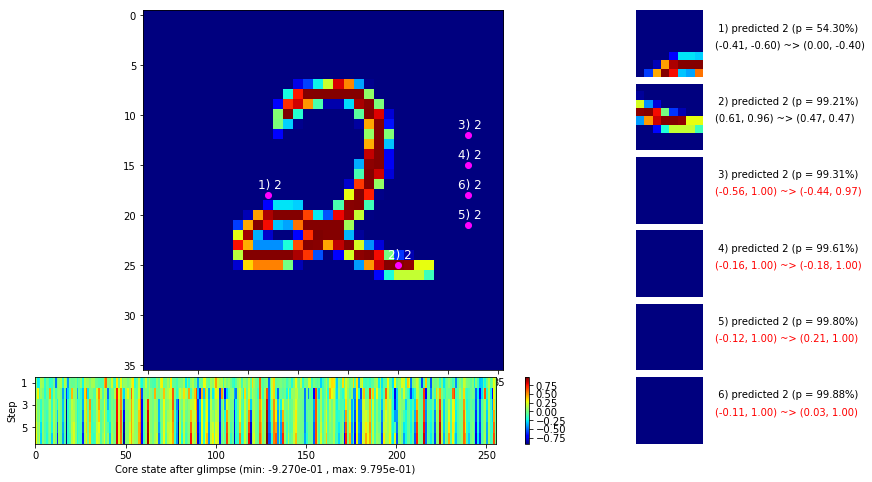

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


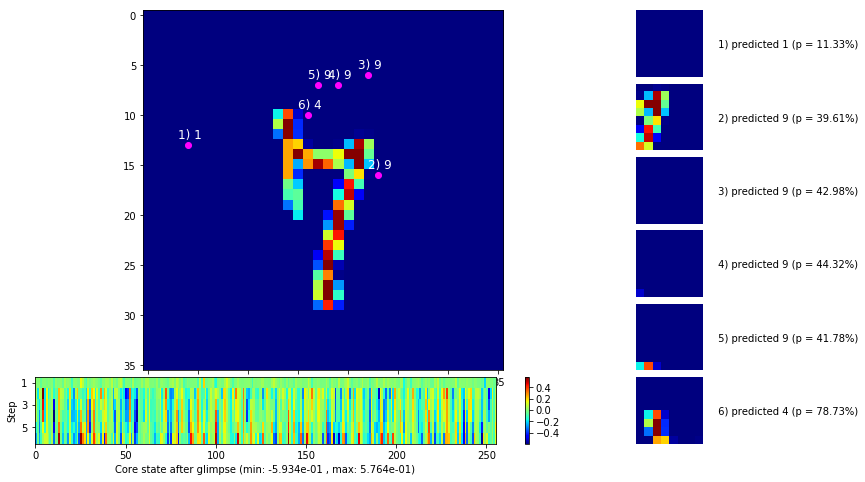


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


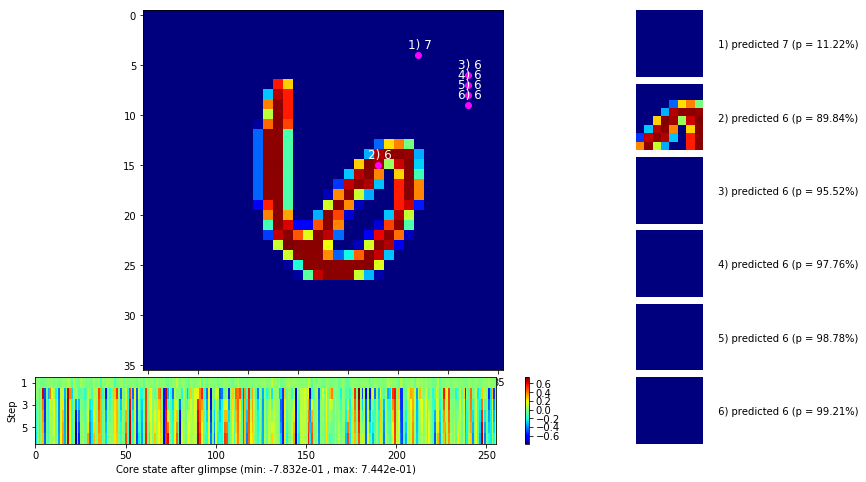

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


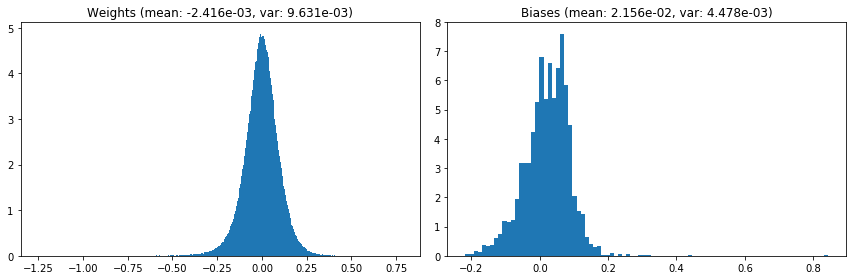

                                      Location network weights and biases


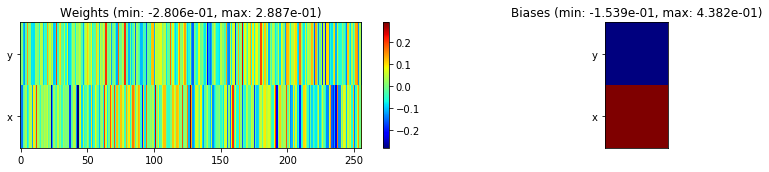

---------------------------------------------------------------------------------------------------------------
Elapsed time:  386.18 sec | TRAIN >> class loss: 0.4877 | steps:  2.511 :( | reward:  0.8328 :( | acc.: 83.283% :(
                          | VAL   >> class loss: 0.4205 | steps:  2.286 :( | reward:  0.8548 :( | acc.: 85.480% :(


Epoch  58/400) lr = 3.651e-05
 b    500/  3000 >> 130.8 ms/b | lr: 3.64e-05 | grad 2norm:  7.55 | grad inf norm:  1.856
       Weights || abs max:  1.25 (44084.70) | mean: -2.42e-03 ( 0.18) | var: 9.63e-03 (229342.42)
        Biases || abs max:  0.84 (16627.07) | mean:  2.16e-02 ( 9.26) | var: 4.48e-03 (12975342.00)
                  class loss: 0.491 | steps: 2.508 | reward:  0.831 | acc.: 83.08%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 126.8 ms/b | lr: 3.63e-05 | grad 2norm:  7.45 | grad inf norm:  1.828
       Weights || abs max:  1.25 (27076.76) | mean: -2.42e-03 ( 0.1

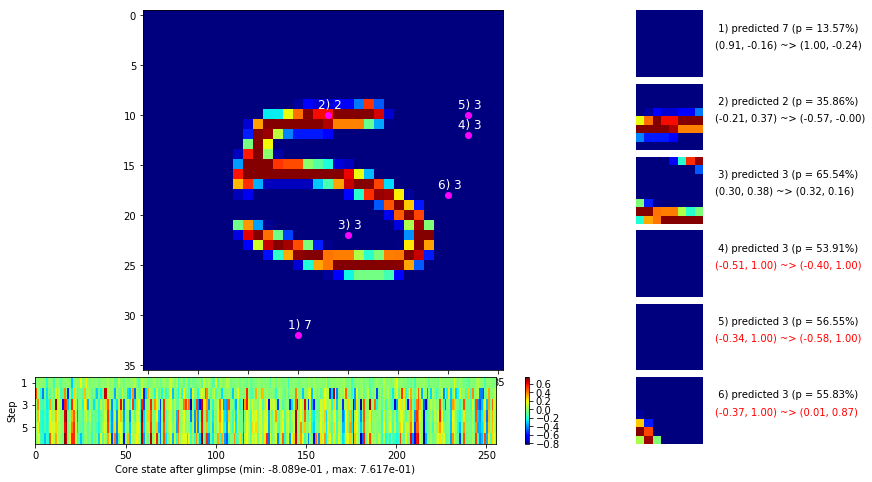

 b   1500/  3000 >> 128.5 ms/b | lr: 3.62e-05 | grad 2norm:  7.51 | grad inf norm:  1.903
       Weights || abs max:  1.25 (1766893.62) | mean: -2.41e-03 ( 3.04) | var: 9.65e-03 (2486361856.00)
        Biases || abs max:  0.84 ( 9385.97) | mean:  2.16e-02 ( 6.78) | var: 4.49e-03 (629967.19)
                  class loss: 0.494 | steps: 2.508 | reward:  0.831 | acc.: 83.08%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 127.0 ms/b | lr: 3.61e-05 | grad 2norm:  7.42 | grad inf norm:  1.823
       Weights || abs max:  1.25 (55291.71) | mean: -2.40e-03 ( 0.20) | var: 9.65e-03 (233929.14)
        Biases || abs max:  0.84 ( 8795.44) | mean:  2.16e-02 ( 6.50) | var: 4.49e-03 (342261.16)
                  class loss: 0.496 | steps: 2.506 | reward:  0.833 | acc.: 83.29%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0,

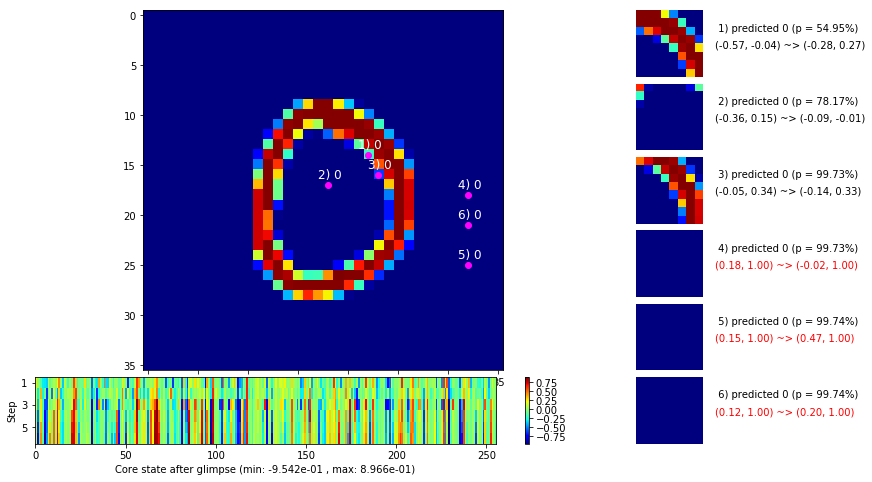

 b   2500/  3000 >> 127.5 ms/b | lr: 3.60e-05 | grad 2norm:  7.56 | grad inf norm:  1.887
       Weights || abs max:  1.26 (43224.47) | mean: -2.39e-03 ( 0.18) | var: 9.66e-03 (112742.87)
        Biases || abs max:  0.84 (10096.46) | mean:  2.16e-02 ( 7.12) | var: 4.49e-03 (1253795.88)
                  class loss: 0.489 | steps: 2.526 | reward:  0.834 | acc.: 83.44%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 127.7 ms/b | lr: 3.59e-05 | grad 2norm:  7.46 | grad inf norm:  1.836
       Weights || abs max:  1.26 (448253.09) | mean: -2.40e-03 ( 0.86) | var: 9.66e-03 (143489440.00)
        Biases || abs max:  0.84 ( 5444.26) | mean:  2.16e-02 ( 4.38) | var: 4.50e-03 (224347.16)
                  class loss: 0.489 | steps: 2.519 | reward:  0.830 | acc.: 83.00%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 

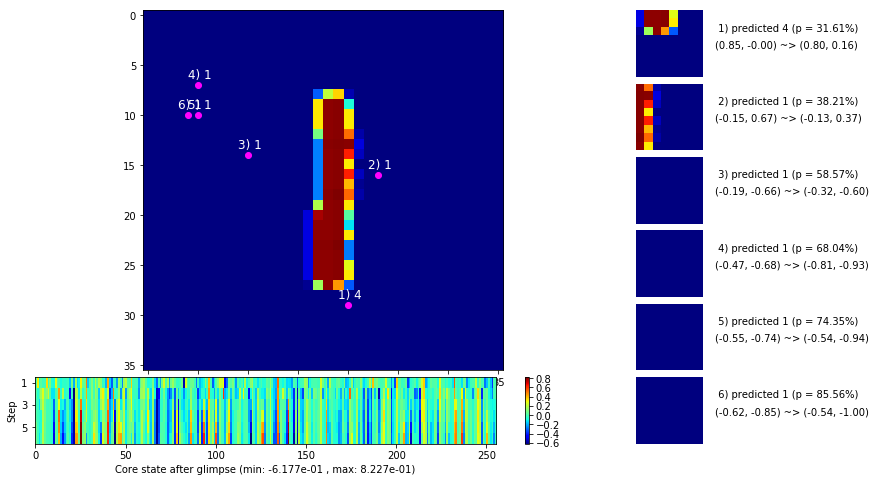

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


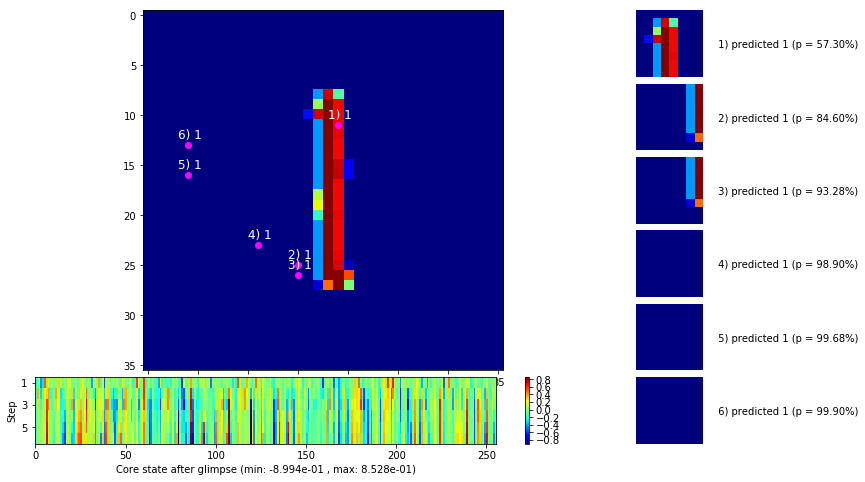


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


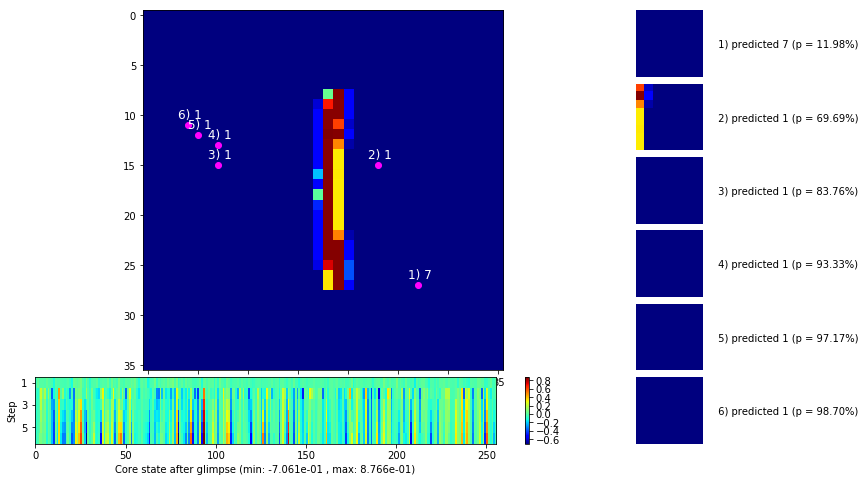

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


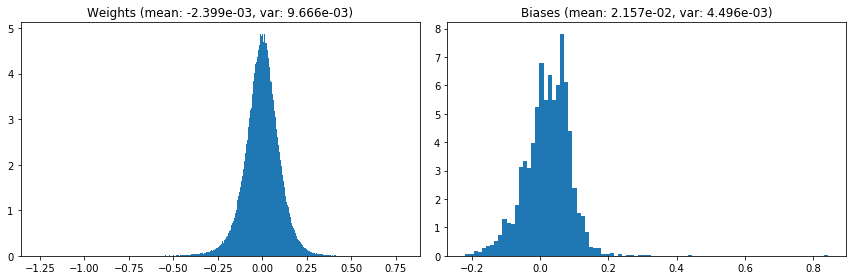

                                      Location network weights and biases


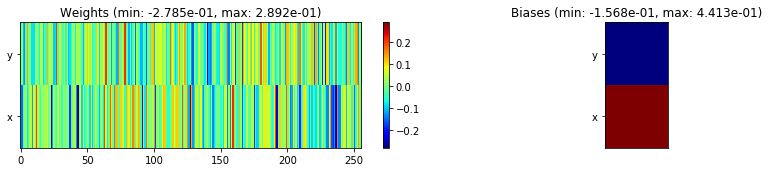

---------------------------------------------------------------------------------------------------------------
Elapsed time:  384.64 sec | TRAIN >> class loss: 0.4909 | steps:  2.512 :( | reward:  0.8326 :( | acc.: 83.260% :(
                          | VAL   >> class loss: 0.4371 | steps:  2.317 :( | reward:  0.8520 :( | acc.: 85.200% :(


Epoch  59/400) lr = 3.588e-05
 b    500/  3000 >> 126.9 ms/b | lr: 3.58e-05 | grad 2norm:  7.30 | grad inf norm:  1.830
       Weights || abs max:  1.26 (50650.65) | mean: -2.39e-03 ( 0.19) | var: 9.67e-03 (171193.22)
        Biases || abs max:  0.84 ( 4870.80) | mean:  2.16e-02 ( 4.17) | var: 4.50e-03 (220281.23)
                  class loss: 0.476 | steps: 2.498 | reward:  0.838 | acc.: 83.80%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 127.0 ms/b | lr: 3.57e-05 | grad 2norm:  7.37 | grad inf norm:  1.772
       Weights || abs max:  1.26 (29796.83) | mean: -2.39e-03 ( 0.16)

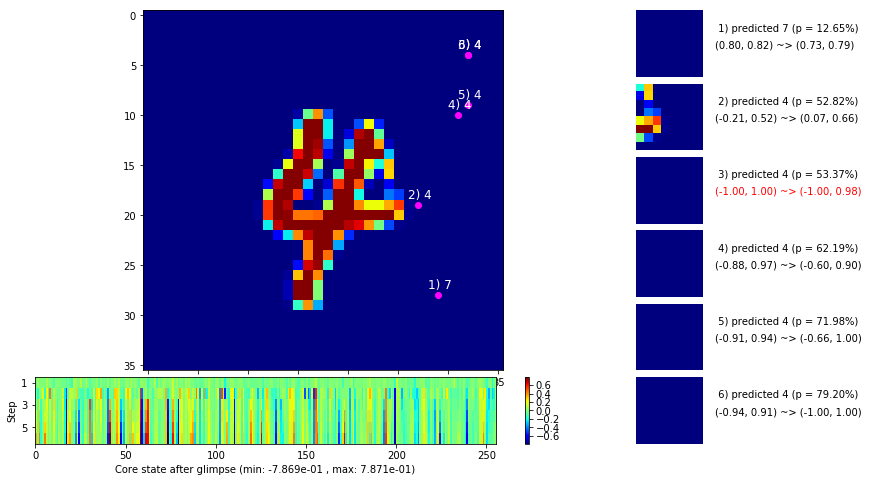

 b   1500/  3000 >> 131.5 ms/b | lr: 3.56e-05 | grad 2norm:  7.47 | grad inf norm:  1.814
       Weights || abs max:  1.26 (305223.28) | mean: -2.38e-03 ( 0.62) | var: 9.68e-03 (57514596.00)
        Biases || abs max:  0.84 (13637.19) | mean:  2.16e-02 ( 8.54) | var: 4.51e-03 (3532687.50)
                  class loss: 0.488 | steps: 2.448 | reward:  0.835 | acc.: 83.54%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 126.4 ms/b | lr: 3.55e-05 | grad 2norm:  7.46 | grad inf norm:  1.768
       Weights || abs max:  1.26 (310032.91) | mean: -2.36e-03 ( 0.63) | var: 9.69e-03 (63141584.00)
        Biases || abs max:  0.84 ( 7844.27) | mean:  2.17e-02 ( 5.72) | var: 4.51e-03 (216416.55)
                  class loss: 0.496 | steps: 2.529 | reward:  0.830 | acc.: 83.03%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0

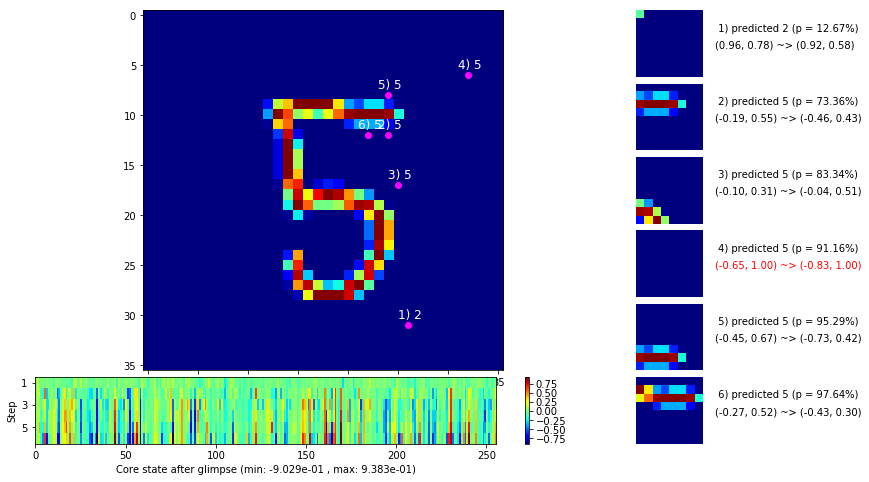

 b   2500/  3000 >> 127.8 ms/b | lr: 3.54e-05 | grad 2norm:  7.58 | grad inf norm:  1.896
       Weights || abs max:  1.26 (54690.79) | mean: -2.37e-03 ( 0.20) | var: 9.69e-03 (148301.06)
        Biases || abs max:  0.84 (12606.85) | mean:  2.17e-02 ( 7.82) | var: 4.52e-03 (3622453.25)
                  class loss: 0.500 | steps: 2.521 | reward:  0.829 | acc.: 82.93%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 127.3 ms/b | lr: 3.53e-05 | grad 2norm:  7.61 | grad inf norm:  1.808
       Weights || abs max:  1.26 (32767.44) | mean: -2.39e-03 ( 0.17) | var: 9.70e-03 (25378.09)
        Biases || abs max:  0.84 (12242.57) | mean:  2.16e-02 ( 7.73) | var: 4.52e-03 (1460788.88)
                  class loss: 0.504 | steps: 2.531 | reward:  0.828 | acc.: 82.79%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

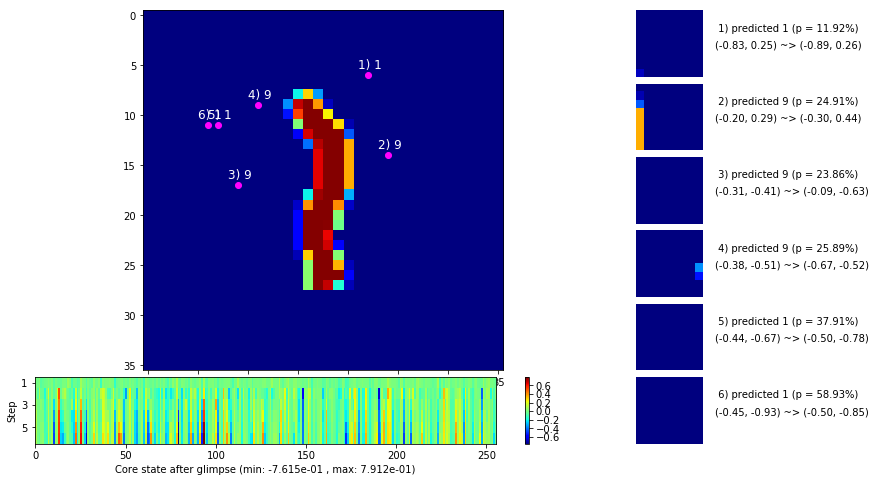

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


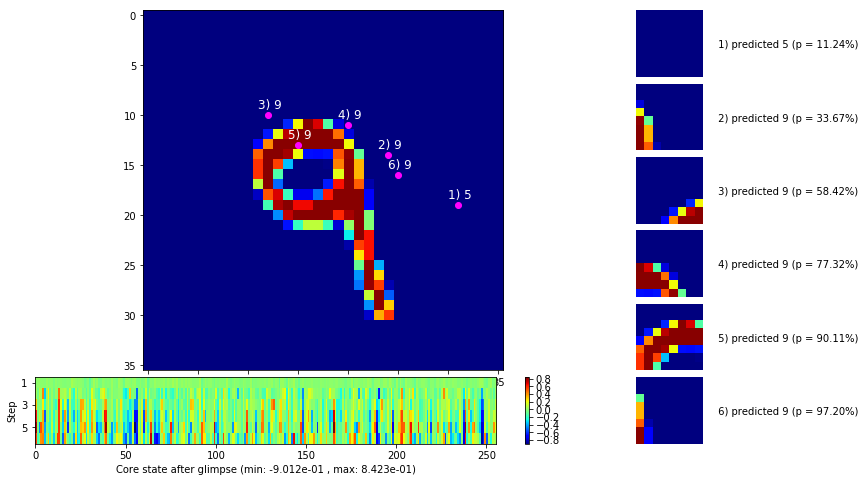


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


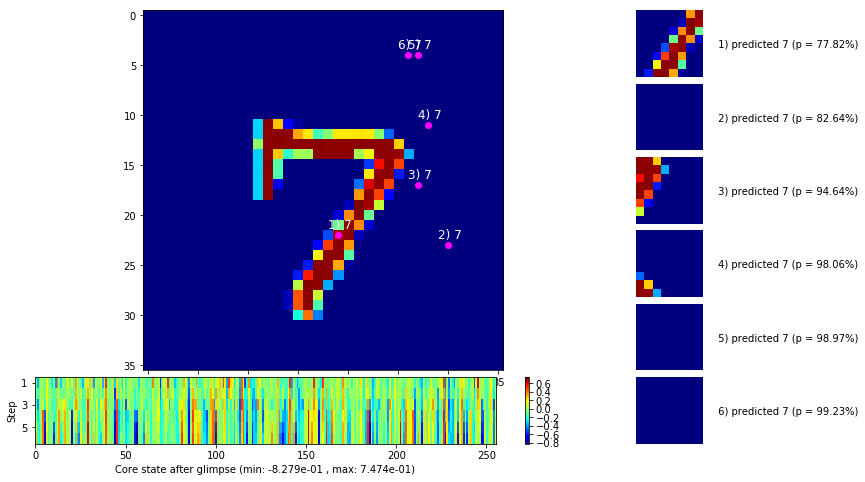

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


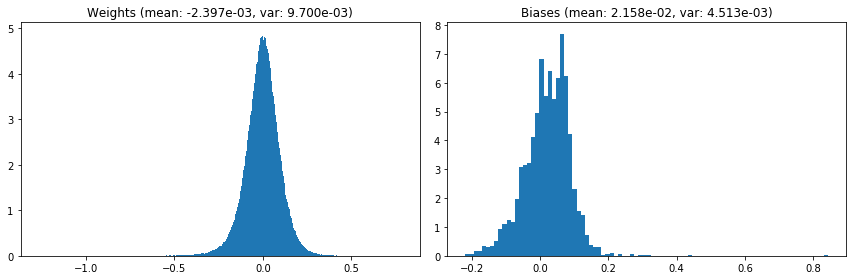

                                      Location network weights and biases


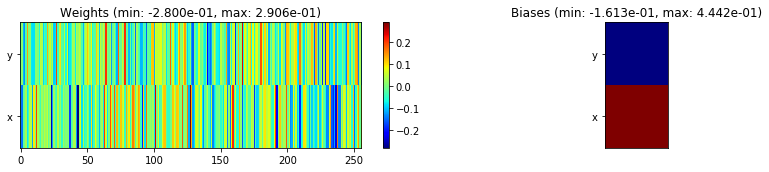

---------------------------------------------------------------------------------------------------------------
Elapsed time:  384.11 sec | TRAIN >> class loss: 0.4926 | steps:  2.507 :( | reward:  0.8319 :( | acc.: 83.188% :(
                          | VAL   >> class loss: 0.4108 | steps:  2.284 :( | reward:  0.8634 :( | acc.: 86.340% :(


Epoch  60/400) lr = 3.527e-05
 b    500/  3000 >> 127.2 ms/b | lr: 3.52e-05 | grad 2norm:  7.49 | grad inf norm:  1.765
       Weights || abs max:  1.27 (40433.79) | mean: -2.40e-03 ( 0.17) | var: 9.70e-03 (41870.40)
        Biases || abs max:  0.84 (19468.69) | mean:  2.16e-02 (11.64) | var: 4.52e-03 (10714019.00)
                  class loss: 0.491 | steps: 2.481 | reward:  0.834 | acc.: 83.37%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 127.9 ms/b | lr: 3.51e-05 | grad 2norm:  7.52 | grad inf norm:  1.778
       Weights || abs max:  1.27 (276404.56) | mean: -2.39e-03 ( 0.5

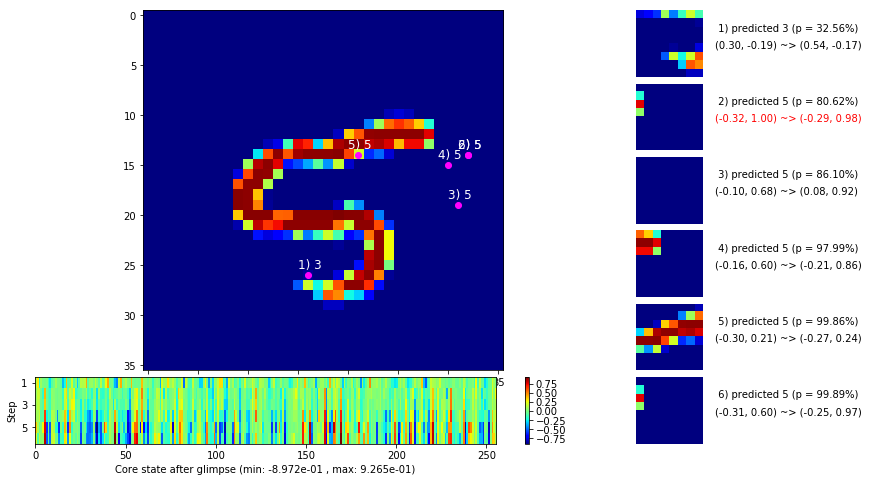

 b   1500/  3000 >> 128.5 ms/b | lr: 3.50e-05 | grad 2norm:  7.36 | grad inf norm:  1.742
       Weights || abs max:  1.27 (70327.37) | mean: -2.40e-03 ( 0.22) | var: 9.71e-03 (658122.50)
        Biases || abs max:  0.84 ( 6431.70) | mean:  2.16e-02 ( 5.21) | var: 4.53e-03 (154191.05)
                  class loss: 0.486 | steps: 2.502 | reward:  0.836 | acc.: 83.55%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 127.8 ms/b | lr: 3.49e-05 | grad 2norm:  7.63 | grad inf norm:  1.923
       Weights || abs max:  1.27 (39402.20) | mean: -2.40e-03 ( 0.18) | var: 9.72e-03 (43992.64)
        Biases || abs max:  0.84 (11237.54) | mean:  2.16e-02 ( 8.32) | var: 4.53e-03 (4396771.50)
                  class loss: 0.515 | steps: 2.541 | reward:  0.824 | acc.: 82.36%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 

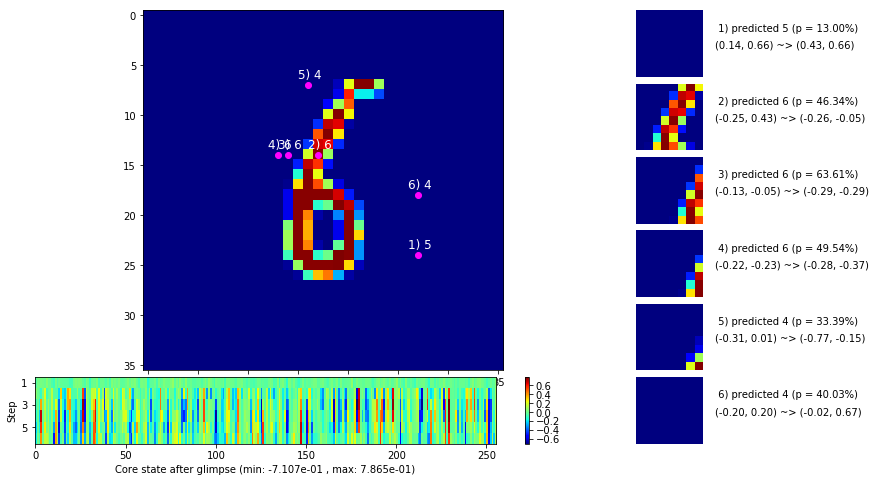

 b   2500/  3000 >> 128.9 ms/b | lr: 3.48e-05 | grad 2norm:  7.41 | grad inf norm:  1.761
       Weights || abs max:  1.27 (42263.06) | mean: -2.42e-03 ( 0.18) | var: 9.72e-03 (139349.00)
        Biases || abs max:  0.84 (96692.50) | mean:  2.16e-02 (40.55) | var: 4.53e-03 (1393484032.00)
                  class loss: 0.510 | steps: 2.522 | reward:  0.829 | acc.: 82.94%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 130.5 ms/b | lr: 3.47e-05 | grad 2norm:  7.56 | grad inf norm:  1.937
       Weights || abs max:  1.28 (154990.69) | mean: -2.41e-03 ( 0.38) | var: 9.73e-03 (7063139.00)
        Biases || abs max:  0.84 ( 9767.72) | mean:  2.15e-02 ( 7.35) | var: 4.53e-03 (1835666.50)
                  class loss: 0.509 | steps: 2.537 | reward:  0.824 | acc.: 82.40%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0

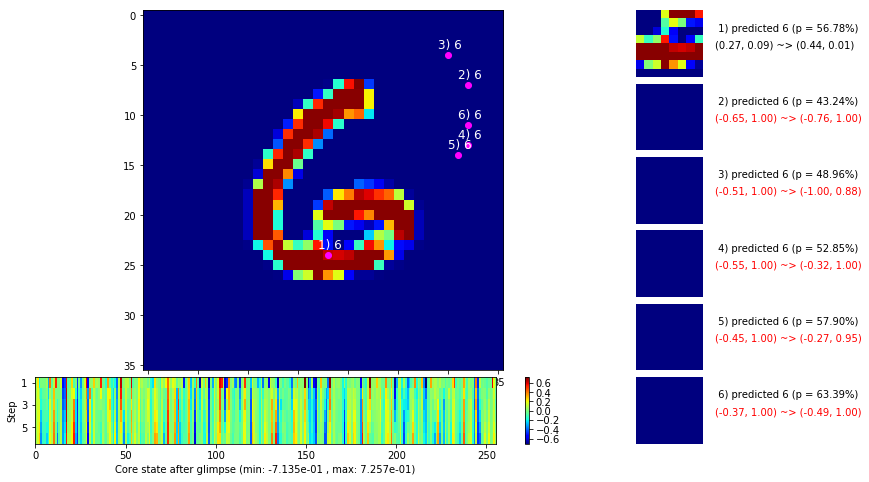

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


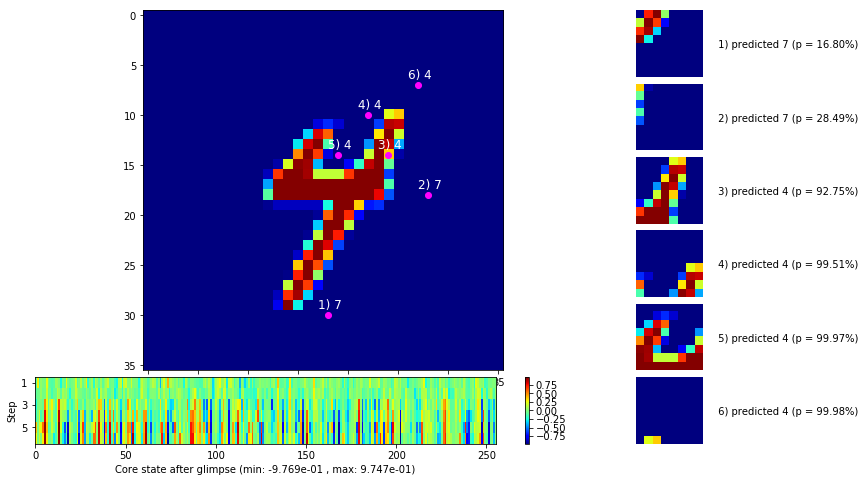


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


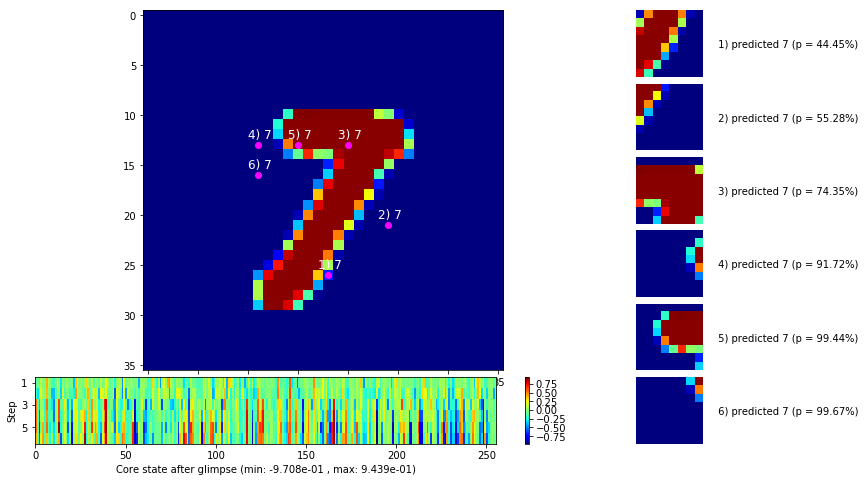

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


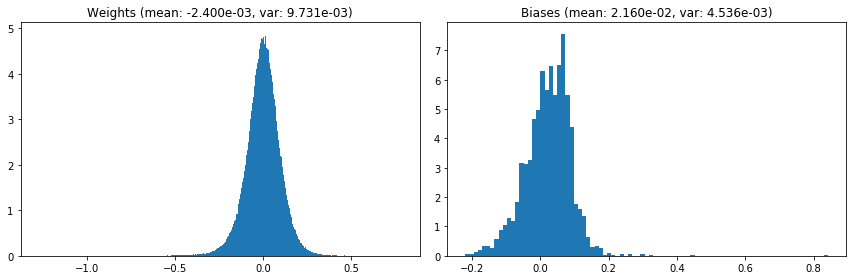

                                      Location network weights and biases


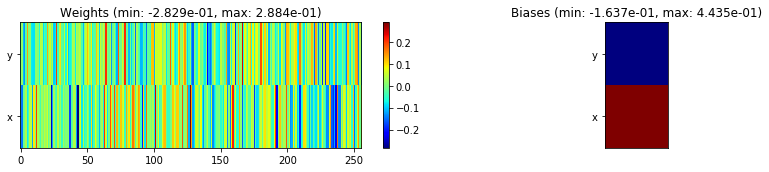

---------------------------------------------------------------------------------------------------------------
Elapsed time:  385.89 sec | TRAIN >> class loss: 0.5027 | steps:  2.518 :( | reward:  0.8294 :( | acc.: 82.940% :(
                          | VAL   >> class loss: 0.4181 | steps:  2.286 :( | reward:  0.8600 :( | acc.: 86.000% :(


Epoch  61/400) lr = 3.468e-05
 b    500/  3000 >> 127.5 ms/b | lr: 3.46e-05 | grad 2norm:  7.36 | grad inf norm:  1.763
       Weights || abs max:  1.28 (626470.50) | mean: -2.40e-03 ( 1.16) | var: 9.73e-03 (273154976.00)
        Biases || abs max:  0.84 (22393.40) | mean:  2.16e-02 (15.29) | var: 4.53e-03 (28696616.00)
                  class loss: 0.489 | steps: 2.486 | reward:  0.831 | acc.: 83.07%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 126.6 ms/b | lr: 3.45e-05 | grad 2norm:  7.42 | grad inf norm:  1.794
       Weights || abs max:  1.28 (44017.21) | mean: -2.40e-03 (

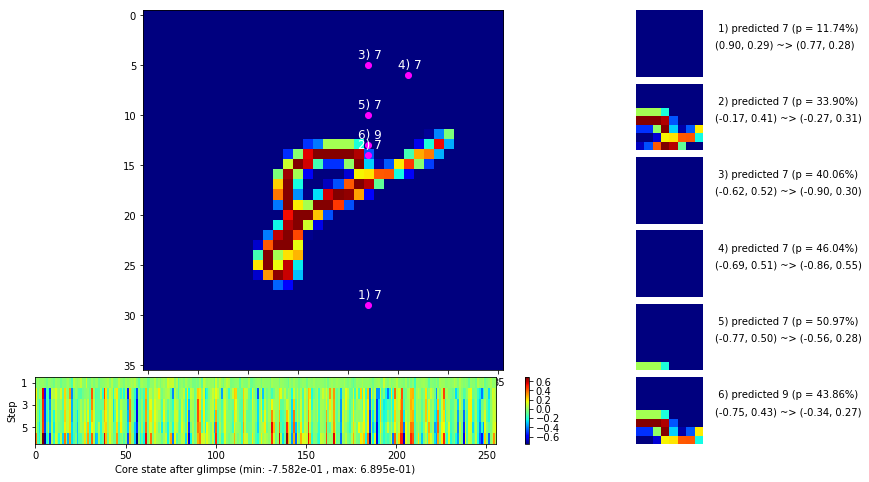

 b   1500/  3000 >> 128.9 ms/b | lr: 3.44e-05 | grad 2norm:  7.51 | grad inf norm:  1.800
       Weights || abs max:  1.28 (87046.34) | mean: -2.41e-03 ( 0.26) | var: 9.74e-03 (829999.81)
        Biases || abs max:  0.84 ( 4074.69) | mean:  2.15e-02 ( 3.69) | var: 4.55e-03 (75164.60)
                  class loss: 0.519 | steps: 2.533 | reward:  0.824 | acc.: 82.43%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 128.0 ms/b | lr: 3.43e-05 | grad 2norm:  7.42 | grad inf norm:  1.756
       Weights || abs max:  1.28 (31068.58) | mean: -2.40e-03 ( 0.16) | var: 9.75e-03 (26265.18)
        Biases || abs max:  0.84 (10466.66) | mean:  2.16e-02 ( 6.70) | var: 4.55e-03 (1305671.75)
                  class loss: 0.495 | steps: 2.517 | reward:  0.828 | acc.: 82.83%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

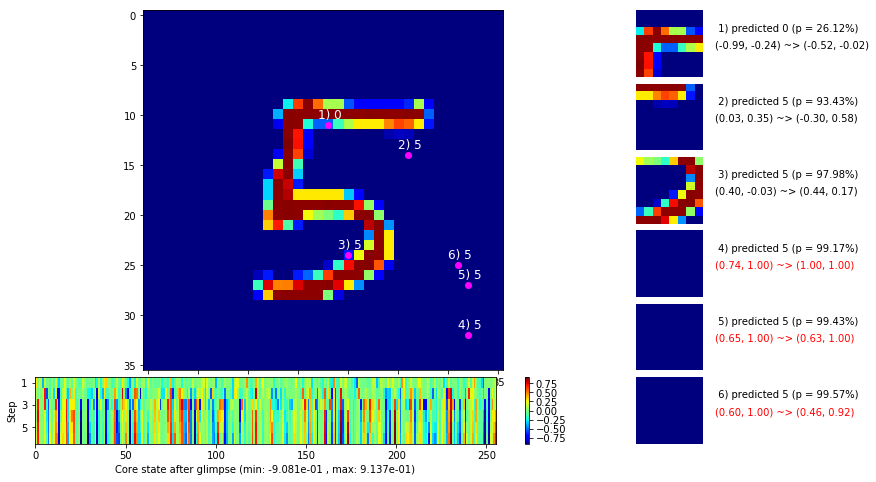

 b   2500/  3000 >> 129.2 ms/b | lr: 3.42e-05 | grad 2norm:  7.48 | grad inf norm:  1.863
       Weights || abs max:  1.28 (50408.24) | mean: -2.40e-03 ( 0.19) | var: 9.75e-03 (280958.28)
        Biases || abs max:  0.84 ( 7160.13) | mean:  2.16e-02 ( 5.97) | var: 4.55e-03 (429631.75)
                  class loss: 0.506 | steps: 2.532 | reward:  0.829 | acc.: 82.89%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 127.9 ms/b | lr: 3.42e-05 | grad 2norm:  7.36 | grad inf norm:  1.800
       Weights || abs max:  1.29 (134742.78) | mean: -2.40e-03 ( 0.33) | var: 9.76e-03 (2728227.00)
        Biases || abs max:  0.84 ( 7450.41) | mean:  2.16e-02 ( 5.33) | var: 4.56e-03 (424907.12)
                  class loss: 0.492 | steps: 2.497 | reward:  0.834 | acc.: 83.43%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

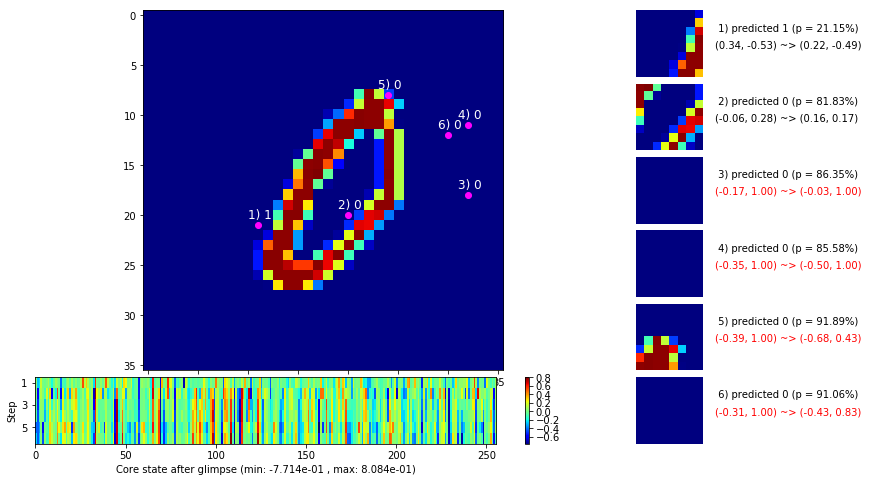

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


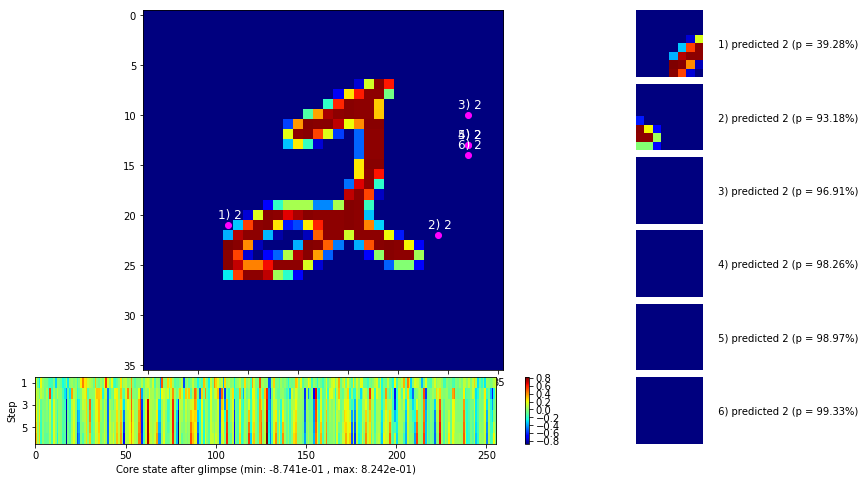


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


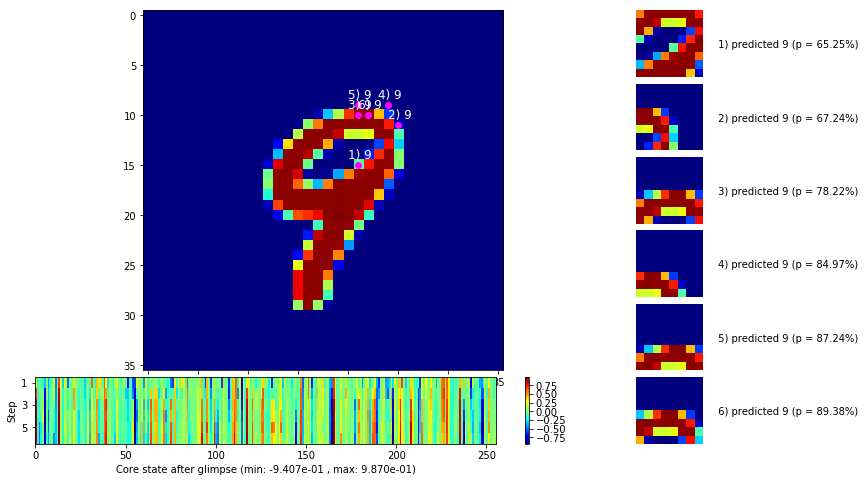

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


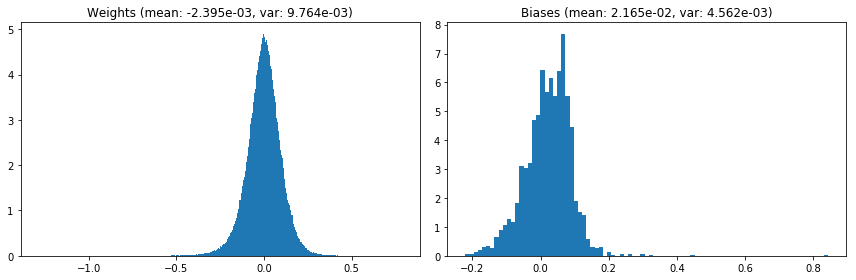

                                      Location network weights and biases


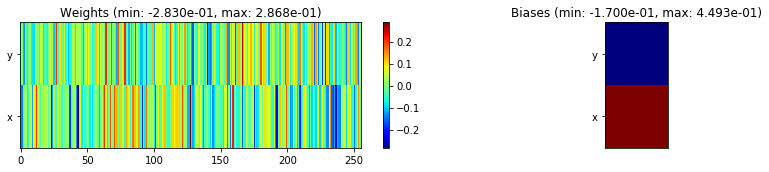

---------------------------------------------------------------------------------------------------------------
Elapsed time:  384.56 sec | TRAIN >> class loss: 0.5019 | steps:  2.511 :( | reward:  0.8294 :( | acc.: 82.940% :(
                          | VAL   >> class loss: 0.4491 | steps:  2.283 :( | reward:  0.8462 :( | acc.: 84.620% :(


Epoch  62/400) lr = 3.412e-05
 b    500/  3000 >> 128.8 ms/b | lr: 3.40e-05 | grad 2norm:  7.53 | grad inf norm:  1.859
       Weights || abs max:  1.29 (38354.36) | mean: -2.39e-03 ( 0.17) | var: 9.77e-03 (90240.18)
        Biases || abs max:  0.84 ( 5658.92) | mean:  2.17e-02 ( 4.82) | var: 4.56e-03 (197624.02)
                  class loss: 0.509 | steps: 2.530 | reward:  0.826 | acc.: 82.58%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 128.7 ms/b | lr: 3.40e-05 | grad 2norm:  7.39 | grad inf norm:  1.756
       Weights || abs max:  1.29 (32805.35) | mean: -2.39e-03 ( 0.16) 

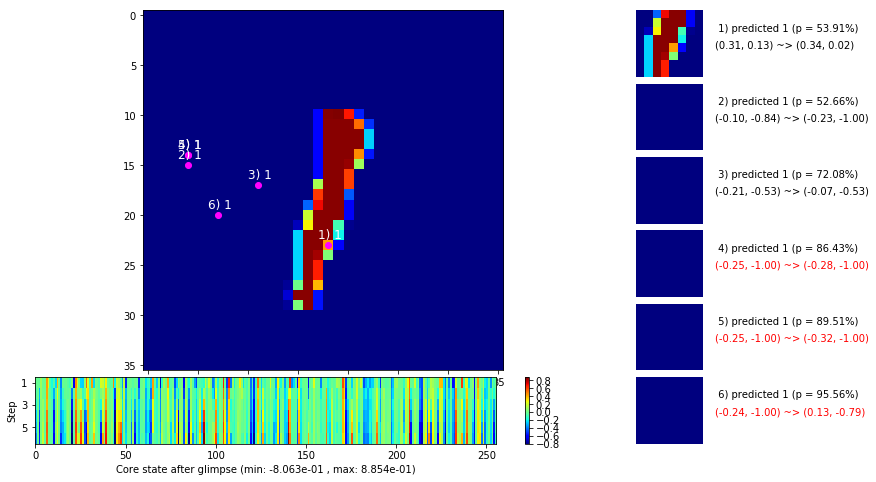

 b   1500/  3000 >> 132.0 ms/b | lr: 3.39e-05 | grad 2norm:  7.41 | grad inf norm:  1.804
       Weights || abs max:  1.29 (34046.91) | mean: -2.40e-03 ( 0.16) | var: 9.78e-03 (41774.59)
        Biases || abs max:  0.84 ( 9829.08) | mean:  2.16e-02 ( 7.00) | var: 4.56e-03 (1025692.75)
                  class loss: 0.507 | steps: 2.526 | reward:  0.828 | acc.: 82.82%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 128.3 ms/b | lr: 3.38e-05 | grad 2norm:  7.58 | grad inf norm:  1.912
       Weights || abs max:  1.29 (106305.24) | mean: -2.40e-03 ( 0.29) | var: 9.78e-03 (1873521.00)
        Biases || abs max:  0.84 ( 6258.32) | mean:  2.16e-02 ( 5.50) | var: 4.57e-03 (263469.62)
                  class loss: 0.506 | steps: 2.515 | reward:  0.821 | acc.: 82.12%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

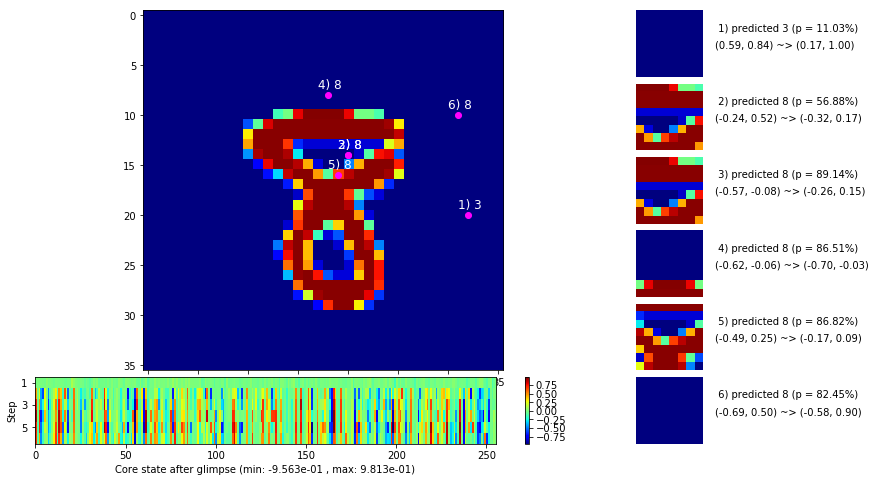

 b   2500/  3000 >> 128.6 ms/b | lr: 3.37e-05 | grad 2norm:  7.46 | grad inf norm:  1.849
       Weights || abs max:  1.29 (217882.03) | mean: -2.39e-03 ( 0.48) | var: 9.79e-03 (5914130.00)
        Biases || abs max:  0.84 (15492.09) | mean:  2.16e-02 ( 9.53) | var: 4.57e-03 (11722135.00)
                  class loss: 0.502 | steps: 2.505 | reward:  0.833 | acc.: 83.27%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 127.7 ms/b | lr: 3.36e-05 | grad 2norm:  7.70 | grad inf norm:  1.897
       Weights || abs max:  1.29 (20859.24) | mean: -2.40e-03 ( 0.14) | var: 9.79e-03 ( 3788.16)
        Biases || abs max:  0.84 (10313.28) | mean:  2.16e-02 ( 6.95) | var: 4.57e-03 (851664.19)
                  class loss: 0.531 | steps: 2.568 | reward:  0.816 | acc.: 81.57%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

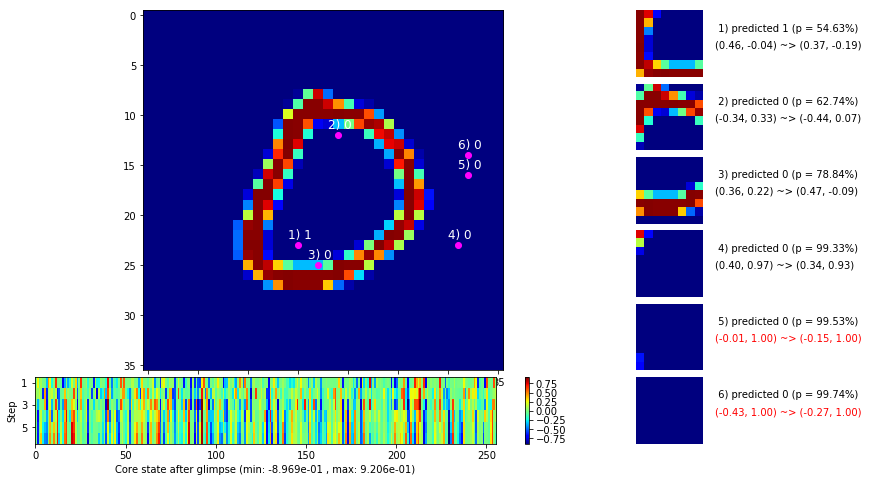

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


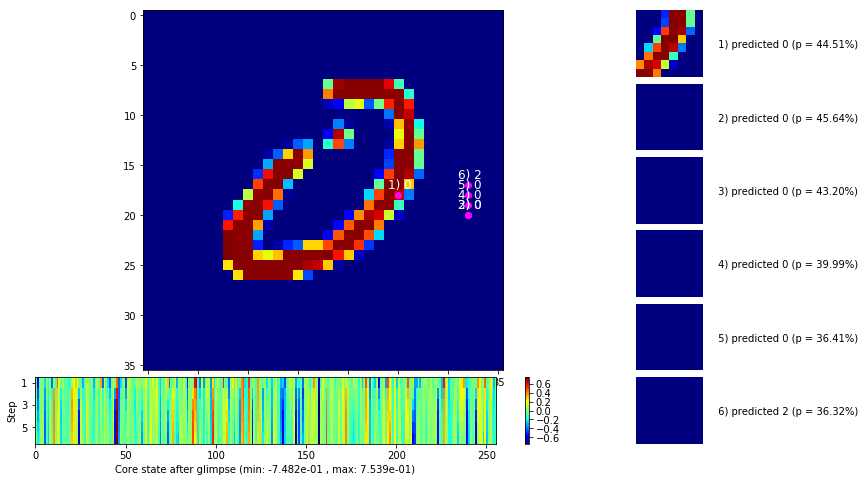


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


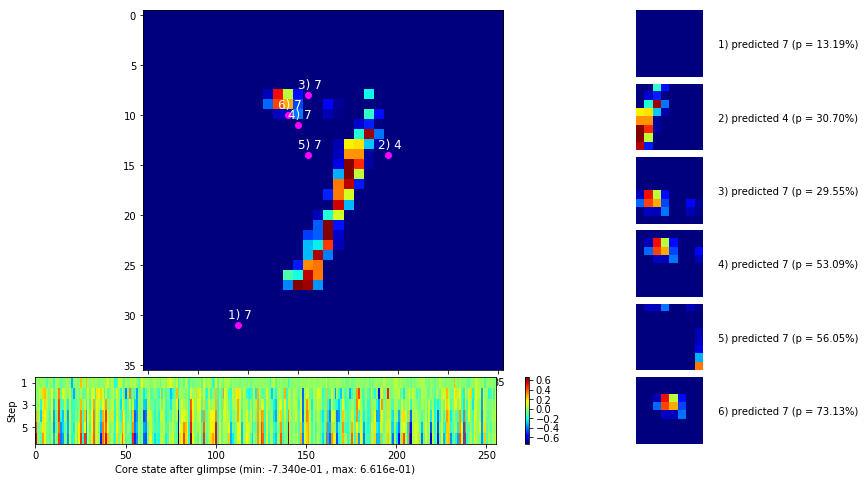

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


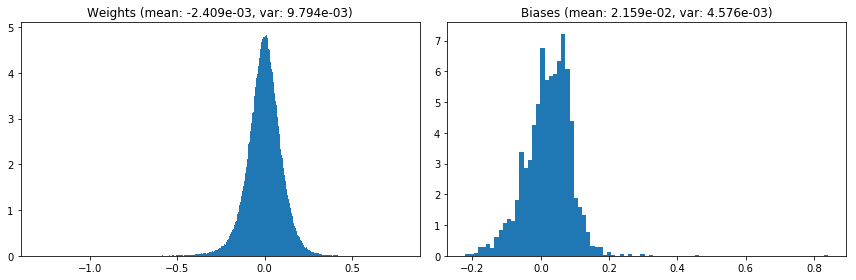

                                      Location network weights and biases


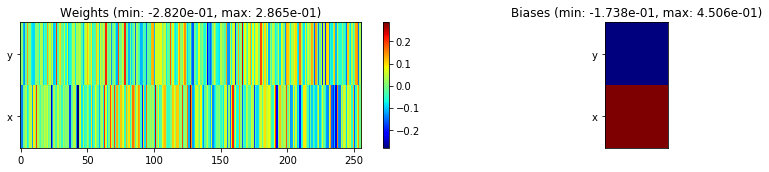

---------------------------------------------------------------------------------------------------------------
Elapsed time:  387.65 sec | TRAIN >> class loss: 0.5094 | steps:  2.527 :( | reward:  0.8260 :( | acc.: 82.602% :(
                          | VAL   >> class loss: 0.4445 | steps:  2.307 :( | reward:  0.8538 :( | acc.: 85.380% :(


Epoch  63/400) lr = 3.357e-05
 b    500/  3000 >> 126.8 ms/b | lr: 3.35e-05 | grad 2norm:  7.59 | grad inf norm:  1.891
       Weights || abs max:  1.29 (173218.44) | mean: -2.40e-03 ( 0.39) | var: 9.80e-03 (10934544.00)
        Biases || abs max:  0.84 (10453.92) | mean:  2.16e-02 ( 7.47) | var: 4.58e-03 (998863.69)
                  class loss: 0.519 | steps: 2.524 | reward:  0.823 | acc.: 82.29%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 126.9 ms/b | lr: 3.34e-05 | grad 2norm:  7.48 | grad inf norm:  1.833
       Weights || abs max:  1.29 (56728.68) | mean: -2.40e-03 ( 0.

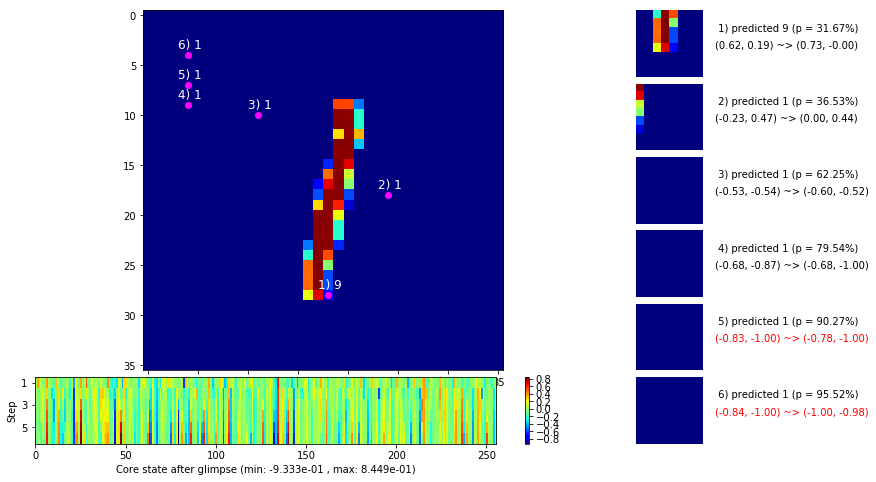

 b   1500/  3000 >> 128.3 ms/b | lr: 3.33e-05 | grad 2norm:  7.66 | grad inf norm:  1.914
       Weights || abs max:  1.30 (33204.82) | mean: -2.39e-03 ( 0.16) | var: 9.81e-03 (24768.88)
        Biases || abs max:  0.84 ( 7640.66) | mean:  2.17e-02 ( 6.05) | var: 4.59e-03 (735837.38)
                  class loss: 0.516 | steps: 2.520 | reward:  0.820 | acc.: 82.00%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 127.2 ms/b | lr: 3.32e-05 | grad 2norm:  7.54 | grad inf norm:  1.845
       Weights || abs max:  1.30 (30834.37) | mean: -2.39e-03 ( 0.16) | var: 9.81e-03 (24533.22)
        Biases || abs max:  0.84 (10939.99) | mean:  2.16e-02 ( 7.27) | var: 4.59e-03 (1530401.25)
                  class loss: 0.513 | steps: 2.550 | reward:  0.820 | acc.: 82.01%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

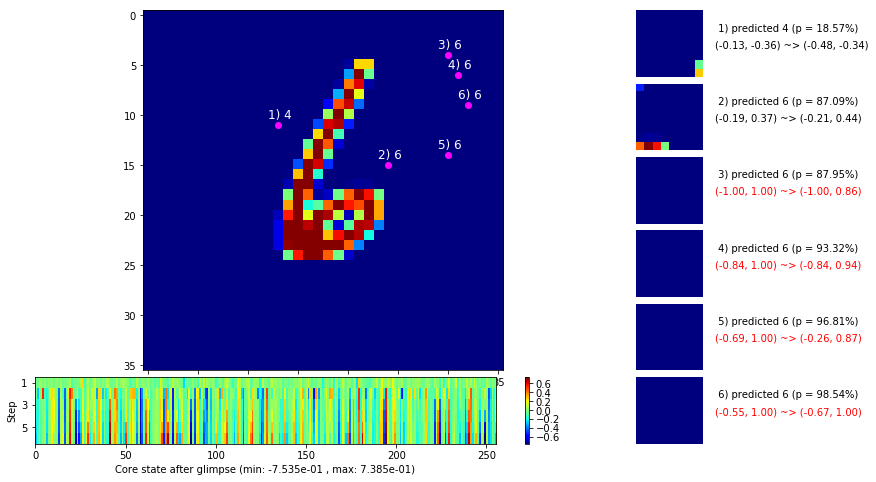

 b   2500/  3000 >> 128.3 ms/b | lr: 3.31e-05 | grad 2norm:  7.61 | grad inf norm:  1.903
       Weights || abs max:  1.30 (49923.58) | mean: -2.39e-03 ( 0.19) | var: 9.82e-03 (252430.97)
        Biases || abs max:  0.84 (14424.49) | mean:  2.16e-02 ( 9.18) | var: 4.59e-03 (2870798.25)
                  class loss: 0.523 | steps: 2.567 | reward:  0.817 | acc.: 81.69%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.9 ms/b | lr: 3.31e-05 | grad 2norm:  7.52 | grad inf norm:  1.879
       Weights || abs max:  1.30 (48919.25) | mean: -2.40e-03 ( 0.19) | var: 9.82e-03 (185737.17)
        Biases || abs max:  0.84 ( 8335.03) | mean:  2.16e-02 ( 5.94) | var: 4.59e-03 (444670.06)
                  class loss: 0.522 | steps: 2.528 | reward:  0.822 | acc.: 82.21%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0,

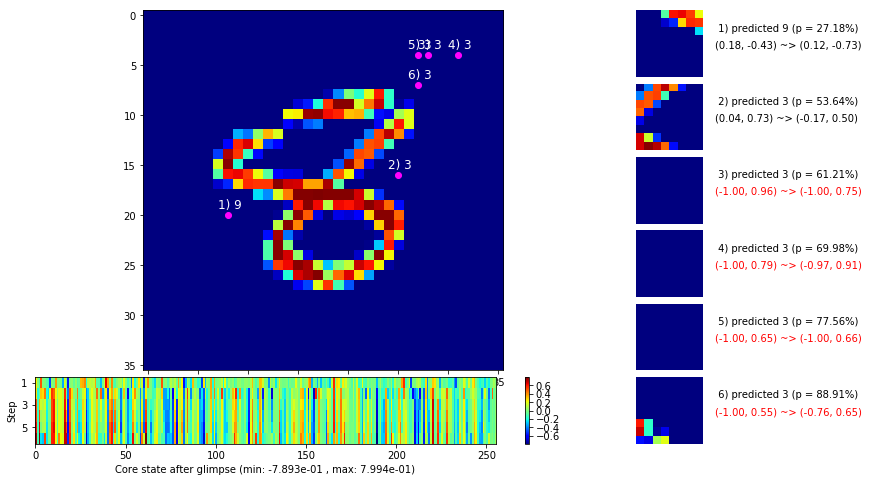

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


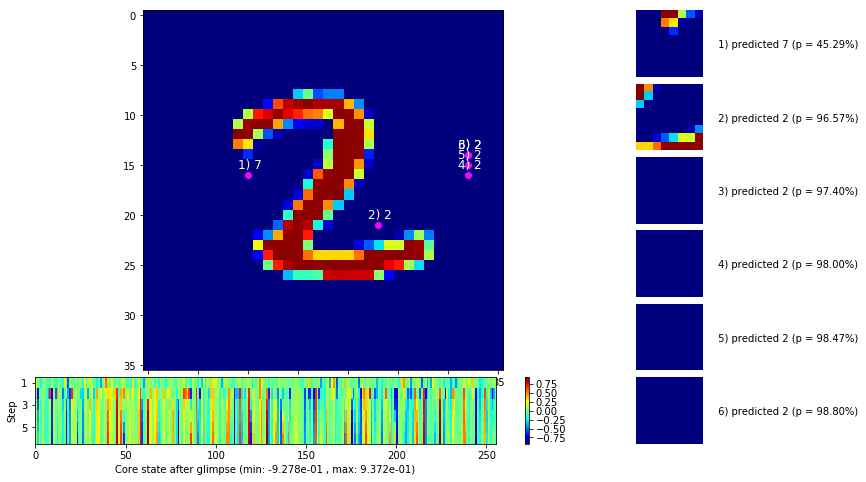


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


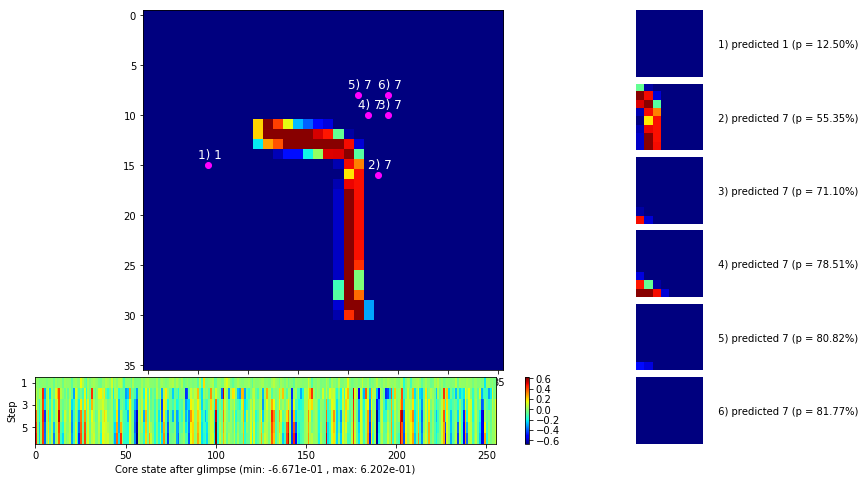

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


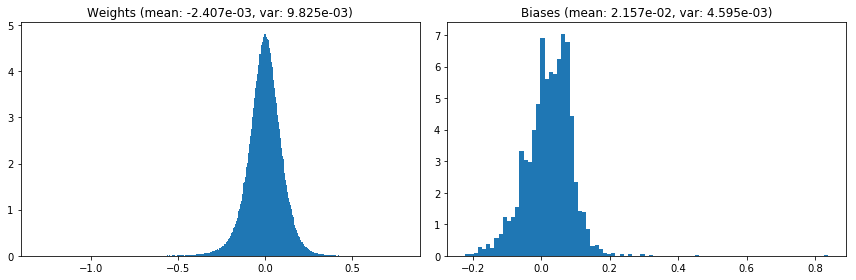

                                      Location network weights and biases


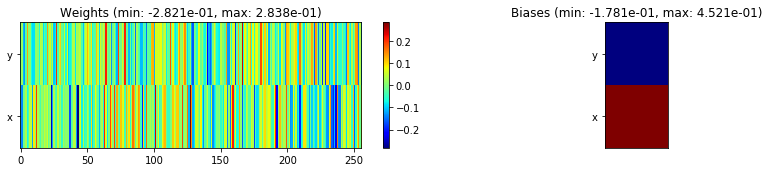

---------------------------------------------------------------------------------------------------------------
Elapsed time:  387.29 sec | TRAIN >> class loss: 0.5154 | steps:  2.537 :( | reward:  0.8219 :( | acc.: 82.188% :(
                          | VAL   >> class loss: 0.4544 | steps:  2.297 :( | reward:  0.8408 :( | acc.: 84.080% :(



			---~~~=== End of training ===~~~---

Evaluating on the TEST dataset...

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


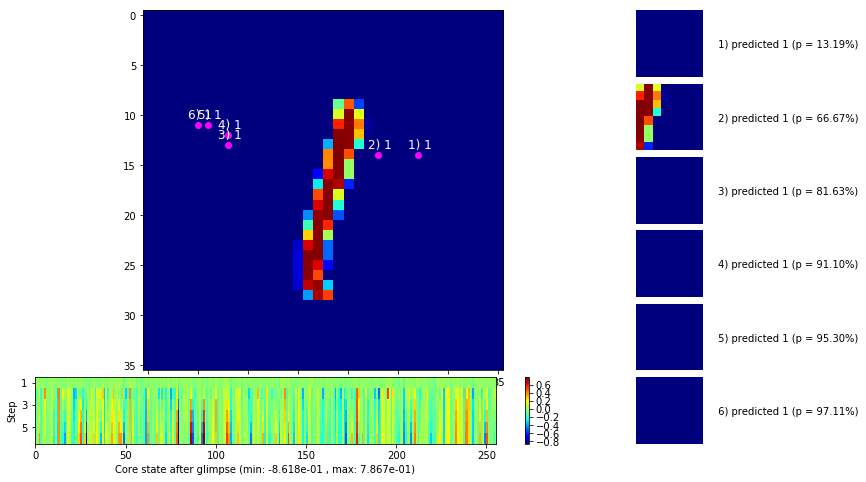


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


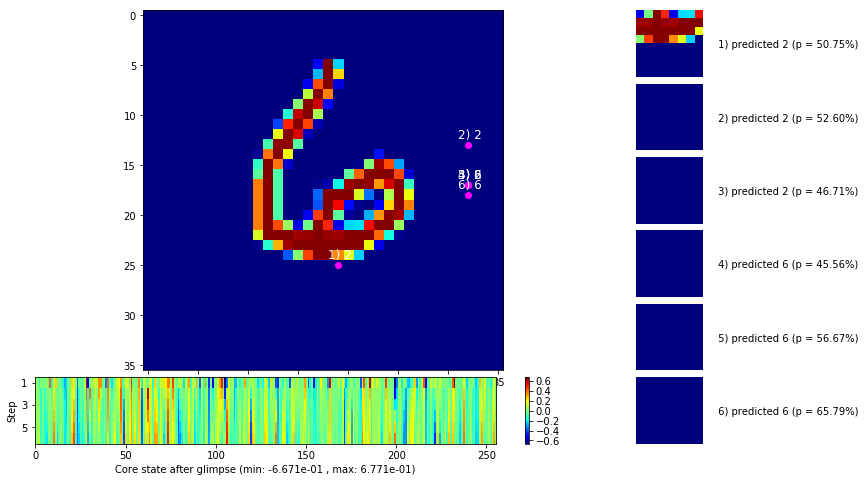

	>> class loss: 0.4540 | steps:  2.321 | reward:  0.8440 | acc.: 84.400%


In [8]:
model_info, train_info, val_info, test_info, epochs = train_eval_loop(
    model = model, epochs = num_epochs, image_size = image_size,
    train_data = train_data, val_data = val_data, test_data = test_data,
    padding = padding, optimizer = optimizer, lr_scheduler = lr_scheduler,
    class_criterion = class_criterion, error_penalty = error_penalty,
    loc_std = loc_std, random_start_loc = random_start_loc, gamma = gamma,
    grad_clip = grad_clip, steps_per_epoch = steps_per_epoch,
    max_ep_len = max_ep_len, log_freq = log_freq, viz_freq = viz_freq,
    early_stopping = early_stopping, eval_viz_freq = eval_viz_freq
)

In [9]:
print('Trained over %d epochs\n' % epochs)

for name, best_stats in zip(['train', 'val'], [train_info['bests'], val_info['bests']]):
    print('Best %s stats:' % name)
    for k, v in best_stats.items():
        print('    %s: %.2f (epoch %d)' % (k, v[k], v['epoch']))
    print('')

Trained over 63 epochs

Best train stats:
    steps: 2.49 (epoch 48)
    reward: 0.85 (epoch 21)
    accuracy: 0.85 (epoch 21)

Best val stats:
    steps: 2.26 (epoch 55)
    reward: 0.88 (epoch 31)
    accuracy: 0.88 (epoch 31)



### Training curves

In [10]:
epoch_range = range(1, epochs+1)
train_col = (1, 0, 0); train_err_col = (1, 0.1, 0.1)
val_col = (0, 0, 1); val_err_col = (0.1, 0.1, 1)

Text(0.5,1,'Weight and bias values over training time')

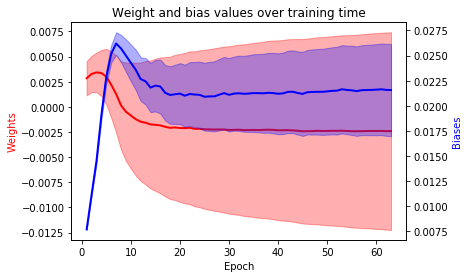

In [11]:
wts_mean = np.array(model_info['weights']['mean'])
wts_var = np.array(model_info['weights']['var'])
bias_mean = np.array(model_info['biases']['mean'])
bias_var = np.array(model_info['biases']['var'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_mean, color = train_col, linewidth = 2)
wts_ax.fill_between(epoch_range,
    wts_mean - wts_var, wts_mean + wts_var,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_mean, color = val_col, linewidth = 2)
bias_ax.fill_between(epoch_range,
    bias_mean - bias_var, bias_mean + bias_var,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Weight and bias values over training time')

Text(0.5,1,'Max absolute weight and bias values over training time')

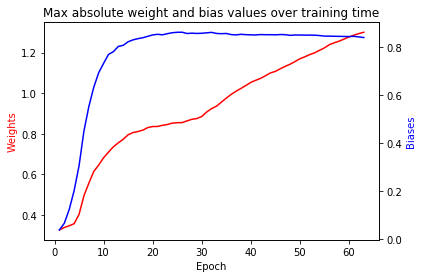

In [12]:
wts_absmax = np.array(model_info['weights']['abs max'])
bias_absmax = np.array(model_info['biases']['abs max'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_absmax, color = train_col)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_absmax, color = val_col)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Max absolute weight and bias values over training time')

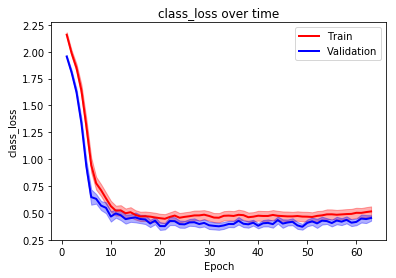

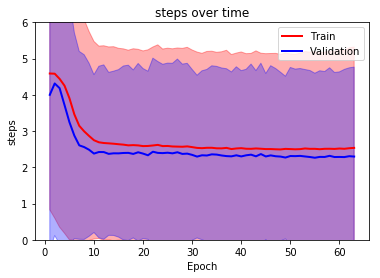

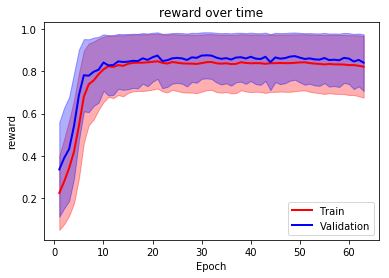

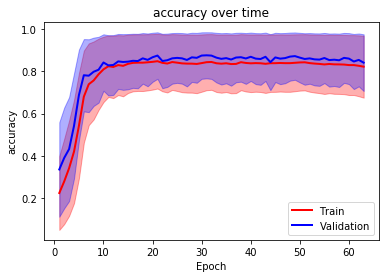

In [13]:
things_to_plot = ['class_loss', 'steps', 'reward', 'accuracy']
for thing in things_to_plot:
    train_avg = np.array([info['averages'][thing] for info in train_info['stats']])
    train_err = np.array([np.var(info['histories'][thing]) for info in train_info['stats']])
    
    val_avg = np.array([info['averages'][thing] for info in val_info['stats']])
    val_err = np.array([np.var(info['histories'][thing]) for info in val_info['stats']])
    
    plt.plot(epoch_range, train_avg, color = train_col, linewidth = 2)
    plt.plot(epoch_range, val_avg, color = val_col, linewidth = 2)
    plt.fill_between(epoch_range,
        train_avg - train_err, train_avg + train_err, alpha = 0.35,
        edgecolor = train_col, facecolor = train_err_col
    )
    plt.fill_between(epoch_range,
        val_avg - val_err, val_avg + val_err, alpha = 0.35,
        edgecolor = val_col, facecolor = val_err_col
    )
    if thing == 'steps':
        plt.ylim([0, 6])
    plt.legend(['Train', 'Validation'], loc = 'upper right' if thing in ['class_loss', 'steps'] else 'lower right')
    plt.xlabel('Epoch'); plt.ylabel(thing)
    plt.title('%s over time' % thing)
    plt.show()
    print('')

Text(0.5,1,'Gradient norms over training time')

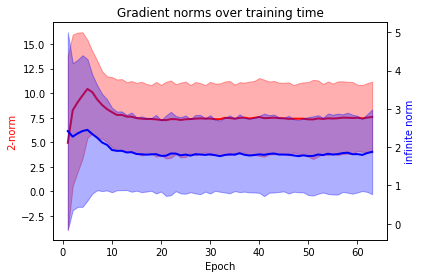

In [14]:
# Gradient stats
grad_2norm = np.array([info['averages']['grad_2norm'] for info in train_info['stats']])
grad_inf_norm = np.array([info['averages']['grad_inf_norm'] for info in train_info['stats']])
grad_2norm_err = np.array([np.var(info['histories']['grad_2norm']) for info in train_info['stats']])
grad_inf_norm_err = np.array([np.var(info['histories']['grad_inf_norm']) for info in train_info['stats']])

fig, pnorm_ax = plt.subplots()
pnorm_ax.plot(epoch_range, grad_2norm, color = train_col, linewidth = 2)
pnorm_ax.fill_between(epoch_range,
    grad_2norm - grad_2norm_err, grad_2norm + grad_2norm_err,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
pnorm_ax.set_xlabel('Epoch');
pnorm_ax.set_ylabel('2-norm', color = train_col)

infnorm_ax = pnorm_ax.twinx()
infnorm_ax.plot(epoch_range, grad_inf_norm, color = val_col, linewidth = 2)
infnorm_ax.fill_between(epoch_range,
    grad_inf_norm - grad_inf_norm_err, grad_inf_norm + grad_inf_norm_err,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
infnorm_ax.set_ylabel('infinite norm', color = val_col)

plt.title('Gradient norms over training time')